# Tennis ATP data Exploration and Modeling

## 1. [Objectives](#Objectives)
## 2. [Tennis ATP data from internet](#Scrap_data)
## 3. [Analysis of Tennis data](#EDA)
## 4. [Data preparation and feature engineering ](#Feature)
## 5. [Model building and evaluation](#Model)
## 6. [Insight and Discussion](#Insight)

<a id='Contents'></a> 


In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 100)

import os
import string
    
from itertools import product
from sklearn.preprocessing import LabelEncoder

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from xgboost import XGBRegressor
from xgboost import plot_importance

def plot_features(booster, figsize):    
    fig, ax = plt.subplots(1,1,figsize=figsize)
    return plot_importance(booster=booster, ax=ax)

import time
import sys
import gc
import pickle
sys.version_info

sys.version_info(major=3, minor=7, micro=6, releaselevel='final', serial=0)

 <a id='Objectives'></a>
 ##  1. [Objectives and Problem Definition](#Contents)

We are going to analyse the tennis competion data from https://github.com/JeffSackmann/tennis_atp. There are several goals

* To find out the statistics and understand what factors are correlated to the winning or losing of a game.
* To find out the performance change of players over his/her career, what are the game statistics of the player when competing with different opponents.
* To build a model try to predict the result of game, giving the information of the players, the match and others. 

 <a id='Scrap_data'></a>
 ##  2. [Tennis ATP data from internet](#Contents)

In [2]:
# download the data from  https://raw.githubusercontent.com/JeffSackmann/tennis_atp/master/
matrix = pd.DataFrame()

url = "https://raw.githubusercontent.com/JeffSackmann/tennis_atp/master/"

year_range = np.arange(1980,2021)

for year in year_range:
    file_url = url+'atp_matches_'+str(year)+'.csv'
    # read csv from the file_url
    df = pd.read_csv(file_url,index_col=0,parse_dates=[0])
    
    if year==year_range[0]:
        cols = df.columns

    # concatenate the dataframe
    matrix = pd.concat([matrix, df], ignore_index=True, sort=False, keys=cols)



In [3]:
matrix.head()

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
0,Hobart,Hard,32.0,A,19791231.0,1.0,100315.0,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713.0,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,5-7 6-3 6-4,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Hobart,Hard,32.0,A,19791231.0,2.0,100397.0,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473.0,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,7-6 7-5,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Hobart,Hard,32.0,A,19791231.0,3.0,107328.0,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,100265.0,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,6-2 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Hobart,Hard,32.0,A,19791231.0,4.0,100121.0,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550.0,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,6-3 5-7 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Hobart,Hard,32.0,A,19791231.0,5.0,100337.0,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726.0,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,6-3 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# see how many non-null data points for each feature
matrix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135825 entries, 0 to 135824
Data columns (total 48 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   tourney_name        135825 non-null  object 
 1   surface             135680 non-null  object 
 2   draw_size           135825 non-null  float64
 3   tourney_level       135825 non-null  object 
 4   tourney_date        135825 non-null  float64
 5   match_num           135825 non-null  float64
 6   winner_id           135825 non-null  float64
 7   winner_seed         55782 non-null   object 
 8   winner_entry        14466 non-null   object 
 9   winner_name         135825 non-null  object 
 10  winner_hand         135805 non-null  object 
 11  winner_ht           127379 non-null  float64
 12  winner_ioc          135825 non-null  object 
 13  winner_age          135318 non-null  float64
 14  loser_id            135825 non-null  float64
 15  loser_seed          29407 non-null

In [5]:
# convert the date information to pd.datetime format
matrix['tourney_date'] = pd.to_datetime(matrix.tourney_date.round(), format='%Y%m%d', errors='ignore')

In [6]:
matrix['tourney_date']

0        1979-12-31
1        1979-12-31
2        1979-12-31
3        1979-12-31
4        1979-12-31
            ...    
135820   2020-03-06
135821   2020-03-06
135822   2020-03-06
135823   2020-03-06
135824   2020-03-06
Name: tourney_date, Length: 135825, dtype: datetime64[ns]

In [7]:
# extract information of date
matrix['year'] = matrix['tourney_date'].dt.year
matrix['month'] = matrix['tourney_date'].dt.month
matrix['day'] = matrix['tourney_date'].dt.day
matrix['day_week'] = matrix['tourney_date'].dt.dayofweek
matrix.head()

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,day,day_week
0,Hobart,Hard,32.0,A,1979-12-31,1.0,100315.0,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713.0,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,5-7 6-3 6-4,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0
1,Hobart,Hard,32.0,A,1979-12-31,2.0,100397.0,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473.0,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,7-6 7-5,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0
2,Hobart,Hard,32.0,A,1979-12-31,3.0,107328.0,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,100265.0,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,6-2 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0
3,Hobart,Hard,32.0,A,1979-12-31,4.0,100121.0,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550.0,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,6-3 5-7 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0
4,Hobart,Hard,32.0,A,1979-12-31,5.0,100337.0,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726.0,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,6-3 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0


See how many counts for different number of sets in the 'score' feature

In [8]:
matrix['split']=matrix['score'].str.split(' ')
matrix['split_len']=matrix['split'].map(lambda x: len(x), na_action='ignore')

In [9]:
matrix.groupby('split_len').agg({'split_len':'count'})

,split_len
split_len,
1.0,499
2.0,69113
3.0,51387
4.0,9183
5.0,5554
6.0,67


Normally the maximal set number is 5, check what are there in the terms with split_len = 6

In [10]:
matrix[matrix.split_len == 6]['score'].unique()

array(['3-6 6-7 7-6 7-6 5-3 ABD', '6-8 6-8 1-1 Played and unfinished',
       '3-6 1-6 6-2 6-2 6-5 RET', '6-4 3-6 2-6 6-3 2-0 RET',
       '3-6 6-3 6-7 6-0 2-0 RET', '3-6 2-6 7-6 6-2 4-0 RET',
       '6-4 6-7 6-7 6-2 0-1 RET', '1-6 6-1 6-2 2-6 5-2 DEF',
       '4-6 6-8 8-6 6-1 4-3 RET', '7-5 6-4 3-6 4-6 3-2 RET',
       '4-6 1-6 6-4 6-0 4-2 RET', '9-11 1-6 6-2 6-1 3-1 RET',
       '3-6 6-3 4-6 6-2 0-1 RET', '4-6 4-6 6-3 7-5 1-0 RET',
       '6-1 5-7 3-2 Played and unfinished', '6-2 4-6 1-6 7-6(4) 4-1 RET',
       '2-6 4-6 6-3 7-6(11) 5-2 RET', '2-6 4-6 7-5 7-6(6) 3-2 RET',
       '1-6 6-4 2-6 7-5 1-0 RET', '4-6 6-3 0-6 6-2 1-0 RET',
       '6-4 3-6 6-7(6) 6-0 3-0 RET', '6-4 3-6 6-3 3-6 5-4 RET',
       '6-3 6-4 6-7(3) 2-6 3-1 RET', '6-4 4-6 2-6 6-2 2-1 RET',
       '6-7(9) 7-6(0) 4-6 6-3 6-6 RET', '6-7(5) 6-3 6-7(3) 6-4 4-1 RET',
       '2-6 7-6(5) 6-2 6-7(6) 3-0 RET', '6-4 6-2 3-6 6-7(7) 4-4 RET',
       '7-5 4-6 5-7 6-3 5-0 RET', '4-6 4-6 6-3 7-5 3-4 RET',
       '4-6 6-2 6-2 4-6 0-1

So the 6th split score is actually 'RET'.

In [12]:
# # extract information of score
# #matrix['score_split'] = 
# matrix['split']=matrix['score'].str.split(' ')
# # use na_action='ignore' to ignore the nan, otherwise it throws error
# matrix['set_1']=matrix['split'].map(lambda x: x[0].strip(), na_action='ignore')
# matrix['set_2']=matrix['split'].map(lambda x: x[1].strip() if len(x)>1 else np.nan, na_action='ignore')
# matrix['set_3']=matrix['split'].map(lambda x: x[2].strip() if len(x)>2 else np.nan, na_action='ignore')
# matrix['set_4']=matrix['split'].map(lambda x: x[3].strip() if len(x)>3 else np.nan, na_action='ignore')
# matrix['set_5']=matrix['split'].map(lambda x: x[4].strip() if len(x)>4 else np.nan, na_action='ignore')
# matrix['set_6']=matrix['split'].map(lambda x: x[5].strip() if len(x)>5 else np.nan, na_action='ignore')

Now split the scores  

In [11]:
# further split the set point to winner and loser


for i in range(1,7):
    
    matrix['split']=matrix['score'].str.split(' ')
    #column for set point
    col_set = 'set_'+str(i)  
    # use na_action='ignore' to ignore the nan, otherwise it throws error    
    matrix[col_set]=matrix['split'].map(lambda x: x[i-1].strip() if len(x)>i-1 else np.nan, na_action='ignore')    
    
    if i<=5:   # we use i<=5 because for i=6, matrix[set_6]=NaN, and it throws error when applying .str to it
        matrix['split']=matrix[col_set].str.split('-')
        # use na_action='ignore' to ignore the nan, otherwise it throws error
        matrix['winner_'+col_set]=matrix['split'].map(lambda x: x[0].strip(), na_action='ignore')
        matrix['loser_'+col_set]=matrix['split'].map(lambda x: x[1].strip() if len(x)>1 else np.nan, na_action='ignore')

In [12]:
matrix

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,day,day_week,split,split_len,set_1,winner_set_1,loser_set_1,set_2,winner_set_2,loser_set_2,set_3,winner_set_3,loser_set_3,set_4,winner_set_4,loser_set_4,set_5,winner_set_5,loser_set_5,set_6
0,Hobart,Hard,32.0,A,1979-12-31,1.0,100315.0,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713.0,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,5-7 6-3 6-4,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,"[5-7, 6-3, 6-4]",3.0,5-7,5,7,6-3,6,3,6-4,6,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Hobart,Hard,32.0,A,1979-12-31,2.0,100397.0,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473.0,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,7-6 7-5,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,"[7-6, 7-5]",2.0,7-6,7,6,7-5,7,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Hobart,Hard,32.0,A,1979-12-31,3.0,107328.0,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,100265.0,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,6-2 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,"[6-2, 6-3]",2.0,6-2,6,2,6-3,6,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Hobart,Hard,32.0,A,1979-12-31,4.0,100121.0,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550.0,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,6-3 5-7 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,"[6-3, 5-7, 6-3]",3.0,6-3,6,3,5-7,5,7,6-3,6,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Hobart,Hard,32.0,A,1979-12-31,5.0,100337.0,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726.0,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,6-3 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,"[6-3, 6-3]",2.0,6-3,6,3,6-3,6,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135820,Davis Cup WG2 PO: POL vs HKG,Hard,4.0,D,2020-03-06,2.0,105668.0,NaN,NaN,Jerzy Janowicz,R,203.0,POL,29.300479,106388.0,NaN,NaN,Pak Long Yeung,U,NaN,HKG,25.045859,6-7(5) 7-5 6-4,3.0,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,461.0,68.0,960.0,11.0,2020,3,6,4,"[6-7(5), 7-5, 6-4]",3.0,6-7(5),6,7(5),7-5,7,5,6-4,6,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
135821,Davis Cup WG2 PO: POL vs HKG,Hard,4.0,D,2020-03-06,4.0,209874.0,NaN,NaN,Maks Kasnikowski,NaN,NaN,POL,16.657084,207852.0,NaN,NaN,Wai Yu Kai,U,NaN,HKG,18.951403,1-6 6-2 10-3,3.0,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020,3,6,4,"[1-6, 6-2, 10-3]",3.0,1-6,1,6,6-2,6,2,10-3,10,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
135822,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,1.0,208518.0,NaN,NaN,Hazem Naw,R,NaN,UNK,20.167009,200250.0,NaN,NaN,Mehluli Don Ayanda Sibanda,R,NaN,ZIM,20.320329,6-3 6-3,3.0,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,813.0,18.0,2020,3,6,4,"[6-3, 6-3]",2.0,6-3,6,3,6-3,6,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
135823,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2.0,111761.0,NaN,NaN,Benjamin Lock,R,NaN,ZIM,26.995209,200181.0,NaN,NaN,Amer Naow,R,NaN,SYR,25.166324,6-3 6-3,3.0,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,430.0,7

In [15]:
print('Unique data in winner_set:')
print('')
print(matrix.winner_set_1.unique())
print(matrix.winner_set_2.unique())
print(matrix.winner_set_3.unique())
print(matrix.winner_set_4.unique())
print(matrix.winner_set_5.unique())

print('')
print('Unique data in loser_set:')
print('')
print(matrix.loser_set_1.unique())
print(matrix.loser_set_2.unique())
print(matrix.loser_set_3.unique())
print(matrix.loser_set_4.unique())
print(matrix.loser_set_5.unique())



Unique data in winner_set:

['5' '7' '6' '3' '1' '4' '2' nan '0' '12' '8' 'DEF' 'W/O' '10' '11' '14'
 '9' '' '16' 'RET' '13' '24' 'In' 'Apr' 'Walkover']
['6' '7' '5' '1' '3' '4' nan '2' '0' 'RET' '8' '13' 'ABD' '10' 'DEF' '9'
 '11' '14' 'Played' 'W/O' '12' '17' '15' '16' '30' 'Progress' 'Unfinished']
['6' nan '9' '7' '12' '8' '10' '11' '4' 'RET' '3' '1' '5' '2' '13' '14'
 'ABD' '0' '15' '64' 'and' '21' '16' '17' '19' 'Played' '22' 'DEF' '25' ''
 '[10' '[1' '[12' '[11' '[4' '[6' '[3']
[nan '6' '3' '10' '7' '8' 'DEF' 'RET' '13' '2' '15' '4' '1' '5' 'ABD' '0'
 '9' 'unfinished' 'NA' '12' 'Played' '11' 'and' '19' 'Default' 'abandoned'
 '' 'Def.']
[nan '6' '7' '9' '5' '11' '10' '8' '13' 'RET' '12' '1' 'and' '15' '2' '4'
 '14' '0' '17' 'unfinished' '3' '19' '16' 'DEF' '20' 'Default' '21'
 'abandoned' '70' '18' '' '22' '26']

Unique data in loser_set:

['7' '6' '2' '3' '4' '5' '1' nan '0' '10' '9' '8' '12' '6(2)' '11' '6(3)'
 '7(6)' '7(4)' '6(4)' '14' '6(7)' '6(5)' '16' '6(8)' '22' '6(6)' '6(1

Columns for set_6 does not have any useful information, just drop them

In [14]:
matrix.drop(['set_6'], axis=1, inplace = True)

* Data Cleansing

In [17]:
# fix the weird data points


for i in range(1,6):
    col_win_set = 'winner_'+'set_'+str(i)
    col_los_set = 'loser_'+'set_'+str(i)
    
    # first replace nonumerical features with nan 
    matrix[col_win_set] = matrix[col_win_set].map(lambda x:x if x not in
                                                  ['W/O','In','Walkover','RET','','abandoned','ABD','NA',
                                                   'DEF','Played','Progress','and','Default','Def.','unfinished','Unfinished']
                                                 else np.nan, na_action='ignore') 
    
    matrix[col_los_set] = matrix[col_los_set].map(lambda x:x if x not in
                                                  ['W/O','In','Walkover','RET','','abandoned',
                                                   'DEF','Played','Progress','and','Default','Def.','unfinished','Unfinished']
                                                 else np.nan, na_action='ignore') 
    
    # replace 'month' data with number
    matrix[col_win_set] = matrix[col_win_set].replace({'Jun': '6', 'Apr': '4','Feb':'2','00':'0'})
    matrix[col_los_set] = matrix[col_los_set].replace({'Jun': '6', 'Apr': '4','Feb':'2','00':'0'})
    
    #define a tiebreak point columns
    col_set_tb = 'set_'+str(i)+'_tb'
    
    # for winner columns, there is no tiebreak point with (), the only left over are the last game with [],
    # we can remove all the punctuation and only keep the number
    matrix[col_win_set] = matrix[col_win_set].map(lambda x: x.translate(str.maketrans('', '', string.punctuation)), na_action='ignore')
    matrix[col_win_set] = matrix[col_win_set].astype(np.float32)
    
    # for loser columns, there is a tiebreak point with (), we need to further seperate them out
    matrix['split']=matrix[col_los_set].str.split('(')
    # the first element before the '(' is the set point of loser, it could include point with ']'
    matrix[col_los_set] = matrix['split'].map(lambda x: x[0].strip(), na_action='ignore')    
    # remove the punctuation
    matrix[col_los_set] = matrix[col_los_set].map(lambda x: x.translate(str.maketrans('', '', string.punctuation)), na_action='ignore')
    matrix[col_los_set] = matrix[col_los_set].astype(np.float32)
    
    # the element after the ( is the tiebreak point, it could include ')' 
    matrix[col_set_tb] = matrix['split'].map(lambda x: x[1].strip() if len(x)>1 else np.nan, na_action='ignore')
    # remove the punctuation
    matrix[col_set_tb] = matrix[col_set_tb].map(lambda x: x.translate(str.maketrans('', '', string.punctuation)), na_action='ignore')
    matrix[col_set_tb] = matrix[col_set_tb].astype(np.float32)
    

Now check one more time

In [18]:
print('Unique data in winner_set:')
print('')
print(matrix.winner_set_1.unique())
print(matrix.winner_set_2.unique())
print(matrix.winner_set_3.unique())
print(matrix.winner_set_4.unique())
print(matrix.winner_set_5.unique())

print('')
print('Unique data in loser_set:')
print('')
print(matrix.loser_set_1.unique())
print(matrix.loser_set_2.unique())
print(matrix.loser_set_3.unique())
print(matrix.loser_set_4.unique())
print(matrix.loser_set_5.unique())

print('')
print('Unique data in tb_set:')
print('')
print(matrix.set_1_tb.unique())
print(matrix.set_2_tb.unique())
print(matrix.set_3_tb.unique())
print(matrix.set_4_tb.unique())
print(matrix.set_5_tb.unique())


Unique data in winner_set:

[ 5.  7.  6.  3.  1.  4.  2. nan  0. 12.  8. 10. 11. 14.  9. 16. 13. 24.]
[ 6.  7.  5.  1.  3.  4. nan  2.  0.  8. 13. 10.  9. 11. 14. 12. 17. 15.
 16. 30.]
[ 6. nan  9.  7. 12.  8. 10. 11.  4.  3.  1.  5.  2. 13. 14.  0. 15. 64.
 21. 16. 17. 19. 22. 25.]
[nan  6.  3. 10.  7.  8. 13.  2. 15.  4.  1.  5.  0.  9. 12. 11. 19.]
[nan  6.  7.  9.  5. 11. 10.  8. 13. 12.  1. 15.  2.  4. 14.  0. 17.  3.
 19. 16. 20. 21. 70. 18. 22. 26.]

Unique data in loser_set:

[ 7.  6.  2.  3.  4.  5.  1. nan  0. 10.  9.  8. 12. 11. 14. 16. 22.]
[ 3.  5.  7.  2.  6.  4.  1.  0. nan 15.  8. 10.  9. 12. 13. 11. 16. 14.
 30.]
[  4.  nan   3.   2.   1.   0.   7.   5.  10.   6.   8.   9.  11.  12.
  13.  19. 412.  17. 715.  14.  15. 210.  20.  23.]
[nan  4.  3.  6.  2.  8.  1.  5. 11.  0. 13.  7.  9. 10. 12. 17.]
[ nan   4.   1.   5.   3.   2.   0.   7.   9.   8.   6.  11.  10.  19.
 311.  13. 210. 412.  12.  15.  17.  14.  18.  68.  16.  20.  24.]

Unique data in tb_set:

[nan  2.  

Note that we have already change the datatype of the above columns to float32

In [19]:
matrix.head(10)

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,day,day_week,split,split_len,set_1,winner_set_1,loser_set_1,set_2,winner_set_2,loser_set_2,set_3,winner_set_3,loser_set_3,set_4,winner_set_4,loser_set_4,set_5,winner_set_5,loser_set_5,set_1_tb,set_2_tb,set_3_tb,set_4_tb,set_5_tb
0,Hobart,Hard,32.0,A,1979-12-31,1.0,100315.0,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713.0,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,5-7 6-3 6-4,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,NaN,3.0,5-7,5.0,7.0,6-3,6.0,3.0,6-4,6.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Hobart,Hard,32.0,A,1979-12-31,2.0,100397.0,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473.0,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,7-6 7-5,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,NaN,2.0,7-6,7.0,6.0,7-5,7.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Hobart,Hard,32.0,A,1979-12-31,3.0,107328.0,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,100265.0,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,6-2 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,NaN,2.0,6-2,6.0,2.0,6-3,6.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Hobart,Hard,32.0,A,1979-12-31,4.0,100121.0,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550.0,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,6-3 5-7 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,NaN,3.0,6-3,6.0,3.0,5-7,5.0,7.0,6-3,6.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Hobart,Hard,32.0,A,1979-12-31,5.0,100337.0,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726.0,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,6-3 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,NaN,2.0,6-3,6.0,3.0,6-3,6.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Hobart,Hard,32.0,A,1979-12-31,6.0,100515.0,NaN,NaN,Shlomo Glickstein,R,188.0,ISR,21.982204,100224.0,NaN,NaN,Peter Campbell,R,NaN,AUS,29.138946,6-2 6-2,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,NaN,2.0,6-2,6.0,2.0,6-2,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Hobart,Hard,32.0,A,1979-12-31,7.0,100500.0,NaN,NaN,Rohun Beven,R,NaN,GBR,22.275154,100749.0,NaN,NaN,Dave Siegler,R,NaN,USA,18.584531,6-2 1-6 6-2,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,NaN,3.0,6-2,6.0,2.0,1-6,1.0,6.0,6-2,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Hobart,Hard,32.0,A,1979-12-31,8.0,100293.0,8,NaN,John Marks,R,NaN,AUS,27.058179,100464.0,NaN,NaN,Warren Maher,R,NaN,AUS,22.956879,6-2 6-4,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,NaN,2.0,6-2,6.0,2.0,6-4,6.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Hobart,Hard,32.0,A,1979-12-31,9.0,100488.0,NaN,NaN,Chris Delaney,R,NaN,USA,22.458590,100551.0,5,NaN,Brad Drewett,L,185.0,AUS,21.451061,7-6 3-6 6-4,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,NaN,3.0,7-6,7.0,6.0,3-6,3.0,6.0,6-4,6.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Hobart,Hard,32.0,A,1979-12-31,10.0,100592.0,NaN,NaN,Robert Vant Hof,R,193.0,USA,20.725530,100334.0,NaN,NaN,Ernie Ewert,R,NaN,AUS,25.571526,3-6 6-1 6-2

In [20]:
# we can remove redundant columns
matrix.drop(['split','split_len','set_1','set_2','set_3','set_4','set_5'],axis=1,inplace=True)

Now check if there is any abnormaly in other columns

In [22]:
matrix.columns[matrix.dtypes == np.object]

Index(['tourney_name', 'surface', 'tourney_level', 'winner_seed',
       'winner_entry', 'winner_name', 'winner_hand', 'winner_ioc',
       'loser_seed', 'loser_entry', 'loser_name', 'loser_hand', 'loser_ioc',
       'score', 'round'],
      dtype='object')

In [21]:
# for columns with object type, we print the unique values 
for cols in matrix.columns:
    if matrix[cols].dtypes == np.object:
        print(cols)
        print(matrix[cols].unique())
        print('')

tourney_name
['Hobart' 'Auckland' 'Perth' ... 'Davis Cup WG2 PO: PHI vs GRE'
 'Davis Cup WG2 PO: POL vs HKG' 'Davis Cup WG2 PO: SYR vs ZIM']

surface
['Hard' 'Grass' 'Carpet' 'Clay' nan 'None']

tourney_level
['A' 'D' 'M' 'G' 'F' 'C']

winner_seed
[1.0 nan 6.0 4.0 8.0 3.0 7.0 5.0 2.0 16.0 14.0 13.0 12.0 11.0 10.0 9.0
 15.0 32.0 31.0 30.0 29.0 25.0 24.0 22.0 21.0 20.0 19.0 17.0 23.0 28.0
 26.0 18.0 27.0 33.0 35.0 '2' '4' '7' '5' '6' '8' '1' '3' 'WC' '25' '21'
 '15' '12' '23' '32' '29' '24' '16' '11' '28' '26' '22' '10' '14' 'Q' '19'
 '30' '20' '18' '27' '9' '13' '17' '31' '33']

winner_entry
[nan 'Q' 'LL' 'WC' 'PR' 'SE' 'ALT' 'Alt']

winner_name
['Hank Pfister' 'Terry Rocavert' 'Jeremy Cohen' ... 'Petros Tsitsipas'
 'Maks Kasnikowski' 'Hazem Naw']

winner_hand
['R' 'L' 'U' nan]

winner_ioc
['USA' 'AUS' 'RSA' 'ISR' 'GBR' 'NZL' 'AUT' 'FRA' 'HUN' 'ROU' 'POL' 'MEX'
 'IND' 'SUI' 'ARG' 'ESP' 'CHI' 'BEL' 'BUL' 'FIN' 'RUS' 'GER' 'SWE' 'ECU'
 'CZE' 'EGY' 'CAN' 'CRO' 'ITA' 'NED' 'IRL' 'BRA' 'PAR'

In [22]:
# fix the upper/lower case
matrix['winner_entry']= matrix['winner_entry'].str.upper()
matrix['loser_entry']=matrix['loser_entry'].str.upper()

In [23]:
# the winner/loser seed are object that mix numerics and strings. Convert the numerics to strings. use 'isinstance(x,float)' to check if the object is float
matrix['loser_seed'] = matrix['loser_seed'].map(lambda x: str(int(x)) if isinstance(x, float) else x, na_action = 'ignore')
matrix['winner_seed'] = matrix['winner_seed'].map(lambda x: str(int(x)) if isinstance(x, float) else x, na_action = 'ignore')

print(matrix['winner_seed'].unique())
print(matrix['loser_seed'].unique())

['1' nan '6' '4' '8' '3' '7' '5' '2' '16' '14' '13' '12' '11' '10' '9'
 '15' '32' '31' '30' '29' '25' '24' '22' '21' '20' '19' '17' '23' '28'
 '26' '18' '27' '33' '35' 'WC' 'Q']
[nan '5' '1' '4' '3' '6' '8' '7' '2' '15' '16' '14' '11' '9' '13' '12'
 '10' '28' '27' '26' '23' '30' '29' '25' '22' '24' '31' '32' '20' '21'
 '19' '17' '18' '34' '33' '35' 'Q' 'WC' 'LL']


 <a id='EDA'></a>
 ##  3. [Analysis of Tennis data](#Contents)

Some basic statistics:

In [24]:
matrix.describe(include='all')

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,day,day_week,winner_set_1,loser_set_1,winner_set_2,loser_set_2,winner_set_3,loser_set_3,winner_set_4,loser_set_4,winner_set_5,loser_set_5,set_1_tb,set_2_tb,set_3_tb,set_4_tb,set_5_tb
count,135825,135680,135825.000000,135825,135825,135825.000000,135825.000000,55782,14466,135825,135805,127379.000000,135825,135318.000000,135825.000000,29407,24395,135825,135769,121664.000000,135825,134546.000000,135803,135825.000000,135825,83466.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,86096.000000,128699.000000,97271.000000,126080.000000,95961.000000,135825.000000,135825.000000,135825.000000,135825.000000,135242.000000,135242.000000,134391.000000,134391.000000,64732.000000,64732.000000,14179.000000,14179.000000,5446.000000,5446.000000,16747.000000,14725.000000,7032.000000,1649.000000,139.000000
unique,3093,5,NaN,6,1969,NaN,NaN,36,6,2989,3,NaN,123,NaN,NaN,38,7,4479,3,NaN,134,NaN,17875,NaN,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,US Open,Hard,NaN,A,1987-07-13 00:00:00,NaN,NaN,1,Q,Roger Federer,R,NaN,USA,NaN,NaN,8,Q,Feliciano Lopez,R,NaN,USA,NaN,6-4 6-4,NaN,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,5081,60668,NaN,84217,164,NaN,NaN,8002,8943,1250,115175,NaN,24527,NaN,NaN,2780,14703,451,114114,NaN,22207,NaN,4242,NaN,45090,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,NaN,NaN,NaN,NaN,1979-12-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,2020-03-06 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,52.378855,NaN,NaN,54.593506,103089.361458,NaN,NaN,NaN,NaN,184.755533,NaN,25.394753,103305.940953,NaN,NaN,NaN,NaN,184.361586,NaN,25.494971,NaN,3.429008,NaN,102.633503,6.489918,2.744483,77.969488,47.390901,35.731950,16.779885,12.369088,3.526099,5.167650,4.804706,3.501463,80.792185,47.807831,31.753322,15.013555,12.172784,4.808504,8.744611,82.997537,1354.906714,121.974889,848.779963,1998.586173,5.842945,15.723107,0.664428,5.773118,3.961462,5.766926,3.774479,6.011401,3.574600,5.757388,3.817124,6.553617,3.976680,4.319580,4.298065,4.316268,4.332323,4.223022
std,NaN,NaN,36.934308,NaN,NaN,90.168741,5656.293929,NaN,NaN,NaN,NaN,6.657134,NaN,3.777501,6490.647223,NaN,NaN,NaN,NaN,6.642053,NaN,3.892945,NaN,0.820959,NaN,38.925514,5.317950,2.370120,29.523492,19.187891,13.837285,7.010576,4.106982,3.080976,4.056575,4.647093,2.620584,29.467312,19.368445,14.442826,7.238352,4.118402,3.271571,4.124091,130.395456,1689.322562,170.666539,950.957375,11.476313,3.008195,8.528199,1.621066,1.254566,1.880526,1.257118,1.908159,1.050704,3.797293,1.315692,1.924541,1.811305,10.198502,2.056186,2.09761

In [25]:
len_col = len(matrix.columns)
print(len_col)


67


In [26]:
matrix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135825 entries, 0 to 135824
Data columns (total 67 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   tourney_name        135825 non-null  object        
 1   surface             135680 non-null  object        
 2   draw_size           135825 non-null  float64       
 3   tourney_level       135825 non-null  object        
 4   tourney_date        135825 non-null  datetime64[ns]
 5   match_num           135825 non-null  float64       
 6   winner_id           135825 non-null  float64       
 7   winner_seed         55782 non-null   object        
 8   winner_entry        14466 non-null   object        
 9   winner_name         135825 non-null  object        
 10  winner_hand         135805 non-null  object        
 11  winner_ht           127379 non-null  float64       
 12  winner_ioc          135825 non-null  object        
 13  winner_age          135318 no

* #### Match information statistics

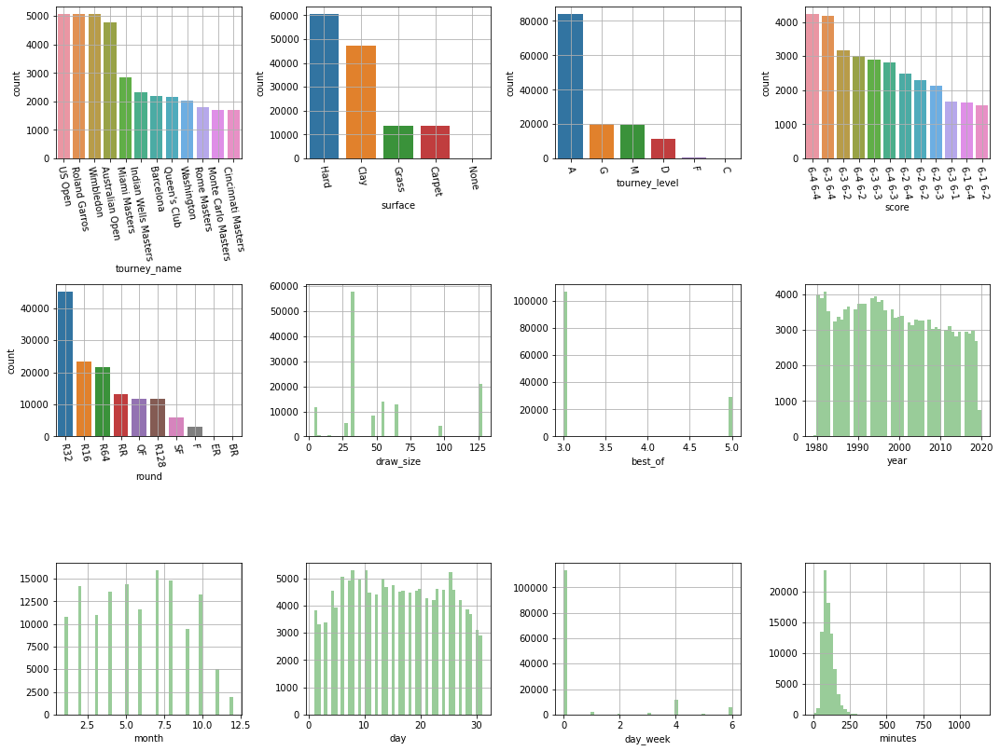

In [27]:
# 

col_match = ['tourney_name','surface','tourney_level','score','round','draw_size','best_of','year','month','day','day_week','minutes']


plt.figure(figsize=(15,15))
i=1
 
for col in col_match:
    
    if matrix[col].dtypes in (np.float64,np.int64):
        
        
        # if the column is numeric features, plot the distribution
        plt.subplot(4,4,i)
        sns.distplot(matrix[col],kde=False,hist=True,color='green',hist_kws={'align':'mid'},bins=500)
        plt.grid()
        
    elif (matrix[col].dtypes == np.object):
        
        # if the column is categorical features, plot the number of the top 10 category
        group=matrix.groupby(col).agg({col:'count'})
        group.rename(columns = {col:'count'},inplace=True)
        group = group.sort_values(by='count',ascending = False)
        group = group.reset_index()
        
        plt.subplot(4,4,i)
        sns.barplot(x=col,y='count',data = group[0:12])
        plt.xticks(rotation = -80)
        plt.grid()
 
        
    i+=1

    
plt.tight_layout()    
        

Something weird in the 'minutes', there seems to have outliers

[Text(0.5, 0, '')]

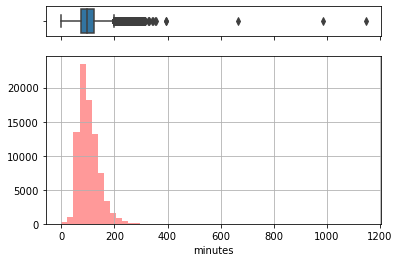

In [28]:
plt.figure

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(matrix["minutes"], ax=ax_box)

sns.distplot(matrix["minutes"], ax=ax_hist,kde=False,color='red')
plt.grid()
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')


Matches that last for more than 400 minuts

In [29]:
matrix[matrix.minutes>400]

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,day,day_week,winner_set_1,loser_set_1,winner_set_2,loser_set_2,winner_set_3,loser_set_3,winner_set_4,loser_set_4,winner_set_5,loser_set_5,set_1_tb,set_2_tb,set_3_tb,set_4_tb,set_5_tb
107468,Wimbledon,Grass,128.0,G,2010-06-21,60.0,104545.0,23,NaN,John Isner,R,206.0,USA,25.152635,103917.0,NaN,Q,Nicolas Mahut,R,190.0,FRA,28.413415,6-4 3-6 6-7(7) 7-6(3) 70-68,5.0,R128,665.0,113.0,10.0,491.0,361.0,292.0,82.0,90.0,2.0,3.0,103.0,21.0,489.0,328.0,284.0,101.0,91.0,12.0,14.0,19.0,1925.0,148.0,339.0,2010,6,21,0,6.0,4.0,3.0,6.0,6.0,7.0,7.0,6.0,70.0,68.0,NaN,NaN,7.0,3.0,NaN
123713,Sydney,Hard,32.0,A,2016-01-11,294.0,104180.0,NaN,NaN,Gilles Muller,L,193.0,LUX,32.676249,104871.0,6,NaN,Jeremy Chardy,R,188.0,FRA,28.911704,7-6(5) 6-3,3.0,QF,1146.0,14.0,5.0,59.0,35.0,32.0,13.0,10.0,0.0,0.0,2.0,5.0,69.0,44.0,34.0,10.0,11.0,1.0,3.0,38.0,1105.0,31.0,1255.0,2016,1,11,0,7.0,6.0,6.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN
127779,Munich,Clay,32.0,A,2017-05-01,297.0,111202.0,NaN,NaN,Hyeon Chung,R,NaN,KOR,20.950034,105373.0,NaN,NaN,Martin Klizan,L,190.0,SVK,27.805613,6-4 3-6 6-2,3.0,QF,987.0,4.0,2.0,81.0,47.0,36.0,15.0,13.0,4.0,6.0,8.0,4.0,95.0,49.0,28.0,27.0,14.0,8.0,12.0,78.0,659.0,53.0,880.0,2017,5,1,0,6.0,4.0,3.0,6.0,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


* #### Winners vs Losers

In [30]:
# change id to string type
matrix['winner_id'] = matrix['winner_id'].map(lambda x:str(int(x)))
matrix['loser_id'] = matrix['loser_id'].map(lambda x:str(int(x)))
#matrix.drop('loser_seed0',axis=1,inplace=True)

In [31]:
matrix.dtypes

tourney_name                  object
surface                       object
draw_size                    float64
tourney_level                 object
tourney_date          datetime64[ns]
match_num                    float64
winner_id                     object
winner_seed                   object
winner_entry                  object
winner_name                   object
winner_hand                   object
winner_ht                    float64
winner_ioc                    object
winner_age                   float64
loser_id                      object
loser_seed                    object
loser_entry                   object
loser_name                    object
loser_hand                    object
loser_ht                     float64
loser_ioc                     object
loser_age                    float64
score                         object
best_of                      float64
round                         object
minutes                      float64
w_ace                        float64
w

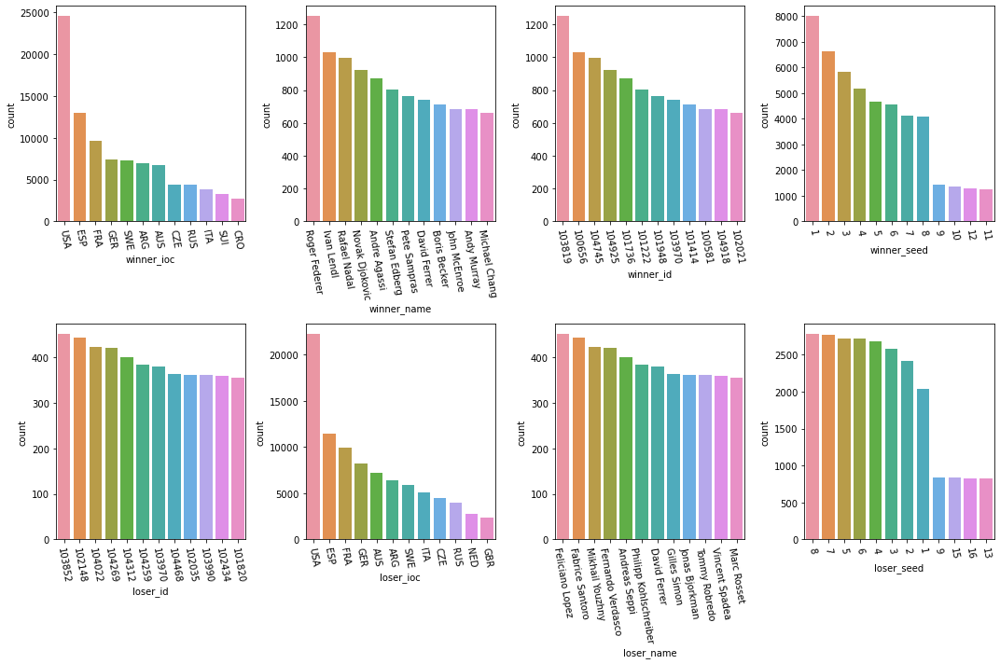

In [33]:
# player personal information

col_player_ps_1 = ['winner_ioc','winner_name','winner_id','winner_seed',
                 'loser_id','loser_ioc','loser_name','loser_seed',]


plt.figure(figsize=(15,10))
i=1
 
for col in col_player_ps_1:
    
    
    if matrix[col].dtypes in (np.float64,np.int64,np.float32):
        
        # if the column is numeric features, plot the distribution
        plt.subplot(2,4,i)
        sns.distplot(matrix[col],kde=False,color='red')
            
        
    elif (matrix[col].dtypes == np.object):
        
        # if the column is categorical features, plot the number of the top 10 category
        group=matrix.groupby(col).agg({col:'count'})
        group.rename(columns = {col:'count'},inplace=True)
        group = group.sort_values(by='count',ascending = False)
        group = group.reset_index()

        plt.subplot(2,4,i)
        sns.barplot(x=col,y='count',data = group[0:12],order=group.loc[0:11,col])
        plt.xticks(rotation = -80)           
        
    i+=1

    
plt.tight_layout()  

The name and id are one to one linked.   

Interestingly, the number of times a winner_seed winned a game pretty much follows the seed order from 1,2,3, ... to 12, and the number of wins have an abrupt drop from the 8th place. While the loser_seed pretty much follows an inverse order: from 8,7,... to 1, and an abrupt change also occurs at the 8th place. Basically, players with seed 1 to seed 8 dominate the top 8 number of winning or losing a game. It makes sense since the number of seed players is determine by the draw size (number of participants). For the most common one with a draw size of 32 (as shown above), there will be 8 seed players, and for draw size of 64, there will be 16 seed players.  

<Figure size 1080x504 with 0 Axes>

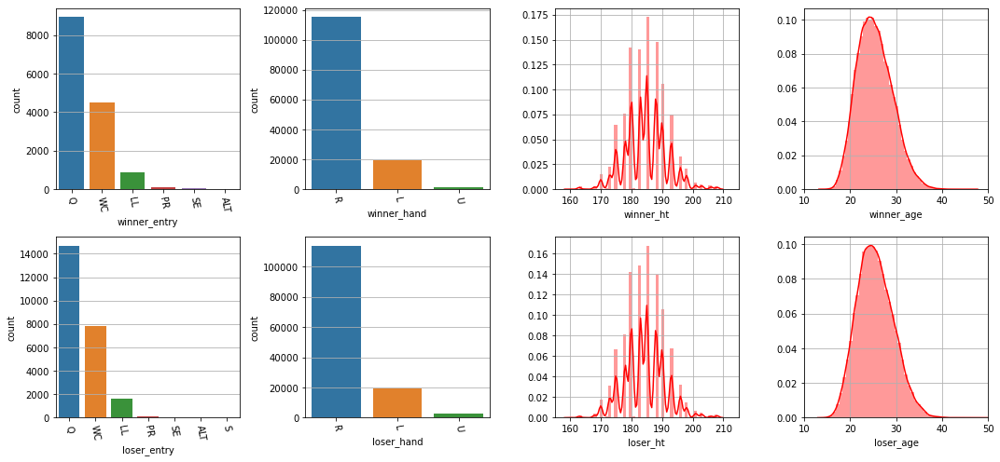

In [34]:
col_player_ps_2 = ['winner_entry','winner_hand','winner_ht','winner_age',
                 'loser_entry','loser_hand','loser_ht','loser_age']

plt.figure(figsize=(15,7))
fig,axes = plt.subplots(2,4, sharex='col',figsize=(15,7))

i=1
 
for col in col_player_ps_2:
    
    if matrix[col].dtypes in (np.float64,np.int64,np.float32):
        
        # if the column is numeric features, plot the distribution
         
        plt.subplot(2,4,i)
        plt.grid()
        axes[(i//5),i%4-1].grid()#.plot([0],[0])
        sns.distplot(matrix[col],kde=True,color='red')
        
        if i in [3,7]:
            plt.xlim(155, 215)
            
        if i in [4,8]:
            plt.xlim(10,50)
        
    elif (matrix[col].dtypes == np.object):
        
        # if the column is categorical features, plot the number of the top 10 category
        group=matrix.groupby(col).agg({col:'count'})
        group.rename(columns = {col:'count'},inplace=True)
        group = group.sort_values(by='count',ascending = False)
        group = group.reset_index()

        
        #plt.subplot(2,4,i)
        plt.subplot(2,4,i)
        plt.grid()
        axes[(i//5),i%4-1].grid()#.plot([0],[0])
        sns.barplot(x=col,y='count',data = group[0:12],order=group.loc[0:11,col])
        plt.xticks(rotation = -80)
        
        
    i+=1

plt.tight_layout() 


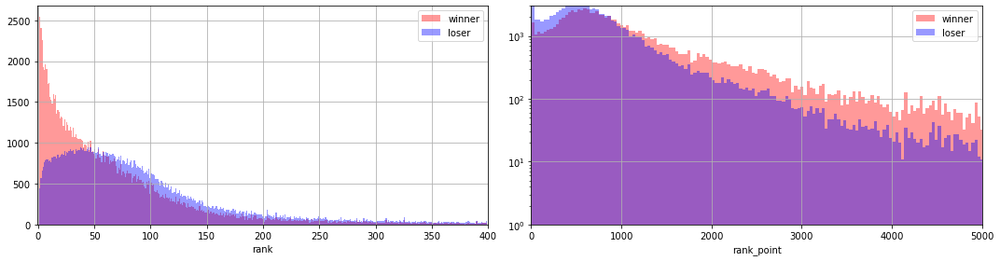

In [35]:
col_player_ps_3 = ['winner_rank','winner_rank_points','loser_rank','loser_rank_points']

plt.figure(figsize=(15,4))
#fig,axes = plt.subplots(2,4, sharex='col',figsize=(15,7))

plt.subplot(1,2,1)
plt.grid()
sns.distplot(matrix[col_player_ps_3[0]],kde=False,color='red',bins=range(1,400))
sns.distplot(matrix[col_player_ps_3[2]],kde=False,color='blue',bins=range(1,400))
plt.xlabel('rank')
plt.xlim(-1,400)
plt.legend(['winner','loser'])


plt.subplot(1,2,2)
plt.grid()
sns.distplot(matrix[col_player_ps_3[1]],kde=False,color='red',bins=500)
sns.distplot(matrix[col_player_ps_3[3]],kde=False,color='blue',bins=500)
plt.xlabel('rank_point')
plt.xlim(-1,5000)
plt.legend(['winner','loser'])
plt.yscale('log')
plt.ylim(1.0E0,3.0E3)
    
plt.tight_layout() 

Apparently, winner players with higher rank and rank point in general have won more than lost.

Next we analyze the performance difference for winner and loser players. We create new features of breakpoint converted, breakpoint saved ratio, and breakpoint converted ratio

In [36]:
# create a new feature that count the ratio of break point saved / break point faced: breakpoint saved ratio (bpsr)
# and breakpoint converted: w_bpc = l_bpFaced - l_bpSaved

# break point saved
matrix['w_bpsr'] = matrix['w_bpSaved']/matrix['w_bpFaced']
matrix['l_bpsr'] = matrix['l_bpSaved']/matrix['l_bpFaced']

# break point converted
matrix['w_bpc'] = matrix['l_bpFaced'] - matrix['l_bpSaved']
matrix['l_bpc'] = matrix['w_bpFaced'] - matrix['w_bpSaved']

# break point converted ratio
matrix['w_bpcr'] = matrix['w_bpc']/ matrix['l_bpFaced']
matrix['l_bpcr'] = matrix['l_bpc']/ matrix['w_bpFaced']

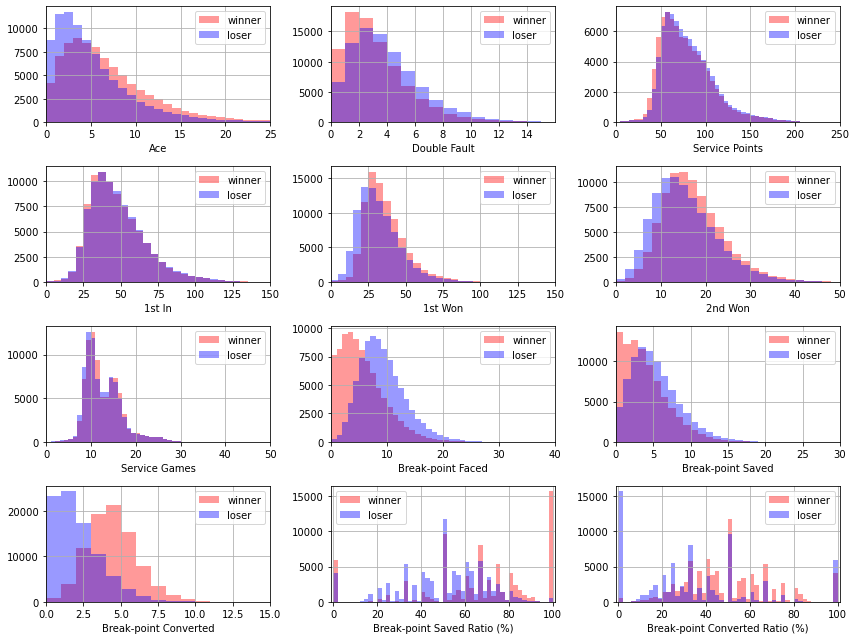

In [37]:
# player performance information
col_player_pf1 = ['w_ace','w_df','w_svpt', 'w_1stIn','w_1stWon','w_2ndWon','w_SvGms','w_bpFaced','w_bpSaved','w_bpc','w_bpsr','w_bpcr',
                  'l_ace','l_df','l_svpt', 'l_1stIn','l_1stWon','l_2ndWon','l_SvGms','l_bpFaced','l_bpSaved','l_bpc','l_bpsr','l_bpcr'
             ]

plt.figure(figsize=(12,9))
#fig,axes = plt.subplots(2,4, sharex='col',figsize=(15,7))

plt.subplot(4,3,1)
plt.grid()
sns.distplot(matrix[col_player_pf1[0]],kde=False,color='red',bins=range(0,31,1))
sns.distplot(matrix[col_player_pf1[12]],kde=False,color='blue',bins=range(0,31,1))
plt.xlabel('Ace')
plt.xlim(0,25)
plt.legend(['winner','loser'])

plt.subplot(4,3,2)
plt.grid()
sns.distplot(matrix[col_player_pf1[1]],kde=False,color='red',bins=range(0,21,1))
sns.distplot(matrix[col_player_pf1[13]],kde=False,color='blue',bins=range(0,21,1))
plt.xlabel('Double Fault')
plt.xlim(0,16)
plt.legend(['winner','loser'])
plt.xticks([0,2,4,6,8,10,12,14])

plt.subplot(4,3,3)
plt.grid()
sns.distplot(matrix[col_player_pf1[2]],kde=False,color='red',bins=range(0,301,5))
sns.distplot(matrix[col_player_pf1[14]],kde=False,color='blue',bins=range(0,301,5))
plt.xlabel('Service Points')
plt.xlim(0,250)
plt.legend(['winner','loser'])

plt.subplot(4,3,4)
plt.grid()
sns.distplot(matrix[col_player_pf1[3]],kde=False,color='red',bins=range(0,201,5))
sns.distplot(matrix[col_player_pf1[15]],kde=False,color='blue',bins=range(0,201,5))
plt.xlabel('1st In')
plt.xlim(0,150)
plt.legend(['winner','loser'])

plt.subplot(4,3,5)
plt.grid()
sns.distplot(matrix[col_player_pf1[4]],kde=False,color='red',bins=range(0,201,5))
sns.distplot(matrix[col_player_pf1[16]],kde=False,color='blue',bins=range(0,201,5))
plt.xlabel('1st Won')
plt.xlim(0,150)
plt.legend(['winner','loser'])

plt.subplot(4,3,6)
plt.grid()
sns.distplot(matrix[col_player_pf1[5]],kde=False,color='red',bins=range(0,81,2))
sns.distplot(matrix[col_player_pf1[17]],kde=False,color='blue',bins=range(0,81,2))
plt.xlabel('2nd Won')
plt.xlim(0,50)
plt.legend(['winner','loser'])

plt.subplot(4,3,7)
plt.grid()
sns.distplot(matrix[col_player_pf1[6]],kde=False,color='red',bins=range(0,81,1))
sns.distplot(matrix[col_player_pf1[18]],kde=False,color='blue',bins=range(0,81,1))
plt.xlabel('Service Games')
plt.xlim(0,50)
plt.legend(['winner','loser'])

plt.subplot(4,3,8)
plt.grid()
sns.distplot(matrix[col_player_pf1[7]],kde=False,color='red',bins=range(0,51,1))
sns.distplot(matrix[col_player_pf1[19]],kde=False,color='blue',bins=range(0,51,1))
plt.xlabel('Break-point Faced')
plt.xlim(0,40)
plt.legend(['winner','loser'])

plt.subplot(4,3,9)
plt.grid()
sns.distplot(matrix[col_player_pf1[8]],kde=False,color='red',bins=range(0,51,1))
sns.distplot(matrix[col_player_pf1[20]],kde=False,color='blue',bins=range(0,51,1))
plt.xlabel('Break-point Saved')
plt.xlim(0,30)
plt.legend(['winner','loser'])

plt.subplot(4,3,10)
plt.grid()
sns.distplot(matrix[col_player_pf1[9]],kde=False,color='red',bins=range(0,21,1))
sns.distplot(matrix[col_player_pf1[21]],kde=False,color='blue',bins=range(0,21,1))
plt.xlabel('Break-point Converted')
plt.xlim(0,15)
plt.legend(['winner','loser'])

plt.subplot(4,3,11)
plt.grid()
sns.distplot(matrix[col_player_pf1[10]]*100,kde=False,color='red',bins=range(0,101,2))
sns.distplot(matrix[col_player_pf1[22]]*100,kde=False,color='blue',bins=range(0,101,2))
plt.xlabel('Break-point Saved Ratio (%)')
plt.xlim(-1,101)
plt.legend(['winner','loser'])

plt.subplot(4,3,12)
plt.grid()
sns.distplot(matrix[col_player_pf1[11]]*100,kde=False,color='red',bins=range(0,101,2))
sns.distplot(matrix[col_player_pf1[23]]*100,kde=False,color='blue',bins=range(0,101,2))
plt.xlabel('Break-point Converted Ratio (%)')
plt.xlim(-1,101)
plt.legend(['winner','loser'])
     
plt.tight_layout() 

* Winner players tend to have higher number of ace, 1st won, 2 won and lower number of double fault, break-point saved and break-point faced.

In [38]:
print('winner_SvGms.sum():',matrix.w_SvGms.sum())
print('loser_SvGms.sum():',matrix.l_SvGms.sum())
print('')
print('winner_bpSaved.sum():',matrix.w_bpSaved.sum())
print('loser_bpSaved.sum():',matrix.l_bpSaved.sum())
print('')
print('winner_bpFaced.sum():',matrix.w_bpFaced.sum())
print('loser_bpFaced.sum():',matrix.l_bpFaced.sum())

winner_SvGms.sum(): 1064929.0
loser_SvGms.sum(): 1048028.0

winner_bpSaved.sum(): 303583.0
loser_bpSaved.sum(): 413993.0

winner_bpFaced.sum(): 444914.0
loser_bpFaced.sum(): 752876.0


In [39]:
for i in range(1,6):
    
    matrix['diff_set_'+str(i)] = matrix['winner_set_'+str(i)] - matrix['loser_set_'+str(i)]

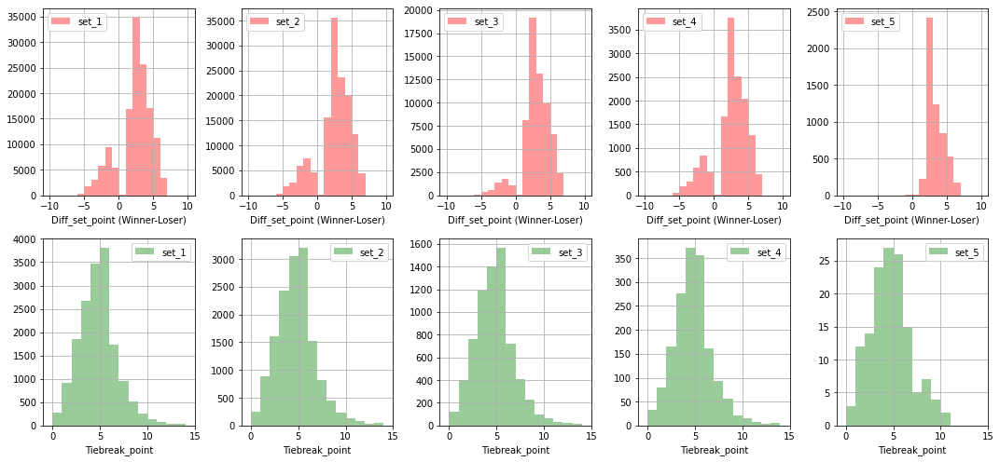

In [40]:
# player performance point

col_player_pf2 = ['diff_set_1','diff_set_2','diff_set_3','diff_set_4','diff_set_5',
                 'set_1_tb','set_2_tb','set_3_tb','set_4_tb','set_5_tb']

plt.figure(figsize=(15,7))

for i in range(0,5):
    
    plt.subplot(2,5,i+1)
    plt.grid()
    sns.distplot(matrix[col_player_pf2[i]],kde=False,color='red',bins=range(-10,10,1))
    plt.xlabel('Diff_set_point (Winner-Loser)')
    plt.xlim(-11,11)
    plt.legend(['set_'+str(i+1)])
    
    plt.subplot(2,5,i+6)
    plt.grid()
    sns.distplot(matrix[col_player_pf2[i+5]],kde=False,color='green',bins=range(0,15,1))
    plt.xlabel('Tiebreak_point')
    plt.legend(['set_'+str(i+1)])
    plt.xlim(-1,15)
    
     
plt.tight_layout() 

* Correlation Analysis

In [41]:
# we convert the seed information to numeric. If the seed information is digit, use the number; if it is others, use the draw size
matrix['winner_seed_code'] = matrix['winner_seed'].map(lambda x: float(x) if x.isdigit() else 0, na_action = 'ignore')
matrix['loser_seed_code'] = matrix['loser_seed'].map(lambda x: float(x) if x.isdigit() else 0, na_action = 'ignore')

matrix['winner_seed_code'] = matrix['winner_seed_code']+matrix['draw_size']*(matrix['winner_seed_code']==0)  
matrix['loser_seed_code'] = matrix['loser_seed_code']+matrix['draw_size']*(matrix['loser_seed_code']==0) 

In [42]:
matrix['winner_hand_code']=matrix['winner_hand'].map(lambda x: 1 if x=='R' else (-1 if x=='L' else 0), na_action = 'ignore')
matrix['loser_hand_code']=matrix['loser_hand'].map(lambda x: 1 if x=='R' else (-1 if x=='L' else 0), na_action = 'ignore')

In [43]:
matrix.head()

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,day,day_week,winner_set_1,loser_set_1,winner_set_2,loser_set_2,winner_set_3,loser_set_3,winner_set_4,loser_set_4,winner_set_5,loser_set_5,set_1_tb,set_2_tb,set_3_tb,set_4_tb,set_5_tb,w_bpsr,l_bpsr,w_bpc,l_bpc,w_bpcr,l_bpcr,diff_set_1,diff_set_2,diff_set_3,diff_set_4,diff_set_5,winner_seed_code,loser_seed_code,winner_hand_code,loser_hand_code
0,Hobart,Hard,32.0,A,1979-12-31,1.0,100315,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,5-7 6-3 6-4,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,5.0,7.0,6.0,3.0,6.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.0,3.0,2.0,NaN,NaN,1.0,NaN,1.0,1.0
1,Hobart,Hard,32.0,A,1979-12-31,2.0,100397,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,7-6 7-5,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,7.0,6.0,7.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,2.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0
2,Hobart,Hard,32.0,A,1979-12-31,3.0,107328,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,100265,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,6-2 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,6.0,2.0,6.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,3.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0
3,Hobart,Hard,32.0,A,1979-12-31,4.0,100121,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,6-3 5-7 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,6.0,3.0,5.0,7.0,6.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,-2.0,3.0,NaN,NaN,6.0,NaN,1.0,1.0
4,Hobart,Hard,32.0,A,1979-12-31,5.0,100337,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,6-3 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,31,0,6.0,3.0,6.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0,NaN,NaN,NaN,4.0,NaN,1.0,1.0


In [44]:
matrix.columns

Index(['tourney_name', 'surface', 'draw_size', 'tourney_level', 'tourney_date',
       'match_num', 'winner_id', 'winner_seed', 'winner_entry', 'winner_name',
       'winner_hand', 'winner_ht', 'winner_ioc', 'winner_age', 'loser_id',
       'loser_seed', 'loser_entry', 'loser_name', 'loser_hand', 'loser_ht',
       'loser_ioc', 'loser_age', 'score', 'best_of', 'round', 'minutes',
       'w_ace', 'w_df', 'w_svpt', 'w_1stIn', 'w_1stWon', 'w_2ndWon', 'w_SvGms',
       'w_bpSaved', 'w_bpFaced', 'l_ace', 'l_df', 'l_svpt', 'l_1stIn',
       'l_1stWon', 'l_2ndWon', 'l_SvGms', 'l_bpSaved', 'l_bpFaced',
       'winner_rank', 'winner_rank_points', 'loser_rank', 'loser_rank_points',
       'year', 'month', 'day', 'day_week', 'winner_set_1', 'loser_set_1',
       'winner_set_2', 'loser_set_2', 'winner_set_3', 'loser_set_3',
       'winner_set_4', 'loser_set_4', 'winner_set_5', 'loser_set_5',
       'set_1_tb', 'set_2_tb', 'set_3_tb', 'set_4_tb', 'set_5_tb', 'w_bpsr',
       'l_bpsr', 'w_bpc', 'l_b

In [45]:
# choose the columns we want to do a correlation analysis, we will put the same performance statisics side by side
col_corr = ['year', 'month', 'day', 'day_week', 'best_of', 'minutes',            
       'diff_set_1', 'diff_set_2', 'diff_set_3', 'diff_set_4', 'diff_set_5',
            'set_1_tb', 'set_2_tb', 'set_3_tb', 'set_4_tb', 'set_5_tb',
            
            'winner_rank', 'loser_rank',
            'winner_rank_points', 'loser_rank_points',
            'winner_ht', 'loser_ht',
            'winner_age','loser_age', 
            'winner_hand_code','loser_hand_code',
            'winner_seed_code','loser_seed_code',
            
            'w_svpt', 'l_svpt',
             'w_ace', 'l_ace', 
            'w_df', 'l_df',              
            'w_1stIn', 'l_1stIn',
            'w_1stWon','l_1stWon', 
            'w_2ndWon', 'l_2ndWon', 
            'w_SvGms','l_SvGms',
            'w_bpFaced', 'l_bpFaced',
            'w_bpSaved', 'l_bpSaved',            
            'w_bpc','l_bpc',
            'w_bpsr','l_bpsr',
            'w_bpcr','l_bpcr',
       ]

In [46]:
matrix_corr = matrix[col_corr].corr(method='pearson') 

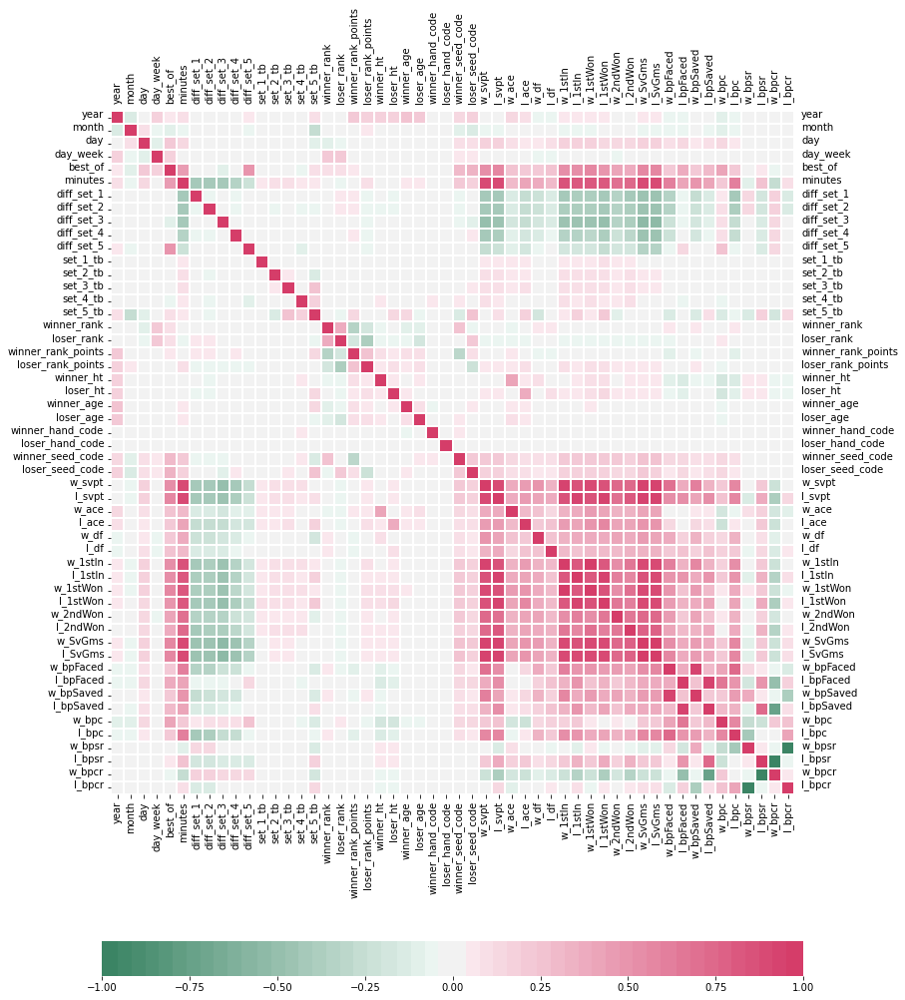

In [47]:

plt.figure(figsize=(18,18))

# since the correlation matrix  is symmetric,we can create a mask matrix to cover the upper triangular part if want
mask_ut=np.triu(np.ones(matrix_corr.shape)).astype(np.bool)

ax = sns.heatmap(matrix_corr,
            vmin=-1, vmax=1, center=0,
            cmap=sns.diverging_palette(150,0, n=50),
            square=True,
            cbar_kws={'orientation':'horizontal','shrink':0.7},     
            linewidths = 1,
            linecolor = 'white',
           # mask=mask_ut,
        )


#ax.xaxis.set_ticks_position('both')
#ax.xaxis.tick_top()
ax.tick_params(labeltop=True, labelright=True)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='center'
    
);

ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation=0,
   # horizontalalignment='right',
    verticalalignment='baseline',
    
    
);


Several interesting yet make sense observations:
* The longer the match, the smaller the set point difference, and the larger the performance statistics. (ace,bf,svpt,1stin,1stwon,2ndwon,svGms).

* 'Day' somehow havs a weak positive correlation with the match time and the performance statistics. So it looks like matches started at the later day of the month, players tend to play longer and have higher performance statistics.

* The set point difference have negative correlation with performance statistics. The larger the performance statistics generally indicate that the match is longer and fierce, which leads to smaller difference in the set points.

* The set point difference have a positive/negative correlation with the winner/loser's breakpoints converted.

* The tiebreak point of loser at set_5 have a positive correlation with the tiebreak point at set_3 and set_4. Also, it has positive correlation with the height of the loser and the age of the winner. That means if the loser player is tall and the winner player is older, the final battle is tough.

* There is no clear correlation in the set point difference in between sets.

* Ranking does not have a clear correlation with the performance statistics.  

* Player height have a positive correlation with the ace, taller players have higher successful rate in ace


#### * A more indepth analysis of the performance 

The above overall analysis shows that some features are correlated to the match points. We further analyze how these performance statistic change for different players over time. Does the short term averaged performance in the past provide accurate estimation of performance of a player in the coming game? 

In the final model, we want to input the performance and personal information of two players and provide a prediction of the match result in the future. To do so, the performance statistics can only come from the past. It's therefor a time-series + classification/regression problem. 

In [48]:
# A quick view on Roger Federer's performance, see if there is any difference when he won and lost games

player_name = 'Roger Federer'

player_id = matrix[(matrix['winner_name'] == player_name)]['winner_id'].unique()[0]
matrix_player = matrix[(matrix['winner_id'] == player_id) | (matrix['loser_id'] == player_id)].reset_index()
matrix_player.drop('index',axis=1,inplace=True)
win_pf = matrix_player[(matrix_player['winner_id'] == player_id)]
los_pf = matrix_player[(matrix_player['loser_id'] == player_id)]


In [49]:
print('{} has played in {} tournaments, won {} tournaments; in total played {} matches, and won {} matches.'
      .format(player_name,matrix_player['tourney_date'].nunique(),
              matrix_player[(matrix_player['winner_id'] == player_id)&(matrix_player['round'] =='F')].shape[0],
              matrix_player.shape[0],matrix_player[matrix_player['winner_id'] == player_id].shape[0])  )

Roger Federer has played in 389 tournaments, won 103 tournaments; in total played 1525 matches, and won 1250 matches.


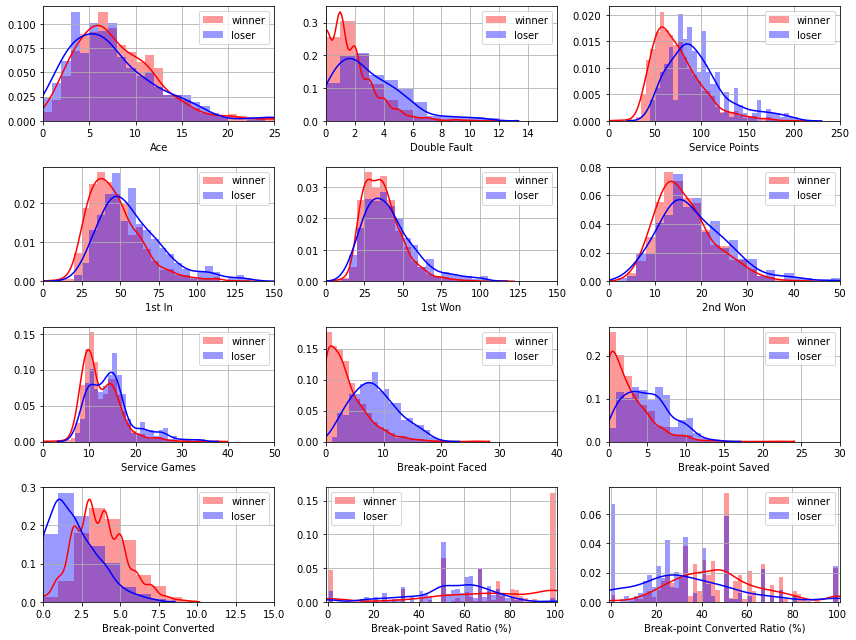

In [50]:
# player performance information
col_player_pf1 = ['w_ace','w_df','w_svpt', 'w_1stIn','w_1stWon','w_2ndWon','w_SvGms','w_bpFaced','w_bpSaved','w_bpc','w_bpsr','w_bpcr',
                  'l_ace','l_df','l_svpt', 'l_1stIn','l_1stWon','l_2ndWon','l_SvGms','l_bpFaced','l_bpSaved','l_bpc','l_bpsr','l_bpcr'
             ]

plt.figure(figsize=(12,9))
#fig,axes = plt.subplots(2,4, sharex='col',figsize=(15,7))

plt.subplot(4,3,1)
plt.grid()
sns.distplot(win_pf[col_player_pf1[0]],kde=True,color='red',bins=range(0,31,1))
sns.distplot(los_pf[col_player_pf1[12]],kde=True,color='blue',bins=range(0,31,1))
plt.xlabel('Ace')
plt.xlim(0,25)
plt.legend(['winner','loser'])

plt.subplot(4,3,2)
plt.grid()
sns.distplot(win_pf[col_player_pf1[1]],kde=True,color='red',bins=range(0,21,1))
sns.distplot(los_pf[col_player_pf1[13]],kde=True,color='blue',bins=range(0,21,1))
plt.xlabel('Double Fault')
plt.xlim(0,16)
plt.legend(['winner','loser'])
plt.xticks([0,2,4,6,8,10,12,14])

plt.subplot(4,3,3)
plt.grid()
sns.distplot(win_pf[col_player_pf1[2]],kde=True,color='red',bins=range(0,301,5))
sns.distplot(los_pf[col_player_pf1[14]],kde=True,color='blue',bins=range(0,301,5))
plt.xlabel('Service Points')
plt.xlim(0,250)
plt.legend(['winner','loser'])

plt.subplot(4,3,4)
plt.grid()
sns.distplot(win_pf[col_player_pf1[3]],kde=True,color='red',bins=range(0,201,5))
sns.distplot(los_pf[col_player_pf1[15]],kde=True,color='blue',bins=range(0,201,5))
plt.xlabel('1st In')
plt.xlim(0,150)
plt.legend(['winner','loser'])

plt.subplot(4,3,5)
plt.grid()
sns.distplot(win_pf[col_player_pf1[4]],kde=True,color='red',bins=range(0,201,5))
sns.distplot(los_pf[col_player_pf1[16]],kde=True,color='blue',bins=range(0,201,5))
plt.xlabel('1st Won')
plt.xlim(0,150)
plt.legend(['winner','loser'])

plt.subplot(4,3,6)
plt.grid()
sns.distplot(win_pf[col_player_pf1[5]],kde=True,color='red',bins=range(0,81,2))
sns.distplot(los_pf[col_player_pf1[17]],kde=True,color='blue',bins=range(0,81,2))
plt.xlabel('2nd Won')
plt.xlim(0,50)
plt.legend(['winner','loser'])

plt.subplot(4,3,7)
plt.grid()
sns.distplot(win_pf[col_player_pf1[6]],kde=True,color='red',bins=range(0,81,1))
sns.distplot(los_pf[col_player_pf1[18]],kde=True,color='blue',bins=range(0,81,1))
plt.xlabel('Service Games')
plt.xlim(0,50)
plt.legend(['winner','loser'])

plt.subplot(4,3,8)
plt.grid()
sns.distplot(win_pf[col_player_pf1[7]],kde=True,color='red',bins=range(0,51,1))
sns.distplot(los_pf[col_player_pf1[19]],kde=True,color='blue',bins=range(0,51,1))
plt.xlabel('Break-point Faced')
plt.xlim(0,40)
plt.legend(['winner','loser'])

plt.subplot(4,3,9)
plt.grid()
sns.distplot(win_pf[col_player_pf1[8]],kde=True,color='red',bins=range(0,51,1))
sns.distplot(los_pf[col_player_pf1[20]],kde=True,color='blue',bins=range(0,51,1))
plt.xlabel('Break-point Saved')
plt.xlim(0,30)
plt.legend(['winner','loser'])

plt.subplot(4,3,10)
plt.grid()
sns.distplot(win_pf[col_player_pf1[9]],kde=True,color='red',bins=range(0,21,1))
sns.distplot(los_pf[col_player_pf1[21]],kde=True,color='blue',bins=range(0,21,1))
plt.xlabel('Break-point Converted')
plt.xlim(0,15)
plt.legend(['winner','loser'])

plt.subplot(4,3,11)
plt.grid()
sns.distplot(win_pf[col_player_pf1[10]]*100,kde=True,color='red',bins=range(0,101,2))
sns.distplot(los_pf[col_player_pf1[22]]*100,kde=True,color='blue',bins=range(0,101,2))
plt.xlabel('Break-point Saved Ratio (%)')
plt.xlim(-1,101)
plt.legend(['winner','loser'])

plt.subplot(4,3,12)
plt.grid()
sns.distplot(win_pf[col_player_pf1[11]]*100,kde=True,color='red',bins=range(0,101,2))
sns.distplot(los_pf[col_player_pf1[23]]*100,kde=True,color='blue',bins=range(0,101,2))
plt.xlabel('Break-point Converted Ratio (%)')
plt.xlim(-1,101)
plt.legend(['winner','loser'])
     
plt.tight_layout() 

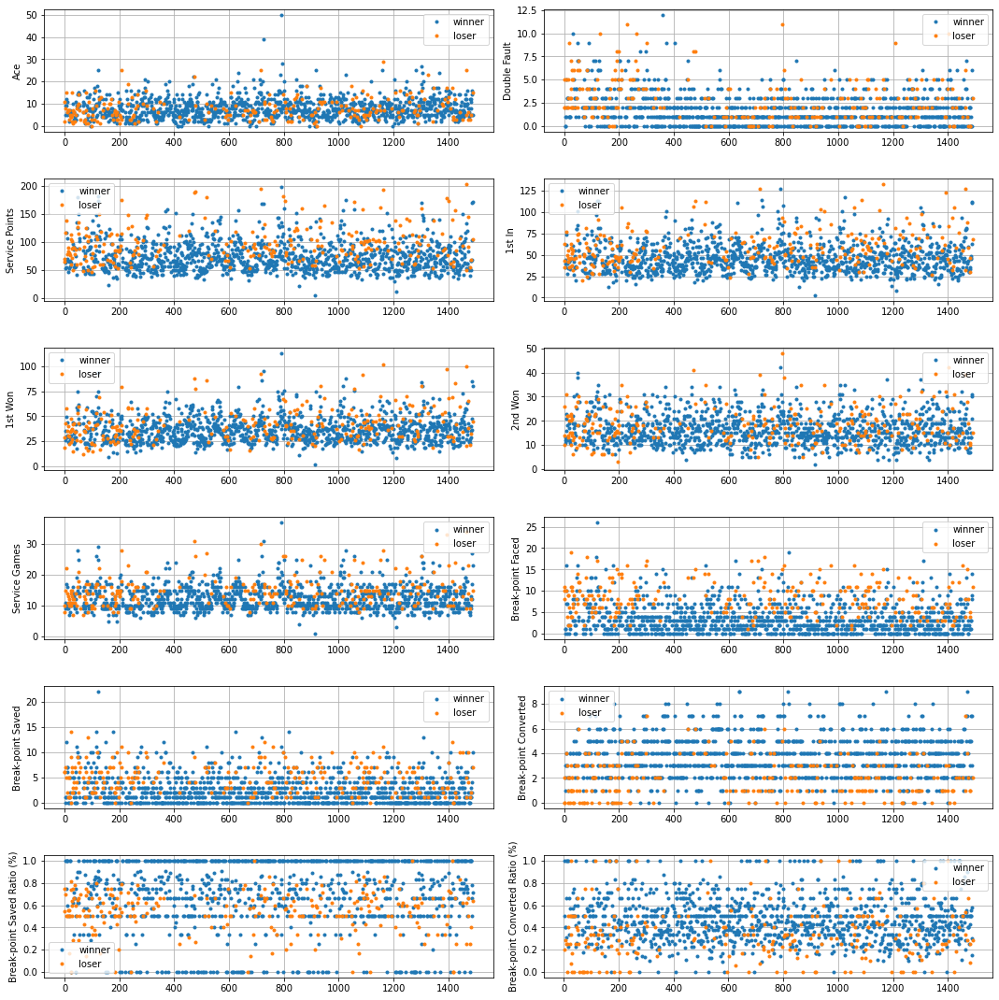

In [52]:
# plot these performance in a time-series

ylabel_list = ['Ace','Double Fault','Service Points','1st In','1st Won','2nd Won','Service Games',
          'Break-point Faced','Break-point Saved','Break-point Converted','Break-point Saved Ratio (%)','Break-point Converted Ratio (%)']

plt.figure(figsize=(15,15))

for i in range(0,12):
    plt.subplot(6,2,i+1)
    plt.grid()
    plt.plot(win_pf.index,win_pf[col_player_pf1[i]],'.')
    plt.plot(los_pf.index,los_pf[col_player_pf1[i+12]],'.')
    plt.ylabel(ylabel_list[i])  
    plt.legend(['winner','loser'])


plt.tight_layout()

It looks messy and quite hard to find any trend. We need to do aggregation based on the .  

In [53]:
col_match = ['tourney_name','surface','draw_size','tourney_level','tourney_date','best_of','match_num','round','minutes','year','month','day','day_week']
col_player_pf_w = ['winner_id','winner_name','winner_age','winner_seed_code','winner_rank','winner_rank_points','w_ace','w_df','w_svpt', 'w_1stIn','w_1stWon','w_2ndWon','w_SvGms','w_bpFaced','w_bpSaved','w_bpc','w_bpsr','w_bpcr']
col_player_pf_l = ['loser_id','loser_name','loser_age','loser_seed_code','loser_rank', 'loser_rank_points','l_ace','l_df','l_svpt', 'l_1stIn','l_1stWon','l_2ndWon','l_SvGms','l_bpFaced','l_bpSaved','l_bpc','l_bpsr','l_bpcr']           


col_p1 = ['p1_id','p1_name','p1_age','p1_seed_code','p1_rank','p1_rank_points','p1_ace','p1_df','p1_svpt', 'p1_1stIn','p1_1stWon','p1_2ndWon','p1_SvGms','p1_bpFaced','p1_bpSaved','p1_bpc','p1_bpsr','p1_bpcr']
col_p2 = ['p2_id','p2_name','p2_age','p2_seed_code','p2_rank','p2_rank_points','p2_ace','p2_df','p2_svpt', 'p2_1stIn','p2_1stWon','p2_2ndWon','p2_SvGms','p2_bpFaced','p2_bpSaved','p2_bpc','p2_bpsr','p2_bpcr']

matrix_player_new = pd.DataFrame()
matrix_player_new[col_match] = matrix_player[col_match]


In [54]:
matrix_player_new[col_p1]=matrix_player[matrix_player['winner_id'] == player_id][col_player_pf_w]
matrix_player_new[col_p2]=matrix_player[matrix_player['winner_id'] == player_id][col_player_pf_l]
matrix_player_new['p1_win'] = matrix_player_new['p1_id'].map(lambda x: 1 if x==player_id else 1, na_action = 'ignore').fillna(0)
matrix_player_new

,tourney_name,surface,draw_size,tourney_level,tourney_date,best_of,match_num,round,minutes,year,month,day,day_week,p1_id,p1_name,p1_age,p1_seed_code,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p2_id,p2_name,p2_age,p2_seed_code,p2_rank,p2_rank_points,p2_ace,p2_df,p2_svpt,p2_1stIn,p2_1stWon,p2_2ndWon,p2_SvGms,p2_bpFaced,p2_bpSaved,p2_bpc,p2_bpsr,p2_bpcr,p1_win
0,Auckland,Hard,32.0,A,2000-01-10,3.0,4.0,R32,68.0,2000,1,10,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,St. Poelten,Clay,32.0,A,2000-05-22,3.0,4.0,R32,54.0,2000,5,22,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2,Gstaad,Clay,32.0,A,2000-07-10,3.0,1.0,R32,137.0,2000,7,10,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
3,Basel,Carpet,32.0,A,2000-10-23,3.0,2.0,R32,70.0,2000,10,23,0,103819,Roger Federer,19.208761,NaN,34.0,1018.0,9.0,0.0,53.0,36.0,26.0,12.0,9.0,1.0,1.0,3.0,1.000000,0.500000,103163,Tommy Haas,22.557153,NaN,20.0,1216.0,3.0,5.0,67.0,37.0,25.0,11.0,9.0,6.0,3.0,0.0,0.500000,0.000000,1.0
4,Basel,Carpet,32.0,A,2000-10-23,3.0,17.0,R16,77.0,2000,10,23,0,103819,Roger Federer,19.208761,NaN,34.0,1018.0,5.0,1.0,63.0,44.0,35.0,13.0,11.0,0.0,0.0,1.0,NaN,1.000000,102318,Andrei Pavel,26.737851,NaN,27.0,1097.0,5.0,3.0,65.0,40.0,29.0,16.0,11.0,1.0,0.0,0.0,0.000000,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1485,Australian Open,Hard,128.0,G,2020-01-20,5.0,187.0,R64,92.0,2020,1,20,0,103819,Roger Federer,38.450376,3.0,3.0,6590.0,14.0,0.0,68.0,47.0,36.0,13.0,12.0,3.0,2.0,7.0,0.666667,0.500000,105936,Filip Krajinovic,27.895962,NaN,41.0,1158.0,4.0,2.0,77.0,57.0,33.0,4.0,12.0,14.0,7.0,1.0,0.500000,0.333333,1.0
1486,Australian Open,Hard,128.0,G,2020-01-20,5.0,207.0,R32,243.0,2020,1,20,0,103819,Roger Federer,38.450376,3.0,3.0,6590.0,16.0,6.0,170.0,111.0,85.0,30.0,27.0,8.0,4.0,3.0,0.500000,0.300000,105357,John Millman,30.600958,NaN,47.0,1096.0,11.0,4.0,189.0,118.0,80.0,43.0,27.0,10.0,7.0,4.0,0.700000,0.500000,1.0
1487,Australian Open,Hard,128.0,G,2020-01-20,5.0,217.0,R16,131.0,2020,1,20,0,103819,Roger Federer,38.450376,3.0,3.0,6590.0,5.0,0.0,103.0,63.0,48.0,21.0,17.0,9.0,7.0,7.0,0.777778,0.583333,105916,Marton Fucsovics,27.947981,NaN,67.0,827.0,1.0,1.0,89.0,42.0,24.0,25.0,16.0,12.0,5.0,2.0,0.416667,0.222222,1.0
1488,Australian Open,Hard,128.0,G,2020-01-20,5.0,222.0,QF,211.0,2020,1,20,0,103819,Roger Federer,38.450376,3.0,3.0,6590.0,5.0,3.0,171.0,112.0,80.0,31.0,23.0,14.0,10.0,2.0,0.714286,0.153846,105815,Tennys Sandgren,28.498289,NaN,100.0,573.0,27.0,5.0,150.0,97.0,77.0,24.0,23.0,13.0,11.0,4.0,0.846154,0.285714,1.0


In [55]:
for i in range(len(col_p1)):
    matrix_player_new[col_p1[i]].fillna(matrix_player[matrix_player['loser_id'] == player_id][col_player_pf_l[i]],inplace = True)
    matrix_player_new[col_p2[i]].fillna(matrix_player[matrix_player['loser_id'] == player_id][col_player_pf_w[i]],inplace = True)
    

In [56]:
matrix_player_new

,tourney_name,surface,draw_size,tourney_level,tourney_date,best_of,match_num,round,minutes,year,month,day,day_week,p1_id,p1_name,p1_age,p1_seed_code,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p2_id,p2_name,p2_age,p2_seed_code,p2_rank,p2_rank_points,p2_ace,p2_df,p2_svpt,p2_1stIn,p2_1stWon,p2_2ndWon,p2_SvGms,p2_bpFaced,p2_bpSaved,p2_bpc,p2_bpsr,p2_bpcr,p1_win
0,Auckland,Hard,32.0,A,2000-01-10,3.0,4.0,R32,68.0,2000,1,10,0,103819,Roger Federer,18.422998,NaN,61.0,616.0,11.0,2.0,70.0,43.0,29.0,14.0,10.0,8.0,6.0,0.0,0.750000,NaN,103507,Juan Carlos Ferrero,19.909651,7.0,45.0,768.0,5.0,1.0,53.0,28.0,26.0,15.0,10.0,0.0,0.0,2.0,NaN,0.250000,0.0
1,St. Poelten,Clay,32.0,A,2000-05-22,3.0,4.0,R32,54.0,2000,5,22,0,103819,Roger Federer,18.787132,8.0,54.0,735.0,2.0,2.0,64.0,36.0,19.0,10.0,8.0,11.0,6.0,0.0,0.545455,NaN,103082,Markus Hantschk,22.505133,NaN,94.0,428.0,0.0,0.0,36.0,17.0,14.0,15.0,7.0,0.0,0.0,5.0,NaN,0.454545,0.0
2,Gstaad,Clay,32.0,A,2000-07-10,3.0,1.0,R32,137.0,2000,7,10,0,103819,Roger Federer,18.921287,NaN,39.0,911.0,8.0,5.0,116.0,63.0,43.0,26.0,15.0,10.0,7.0,2.0,0.700000,0.200000,102374,Alex Corretja,26.247775,1.0,10.0,1860.0,8.0,7.0,96.0,50.0,39.0,25.0,15.0,10.0,8.0,3.0,0.800000,0.300000,0.0
3,Basel,Carpet,32.0,A,2000-10-23,3.0,2.0,R32,70.0,2000,10,23,0,103819,Roger Federer,19.208761,NaN,34.0,1018.0,9.0,0.0,53.0,36.0,26.0,12.0,9.0,1.0,1.0,3.0,1.000000,0.500000,103163,Tommy Haas,22.557153,NaN,20.0,1216.0,3.0,5.0,67.0,37.0,25.0,11.0,9.0,6.0,3.0,0.0,0.500000,0.000000,1.0
4,Basel,Carpet,32.0,A,2000-10-23,3.0,17.0,R16,77.0,2000,10,23,0,103819,Roger Federer,19.208761,NaN,34.0,1018.0,5.0,1.0,63.0,44.0,35.0,13.0,11.0,0.0,0.0,1.0,NaN,1.000000,102318,Andrei Pavel,26.737851,NaN,27.0,1097.0,5.0,3.0,65.0,40.0,29.0,16.0,11.0,1.0,0.0,0.0,0.000000,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1485,Australian Open,Hard,128.0,G,2020-01-20,5.0,187.0,R64,92.0,2020,1,20,0,103819,Roger Federer,38.450376,3.0,3.0,6590.0,14.0,0.0,68.0,47.0,36.0,13.0,12.0,3.0,2.0,7.0,0.666667,0.500000,105936,Filip Krajinovic,27.895962,NaN,41.0,1158.0,4.0,2.0,77.0,57.0,33.0,4.0,12.0,14.0,7.0,1.0,0.500000,0.333333,1.0
1486,Australian Open,Hard,128.0,G,2020-01-20,5.0,207.0,R32,243.0,2020,1,20,0,103819,Roger Federer,38.450376,3.0,3.0,6590.0,16.0,6.0,170.0,111.0,85.0,30.0,27.0,8.0,4.0,3.0,0.500000,0.300000,105357,John Millman,30.600958,NaN,47.0,1096.0,11.0,4.0,189.0,118.0,80.0,43.0,27.0,10.0,7.0,4.0,0.700000,0.500000,1.0
1487,Australian Open,Hard,128.0,G,2020-01-20,5.0,217.0,R16,131.0,2020,1,20,0,103819,Roger Federer,38.450376,3.0,3.0,6590.0,5.0,0.0,103.0,63.0,48.0,21.0,17.0,9.0,7.0,7.0,0.777778,0.583333,105916,Marton Fucsovics,27.947981,NaN,67.0,827.0,1.0,1.0,89.0,42.0,24.0,25.0,16.0,12.0,5.0,2.0,0.416667,0.222222,1.0
1488,Australian Open,Hard,128.0,G,2020-01-20,5.0,222.0,QF,211.0,2020,1,20,0,103819,Roger Federer,38.450376,3.0,3.0,6590.0,5.0,3.0,171.0,112.0,80.0,31.0,23.0,14.0,10.0,2.0,0.714286,0.153846,105815,Tennys Sandgren,28.498289,NaN,100.0,573.0,27.0,5.0,150.0,97.0,77.0,24.0,23.0,13.0,11.0,4.0,0.846154,0.285714,1.0


In [57]:
# let's have a look how the player's performance changed over the past 20 years
col_group = ['year','month']
col_add = ['p1_age','p1_seed_code','p1_rank','p1_rank_points','p1_win','p1_ace','p1_df','p1_svpt', 'p1_1stIn','p1_1stWon','p1_2ndWon','p1_SvGms','p1_bpFaced','p1_bpSaved','p1_bpc','p1_bpsr','p1_bpcr']

matrix_player_agg = matrix_player_new.groupby(col_group)[col_add].mean().reset_index()
matrix_player_agg

,year,month,p1_age,p1_seed_code,p1_rank,p1_rank_points,p1_win,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr
0,2000,1,18.419804,NaN,62.500000,584.333333,0.500000,9.000000,4.000000,82.333333,46.833333,33.500000,19.500000,12.166667,5.833333,3.833333,2.000000,0.596667,0.405556
1,2000,2,18.521561,7.000000,63.357143,630.357143,0.714286,4.916667,3.500000,75.416667,43.250000,32.166667,18.083333,11.666667,4.750000,3.416667,2.916667,0.620628,0.510317
2,2000,3,18.614648,NaN,53.000000,753.000000,0.500000,6.000000,2.000000,71.500000,43.500000,31.500000,17.000000,11.000000,2.000000,1.500000,1.000000,0.750000,0.333333
3,2000,4,18.700890,NaN,50.000000,769.000000,0.000000,2.500000,4.500000,77.000000,45.000000,25.000000,13.000000,10.500000,13.000000,8.000000,1.500000,0.511278,0.250000
4,2000,5,18.789870,8.000000,53.000000,734.571429,0.428571,6.714286,4.000000,110.857143,65.000000,46.000000,22.285714,15.857143,10.285714,6.714286,2.285714,0.579924,0.437780
5,2000,6,18.856126,7.000000,36.800000,881.000000,0.400000,6.600000,2.800000,66.800000,40.200000,28.200000,13.800000,10.800000,5.400000,2.600000,2.600000,0.371429,0.408333
6,2000,7,18.946840,NaN,38.666667,911.000000,0.333333,11.500000,3.500000,108.500000,57.500000,40.000000,23.500000,14.000000,10.500000,7.000000,2.000000,0.668182,0.266667
7,2000,8,19.036277,NaN,39.800000,894.000000,0.400000,10.600000,5.600000,106.800000,61.800000,47.800000,23.000000,16.600000,7.600000,5.200000,3.200000,0.728333,0.486667
8,2000,9,19.112936,NaN,36.000000,933.000000,0.666667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2000,10,19.198308,NaN,31.272727,1042.181818,0.727273,8.272727,2.454545,79.727273,49.363636,35.545455,17.545455,12.272727,6.090909,4.272727,2.636364,0.740556,0.564552


In [58]:
matrix_player_year_ave = matrix_player_agg.groupby('year')[col_add].mean().reset_index()
matrix_player_year_dev = matrix_player_agg.groupby('year')[col_add].std().reset_index()

In [59]:
matrix_player_year_ave.head()

,year,p1_age,p1_seed_code,p1_rank,p1_rank_points,p1_win,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr
0,2000,18.860319,7.250000,44.581503,840.494884,0.460921,7.170368,3.635455,86.313442,50.064697,35.551212,18.391450,12.746320,7.125996,4.553701,2.213874,0.607047,0.405765
1,2001,19.784069,11.130471,18.727104,1462.750842,0.623906,7.493042,3.235241,81.715657,47.360382,34.795455,17.797811,12.726263,7.231762,4.756173,2.807688,0.644907,0.371880
2,2002,20.900635,6.747403,10.972917,2029.788690,0.672851,6.387897,2.687434,73.517692,43.686243,32.686310,15.281978,11.475595,5.511177,3.611640,2.584656,0.687124,0.475515
3,2003,21.847126,2.690548,4.081095,3097.639487,0.792469,7.912965,3.149307,75.355043,44.156818,33.774264,17.384004,12.170433,4.771797,3.105974,3.668225,0.622306,0.478514
4,2004,22.820377,1.125000,1.100000,5507.391259,0.934126,7.760401,2.127369,75.391181,46.501752,36.387007,16.450400,12.432778,3.842345,2.765466,3.527369,0.715199,0.423145


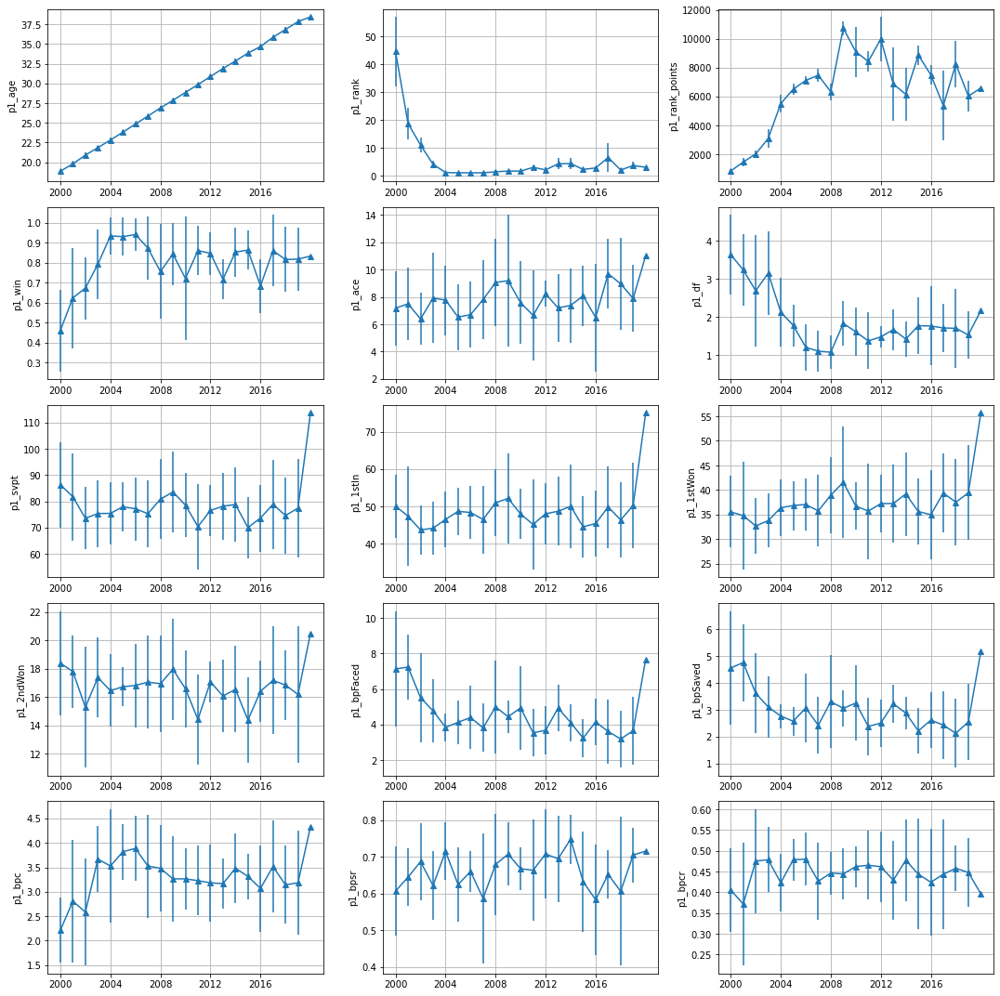

In [60]:
col_add = ['p1_age','p1_rank','p1_rank_points','p1_win','p1_ace','p1_df','p1_svpt', 'p1_1stIn','p1_1stWon','p1_2ndWon','p1_bpFaced','p1_bpSaved','p1_bpc','p1_bpsr','p1_bpcr']

plt.figure(figsize=(15,15))

for i in range(0,len(col_add)):
    
    plt.subplot(5,3,i+1)
    plt.grid()    
    #plt.plot(matrix_player_year_ave.year,matrix_player_year_ave[col_add[i]],'.-')
    plt.errorbar(matrix_player_year_ave.year, matrix_player_year_ave[col_add[i]], matrix_player_year_dev[col_add[i]], linestyle='-', marker='^')
    plt.ylabel(col_add[i])
    plt.xticks(matrix_player_year_ave.year[0:-1:4])
    


plt.tight_layout()

We can see that the overall performance peaked at around 2005 to 2007, when the player's ranking is No.1, but pretty much remained within top 5 since. 

Now we write the above code as a function, with the player's name as an input.

In [61]:
def player_analyse(matrix,player_name,year_min,year_max):
    
    player_id = matrix[(matrix['winner_name'] == player_name)]['winner_id'].unique()[0]
    matrix_player = matrix[(matrix['winner_id'] == player_id) | (matrix['loser_id'] == player_id)].reset_index()
    matrix_player.drop('index',axis=1,inplace=True)
    matrix_player = matrix_player[(matrix_player.year>=year_min) & (matrix_player.year<=year_max)]
    #win_pf = matrix_player[(matrix_player['winner_id'] == player_id)]
    #los_pf = matrix_player[(matrix_player['loser_id'] == player_id)]
    
    print('From {}-{},{} has played in {} tournaments, won {} tournaments; in total played {} matches, and won {} matches.'
      .format(year_min,year_max,player_name,matrix_player['tourney_date'].nunique(),
              matrix_player[(matrix_player['winner_id'] == player_id)&(matrix_player['round'] =='F')].shape[0],
              matrix_player.shape[0],matrix_player[matrix_player['winner_id'] == player_id].shape[0])  )
    
    
    col_match = ['tourney_name','surface','draw_size','tourney_level','tourney_date','best_of','match_num','round','minutes','year','month','day','day_week']
    col_player_pf_w = ['winner_id','winner_name','winner_age','winner_seed_code','winner_rank','winner_rank_points','w_ace','w_df','w_svpt', 'w_1stIn','w_1stWon','w_2ndWon','w_SvGms','w_bpFaced','w_bpSaved','w_bpc','w_bpsr','w_bpcr']
    col_player_pf_l = ['loser_id','loser_name','loser_age','loser_seed_code','loser_rank', 'loser_rank_points','l_ace','l_df','l_svpt', 'l_1stIn','l_1stWon','l_2ndWon','l_SvGms','l_bpFaced','l_bpSaved','l_bpc','l_bpsr','l_bpcr']           


    col_p1 = ['p1_id','p1_name','p1_age','p1_seed_code','p1_rank','p1_rank_points','p1_ace','p1_df','p1_svpt', 'p1_1stIn','p1_1stWon','p1_2ndWon','p1_SvGms','p1_bpFaced','p1_bpSaved','p1_bpc','p1_bpsr','p1_bpcr']
    col_p2 = ['p2_id','p2_name','p2_age','p2_seed_code','p2_rank','p2_rank_points','p2_ace','p2_df','p2_svpt', 'p2_1stIn','p2_1stWon','p2_2ndWon','p2_SvGms','p2_bpFaced','p2_bpSaved','p2_bpc','p2_bpsr','p2_bpcr']

    matrix_player_new = pd.DataFrame()
    matrix_player_new[col_match] = matrix_player[col_match]
    
    matrix_player_new[col_p1]=matrix_player[matrix_player['winner_id'] == player_id][col_player_pf_w]
    matrix_player_new[col_p2]=matrix_player[matrix_player['winner_id'] == player_id][col_player_pf_l]
    matrix_player_new['p1_win'] = matrix_player_new['p1_id'].map(lambda x: 1 if x==player_id else 1, na_action = 'ignore').fillna(0)
     
    for i in range(len(col_p1)):
        matrix_player_new[col_p1[i]].fillna(matrix_player[matrix_player['loser_id'] == player_id][col_player_pf_l[i]],inplace = True)
        matrix_player_new[col_p2[i]].fillna(matrix_player[matrix_player['loser_id'] == player_id][col_player_pf_w[i]],inplace = True)

    col_add = ['p1_age','p1_rank','p1_rank_points','p1_win','p1_ace','p1_df','p1_svpt', 'p1_1stIn','p1_1stWon','p1_2ndWon','p1_bpFaced','p1_bpSaved','p1_bpc','p1_bpsr','p1_bpcr']
    
    matrix_player_year_ave = matrix_player_new.groupby('year')[col_add].mean().reset_index()
    matrix_player_year_dev = matrix_player_new.groupby('year')[col_add].std().reset_index()
    
    return matrix_player_new,matrix_player_year_ave,matrix_player_year_dev
    
    

Now compare the top 3 players: Roger Federer,Rafael Nadal,Novak Djokovic

In [62]:

player_Federer,year_ave_Federer,year_dev_Federer = player_analyse(matrix,'Roger Federer',2005,2019)
player_Nadal,year_ave_Nadal,year_dev_Nadal = player_analyse(matrix,'Rafael Nadal',2005,2019)
player_Djokovic,year_ave_Djokovic,year_dev_Djokovic = player_analyse(matrix,'Novak Djokovic',2005,2019)


From 2005-2019,Roger Federer has played in 244 tournaments, won 81 tournaments; in total played 1090 matches, and won 932 matches.
From 2005-2019,Rafael Nadal has played in 266 tournaments, won 83 tournaments; in total played 1112 matches, and won 940 matches.
From 2005-2019,Novak Djokovic has played in 272 tournaments, won 77 tournaments; in total played 1087 matches, and won 903 matches.


<Figure size 1080x1080 with 0 Axes>

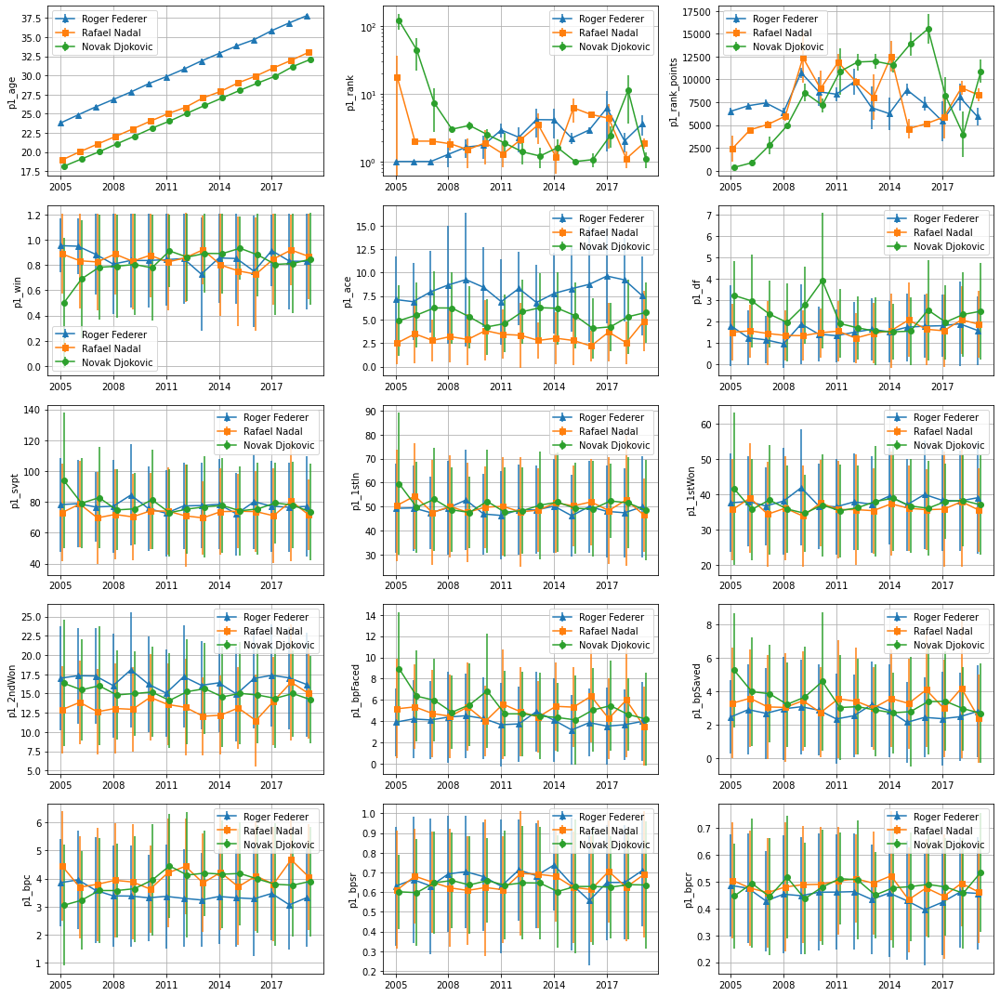

In [63]:
plt.figure(figsize=(15,15))
col_add = ['p1_age','p1_rank','p1_rank_points','p1_win','p1_ace','p1_df','p1_svpt', 'p1_1stIn','p1_1stWon','p1_2ndWon','p1_bpFaced','p1_bpSaved','p1_bpc','p1_bpsr','p1_bpcr']
    
plt.figure(figsize=(15,15))
    
for i in range(0,len(col_add)):    
    plt.subplot(5,3,i+1)
    plt.grid()    
    #plt.plot(matrix_player_year_ave.year,matrix_player_year_ave[col_add[i]],'.-')
    plt.errorbar(year_ave_Federer.year, year_ave_Federer[col_add[i]], year_dev_Federer[col_add[i]], linestyle='-', marker='^');
    plt.errorbar(0.1+year_ave_Nadal.year, year_ave_Nadal[col_add[i]], year_dev_Nadal[col_add[i]], linestyle='-', marker='s');
    plt.errorbar(0.2+year_ave_Djokovic.year, year_ave_Djokovic[col_add[i]], year_dev_Djokovic[col_add[i]], linestyle='-', marker='o');

    plt.legend(['Roger Federer','Rafael Nadal','Novak Djokovic']);
    plt.ylabel(col_add[i]);
    if col_add[i] == 'p1_rank':
        plt.yscale('log')
    plt.xticks(year_ave_Federer.year[0:-1:3]);
        
plt.tight_layout()

The performance statistics of the three top players are quite close in most aspects. There are a couple of metrics that showed noticable difference:
* Number of ace, 1stWon, 2ndWond, Federer>Djokovic>Nadal.
* BPC & BPCR: Nadel~Djokovic > Federer

See the competetion records of these three players

In [64]:
# we run a moving average of 5 years and calculate the winning ratio of the player over other players
# take Federer ras an example

col_group = ['p2_name']


group0 = pd.DataFrame()

for i in range(2009,2020):

    group = player_Federer[(player_Federer.year<=i)&(player_Federer.year>=i-4)].groupby(col_group).agg({'p1_win':'count'}).reset_index()
    group.rename(columns={'p1_win':'comp_cnt_past_5yr'},inplace=True)
    group1 = player_Federer[(player_Federer.year<=i)&(player_Federer.year>=i-4)].groupby(col_group).agg({'p1_win':'sum'}).reset_index()
    group1.rename(columns={'p1_win':'win_cnt_past_5yr'},inplace=True)

    group['win_cnt_past_5yr']=group1['win_cnt_past_5yr']

    group['year'] = i
    group['year']=group['year'].astype(np.int64)
    
    
    group0 = pd.concat([group0,group],ignore_index=True,sort = True)

group0['win_ratio_past_5yr']=group0['win_cnt_past_5yr']/group0['comp_cnt_past_5yr']
group0


,comp_cnt_past_5yr,p2_name,win_cnt_past_5yr,year,win_ratio_past_5yr
0,1,Alan Mackin,1.0,2009,1.0
1,2,Albert Montanes,2.0,2009,1.0
2,2,Alberto Martin,2.0,2009,1.0
3,1,Alejandro Falla,1.0,2009,1.0
4,4,Andre Agassi,4.0,2009,1.0
...,...,...,...,...,...
1348,8,Tomas Berdych,8.0,2019,1.0
1349,1,Tommy Haas,0.0,2019,0.0
1350,1,Yen Hsun Lu,1.0,2019,1.0
1351,1,Yoshihito Nishioka,1.0,2019,1.0


In [65]:
# see the top 5 opponents 
player_Federer_opponents = pd.DataFrame()
col_group = ['p2_name']
player_Federer_opponents['num_comp'] = player_Federer.groupby(col_group)['p2_name'].count().sort_values(ascending=False)
#player_Federer_opponents['num_win'] = player_Federer.groupby(col_group)['p2_name'].count().sort_values(ascending=False)
player_Federer_opponents['num_win'] = player_Federer.groupby(col_group)['p1_win'].sum()
player_Federer_opponents['win_ratio'] = player_Federer_opponents['num_win']/player_Federer_opponents['num_comp']
player_Federer_opponents = player_Federer_opponents.reset_index()
player_Federer_opponents

,p2_name,num_comp,num_win,win_ratio
0,Novak Djokovic,50,23.0,0.460000
1,Rafael Nadal,40,17.0,0.425000
2,Stan Wawrinka,27,24.0,0.888889
3,Tomas Berdych,25,20.0,0.800000
4,Juan Martin del Potro,25,18.0,0.720000
5,Andy Murray,25,14.0,0.560000
6,Richard Gasquet,20,18.0,0.900000
7,Jo-Wilfried Tsonga,19,12.0,0.631579
8,Nikolay Davydenko,18,16.0,0.888889
9,David Ferrer,16,16.0,1.000000


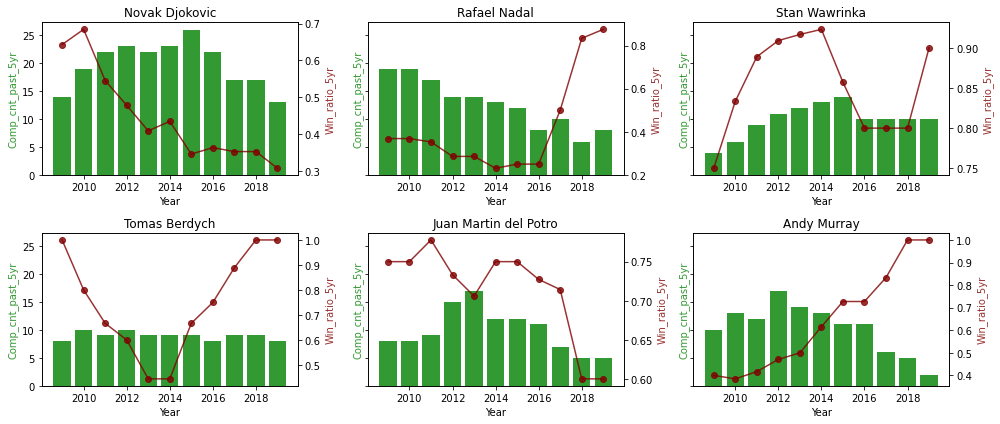

In [66]:
#plt.figure(figsize=(15,15))
name_opp = player_Federer_opponents[player_Federer_opponents['num_comp']>=25]['p2_name']
# plt.subplot(2,3,1)
# sns.lineplot(group0[group0.p2_name ==name_opp[0]]['year'],group0[group0.p2_name ==name_opp[0]]['win_ratio_past_5yr'])
# sns.barplot(group0[group0.p2_name ==name_opp[0]]['year'],group0[group0.p2_name ==name_opp[0]]['comp_cnt_past_5yr'])
fig, axes = plt.subplots(2,3, figsize = (14,6), sharey=True)

for i, ax in enumerate(axes):
    
    for j,ax1 in enumerate(ax):
     
        x = group0[group0.p2_name ==name_opp[len(ax)*i+j]]['year']
        y1 = group0[group0.p2_name ==name_opp[len(ax)*i+j]]['comp_cnt_past_5yr']
        y2 = group0[group0.p2_name ==name_opp[len(ax)*i+j]]['win_ratio_past_5yr']

        ax2 = ax1.twinx()
        ax1.bar(x, y1, color=(0,0.5,0,0.8))
        ax2.plot(x, y2, 'o-', color=(0.5,0,0,0.8) )
        ax1.set_xlabel('Year')
        ax1.set_ylabel('Comp_cnt_past_5yr', color=(0,0.5,0,0.8))
        ax2.set_ylabel('Win_ratio_5yr', color=(0.5,0,0,0.8))
        plt.title(name_opp[len(ax)*i+j])
        
plt.tight_layout()

In [67]:
# for i, ax in enumerate(axes):
#     for j,ax1 in enumerate(ax):
#         print(len(ax)*i+j,name_opp[i+j])

Now we write a function to realize the above function of calculating the moving averaged competition record of a player with other players, as well as the major opponents over the defined years.  

In [68]:

def win_record_mavg(matrix,player_name,year_min,year_max):
    
    # df is the dataframe with record of a player generated using function 'player_analyse()'
    
    df,year_ave,year_dev = player_analyse(matrix,player_name,year_min-4,year_max)
    
    group0 = pd.DataFrame()
    col_group = ['p2_name']

    for i in range(year_min,year_max):

        group = df[(df.year<=i)&(df.year>=i-4)].groupby(col_group).agg({'p1_win':'count'}).reset_index()
        group.rename(columns={'p1_win':'comp_cnt_past_5yr'},inplace=True)
        group1 = df[(df.year<=i)&(df.year>=i-4)].groupby(col_group).agg({'p1_win':'sum'}).reset_index()
        group1.rename(columns={'p1_win':'win_cnt_past_5yr'},inplace=True)

        group['win_cnt_past_5yr']=group1['win_cnt_past_5yr']

        group['year'] = i
        group['year']=group['year'].astype(np.int64)


        group0 = pd.concat([group0,group],ignore_index=True,sort = True)

    group0['win_ratio_past_5yr']=group0['win_cnt_past_5yr']/group0['comp_cnt_past_5yr']
    
    player_opponents = pd.DataFrame()
    col_group = ['p2_name']
    player_opponents['num_comp'] = df[(df.year<=year_max)&(df.year>=year_min-4)].groupby(col_group)['p2_name'].count().sort_values(ascending=False)
    player_opponents['num_win'] = df[(df.year<=year_max)&(df.year>=year_min-4)].groupby(col_group)['p1_win'].sum()
    player_opponents['win_ratio'] = player_opponents['num_win']/player_opponents['num_comp']
    player_opponents = player_opponents.reset_index()
    
    
    return group0,player_opponents

From 2005-2020,Roger Federer has played in 245 tournaments, won 81 tournaments; in total played 1096 matches, and won 937 matches.
From 2005-2020,Rafael Nadal has played in 269 tournaments, won 84 tournaments; in total played 1128 matches, and won 953 matches.
From 2005-2020,Novak Djokovic has played in 275 tournaments, won 80 tournaments; in total played 1105 matches, and won 921 matches.


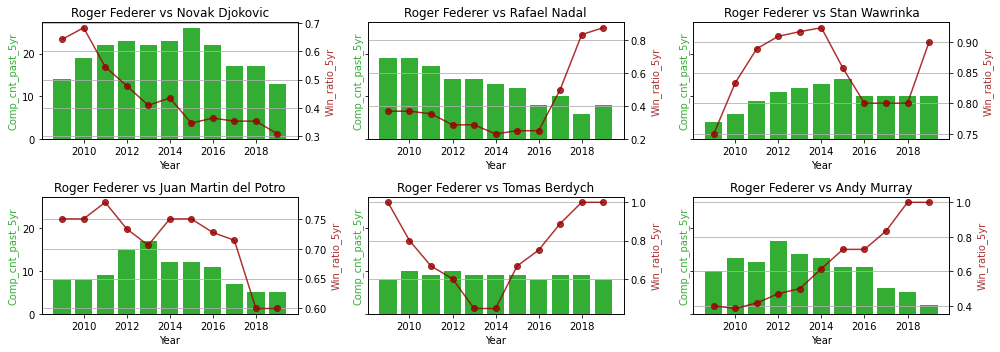

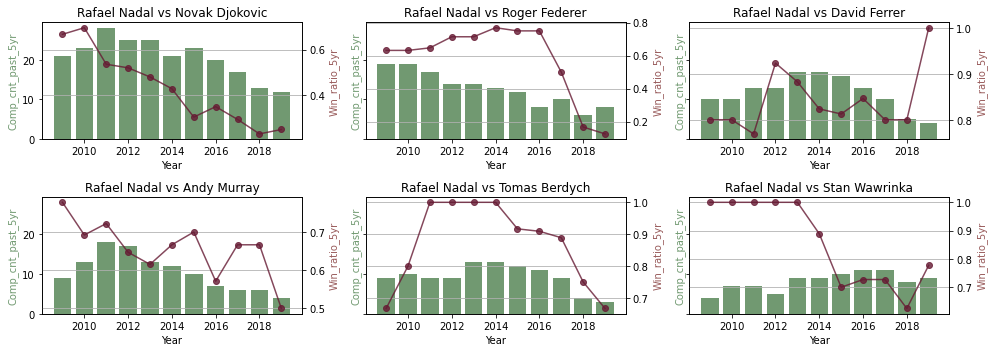

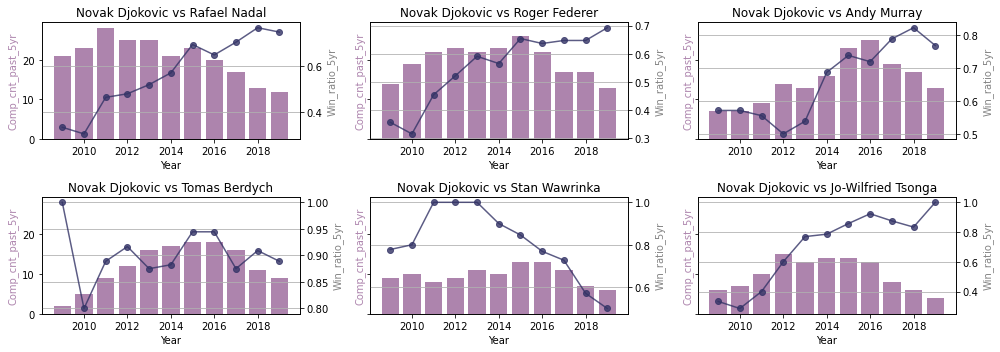

In [69]:
# choose player and get the moving average record and top opponents

player_list = ['Roger Federer','Rafael Nadal','Novak Djokovic']

for m in range(0,3):
    player = player_list[m]
    player_5y,player_opponents = win_record_mavg(matrix,player,2009,2020)

    # display the top 6 opponents
    name_opp = player_opponents[player_opponents.index<6]['p2_name']

    fig, axes = plt.subplots(2,3, figsize = (14,5), sharey=True)

    for i, ax in enumerate(axes):

        for j,ax1 in enumerate(ax):

            x = player_5y[player_5y.p2_name ==name_opp[len(ax)*i+j]]['year']
            y1 = player_5y[player_5y.p2_name ==name_opp[len(ax)*i+j]]['comp_cnt_past_5yr']
            y2 = player_5y[player_5y.p2_name ==name_opp[len(ax)*i+j]]['win_ratio_past_5yr']

            ax2 = ax1.twinx()
            ax1.bar(x, y1, color=(m*0.3,0.6-m*0.1,m*0.3,0.8))   # change the color for different players
            ax2.plot(x, y2, 'o-', color=(0.6-m*0.2,m*0.1,m*0.2,0.8) )
            ax1.set_xlabel('Year')
            ax1.set_ylabel('Comp_cnt_past_5yr', color=(m*0.3,0.6-m*0.1,m*0.3,0.8))
            ax2.set_ylabel('Win_ratio_5yr', color=(0.6-m*0.1,m*0.2,m*0.2,0.8))
            plt.title(player+' vs '+name_opp[len(ax)*i+j])
            plt.grid()

    plt.tight_layout()

We calculate the competition historic information for any two players in the original data set 'matrix'. We calculate the moving average of winning ratio over the last n games.

In [70]:
matrix.head()

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,day,day_week,winner_set_1,loser_set_1,winner_set_2,loser_set_2,winner_set_3,loser_set_3,winner_set_4,loser_set_4,winner_set_5,loser_set_5,set_1_tb,set_2_tb,set_3_tb,set_4_tb,set_5_tb,w_bpsr,l_bpsr,w_bpc,l_bpc,w_bpcr,l_bpcr,diff_set_1,diff_set_2,diff_set_3,diff_set_4,diff_set_5,winner_seed_code,loser_seed_code,winner_hand_code,loser_hand_code
0,Auckland,Hard,32.0,A,2000-01-10,1.0,103163,1,NaN,Tommy Haas,R,188.0,GER,21.771389,101543,NaN,NaN,Jeff Tarango,L,180.0,USA,31.137577,7-5 4-6 7-5,3.0,R32,108.0,18.0,4.0,96.0,49.0,39.0,28.0,17.0,3.0,5.0,7.0,8.0,106.0,55.0,39.0,29.0,17.0,4.0,7.0,11.0,1612.0,63.0,595.0,2000,1,10,0,7.0,5.0,4.0,6.0,7.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.600000,0.571429,3.0,2.0,0.428571,0.400000,2.0,-2.0,2.0,NaN,NaN,1.0,NaN,1.0,-1.0
1,Auckland,Hard,32.0,A,2000-01-10,2.0,102607,NaN,Q,Juan Balcells,R,190.0,ESP,24.558522,102644,NaN,NaN,Franco Squillari,L,183.0,ARG,24.386037,7-5 7-5,3.0,R32,85.0,5.0,3.0,76.0,52.0,39.0,13.0,12.0,5.0,6.0,5.0,10.0,74.0,32.0,25.0,18.0,12.0,3.0,6.0,211.0,157.0,49.0,723.0,2000,1,10,0,7.0,5.0,7.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.833333,0.500000,3.0,1.0,0.500000,0.166667,2.0,2.0,NaN,NaN,NaN,NaN,NaN,1.0,-1.0
2,Auckland,Hard,32.0,A,2000-01-10,3.0,103252,NaN,NaN,Alberto Martin,R,175.0,ESP,21.390828,102238,NaN,NaN,Alberto Berasategui,R,173.0,ESP,26.535250,6-3 6-1,3.0,R32,56.0,0.0,0.0,55.0,35.0,25.0,12.0,8.0,1.0,1.0,0.0,6.0,56.0,33.0,20.0,7.0,8.0,7.0,11.0,48.0,726.0,59.0,649.0,2000,1,10,0,6.0,3.0,6.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.636364,4.0,0.0,0.363636,0.000000,3.0,5.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0
3,Auckland,Hard,32.0,A,2000-01-10,4.0,103507,7,NaN,Juan Carlos Ferrero,R,183.0,ESP,19.909651,103819,NaN,NaN,Roger Federer,R,185.0,SUI,18.422998,6-4 6-4,3.0,R32,68.0,5.0,1.0,53.0,28.0,26.0,15.0,10.0,0.0,0.0,11.0,2.0,70.0,43.0,29.0,14.0,10.0,6.0,8.0,45.0,768.0,61.0,616.0,2000,1,10,0,6.0,4.0,6.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.750000,2.0,0.0,0.250000,NaN,2.0,2.0,NaN,NaN,NaN,7.0,NaN,1.0,1.0
4,Auckland,Hard,32.0,A,2000-01-10,5.0,102103,NaN,Q,Michael Sell,R,180.0,USA,27.381246,102765,4,NaN,Nicolas Escude,R,185.0,FRA,23.770021,0-6 7-6(7) 6-1,3.0,R32,115.0,1.0,2.0,98.0,66.0,39.0,14.0,13.0,6.0,11.0,8.0,8.0,92.0,46.0,34.0,18.0,12.0,5.0,9.0,167.0,219.0,34.0,873.0,2000,1,10,0,0.0,6.0,7.0,6.0,6.0,1.0,NaN,NaN,NaN,NaN,NaN,7.0,NaN,NaN,NaN,0.545455,0.555556,4.0,5.0,0.444444,0.454545,-6.0,1.0,5.0,NaN,NaN,NaN,4.0,1.0,1.0


In [53]:
# def win_record_mavg_last_n_games(matrix,player_name_1,player_name_2,n):

n1 = 20
n2 = 10


col_win_add = ['w_ace', 'w_df', 'w_svpt', 'w_1stIn', 'w_1stWon', 'w_2ndWon', 'w_SvGms',
               'w_bpSaved', 'w_bpFaced', 'w_bpsr', 'w_bpc', 'w_bpcr','winner_rank', 'winner_rank_points', 
               'winner_set_1','winner_set_2', 'winner_set_3', 'winner_set_4', 'winner_set_5']

col_lose_add = ['l_ace', 'l_df', 'l_svpt', 'l_1stIn', 'l_1stWon', 'l_2ndWon', 'l_SvGms', 
                'l_bpSaved', 'l_bpFaced','l_bpsr', 'l_bpc', 'l_bpcr', 'loser_rank', 'loser_rank_points',
                'loser_set_1','loser_set_2', 'loser_set_3','loser_set_4', 'loser_set_5']

last_n1 = ['_last_'+str(n1)]*len(col_win_add)
last_n2 = ['_last_'+str(n2)]*len(col_win_add)

col_win_last_n1 = [c+l for c, l in zip(col_win_add, last_n1)]
col_lose_last_n1 = [c+l for c, l in zip(col_lose_add, last_n1)]
col_win_last_n2 = [c+l for c, l in zip(col_win_add, last_n2)]
col_lose_last_n2 = [c+l for c, l in zip(col_lose_add, last_n2)]

all_col = col_win_last_n1+col_lose_last_n1+col_win_last_n2+col_lose_last_n2

all_col = matrix.columns.tolist() +all_col
# add empty columns of new features
matrix = matrix.reindex(columns=all_col)
    
matrix.head()

,index,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,...,l_bpSaved_last_20,l_bpFaced_last_20,l_bpsr_last_20,l_bpc_last_20,l_bpcr_last_20,loser_rank_last_20,loser_rank_points_last_20,loser_set_1_last_20,loser_set_2_last_20,loser_set_3_last_20,loser_set_4_last_20,loser_set_5_last_20,w_ace_last_10,w_df_last_10,w_svpt_last_10,w_1stIn_last_10,w_1stWon_last_10,w_2ndWon_last_10,w_SvGms_last_10,w_bpSaved_last_10,w_bpFaced_last_10,w_bpsr_last_10,w_bpc_last_10,w_bpcr_last_10,winner_rank_last_10,winner_rank_points_last_10,winner_set_1_last_10,winner_set_2_last_10,winner_set_3_last_10,winner_set_4_last_10,winner_set_5_last_10,l_ace_last_10,l_df_last_10,l_svpt_last_10,l_1stIn_last_10,l_1stWon_last_10,l_2ndWon_last_10,l_SvGms_last_10,l_bpSaved_last_10,l_bpFaced_last_10,l_bpsr_last_10,l_bpc_last_10,l_bpcr_last_10,loser_rank_last_10,loser_rank_points_last_10,loser_set_1_last_10,loser_set_2_last_10,loser_set_3_last_10,loser_set_4_last_10,loser_set_5_last_10
0,0,Hobart,Hard,32.0,A,1979-12-31,1.0,100315,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,5-7 6-3 6-4,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Hobart,Hard,32.0,A,1979-12-31,2.0,100397,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,7-6 7-5,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,Hobart,Hard,32.0,A,1979-12-31,3.0,107328,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,100265,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,6-2 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,Hobart,Hard,32.0,A,1979-12-31,4.0,100121,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,6-3 5-7 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Hobart,Hard,32.0,A,1979-12-31,5.0,100337,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,6-3 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [56]:
# sort the row with date
matrix.drop(['level_0','index'],axis=1,inplace=True)
matrix = matrix.sort_values(by=['tourney_date','tourney_name','match_num'],ascending = True)
matrix = matrix.reset_index()
matrix.head()

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,...,l_bpSaved_last_20,l_bpFaced_last_20,l_bpsr_last_20,l_bpc_last_20,l_bpcr_last_20,loser_rank_last_20,loser_rank_points_last_20,loser_set_1_last_20,loser_set_2_last_20,loser_set_3_last_20,loser_set_4_last_20,loser_set_5_last_20,w_ace_last_10,w_df_last_10,w_svpt_last_10,w_1stIn_last_10,w_1stWon_last_10,w_2ndWon_last_10,w_SvGms_last_10,w_bpSaved_last_10,w_bpFaced_last_10,w_bpsr_last_10,w_bpc_last_10,w_bpcr_last_10,winner_rank_last_10,winner_rank_points_last_10,winner_set_1_last_10,winner_set_2_last_10,winner_set_3_last_10,winner_set_4_last_10,winner_set_5_last_10,l_ace_last_10,l_df_last_10,l_svpt_last_10,l_1stIn_last_10,l_1stWon_last_10,l_2ndWon_last_10,l_SvGms_last_10,l_bpSaved_last_10,l_bpFaced_last_10,l_bpsr_last_10,l_bpc_last_10,l_bpcr_last_10,loser_rank_last_10,loser_rank_points_last_10,loser_set_1_last_10,loser_set_2_last_10,loser_set_3_last_10,loser_set_4_last_10,loser_set_5_last_10
0,Hobart,Hard,32.0,A,1979-12-31,1.0,100315,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,5-7 6-3 6-4,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Hobart,Hard,32.0,A,1979-12-31,2.0,100397,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,7-6 7-5,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Hobart,Hard,32.0,A,1979-12-31,3.0,107328,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,100265,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,6-2 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Hobart,Hard,32.0,A,1979-12-31,4.0,100121,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,6-3 5-7 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Hobart,Hard,32.0,A,1979-12-31,5.0,100337,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,6-3 6-3,3.0,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:

ts = time.time()

for row in matrix.itertuples():
    
    player_name_1 = row.winner_name
    player_name_2 = row.loser_name
    
    i = row.Index
    # filtered record
    filtered_n1 = matrix[(matrix.index<i)&(((matrix['winner_name']==player_name_1)&(matrix['loser_name']==player_name_2))|
    ((matrix['winner_name']==player_name_2)&(matrix['loser_name']==player_name_1)))].reset_index().tail(n1)
    
    filtered_n2 = matrix[(matrix.index<i)&(((matrix['winner_name']==player_name_1)&(matrix['loser_name']==player_name_2))|
    ((matrix['winner_name']==player_name_2)&(matrix['loser_name']==player_name_1)))].reset_index().tail(n2)
        
    len_n1 = len(filtered_n1)
    len_n2 = len(filtered_n2)


    if len_n1!=0:
        matrix.loc[i,'win_ratio_last_'+str(n1)]=len(filtered_n1[filtered_n1['winner_name']==player_name_1])/len_n1
        
        matrix.loc[i,col_win_last_n1]=(filtered_n1[filtered_n1['winner_name']==player_name_1][col_win_add].sum().values\
                                + filtered_n1[filtered_n1['loser_name']==player_name_1][col_lose_add].sum().values)/len_n1
    
        matrix.loc[i,col_lose_last_n1]=(filtered_n1[filtered_n1['winner_name']==player_name_2][col_win_add].sum().values\
                                + filtered_n1[filtered_n1['loser_name']==player_name_2][col_lose_add].sum().values)/len_n1
    
  
    if len_n2!=0:
        matrix.loc[i,'win_ratio_last_'+str(n2)]=len(filtered_n2[filtered_n2['winner_name']==player_name_1])/len_n2
   
        matrix.loc[i,col_win_last_n2]=(filtered_n2[filtered_n2['winner_name']==player_name_1][col_win_add].sum().values\
                                    + filtered_n2[filtered_n2['loser_name']==player_name_1][col_lose_add].sum().values)/len_n2

        matrix.loc[i,col_lose_last_n2]=(filtered_n2[filtered_n2['winner_name']==player_name_2][col_win_add].sum().values\
                                    + filtered_n2[filtered_n2['loser_name']==player_name_2][col_lose_add].sum().values)/len_n2

    
    if i%1000 == 0:
        print (i)
        
time.time()- ts

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000
41000
42000
43000
44000
45000
46000
47000
48000
49000
50000
51000
52000
53000
54000
55000
56000
57000
58000
59000
60000
61000
62000
63000
64000
65000
66000
67000
68000
69000
70000
71000
72000
73000
74000
75000
76000
77000
78000
79000
80000
81000
82000
83000
84000
85000
86000
87000
88000
89000
90000
91000
92000
93000
94000
95000
96000
97000
98000
99000
100000
101000
102000
103000
104000
105000
106000
107000
108000
109000
110000
111000
112000
113000
114000
115000
116000
117000
118000
119000
120000
121000
122000
123000
124000
125000
126000
127000
128000
129000
130000
131000
132000
133000
134000
135000


37774.68058824539

In [59]:
matrix[((matrix.winner_name == 'Roger Federer') & (matrix.loser_name =='Novak Djokovic'))|((matrix.loser_name == 'Roger Federer') & (matrix.winner_name =='Novak Djokovic'))]

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,...,l_bpsr_last_20,l_bpc_last_20,l_bpcr_last_20,loser_rank_last_20,loser_rank_points_last_20,loser_set_1_last_20,loser_set_2_last_20,loser_set_3_last_20,loser_set_4_last_20,loser_set_5_last_20,w_ace_last_10,w_df_last_10,w_svpt_last_10,w_1stIn_last_10,w_1stWon_last_10,w_2ndWon_last_10,w_SvGms_last_10,w_bpSaved_last_10,w_bpFaced_last_10,w_bpsr_last_10,w_bpc_last_10,w_bpcr_last_10,winner_rank_last_10,winner_rank_points_last_10,winner_set_1_last_10,winner_set_2_last_10,winner_set_3_last_10,winner_set_4_last_10,winner_set_5_last_10,l_ace_last_10,l_df_last_10,l_svpt_last_10,l_1stIn_last_10,l_1stWon_last_10,l_2ndWon_last_10,l_SvGms_last_10,l_bpSaved_last_10,l_bpFaced_last_10,l_bpsr_last_10,l_bpc_last_10,l_bpcr_last_10,loser_rank_last_10,loser_rank_points_last_10,loser_set_1_last_10,loser_set_2_last_10,loser_set_3_last_10,loser_set_4_last_10,loser_set_5_last_10,win_ratio_last_20,win_ratio_last_10
94190,Monte Carlo Masters,Clay,64.0,M,2006-04-17,1.0,103819,1,NaN,Roger Federer,R,185.0,SUI,24.689938,104925,NaN,Q,Novak Djokovic,R,188.0,SRB,18.904860,6-3 2-6 6-3,3,R64,109.0,1.0,0.0,73.0,39.0,28.0,21.0,13.0,0.0,2.0,1.0,4.0,94.0,61.0,36.0,19.0,13.0,8.0,11.0,1.0,6810.0,67.0,606.0,2006,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
95854,Davis Cup WG PO: SUI vs SCG,Hard,4.0,D,2006-09-22,4.0,103819,NaN,NaN,Roger Federer,R,185.0,SUI,25.111567,104925,NaN,NaN,Novak Djokovic,R,188.0,SRB,19.326489,6-3 6-2 6-3,5,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,7295.0,21.0,1183.0,2006,9,...,0.727273,2.000000,1.000000,67.000000,606.000000,3.000000,6.000000,3.000000,0.000000,0.000000,1.000000,0.000000,73.000000,39.000000,28.000000,21.000000,13.000000,0.000000,2.000000,0.000000,3.000000,0.272727,1.000000,6810.000000,6.000000,2.000000,6.000000,0.000000,0.0,1.000000,4.000000,94.000000,61.000000,36.000000,19.000000,13.000000,8.000000,11.000000,0.727273,2.000000,1.000000,67.000000,606.000000,3.000000,6.000000,3.000000,0.000000,0.0,1.000000,1.000000
96613,Australian Open,Hard,128.0,G,2007-01-15,113.0,103819,1,NaN,Roger Federer,R,185.0,SUI,25.437372,104925,14,NaN,Novak Djokovic,R,188.0,SRB,19.652293,6-2 7-5 6-3,5,R16,110.0,12.0,1.0,80.0,50.0,40.0,20.0,15.0,1.0,2.0,7.0,2.0,101.0,62.0,38.0,18.0,14.0,3.0,8.0,1.0,8120.0,15.0,1530.0,2007,1,...,0.363636,1.000000,0.500000,44.000000,894.500000,3.000000,4.000000,3.000000,0.000000,0.000000,0.500000,0.000000,36.500000,19.500000,14.000000,10.500000,6.500000,0.000000,1.000000,0.000000,1.500000,0.136364,1.000000,7052.500000,6.000000,4.000000,6.000000,0.000000,0.0,0.500000,2.000000,47.000000,30.500000,18.000000,9.500000,6.500000,4.000000,5.500000,0.363636,1.000000,0.500000,44.000000,894.500000,3.000000,4.000000,3.000000,0.000000,0.0,1.000000,1.000000
97074,Dubai,Hard,32.0,A,2007-02-26,25.0,103819,1,NaN,Roger Federer,R,185.0,SUI,25.552361,104925,7,NaN,Novak Djokovic,R,188.0,SRB,19.767283,6-3 6-7(6) 6-3,3,QF,123.0,8.0,1.0,100.0,62.0,46.0,22.0,16.0,3.0,5.0,6.0,4.0,98.0,63.0,42.0,17.0,14.0,3.0,7.0,1.0,8120.0,14.0,1665.0,2007,2,...,0.367424,1.000000,0.500000,34.333333,1106.333333,2.666667,4.333333,3.000000,0.000000,0.000000,4.333333,0.333333,51.000000,29.666667,22.666667,13.666667,9.333333,0.333333,1.333333,0.166667,2.666667,0.299242,1.000000,7408.333333,6.000000,5.000000,6.000000,0.000000,0.0,2.666667,2.000000,65.000000,41.000000,24.666667,12.333333,9.000000,3.66

In [58]:
matrix.best_of = matrix.best_of.astype(np.int64)

In [61]:
#matrix.drop('index',axis=1,inplace=True)
matrix.to_pickle("./tennis_matrix2.pkl")

In [62]:
matrix.columns[60:160]

Index(['winner_set_5', 'loser_set_5', 'set_1_tb', 'set_2_tb', 'set_3_tb',
       'set_4_tb', 'set_5_tb', 'w_bpsr', 'l_bpsr', 'w_bpc', 'l_bpc', 'w_bpcr',
       'l_bpcr', 'diff_set_1', 'diff_set_2', 'diff_set_3', 'diff_set_4',
       'diff_set_5', 'winner_seed_code', 'loser_seed_code', 'winner_hand_code',
       'loser_hand_code', 'w_ace_last_20', 'w_df_last_20', 'w_svpt_last_20',
       'w_1stIn_last_20', 'w_1stWon_last_20', 'w_2ndWon_last_20',
       'w_SvGms_last_20', 'w_bpSaved_last_20', 'w_bpFaced_last_20',
       'w_bpsr_last_20', 'w_bpc_last_20', 'w_bpcr_last_20',
       'winner_rank_last_20', 'winner_rank_points_last_20',
       'winner_set_1_last_20', 'winner_set_2_last_20', 'winner_set_3_last_20',
       'winner_set_4_last_20', 'winner_set_5_last_20', 'l_ace_last_20',
       'l_df_last_20', 'l_svpt_last_20', 'l_1stIn_last_20', 'l_1stWon_last_20',
       'l_2ndWon_last_20', 'l_SvGms_last_20', 'l_bpSaved_last_20',
       'l_bpFaced_last_20', 'l_bpsr_last_20', 'l_bpc_last_20',
  

Let's check how the performance of two competitors change overtime 

In [63]:
# filter the information for the two competitors
player_1_name = 'Roger Federer'
player_2_name = 'Novak Djokovic'
year_min = 2009
year_max = 2019

def competitors(matrix,player_1_name,player_2_name,year_min,year_max):

    df_comp = matrix[((matrix.winner_name == player_1_name) & (matrix.loser_name ==player_2_name))|\
                     ((matrix.loser_name == player_1_name) & (matrix.winner_name ==player_2_name))].reset_index()

    df_comp.drop('index',axis=1,inplace=True)

    df_comp = df_comp[(df_comp.year>=year_min) & (df_comp.year<=year_max)]

    df_comp.head()

    print('From {} to {}, {} and {} have competed in {} tournaments, in total played {} matches, {} won {} matches, {} won {} matches.'
          .format(year_min,year_max,player_1_name,player_2_name,df_comp['tourney_date'].nunique(),df_comp.shape[0],
              player_1_name,df_comp[df_comp.winner_name == player_1_name].shape[0],
              player_2_name,df_comp[df_comp.winner_name == player_2_name].shape[0]
             )) 

    col_match = ['tourney_name','surface','tourney_level','tourney_date','best_of','round','minutes','year','month','day','day_week']

    # columns for winner and loser
    col_w = ['winner_rank','winner_rank_points','w_ace','w_df','w_svpt', 'w_1stIn','w_1stWon','w_2ndWon','w_SvGms','w_bpFaced',
             'w_bpSaved','w_bpc','w_bpsr','w_bpcr']                 
    col_w_20 = ['win_ratio_last_20','winner_rank_last_20', 'winner_rank_points_last_20','w_ace_last_20', 'w_df_last_20','w_svpt_last_20',
               'w_1stIn_last_20', 'w_1stWon_last_20','w_2ndWon_last_20','w_SvGms_last_20', 'w_bpFaced_last_20', 'w_bpSaved_last_20',
                'w_bpc_last_20','w_bpsr_last_20', 'w_bpcr_last_20']
    col_w_10 = ['win_ratio_last_10','winner_rank_last_10', 'winner_rank_points_last_10','w_ace_last_10', 'w_df_last_10','w_svpt_last_10',
                'w_1stIn_last_10','w_1stWon_last_10','w_2ndWon_last_10','w_SvGms_last_10', 'w_bpFaced_last_10','w_bpSaved_last_10', 
                'w_bpc_last_10','w_bpsr_last_10', 'w_bpcr_last_10']

    col_l = ['loser_rank', 'loser_rank_points','l_ace','l_df','l_svpt', 'l_1stIn','l_1stWon','l_2ndWon','l_SvGms','l_bpFaced',
             'l_bpSaved','l_bpc','l_bpsr','l_bpcr'] 
    col_l_20 = ['loser_rank_last_20', 'loser_rank_points_last_20','l_ace_last_20','l_df_last_20','l_svpt_last_20', 
               'l_1stIn_last_20','l_1stWon_last_20','l_2ndWon_last_20','l_SvGms_last_20','l_bpFaced_last_20','l_bpSaved_last_20',
               'l_bpc_last_20','l_bpsr_last_20','l_bpcr_last_20']           
    col_l_10 = ['loser_rank_last_10', 'loser_rank_points_last_10','l_ace_last_10','l_df_last_10','l_svpt_last_10', 
                'l_1stIn_last_10','l_1stWon_last_10','l_2ndWon_last_10','l_SvGms_last_10','l_bpFaced_last_10','l_bpSaved_last_10',
                 'l_bpc_last_10','l_bpsr_last_10','l_bpcr_last_10']           

    # new columns for player 1 and player 2
    col_p1 = ['p1_rank','p1_rank_points','p1_ace','p1_df','p1_svpt', 'p1_1stIn','p1_1stWon','p1_2ndWon','p1_SvGms','p1_bpFaced',
              'p1_bpSaved','p1_bpc','p1_bpsr','p1_bpcr']
    col_p1_20 = ['p1_win_ratio_last_20','p1_rank_last_20','p1_rank_points_last_20','p1_ace_last_20','p1_df_last_20','p1_svpt_last_20', 
                'p1_1stIn_last_20','p1_1stWon_last_20','p1_2ndWon_last_20','p1_SvGms_last_20','p1_bpFaced_last_20',
              'p1_bpSaved_last_20','p1_bpc_last_20','p1_bpsr_last_20','p1_bpcr_last_20']
    col_p1_10 = ['p1_win_ratio_last_10','p1_rank_last_10','p1_rank_points_last_10','p1_ace_last_10','p1_df_last_10','p1_svpt_last_10', 
                'p1_1stIn_last_10','p1_1stWon_last_10','p1_2ndWon_last_10','p1_SvGms_last_10','p1_bpFaced_last_10',
              'p1_bpSaved_last_10','p1_bpc_last_10','p1_bpsr_last_10','p1_bpcr_last_10']

    col_p2 = ['p2_rank','p2_rank_points','p2_ace','p2_df','p2_svpt', 'p2_1stIn','p2_1stWon','p2_2ndWon','p2_SvGms','p2_bpFaced',
              'p2_bpSaved','p2_bpc','p2_bpsr','p2_bpcr']
    col_p2_20 = ['p2_win_ratio_last_20','p2_rank_last_20','p2_rank_points_last_20','p2_ace_last_20','p2_df_last_20','p2_svpt_last_20', 
                'p2_1stIn_last_20','p2_1stWon_last_20','p2_2ndWon_last_20','p2_SvGms_last_20','p2_bpFaced_last_20',
              'p2_bpSaved_last_20','p2_bpc_last_20','p2_bpsr_last_20','p2_bpcr_last_20']
    col_p2_10 = ['p2_win_ratio_last_10','p2_rank_last_10','p2_rank_points_last_10','p2_ace_last_10','p2_df_last_10','p2_svpt_last_10', 
                'p2_1stIn_last_10','p2_1stWon_last_10','p2_2ndWon_last_10','p2_SvGms_last_10','p2_bpFaced_last_10',
              'p2_bpSaved_last_10','p2_bpc_last_10','p2_bpsr_last_10','p2_bpcr_last_10']


    df_comp_n = pd.DataFrame()
    df_comp_n [col_match] = df_comp[col_match]

    df_comp_n[col_p1]=df_comp[df_comp['winner_name'] == player_1_name][col_w]
    df_comp_n[col_p1_20]=df_comp[df_comp['winner_name'] == player_1_name][col_w_20]
    df_comp_n[col_p1_10]=df_comp[df_comp['winner_name'] == player_1_name][col_w_10]

    df_comp_n[col_p2]=df_comp[df_comp['winner_name'] == player_2_name][col_w]
    df_comp_n[col_p2_20]=df_comp[df_comp['winner_name'] == player_2_name][col_w_20]
    df_comp_n[col_p2_10]=df_comp[df_comp['winner_name'] == player_2_name][col_w_10]

    #df_comp_n.head()

    df_comp_n['p1_win'] = df_comp_n['p1_rank_points'].map(lambda x: 1 if x>0 else 0, na_action = 'ignore').fillna(0)
    df_comp_n['p2_win'] = df_comp_n['p2_rank_points'].map(lambda x: 1 if x>0 else 0, na_action = 'ignore').fillna(0)
    df_comp_n.head()

    for i in range(len(col_p1)):
        df_comp_n[col_p1[i]].fillna(df_comp[df_comp['loser_name'] == player_1_name][col_l[i]],inplace = True)
        df_comp_n[col_p2[i]].fillna(df_comp[df_comp['loser_name'] == player_2_name][col_l[i]],inplace = True)

    for i in range(len(col_l_20)):
        df_comp_n[col_p1_20[i+1]].fillna(df_comp[df_comp['loser_name'] == player_1_name][col_l_20[i]],inplace = True)
        df_comp_n[col_p1_10[i+1]].fillna(df_comp[df_comp['loser_name'] == player_1_name][col_l_10[i]],inplace = True)
        df_comp_n[col_p2_20[i+1]].fillna(df_comp[df_comp['loser_name'] == player_2_name][col_l_20[i]],inplace = True)
        df_comp_n[col_p2_10[i+1]].fillna(df_comp[df_comp['loser_name'] == player_2_name][col_l_10[i]],inplace = True)

    df_comp_n['p1_win_ratio_last_20'].fillna(1-df_comp_n['p2_win_ratio_last_20'],inplace = True)
    df_comp_n['p2_win_ratio_last_20'].fillna(1-df_comp_n['p1_win_ratio_last_20'],inplace = True)
    df_comp_n['p1_win_ratio_last_10'].fillna(1-df_comp_n['p2_win_ratio_last_10'],inplace = True)
    df_comp_n['p2_win_ratio_last_10'].fillna(1-df_comp_n['p1_win_ratio_last_10'],inplace = True)
    
   

    return df_comp_n


df_comp_n = competitors(matrix,player_1_name,player_2_name,year_min,year_max)
df_comp_n.head()

From 2009 to 2019, Roger Federer and Novak Djokovic have competed in 40 tournaments, in total played 41 matches, Roger Federer won 16 matches, Novak Djokovic won 25 matches.


,tourney_name,surface,tourney_level,tourney_date,best_of,round,minutes,year,month,day,day_week,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_win_ratio_last_20,p1_rank_last_20,p1_rank_points_last_20,p1_ace_last_20,p1_df_last_20,p1_svpt_last_20,p1_1stIn_last_20,p1_1stWon_last_20,p1_2ndWon_last_20,p1_SvGms_last_20,p1_bpFaced_last_20,p1_bpSaved_last_20,p1_bpc_last_20,p1_bpsr_last_20,p1_bpcr_last_20,p1_win_ratio_last_10,p1_rank_last_10,p1_rank_points_last_10,p1_ace_last_10,p1_df_last_10,p1_svpt_last_10,p1_1stIn_last_10,p1_1stWon_last_10,p1_2ndWon_last_10,p1_SvGms_last_10,...,p1_bpSaved_last_10,p1_bpc_last_10,p1_bpsr_last_10,p1_bpcr_last_10,p2_rank,p2_rank_points,p2_ace,p2_df,p2_svpt,p2_1stIn,p2_1stWon,p2_2ndWon,p2_SvGms,p2_bpFaced,p2_bpSaved,p2_bpc,p2_bpsr,p2_bpcr,p2_win_ratio_last_20,p2_rank_last_20,p2_rank_points_last_20,p2_ace_last_20,p2_df_last_20,p2_svpt_last_20,p2_1stIn_last_20,p2_1stWon_last_20,p2_2ndWon_last_20,p2_SvGms_last_20,p2_bpFaced_last_20,p2_bpSaved_last_20,p2_bpc_last_20,p2_bpsr_last_20,p2_bpcr_last_20,p2_win_ratio_last_10,p2_rank_last_10,p2_rank_points_last_10,p2_ace_last_10,p2_df_last_10,p2_svpt_last_10,p2_1stIn_last_10,p2_1stWon_last_10,p2_2ndWon_last_10,p2_SvGms_last_10,p2_bpFaced_last_10,p2_bpSaved_last_10,p2_bpc_last_10,p2_bpsr_last_10,p2_bpcr_last_10,p1_win,p2_win
9,Miami Masters,Hard,M,2009-03-25,3,SF,106.0,2009,3,25,2,2.0,10910.0,4.0,4.0,80.0,48.0,28.0,13.0,13.0,10.0,4.0,4.0,0.400000,0.666667,0.777778,1.111111,7197.222222,8.666667,1.111111,81.888889,50.666667,38.444444,17.444444,13.444444,4.777778,2.888889,3.333333,0.473793,0.429289,0.777778,1.111111,7197.222222,8.666667,1.111111,81.888889,50.666667,38.444444,17.444444,13.444444,...,2.888889,3.333333,0.473793,0.429289,3.0,8420.0,4.0,4.0,73.0,51.0,35.0,12.0,13.0,6.0,2.0,6.0,0.333333,0.600000,0.222222,14.777778,2888.777778,5.111111,3.777778,89.333333,56.333333,38.222222,16.333333,13.111111,7.333333,4.000000,1.888889,0.459600,0.415095,0.222222,14.777778,2888.777778,5.111111,3.777778,89.333333,56.333333,38.222222,16.333333,13.111111,7.333333,4.0,1.888889,0.459600,0.415095,0.0,1.0
10,Rome Masters,Clay,M,2009-04-27,3,SF,131.0,2009,4,27,0,2.0,10060.0,6.0,3.0,81.0,40.0,29.0,17.0,14.0,8.0,3.0,3.0,0.375000,0.272727,0.700000,1.200000,7568.500000,8.200000,1.400000,81.700000,50.400000,37.400000,17.000000,13.400000,5.300000,3.000000,3.400000,0.466414,0.453027,0.700000,1.200000,7568.500000,8.200000,1.400000,81.700000,50.400000,37.400000,17.000000,13.400000,...,3.000000,3.400000,0.466414,0.453027,3.0,9160.0,3.0,6.0,100.0,50.0,32.0,28.0,14.0,11.0,8.0,5.0,0.727273,0.625000,0.300000,13.600000,3441.900000,5.000000,3.800000,87.700000,55.800000,37.900000,15.900000,13.100000,7.200000,3.800000,2.300000,0.446973,0.433586,0.300000,13.600000,3441.900000,5.000000,3.800000,87.700000,55.800000,37.900000,15.900000,13.100000,7.200000,3.8,2.300000,0.446973,0.433586,0.0,1.0
11,Cincinnati Masters,Hard,M,2009-08-16,3,F,127.0,2009,8,16,6,1.0,11040.0,7.0,0.0,60.0,33.0,28.0,15.0,10.0,4.0,3.0,4.0,0.750000,0.266667,0.636364,1.272727,7795.000000,8.000000,1.545455,81.636364,49.454545,36.636364,17.000000,13.454545,5.545455,3.000000,3.363636,0.458104,0.436636,0.600000,1.300000,7893.500000,8.700000,1.700000,82.500000,50.500000,37.500000,16.600000,13.500000,...,3.300000,3.400000,0.503914,0.453027,4.0,7150.0,3.0,1.0,81.0,55.0,33.0,9.0,9.0,15.0,11.0,1.0,0.733333,0.250000,0.363636,12.636364,3961.727273,4.818182,4.000000,88.818182,55.272727,37.363636,17.000000,13.181818,7.545455,4.181818,2.545455,0.472455,0.450987,0.400000,7.200000,4297.300000,5.200000,4.000000,88.300000,54.700000,37.500000,16.800000,13.200000,7.200000,3.8,2.600000,0.446973,0.396086,1.0,0.0
12,US Open,Hard,G,2009-08-31,5,SF,154.0,2009,8,31,0,1.0,12040.0,8.0,3.0,109.0,63.0,49.0,28.0,18.0,3.0,2.0,3.0,0.666667,0.300000,0.666667,1.250000,8065.416667,7.916667,1.416667,79.833333,48.083333,35.916667,16.833333,13.166667,5.416667,3.000000,3.416667,0.482428,0.422472,

Basic match statistics

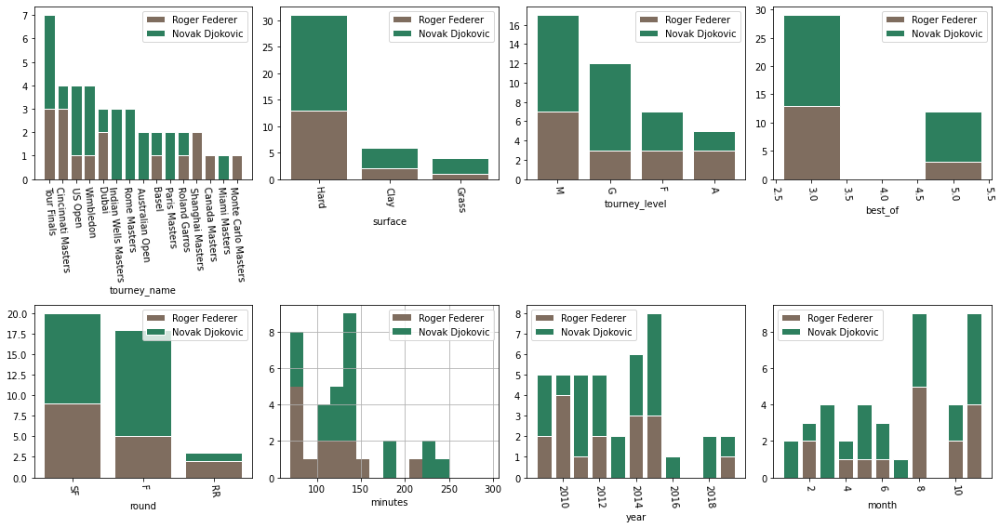

In [64]:

col_match = ['tourney_name','surface','tourney_level','best_of','round','minutes','year','month']

def comp_match(df_comp_n,col_match):
    
    plt.figure(figsize=(15,8))
    
    for i in range(len(col_match)):

        col=col_match[i]
        plt.subplot(2,4,i+1)

        #sns.bar(df_comp_n[col])

        if df_comp_n[col].dtypes in (np.float64,np.float32):

        # if the column is numeric features, plot the distribution
            plt.grid()


            n_bins = range(70,300,15)
            # use .histogram to return the counts at each bins and the bin edges
            bin_bottom, bin_edge = np.histogram(df_comp_n[df_comp_n.p1_win == 1][col], bins=n_bins)

            plt.hist(df_comp_n[df_comp_n.p1_win == 1][col], n_bins, density=False, histtype='bar', stacked=False,color='#7f6d5f')
            plt.hist(df_comp_n[df_comp_n.p2_win == 1][col], n_bins, density=False, histtype='bar', stacked=False,color='#2d7f5e',bottom=bin_bottom)
            #sns.distplot(df_comp_n[df_comp_n.p1_win == 1][col],kde=True,color='#7f6d5f',bins=n_bins)
            #sns.distplot(df_comp_n[df_comp_n.p2_win == 1][col],kde=True,color='#2d7f5e',bins=n_bins)
            plt.legend([player_1_name,player_2_name])
            plt.xlabel(col)


        elif (df_comp_n[col].dtypes in (np.int64,np.object)):

        # if the column is categorical features, plot the number of the top 10 category
            group = df_comp_n.groupby(col).agg({col:'count','p1_win':'sum','p2_win':'sum'})
            group.rename(columns = {col:'count'},inplace=True)
            group = group.reset_index()

            group = group.sort_values(by='count',ascending = False)
            group = group.reset_index()

            # Create brown bars
            plt.bar(group[col],group['p1_win'], color='#7f6d5f', edgecolor='white')
            plt.bar(group[col],group['p2_win'], bottom=group['p1_win'],color='#2d7f5e', edgecolor='white')

            plt.xticks(rotation = -85)
            plt.legend([player_1_name,player_2_name])
            plt.xlabel(col)

    plt.tight_layout()
    
    return

comp_match(df_comp_n,col_match)

Performance statistics over time

In [65]:
col_p1 = ['p1_win','p1_rank','p1_rank_points','p1_ace','p1_df','p1_svpt', 'p1_1stIn','p1_1stWon','p1_2ndWon','p1_SvGms','p1_bpFaced',
              'p1_bpSaved','p1_bpc','p1_bpsr','p1_bpcr']
col_p1_20 = ['p1_win_ratio_last_20','p1_rank_last_20','p1_rank_points_last_20','p1_ace_last_20','p1_df_last_20','p1_svpt_last_20', 
            'p1_1stIn_last_20','p1_1stWon_last_20','p1_2ndWon_last_20','p1_SvGms_last_20','p1_bpFaced_last_20',
          'p1_bpSaved_last_20','p1_bpc_last_20','p1_bpsr_last_20','p1_bpcr_last_20']
col_p1_10 = ['p1_win_ratio_last_10','p1_rank_last_10','p1_rank_points_last_10','p1_ace_last_10','p1_df_last_10','p1_svpt_last_10', 
            'p1_1stIn_last_10','p1_1stWon_last_10','p1_2ndWon_last_10','p1_SvGms_last_10','p1_bpFaced_last_10',
          'p1_bpSaved_last_10','p1_bpc_last_10','p1_bpsr_last_10','p1_bpcr_last_10']

col_p2 = ['p2_win','p2_rank','p2_rank_points','p2_ace','p2_df','p2_svpt', 'p2_1stIn','p2_1stWon','p2_2ndWon','p2_SvGms','p2_bpFaced',
          'p2_bpSaved','p2_bpc','p2_bpsr','p2_bpcr']
col_p2_20 = ['p2_win_ratio_last_20','p2_rank_last_20','p2_rank_points_last_20','p2_ace_last_20','p2_df_last_20','p2_svpt_last_20', 
            'p2_1stIn_last_20','p2_1stWon_last_20','p2_2ndWon_last_20','p2_SvGms_last_20','p2_bpFaced_last_20',
          'p2_bpSaved_last_20','p2_bpc_last_20','p2_bpsr_last_20','p2_bpcr_last_20']
col_p2_10 = ['p2_win_ratio_last_10','p2_rank_last_10','p2_rank_points_last_10','p2_ace_last_10','p2_df_last_10','p2_svpt_last_10', 
            'p2_1stIn_last_10','p2_1stWon_last_10','p2_2ndWon_last_10','p2_SvGms_last_10','p2_bpFaced_last_10',
          'p2_bpSaved_last_10','p2_bpc_last_10','p2_bpsr_last_10','p2_bpcr_last_10']

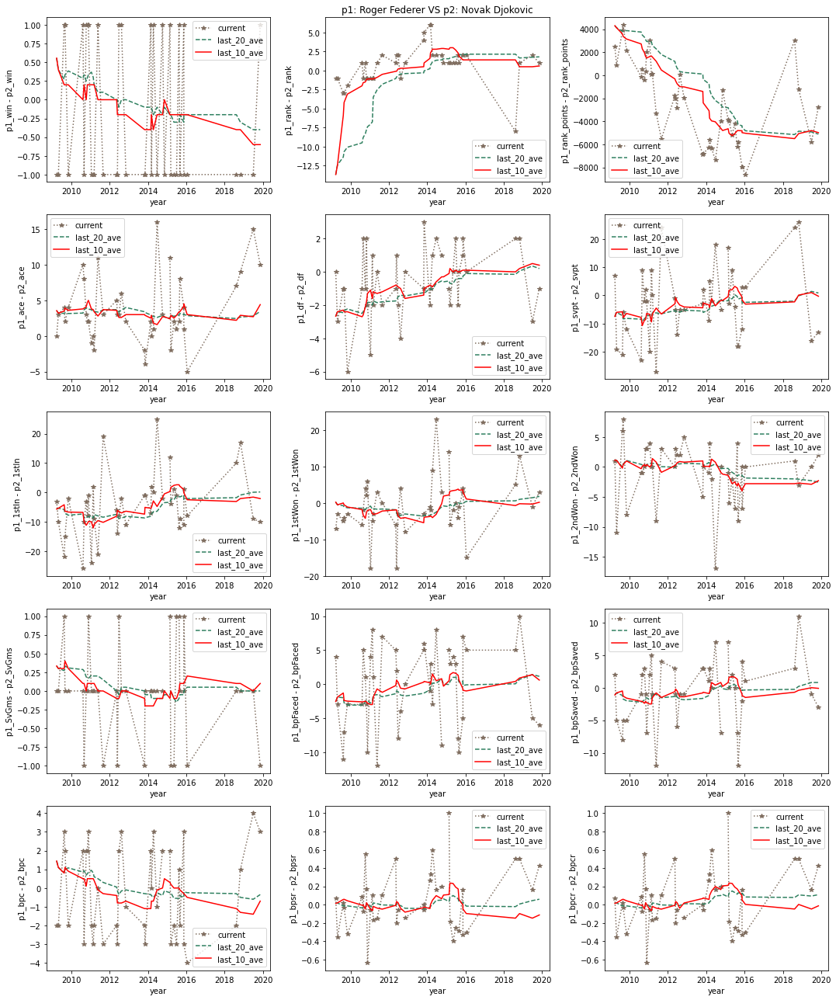

In [66]:


def comp_performance(df_comp_n,col_p1,col_p2,col_p1_20,col_p2_20,col_p1_10,col_p2_10):

    df_comp_n = df_comp_n.sort_values(by='tourney_date',ascending = True)
    
    plt.figure(figsize=(15,18))

    for i in range(len(col_p1)):

        plt.subplot(5,3,i+1)
        plt.plot(df_comp_n.tourney_date,df_comp_n[col_p1[i]]-df_comp_n[col_p2[i]],color ='#7f6d5f',linestyle=':', marker='*')
        #plt.plot(df_comp_n.tourney_date,df_comp_n[col_p2[i]],color ='#2d7f5e',linestyle=':')
        plt.plot(df_comp_n.tourney_date,df_comp_n[col_p1_20[i]]-df_comp_n[col_p2_20[i]],color ='#2d7f5e',linestyle='--')
        #plt.plot(df_comp_n.tourney_date,df_comp_n[col_p2_20[i]],color ='#2d7f5e',linestyle='-.')
        plt.plot(df_comp_n.tourney_date,df_comp_n[col_p1_10[i]]-df_comp_n[col_p2_10[i]],color ='red',linestyle='-')
        #plt.plot(df_comp_n.tourney_date,df_comp_n[col_p2_10[i]],color ='#2d7f5e',linestyle='--')

        plt.legend(['current','last_20_ave','last_10_ave'])
        plt.ylabel(col_p1[i]+' - '+col_p2[i])
        plt.xlabel('year')

        if i==1:
            plt.title('p1: '+player_1_name+' VS '+'p2: '+player_2_name)


    plt.tight_layout()
    
    return

comp_performance(df_comp_n,col_p1,col_p2,col_p1_20,col_p2_20,col_p1_10,col_p2_10)

We can also do the same for other players, like Federer vs Nadal

From 2009 to 2019, Roger Federer and Rafael Nadal have competed in 23 tournaments, in total played 23 matches, Roger Federer won 11 matches, Rafael Nadal won 12 matches.


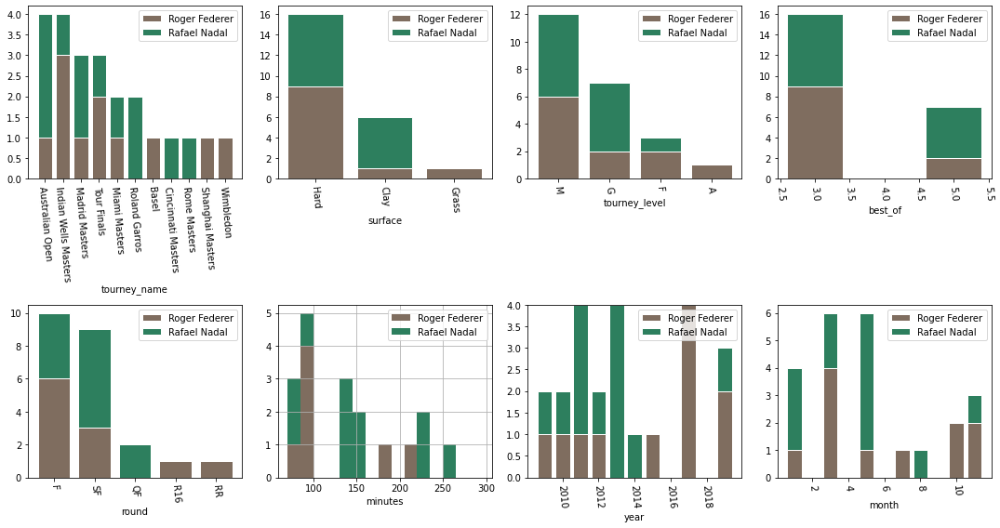

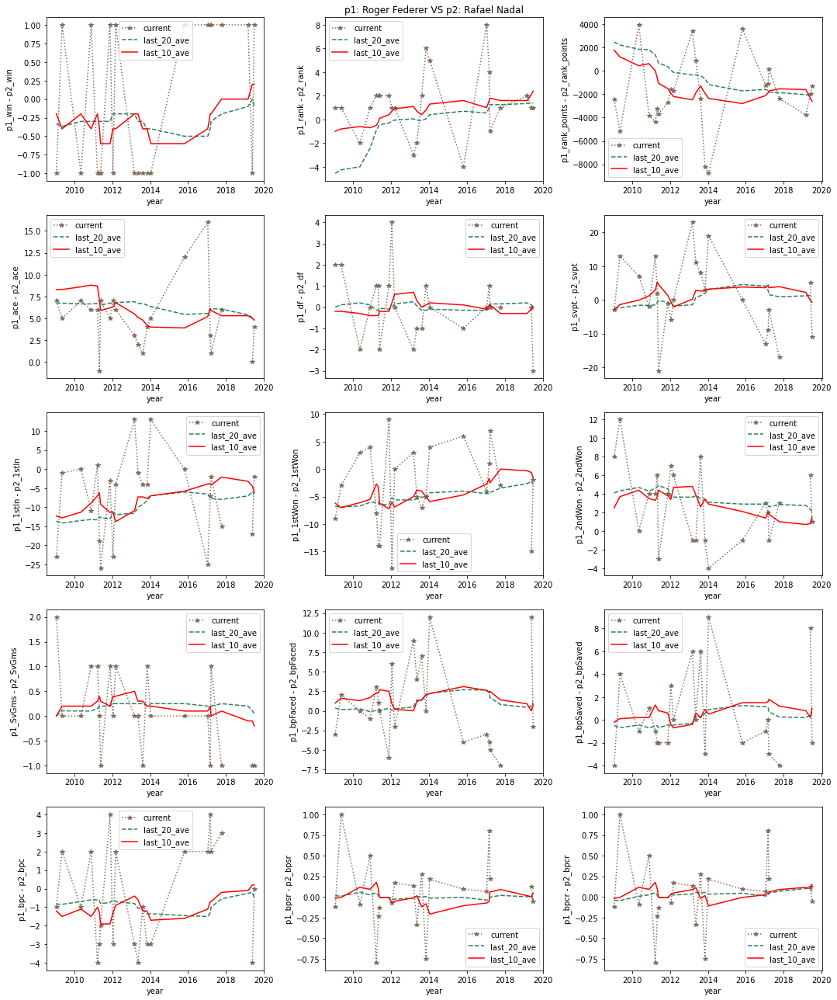

In [72]:
player_1_name = 'Roger Federer'
player_2_name = 'Rafael Nadal'
df_comp_2 = competitors(matrix,player_1_name,player_2_name,year_min,year_max)
comp_match(df_comp_2,col_match)
comp_performance(df_comp_2,col_p1,col_p2,col_p1_20,col_p2_20,col_p1_10,col_p2_10)


In [267]:
df_comp_2.head()

,tourney_name,surface,tourney_level,tourney_date,best_of,round,minutes,year,month,day,day_week,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_win_ratio_last_5,p1_rank_last_5,p1_rank_points_last_5,p1_ace_last_5,p1_df_last_5,p1_svpt_last_5,p1_1stIn_last_5,p1_1stWon_last_5,p1_2ndWon_last_5,p1_SvGms_last_5,p1_bpFaced_last_5,p1_bpSaved_last_5,p1_bpc_last_5,p1_bpsr_last_5,p1_bpcr_last_5,p1_win_ratio_last_10,p1_rank_last_10,p1_rank_points_last_10,p1_ace_last_10,p1_df_last_10,p1_svpt_last_10,p1_1stIn_last_10,p1_1stWon_last_10,p1_2ndWon_last_10,p1_SvGms_last_10,...,p1_bpSaved_last_10,p1_bpc_last_10,p1_bpsr_last_10,p1_bpcr_last_10,p2_rank,p2_rank_points,p2_ace,p2_df,p2_svpt,p2_1stIn,p2_1stWon,p2_2ndWon,p2_SvGms,p2_bpFaced,p2_bpSaved,p2_bpc,p2_bpsr,p2_bpcr,p2_win_ratio_last_5,p2_rank_last_5,p2_rank_points_last_5,p2_ace_last_5,p2_df_last_5,p2_svpt_last_5,p2_1stIn_last_5,p2_1stWon_last_5,p2_2ndWon_last_5,p2_SvGms_last_5,p2_bpFaced_last_5,p2_bpSaved_last_5,p2_bpc_last_5,p2_bpsr_last_5,p2_bpcr_last_5,p2_win_ratio_last_10,p2_rank_last_10,p2_rank_points_last_10,p2_ace_last_10,p2_df_last_10,p2_svpt_last_10,p2_1stIn_last_10,p2_1stWon_last_10,p2_2ndWon_last_10,p2_SvGms_last_10,p2_bpFaced_last_10,p2_bpSaved_last_10,p2_bpc_last_10,p2_bpsr_last_10,p2_bpcr_last_10,p1_win,p2_win
18,Madrid Masters,Clay,M,2009-05-10,3.0,F,86.0,2009,5,10,6,2.0,10170.0,6.0,3.0,67.0,42.0,29.0,17.0,10.0,4.0,4.0,2.0,1.000000,1.000000,0.2,1.0,6671.0,10.0,0.4,102.6,67.6,45.2,14.6,15.6,11.0,6.2,2.6,0.602327,0.489670,0.4,1.0,7008.5,9.9,1.4,98.6,63.6,44.2,16.4,15.4,...,5.6,2.5,0.621228,0.360945,1.0,15360.0,1.0,1.0,54.0,43.0,32.0,5.0,10.0,2.0,0.0,0.0,0.000000,0.000000,0.8,2.0,5553.0,2.2,1.8,97.6,73.2,49.2,12.8,15.6,6.6,4.0,4.8,0.510330,0.397673,0.6,2.0,5223.5,1.6,1.6,101.7,75.9,50.4,13.9,15.4,8.3,5.8,3.7,0.639055,0.378772,1.0,0.0
19,Australian Open,Hard,G,2009-01-19,5.0,F,259.0,2009,1,19,0,2.0,10700.0,11.0,6.0,172.0,89.0,65.0,38.0,26.0,16.0,9.0,6.0,0.562500,0.315789,0.2,1.2,7399.0,9.0,1.0,106.4,68.2,44.6,17.0,15.8,11.6,6.8,2.4,0.602327,0.539670,0.4,1.1,7263.5,9.8,1.3,99.3,64.1,43.9,17.1,15.3,...,5.9,2.4,0.671228,0.433672,1.0,13160.0,4.0,4.0,175.0,112.0,74.0,30.0,24.0,19.0,13.0,7.0,0.684211,0.437500,0.8,1.8,7518.0,2.2,1.8,100.6,76.2,52.2,12.6,16.0,6.2,3.8,4.8,0.460330,0.397673,0.6,1.9,6332.5,1.7,1.5,99.1,74.7,50.3,13.0,15.3,7.4,5.0,3.6,0.566328,0.328772,0.0,1.0
20,Madrid Masters,Clay,M,2010-05-09,3.0,F,131.0,2010,5,9,6,1.0,10430.0,9.0,0.0,88.0,59.0,35.0,14.0,11.0,11.0,7.0,3.0,0.636364,0.272727,0.2,1.4,8254.0,10.2,2.2,125.8,76.6,52.0,23.0,18.6,13.4,8.4,2.8,0.686256,0.442828,0.4,1.2,7604.5,10.6,1.5,109.9,69.4,47.8,19.6,16.9,...,6.2,3.0,0.652478,0.465251,3.0,6480.0,2.0,2.0,81.0,59.0,32.0,14.0,11.0,11.0,8.0,4.0,0.727273,0.363636,0.8,1.6,9059.0,2.8,2.2,123.0,88.4,60.6,17.6,18.4,9.0,6.2,5.0,0.557172,0.313744,0.6,1.8,7161.0,2.0,1.8,110.0,80.7,53.9,15.2,16.7,9.0,6.0,4.1,0.534749,0.347522,0.0,1.0
21,Tour Finals,Hard,F,2010-11-21,3.0,F,98.0,2010,11,21,6,2.0,7645.0,7.0,1.0,64.0,40.0,37.0,14.0,13.0,2.0,1.0,3.0,0.500000,1.000000,0.2,1.4,8975.0,10.6,2.2,119.8,74.0,49.4,22.6,17.6,12.2,7.6,2.6,0.684117,0.383088,0.3,1.2,7946.0,10.9,1.5,111.4,71.5,48.4,19.3,16.9,...,6.4,2.8,0.644686,0.447069,1.0,11450.0,1.0,1.0,66.0,51.0,33.0,10.0,12.0,3.0,0.0,1.0,0.000000,0.500000,0.8,1.8,9268.0,2.6,2.0,119.0,84.8,56.8,18.8,17.2,9.8,7.2,4.6,0.616912,0.315883,0.7,1.9,7321.5,2.1,1.9,110.2,80.4,53.9,15.8,16.7,9.0,6.2,4.3,0.552931,0.355314,1.0,0.0
22,Miami Masters,Hard,M,2011-03-23,3.0,SF,79.0,2011,3,23,2,3.0,8280.0,6.0,1.0,58.0,35.0,20.0,11.0,9.0,5.0,1.0,0.0,0.200000,0.000000,0.4,1.6,9169.0,11.6,2.4,117.2,71.4,51.6,24.4,18.0,9.2,6.0,3.0,0.678234,0.533088,0.4,1.3,7959.0,10.7,1.5,106.0,67.9,47.1,18.4,16.3,...,5.9,3.0,0.634686,0.541187,1.0,12630.0,0.0,0.0,45.0,34.0,28.0,7.0,8.0,2.0,2.0,4.0,1.000000,0.800000,0.6,1.6,10441.0,2.8,2.2,118.8,85.0,56.4,18.6,17.4,9.6,6.6,3.2,0.466912,0.321766,0.6,1.8,7944.0,2.0,1.9,103.1,74.9,49.8,15.1,16.0,7.6,4

In [67]:
df_comp_n.columns[50:150]

Index(['p1_bpFaced_last_10', 'p1_bpSaved_last_10', 'p1_bpc_last_10',
       'p1_bpsr_last_10', 'p1_bpcr_last_10', 'p2_rank', 'p2_rank_points',
       'p2_ace', 'p2_df', 'p2_svpt', 'p2_1stIn', 'p2_1stWon', 'p2_2ndWon',
       'p2_SvGms', 'p2_bpFaced', 'p2_bpSaved', 'p2_bpc', 'p2_bpsr', 'p2_bpcr',
       'p2_win_ratio_last_20', 'p2_rank_last_20', 'p2_rank_points_last_20',
       'p2_ace_last_20', 'p2_df_last_20', 'p2_svpt_last_20',
       'p2_1stIn_last_20', 'p2_1stWon_last_20', 'p2_2ndWon_last_20',
       'p2_SvGms_last_20', 'p2_bpFaced_last_20', 'p2_bpSaved_last_20',
       'p2_bpc_last_20', 'p2_bpsr_last_20', 'p2_bpcr_last_20',
       'p2_win_ratio_last_10', 'p2_rank_last_10', 'p2_rank_points_last_10',
       'p2_ace_last_10', 'p2_df_last_10', 'p2_svpt_last_10',
       'p2_1stIn_last_10', 'p2_1stWon_last_10', 'p2_2ndWon_last_10',
       'p2_SvGms_last_10', 'p2_bpFaced_last_10', 'p2_bpSaved_last_10',
       'p2_bpc_last_10', 'p2_bpsr_last_10', 'p2_bpcr_last_10', 'p1_win',
       'p2_wi

In [68]:
col_self_corr = ['p1_win','p1_win_ratio_last_20', 'p1_rank_last_20',
       'p1_rank_points_last_20', 'p1_ace_last_20', 'p1_df_last_20',
       'p1_svpt_last_20', 'p1_1stIn_last_20', 'p1_1stWon_last_20',
       'p1_2ndWon_last_20', 'p1_SvGms_last_20', 'p1_bpFaced_last_20',
       'p1_bpSaved_last_20', 'p1_bpc_last_20', 'p1_bpsr_last_20',
       'p1_bpcr_last_20', 'p1_win_ratio_last_10', 'p1_rank_last_10',
       'p1_rank_points_last_10', 'p1_ace_last_10', 'p1_df_last_10',
       'p1_svpt_last_10', 'p1_1stIn_last_10', 'p1_1stWon_last_10',
       'p1_2ndWon_last_10', 'p1_SvGms_last_10', 'p1_bpFaced_last_10',
       'p1_bpSaved_last_10', 'p1_bpc_last_10', 'p1_bpsr_last_10',
       'p1_bpcr_last_10','p2_win','p2_win_ratio_last_20', 'p2_rank_last_20', 'p2_rank_points_last_20',
       'p2_ace_last_20', 'p2_df_last_20', 'p2_svpt_last_20', 'p2_1stIn_last_20',
       'p2_1stWon_last_20', 'p2_2ndWon_last_20', 'p2_SvGms_last_20',
       'p2_bpFaced_last_20', 'p2_bpSaved_last_20', 'p2_bpc_last_20',
       'p2_bpsr_last_20', 'p2_bpcr_last_20', 'p2_win_ratio_last_10',
       'p2_rank_last_10', 'p2_rank_points_last_10', 'p2_ace_last_10',
       'p2_df_last_10', 'p2_svpt_last_10', 'p2_1stIn_last_10',
       'p2_1stWon_last_10', 'p2_2ndWon_last_10', 'p2_SvGms_last_10',
       'p2_bpFaced_last_10', 'p2_bpSaved_last_10', 'p2_bpc_last_10',
       'p2_bpsr_last_10', 'p2_bpcr_last_10']

In [73]:
fed_djo_corr = df_comp_n[col_self_corr].corr(method='pearson') 
fed_nad_corr = df_comp_2[col_self_corr].corr(method='pearson') 

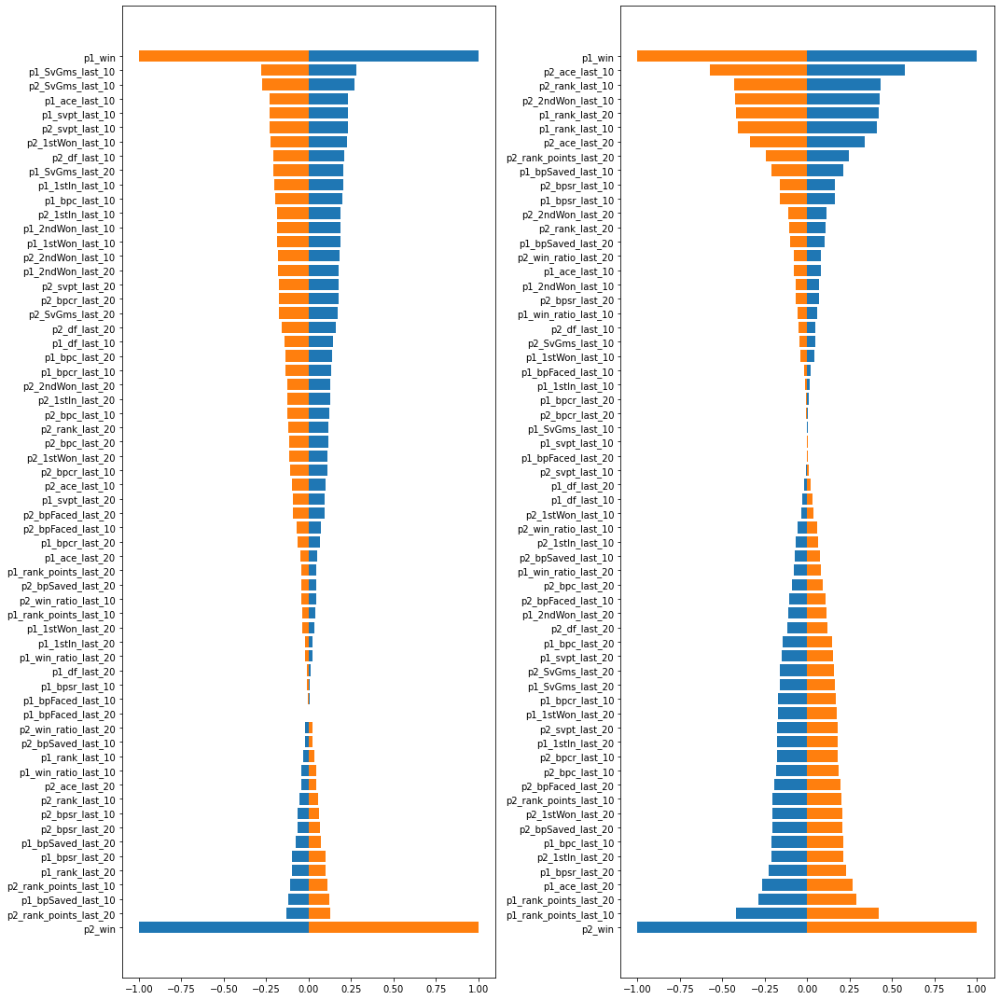

In [74]:
fed_corr = fed_djo_corr['p1_win'].sort_values()
djo_corr = fed_djo_corr['p2_win'].sort_values()

fed2_corr = fed_nad_corr['p1_win'].sort_values()
nad_corr = fed_nad_corr['p2_win'].sort_values()

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.barh(fed_corr.index,fed_corr)
plt.barh(djo_corr.index,djo_corr)

plt.subplot(1,2,2)
plt.barh(fed2_corr.index,fed2_corr)
plt.barh(nad_corr.index,nad_corr)

plt.tight_layout()

 <a id='Feature'></a>
 ##  4. [Data preparation and feature engineering](#Contents)

In [75]:
matrix = pd.read_pickle("./tennis_matrix.pkl")
# sort the matches in time sequence according to date and match_num
matrix = matrix.sort_values(by=['tourney_date','tourney_name','match_num'])


matrix.reset_index(inplace = True)
matrix.drop('index',axis=1,inplace=True)
matrix.to_pickle("./tennis_matrix2.pkl")
matrix.head(10)

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,...,l_bpsr_last_20,l_bpc_last_20,l_bpcr_last_20,loser_rank_last_20,loser_rank_points_last_20,loser_set_1_last_20,loser_set_2_last_20,loser_set_3_last_20,loser_set_4_last_20,loser_set_5_last_20,w_ace_last_10,w_df_last_10,w_svpt_last_10,w_1stIn_last_10,w_1stWon_last_10,w_2ndWon_last_10,w_SvGms_last_10,w_bpSaved_last_10,w_bpFaced_last_10,w_bpsr_last_10,w_bpc_last_10,w_bpcr_last_10,winner_rank_last_10,winner_rank_points_last_10,winner_set_1_last_10,winner_set_2_last_10,winner_set_3_last_10,winner_set_4_last_10,winner_set_5_last_10,l_ace_last_10,l_df_last_10,l_svpt_last_10,l_1stIn_last_10,l_1stWon_last_10,l_2ndWon_last_10,l_SvGms_last_10,l_bpSaved_last_10,l_bpFaced_last_10,l_bpsr_last_10,l_bpc_last_10,l_bpcr_last_10,loser_rank_last_10,loser_rank_points_last_10,loser_set_1_last_10,loser_set_2_last_10,loser_set_3_last_10,loser_set_4_last_10,loser_set_5_last_10,win_ratio_last_20,win_ratio_last_10
0,Hobart,Hard,32.0,A,1979-12-31,1.0,100315,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,5-7 6-3 6-4,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Hobart,Hard,32.0,A,1979-12-31,2.0,100397,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,7-6 7-5,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Hobart,Hard,32.0,A,1979-12-31,3.0,107328,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,100265,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,6-2 6-3,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Hobart,Hard,32.0,A,1979-12-31,4.0,100121,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,6-3 5-7 6-3,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Hobart,Hard,32.0,A,1979-12-31,5.0,100337,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,6-3 6-3,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Hobart,Hard,32.0,A,1979-12-31,6.0,100515,NaN,NaN,Shlomo Glickstein,R,188.0,ISR,21.982204,100224,NaN,NaN,Peter Campbell,R,NaN,AUS,29.138946,6-2 6-2,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1979,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [76]:
matrix['lose_ratio_last_20'] = 1 - matrix['win_ratio_last_20']
matrix['lose_ratio_last_10'] = 1 - matrix['win_ratio_last_10']

In [104]:
# define a new matrix for trainning and re-arange the information for winner and loser as player 1 and player 2. For each pair, player_1_id < player_2_id.
col_match = ['tourney_name', 'surface', 'draw_size', 'tourney_level', 'tourney_date','year', 'month', 'day', 'day_week',
       'match_num', 'best_of', 'round', 'minutes']

# columns for winner and loser

col_w = ['winner_id', 'winner_seed', 'winner_entry', 'winner_name',
       'winner_hand', 'winner_ht', 'winner_ioc', 'winner_age']


col_w_1 = ['winner_rank','winner_rank_points','w_ace','w_df','w_svpt', 'w_1stIn','w_1stWon','w_2ndWon','w_SvGms','w_bpFaced',
         'w_bpSaved','w_bpc','w_bpsr','w_bpcr', 'winner_set_1', 'winner_set_2', 'winner_set_3', 'winner_set_4', 'winner_set_5']

col_w_20 = ['win_ratio_last_20','winner_rank_last_20', 'winner_rank_points_last_20','w_ace_last_20', 'w_df_last_20','w_svpt_last_20',
           'w_1stIn_last_20', 'w_1stWon_last_20','w_2ndWon_last_20','w_SvGms_last_20', 'w_bpFaced_last_20', 'w_bpSaved_last_20',
            'w_bpc_last_20','w_bpsr_last_20', 'w_bpcr_last_20', 'winner_set_1_last_20', 'winner_set_2_last_20', 'winner_set_3_last_20',
           'winner_set_4_last_20', 'winner_set_5_last_20']

col_w_10 = ['win_ratio_last_10','winner_rank_last_10', 'winner_rank_points_last_10','w_ace_last_10', 'w_df_last_10','w_svpt_last_10',
            'w_1stIn_last_10','w_1stWon_last_10','w_2ndWon_last_10','w_SvGms_last_10', 'w_bpFaced_last_10','w_bpSaved_last_10', 
            'w_bpc_last_10','w_bpsr_last_10', 'w_bpcr_last_10','winner_set_1_last_10', 'winner_set_2_last_10', 'winner_set_3_last_10', 'winner_set_4_last_10',
       'winner_set_5_last_10']

### 
col_l = ['loser_id', 'loser_seed', 'loser_entry', 'loser_name','loser_hand', 'loser_ht', 'loser_ioc', 'loser_age',]

col_l_1 = ['loser_rank', 'loser_rank_points','l_ace','l_df','l_svpt', 'l_1stIn','l_1stWon','l_2ndWon','l_SvGms','l_bpFaced',
         'l_bpSaved','l_bpc','l_bpsr','l_bpcr','loser_set_1','loser_set_2', 'loser_set_3','loser_set_4','loser_set_5'] 

col_l_20 = ['lose_ratio_last_20','loser_rank_last_20', 'loser_rank_points_last_20','l_ace_last_20','l_df_last_20','l_svpt_last_20', 
           'l_1stIn_last_20','l_1stWon_last_20','l_2ndWon_last_20','l_SvGms_last_20','l_bpFaced_last_20','l_bpSaved_last_20',
           'l_bpc_last_20','l_bpsr_last_20','l_bpcr_last_20','loser_set_1_last_20','loser_set_2_last_20', 'loser_set_3_last_20', 
           'loser_set_4_last_20', 'loser_set_5_last_20']   

col_l_10 = ['lose_ratio_last_10','loser_rank_last_10', 'loser_rank_points_last_10','l_ace_last_10','l_df_last_10','l_svpt_last_10', 
            'l_1stIn_last_10','l_1stWon_last_10','l_2ndWon_last_10','l_SvGms_last_10','l_bpFaced_last_10','l_bpSaved_last_10',
             'l_bpc_last_10','l_bpsr_last_10','l_bpcr_last_10','loser_set_1_last_10', 'loser_set_2_last_10', 'loser_set_3_last_10',
       'loser_set_4_last_10', 'loser_set_5_last_10']           

# new columns for player 1 and player 2
col_p1 = ['p1_id', 'p1_seed', 'p1_entry', 'p1_name','p1_hand', 'p1_ht', 'p1_ioc', 'p1_age']
col_p1_1 = ['p1_rank','p1_rank_points','p1_ace','p1_df','p1_svpt', 'p1_1stIn','p1_1stWon','p1_2ndWon','p1_SvGms','p1_bpFaced',
          'p1_bpSaved','p1_bpc','p1_bpsr','p1_bpcr','p1_set_1', 'p1_set_2', 'p1_set_3', 'p1_set_4', 'p1_set_5']
col_p1_20 = ['p1_win_ratio_last_20','p1_rank_last_20','p1_rank_points_last_20','p1_ace_last_20','p1_df_last_20','p1_svpt_last_20', 
            'p1_1stIn_last_20','p1_1stWon_last_20','p1_2ndWon_last_20','p1_SvGms_last_20','p1_bpFaced_last_20',
          'p1_bpSaved_last_20','p1_bpc_last_20','p1_bpsr_last_20','p1_bpcr_last_20','p1_set_1_last_20', 'p1_set_2_last_20', 'p1_set_3_last_20', 'p1_set_4_last_20', 'p1_set_5_last_20']
col_p1_10 = ['p1_win_ratio_last_10','p1_rank_last_10','p1_rank_points_last_10','p1_ace_last_10','p1_df_last_10','p1_svpt_last_10', 
            'p1_1stIn_last_10','p1_1stWon_last_10','p1_2ndWon_last_10','p1_SvGms_last_10','p1_bpFaced_last_10',
          'p1_bpSaved_last_10','p1_bpc_last_10','p1_bpsr_last_10','p1_bpcr_last_10','p1_set_1_last_10', 'p1_set_2_last_10', 'p1_set_3_last_10', 'p1_set_4_last_10', 'p1_set_5_last_10']

col_p2 = ['p2_id', 'p2_seed', 'p2_entry', 'p2_name','p2_hand', 'p2_ht', 'p2_ioc', 'p2_age']
col_p2_1 = ['p2_rank','p2_rank_points','p2_ace','p2_df','p2_svpt', 'p2_1stIn','p2_1stWon','p2_2ndWon','p2_SvGms','p2_bpFaced',
          'p2_bpSaved','p2_bpc','p2_bpsr','p2_bpcr','p2_set_1', 'p2_set_2', 'p2_set_3', 'p2_set_4', 'p2_set_5']
col_p2_20 = ['p2_win_ratio_last_20','p2_rank_last_20','p2_rank_points_last_20','p2_ace_last_20','p2_df_last_20','p2_svpt_last_20', 
            'p2_1stIn_last_20','p2_1stWon_last_20','p2_2ndWon_last_20','p2_SvGms_last_20','p2_bpFaced_last_20',
          'p2_bpSaved_last_20','p2_bpc_last_20','p2_bpsr_last_20','p2_bpcr_last_20','p2_set_1_last_20', 'p2_set_2_last_20', 'p2_set_3_last_20', 'p2_set_4_last_20', 'p2_set_5_last_20']

col_p2_10 = ['p2_win_ratio_last_10','p2_rank_last_10','p2_rank_points_last_10','p2_ace_last_10','p2_df_last_10','p2_svpt_last_10', 
            'p2_1stIn_last_10','p2_1stWon_last_10','p2_2ndWon_last_10','p2_SvGms_last_10','p2_bpFaced_last_10',
          'p2_bpSaved_last_10','p2_bpc_last_10','p2_bpsr_last_10','p2_bpcr_last_10','p2_set_1_last_10', 'p2_set_2_last_10', 'p2_set_3_last_10', 'p2_set_4_last_10', 'p2_set_5_last_10']


In [79]:
print(len(col_w),len(col_w_1),len(col_w_20),len(col_w_10))
print(len(col_l),len(col_l_1),len(col_l_20),len(col_l_10))
print(len(col_p1),len(col_p1_1),len(col_p1_20),len(col_p1_10))
print(len(col_p2),len(col_p2_1),len(col_p2_20),len(col_p2_10))

8 19 20 20
8 19 20 20
8 19 20 20
8 19 20 20


In [39]:
#matrix[['winner_id','loser_id']] = matrix[['winner_id','loser_id']].astype(np.float64)
matrix[matrix.winner_name == 'Roger Federer']

,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,year,month,...,l_bpc_last_10,l_bpcr_last_10,loser_rank_last_10,loser_rank_points_last_10,loser_set_1_last_10,loser_set_2_last_10,loser_set_3_last_10,loser_set_4_last_10,loser_set_5_last_10,w_ace_last_5,w_df_last_5,w_svpt_last_5,w_1stIn_last_5,w_1stWon_last_5,w_2ndWon_last_5,w_SvGms_last_5,w_bpSaved_last_5,w_bpFaced_last_5,w_bpsr_last_5,w_bpc_last_5,w_bpcr_last_5,winner_rank_last_5,winner_rank_points_last_5,winner_set_1_last_5,winner_set_2_last_5,winner_set_3_last_5,winner_set_4_last_5,winner_set_5_last_5,l_ace_last_5,l_df_last_5,l_svpt_last_5,l_1stIn_last_5,l_1stWon_last_5,l_2ndWon_last_5,l_SvGms_last_5,l_bpSaved_last_5,l_bpFaced_last_5,l_bpsr_last_5,l_bpc_last_5,l_bpcr_last_5,loser_rank_last_5,loser_rank_points_last_5,loser_set_1_last_5,loser_set_2_last_5,loser_set_3_last_5,loser_set_4_last_5,loser_set_5_last_5,win_ratio_last_5,lose_ratio_last_5,lose_ratio_last_10
1,Adelaide,Hard,32.0,A,2000-01-03,2.0,103819.0,NaN,NaN,Roger Federer,R,185.0,SUI,18.384668,102533.0,NaN,NaN,Jens Knippschild,R,190.0,GER,24.862423,6-1 6-4,3,R32,45.0,6.0,3.0,46.0,28.0,24.0,12.0,9.0,0.0,0.0,3.0,5.0,42.0,15.0,13.0,12.0,8.0,0.0,3.0,64.0,515.0,91.0,404.0,2000,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
206,Australian Open,Hard,128.0,G,2000-01-17,52.0,103819.0,NaN,NaN,Roger Federer,R,185.0,SUI,18.442163,102021.0,NaN,NaN,Michael Chang,R,175.0,USA,27.901437,6-4 6-4 7-6(5),5,R128,125.0,14.0,7.0,101.0,55.0,42.0,28.0,16.0,1.0,3.0,6.0,9.0,120.0,74.0,52.0,22.0,16.0,5.0,9.0,62.0,620.0,38.0,841.0,2000,1,...,4.000000,0.500000,28.000000,978.000000,7.0,6.000000,0.000000,0.000000,0.0,8.0,3.000000,60.000000,36.000000,26.000000,9.000000,10.0,4.000000,8.000000,0.500000,1.000000,0.250000,38.000000,859.000000,5.000000,2.000000,0.0,0.0,0.0,3.000000,2.000000,61.000000,32.0,22.000000,18.000000,10.000000,3.0,4.000000,0.750000,4.000000,0.500000,28.000000,978.000000,7.0,6.000000,0.000000,0.000000,0.0,0.000000,1.000000,1.000000
244,Australian Open,Hard,128.0,G,2000-01-17,90.0,103819.0,NaN,NaN,Roger Federer,R,185.0,SUI,18.442163,102466.0,NaN,NaN,Jan Kroslak,R,188.0,SVK,25.251198,7-6(1) 6-2 6-3,5,R64,106.0,9.0,4.0,106.0,64.0,43.0,28.0,14.0,9.0,10.0,6.0,6.0,105.0,68.0,41.0,16.0,15.0,8.0,12.0,62.0,620.0,104.0,372.0,2000,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
365,Davis Cup WG R1: SUI vs AUS,Carpet,4.0,D,2000-02-04,2.0,103819.0,NaN,NaN,Roger Federer,R,185.0,SUI,18.480493,102882.0,NaN,NaN,Mark Philippoussis,R,196.0,AUS,23.230664,6-4 7-6(3) 4-6 6-4,5,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61.0,652.0,17.0,1304.0,2000,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
409,Marseille,Hard,32.0,A,2000-02-07,3.0,103819.0,NaN,WC,Roger Federer,R,185.0,SUI,18.499658,102179.0,NaN,Q,Antony Dupuis,R,185.0,FRA,26.951403,6-4 6-4,3,R32,72.0,4.0,3.0,59.0,34.0,24.0,15.0,10.0,2.0,3.0,2.0,1.0,63.0,31.0,21.0,17.0,10.0,1.0,4.0,67.0,582.0,93.0,429.0,2000,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [183]:
#del matrix_n


In [105]:
matrix_n = matrix[col_match]
matrix_n.tail()

,tourney_name,surface,draw_size,tourney_level,tourney_date,year,month,day,day_week,match_num,best_of,round,minutes
135820,Davis Cup WG2 PO: POL vs HKG,Hard,4.0,D,2020-03-06,2020,3,6,4,2.0,3,RR,NaN
135821,Davis Cup WG2 PO: POL vs HKG,Hard,4.0,D,2020-03-06,2020,3,6,4,4.0,3,RR,NaN
135822,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,1.0,3,RR,NaN
135823,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,2.0,3,RR,NaN
135824,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,4.0,3,RR,NaN


In [107]:
matrix[['winner_id','loser_id']]=matrix[['winner_id','loser_id']].astype(np.float64)

In [103]:
matrix.loser_id.isnull().sum()

0

In [108]:
matrix_n[col_p1] = matrix.loc[matrix.winner_id<matrix.loser_id,col_w] 
matrix_n[col_p2] = matrix.loc[matrix.winner_id>matrix.loser_id,col_w] 

matrix_n['p1_win'] = matrix_n['p1_id'].map(lambda x: 1 if x>0 else 0, na_action = 'ignore').fillna(0)
matrix_n['p2_win'] = matrix_n['p2_id'].map(lambda x: 1 if x>0 else 0, na_action = 'ignore').fillna(0)

for i in range(len(col_p1)):
    matrix_n[col_p1[i]].fillna(matrix[matrix.winner_id>matrix.loser_id][col_l[i]],inplace = True)
    matrix_n[col_p2[i]].fillna(matrix[matrix.winner_id<matrix.loser_id][col_l[i]],inplace = True)

    
matrix_n[col_p1_1] = matrix.loc[matrix.winner_id<matrix.loser_id,col_w_1] 
matrix_n[col_p2_1] = matrix.loc[matrix.winner_id>matrix.loser_id,col_w_1]

    
for i in range(len(col_p1_1)):
    matrix_n[col_p1_1[i]].fillna(matrix[matrix.winner_id>matrix.loser_id][col_l_1[i]],inplace = True)
    matrix_n[col_p2_1[i]].fillna(matrix[matrix.winner_id<matrix.loser_id][col_l_1[i]],inplace = True)

matrix_n[col_p1_20] = matrix.loc[matrix.winner_id<matrix.loser_id,col_w_20] 
matrix_n[col_p2_20] = matrix.loc[matrix.winner_id>matrix.loser_id,col_w_20]
matrix_n[col_p1_10] = matrix.loc[matrix.winner_id<matrix.loser_id,col_w_10] 
matrix_n[col_p2_10] = matrix.loc[matrix.winner_id>matrix.loser_id,col_w_10]

    
for i in range(len(col_p1_20)):
    matrix_n[col_p1_20[i]].fillna(matrix[matrix.winner_id>matrix.loser_id][col_l_20[i]],inplace = True)
    matrix_n[col_p2_20[i]].fillna(matrix[matrix.winner_id<matrix.loser_id][col_l_20[i]],inplace = True)
    matrix_n[col_p1_10[i]].fillna(matrix[matrix.winner_id>matrix.loser_id][col_l_10[i]],inplace = True)
    matrix_n[col_p2_10[i]].fillna(matrix[matrix.winner_id<matrix.loser_id][col_l_10[i]],inplace = True)
    
# matrix_n[col_p1_20] = matrix.loc[matrix.winner_id<matrix.loser_id,col_w_20] 
# matrix_n[col_p2_20] = matrix.loc[matrix.winner_id>matrix.loser_id,col_w_20]
# matrix_n[col_p1_10] = matrix.loc[matrix.winner_id<matrix.loser_id,col_w_10] 
# matrix_n[col_p2_10] = matrix.loc[matrix.winner_id>matrix.loser_id,col_w_10]
    
# df_comp_n[col_p1]=df_comp[df_comp['winner_name'] == player_1_name][col_w]
# df_comp_n[col_p1_20]=df_comp[df_comp['winner_name'] == player_1_name][col_w_20]
# df_comp_n[col_p1_10]=df_comp[df_comp['winner_name'] == player_1_name][col_w_10]

# df_comp_n[col_p2]=df_comp[df_comp['winner_name'] == player_2_name][col_w]
# df_comp_n[col_p2_20]=df_comp[df_comp['winner_name'] == player_2_name][col_w_20]
# df_comp_n[col_p2_10]=df_comp[df_comp['winner_name'] == player_2_name][col_w_10]

# #df_comp_n.head()

# df_comp_n['p1_win'] = df_comp_n['p1_rank_points'].map(lambda x: 1 if x>0 else 0, na_action = 'ignore').fillna(0)
# df_comp_n['p2_win'] = df_comp_n['p2_rank_points'].map(lambda x: 1 if x>0 else 0, na_action = 'ignore').fillna(0)
# df_comp_n.head()

# for i in range(len(col_p1)):
#     df_comp_n[col_p1[i]].fillna(df_comp[df_comp['loser_name'] == player_1_name][col_l[i]],inplace = True)
#     df_comp_n[col_p2[i]].fillna(df_comp[df_comp['loser_name'] == player_2_name][col_l[i]],inplace = True)

# for i in range(len(col_l_20)):
#     df_comp_n[col_p1_20[i+1]].fillna(df_comp[df_comp['loser_name'] == player_1_name][col_l_20[i]],inplace = True)
#     df_comp_n[col_p1_10[i+1]].fillna(df_comp[df_comp['loser_name'] == player_1_name][col_l_10[i]],inplace = True)
#     df_comp_n[col_p2_20[i+1]].fillna(df_comp[df_comp['loser_name'] == player_2_name][col_l_20[i]],inplace = True)
#     df_comp_n[col_p2_10[i+1]].fillna(df_comp[df_comp['loser_name'] == player_2_name][col_l_10[i]],inplace = True)

# df_comp_n['p1_win_ratio_last_20'].fillna(1-df_comp_n['p2_win_ratio_last_20'],inplace = True)
# df_comp_n['p2_win_ratio_last_20'].fillna(1-df_comp_n['p1_win_ratio_last_20'],inplace = True)
# df_comp_n['p1_win_ratio_last_10'].fillna(1-df_comp_n['p2_win_ratio_last_10'],inplace = True)
# df_comp_n['p2_win_ratio_last_10'].fillna(1-df_comp_n['p1_win_ratio_last_10'],inplace = True)
    
matrix_n.head()

C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\pandas\core\frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying t

,tourney_name,surface,draw_size,tourney_level,tourney_date,year,month,day,day_week,match_num,best_of,round,minutes,p1_id,p1_seed,p1_entry,p1_name,p1_hand,p1_ht,p1_ioc,p1_age,p2_id,p2_seed,p2_entry,p2_name,p2_hand,p2_ht,p2_ioc,p2_age,p1_win,p2_win,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_set_1,p1_set_2,p1_set_3,p1_set_4,p1_set_5,...,p2_bpFaced_last_20,p2_bpSaved_last_20,p2_bpc_last_20,p2_bpsr_last_20,p2_bpcr_last_20,p2_set_1_last_20,p2_set_2_last_20,p2_set_3_last_20,p2_set_4_last_20,p2_set_5_last_20,p1_win_ratio_last_10,p1_rank_last_10,p1_rank_points_last_10,p1_ace_last_10,p1_df_last_10,p1_svpt_last_10,p1_1stIn_last_10,p1_1stWon_last_10,p1_2ndWon_last_10,p1_SvGms_last_10,p1_bpFaced_last_10,p1_bpSaved_last_10,p1_bpc_last_10,p1_bpsr_last_10,p1_bpcr_last_10,p1_set_1_last_10,p1_set_2_last_10,p1_set_3_last_10,p1_set_4_last_10,p1_set_5_last_10,p2_win_ratio_last_10,p2_rank_last_10,p2_rank_points_last_10,p2_ace_last_10,p2_df_last_10,p2_svpt_last_10,p2_1stIn_last_10,p2_1stWon_last_10,p2_2ndWon_last_10,p2_SvGms_last_10,p2_bpFaced_last_10,p2_bpSaved_last_10,p2_bpc_last_10,p2_bpsr_last_10,p2_bpcr_last_10,p2_set_1_last_10,p2_set_2_last_10,p2_set_3_last_10,p2_set_4_last_10,p2_set_5_last_10
0,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,1.0,3,R32,NaN,100315.0,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713.0,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,6.0,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,2.0,3,R32,NaN,100397.0,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473.0,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,7.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,3.0,3,R32,NaN,100265.0,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,107328.0,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,4.0,3,R32,NaN,100121.0,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550.0,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,5.0,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,5.0,3,R32,NaN,100337.0,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726.0,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [109]:
matrix_n['pair_names']=matrix_n['p1_name']+'/'+matrix_n['p2_name']
matrix_n.to_pickle("./tennis_matrix2_n.pkl")


C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [110]:
players = ['Roger Federer','Novak Djokovic']
matrix_n[(matrix_n['pair_names']==players[0]+'/'+players[1]) |(matrix_n['pair_names']==players[1]+'/'+players[0])]


,tourney_name,surface,draw_size,tourney_level,tourney_date,year,month,day,day_week,match_num,best_of,round,minutes,p1_id,p1_seed,p1_entry,p1_name,p1_hand,p1_ht,p1_ioc,p1_age,p2_id,p2_seed,p2_entry,p2_name,p2_hand,p2_ht,p2_ioc,p2_age,p1_win,p2_win,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_set_1,p1_set_2,p1_set_3,p1_set_4,p1_set_5,...,p2_bpSaved_last_20,p2_bpc_last_20,p2_bpsr_last_20,p2_bpcr_last_20,p2_set_1_last_20,p2_set_2_last_20,p2_set_3_last_20,p2_set_4_last_20,p2_set_5_last_20,p1_win_ratio_last_10,p1_rank_last_10,p1_rank_points_last_10,p1_ace_last_10,p1_df_last_10,p1_svpt_last_10,p1_1stIn_last_10,p1_1stWon_last_10,p1_2ndWon_last_10,p1_SvGms_last_10,p1_bpFaced_last_10,p1_bpSaved_last_10,p1_bpc_last_10,p1_bpsr_last_10,p1_bpcr_last_10,p1_set_1_last_10,p1_set_2_last_10,p1_set_3_last_10,p1_set_4_last_10,p1_set_5_last_10,p2_win_ratio_last_10,p2_rank_last_10,p2_rank_points_last_10,p2_ace_last_10,p2_df_last_10,p2_svpt_last_10,p2_1stIn_last_10,p2_1stWon_last_10,p2_2ndWon_last_10,p2_SvGms_last_10,p2_bpFaced_last_10,p2_bpSaved_last_10,p2_bpc_last_10,p2_bpsr_last_10,p2_bpcr_last_10,p2_set_1_last_10,p2_set_2_last_10,p2_set_3_last_10,p2_set_4_last_10,p2_set_5_last_10,pair_names
94190,Monte Carlo Masters,Clay,64.0,M,2006-04-17,2006,4,17,0,1.0,3,R64,109.0,103819.0,1,NaN,Roger Federer,R,185.0,SUI,24.689938,104925.0,NaN,Q,Novak Djokovic,R,188.0,SRB,18.904860,1.0,0.0,1.0,6810.0,1.0,0.0,73.0,39.0,28.0,21.0,13.0,2.0,0.0,3.0,0.000000,0.272727,6.0,2.0,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Roger Federer/Novak Djokovic
95854,Davis Cup WG PO: SUI vs SCG,Hard,4.0,D,2006-09-22,2006,9,22,4,4.0,5,RR,NaN,103819.0,NaN,NaN,Roger Federer,R,185.0,SUI,25.111567,104925.0,NaN,NaN,Novak Djokovic,R,188.0,SRB,19.326489,1.0,0.0,1.0,7295.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,6.0,NaN,NaN,...,8.000000,2.000000,0.727273,1.000000,3.000000,6.000000,3.000000,0.000000,0.000000,1.000000,1.000000,6810.000000,1.000000,0.000000,73.000000,39.000000,28.000000,21.000000,13.000000,2.000000,0.000000,3.000000,0.000000,0.272727,6.000000,2.000000,6.000000,0.000000,0.0,0.000000,67.000000,606.000000,1.000000,4.000000,94.000000,61.000000,36.000000,19.000000,13.000000,11.000000,8.000000,2.000000,0.727273,1.000000,3.000000,6.000000,3.000000,0.000000,0.0,Roger Federer/Novak Djokovic
96613,Australian Open,Hard,128.0,G,2007-01-15,2007,1,15,0,113.0,5,R16,110.0,103819.0,1,NaN,Roger Federer,R,185.0,SUI,25.437372,104925.0,14,NaN,Novak Djokovic,R,188.0,SRB,19.652293,1.0,0.0,1.0,8120.0,12.0,1.0,80.0,50.0,40.0,20.0,15.0,2.0,1.0,5.0,0.500000,0.625000,6.0,7.0,6.0,NaN,NaN,...,4.000000,1.000000,0.363636,0.500000,3.000000,4.000000,3.000000,0.000000,0.000000,1.000000,1.000000,7052.500000,0.500000,0.000000,36.500000,19.500000,14.000000,10.500000,6.500000,1.000000,0.000000,1.500000,0.000000,0.136364,6.000000,4.000000,6.000000,0.000000,0.0,0.000000,44.000000,894.500000,0.500000,2.000000,47.000000,30.500000,18.000000,9.500000,6.500000,5.500000,4.000000,1.000000,0.363636,0.500000,3.000000,4.000000,3.000000,0.000000,0.0,Roger Federer/Novak Djokovic
97074,Dubai,Hard,32.0,A,2007-02-26,2007,2,26,0,25.0,3,QF,123.0,103819.0,1,NaN,Roger Federer,R,185.0,SUI,25.552361,104925.0,7,NaN,Novak Djokovic,R,188.0,SRB,19.767283,1.0,0.0,1.0,8120.0,8.0,1.0,100.0,62.0,46.0,22.0,16.0,5.0,3.0,4.0,0.600000,0.571429,6.0,6.0,6.0,NaN,NaN,...,3.666667,1.000000,0.367424,0.500000,2.666667,4.333333,3.000000,0.000000,0.000000,1.000000,1.000000,7408.333333,4.333333,0.333333,51.000000,29.666667,22.666667,13.666667,9.333333,1.333333,0.333333,2.666667,0.166667,0.299242,6.000000,5.000000,6.000000,0.000000,0.0,0.000000,34.333333,1106.333333,2.666667,2.000000,65.000000,41.000000,24.666667,12.333333,9.000000,6.333333,3.666667,1.000000,0.367424,0.500000,2.666667,4.333333,3

* Another important factor that have shown a good accuracy in predicting winner is the Elo rating: https://www.betfair.com.au/hub/tennis-elo-modelling/

The Elo rating is a system that calculates not only the number of matches a player won, but also what level of opponents a player has won. 

* Each player starts with an Elo rating of 1500, the player's winning propability is given by

\begin{equation}
p_{win} = [1+10^{(Elo_{opp}-Elo_{player})/400}]^{-1}
\end{equation}

The 400 in the formula is designed such that a difference of 200 rating points would mean that the stronger player has an expected winning probability of approximately 0.75. The Elo of the player will be updated after the jth match

\begin{equation}
Elo_{j+1} = Elo_{j} + K (outcome - p_{win})
\end{equation}

where outcome = 1 for winning and 0 for losing.

The K factor can be a constant 32, but more accurate model suggest to use a decay function  

\begin{equation}
K=\frac{c}{(M+o)^s}
\end{equation}

where c is a constant, M is the number of matches in the player’s dataset, o is a small offset (to avoid very large values when M is low), and s is a shape parameter which allows for more flexibility in the curve’s shape.

In fivethirtyeight.com, they use the following parameters: $c=250, o=5, s = 0.4$

* Increasing $c$ will increase the weight of each matches, while increasing $s$ means that future matches will have a smaller impact on the Elo rating, assuming the player's performance is more stable.


Text(0, 0.5, 'K')

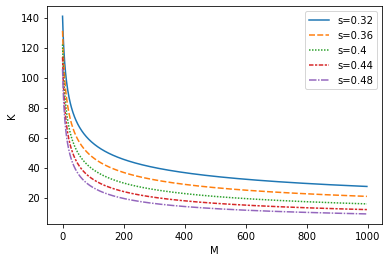

In [183]:
C = 250
M = np.arange(1,1000)
o = 5
K = pd.DataFrame()
i = 0
for s in np.arange(0.32,0.49,0.04):
    K['s='+str(round(s,2))] = C/(M+o)**s
    i+=1

plt.figure
sns.lineplot(data = K)
plt.xlabel('M')
plt.ylabel('K')
#plt.legend()

In [112]:
# only extract the information we need, the loop will be faster
matrix_n['p1_id']=matrix_n['p1_id'].astype(np.int64)
matrix_n['p2_id']=matrix_n['p2_id'].astype(np.int64)
matrix_result = matrix_n[['tourney_name','tourney_date','surface','p1_id','p2_id','p1_win','p2_win']]


C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [113]:
# We start the Elo calculation from 1980
elo_list = pd.Series()
# use set to get the unique player_id
elo_id = set(list(matrix_n.p1_id.unique())+list(matrix_n.p2_id.unique()))

elo_list = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo_list_hard = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo_list_clay = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo_list_grass = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo_list_carpet = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)


for row in matrix_result.itertuples():
    
    index = row.Index
    
   
    surface = row.surface

    p1_id = row.p1_id
    p2_id = row.p2_id

    p1_win = row.p1_win
    p2_win = row.p2_win


    # calculate the total Elo                

    # number of matches played by player 1 and player 2 so far
    M1 = matrix_result[(matrix_result.index<index) & ((matrix_result.p1_id ==p1_id) | (matrix_result.p2_id ==p1_id))].shape[0]
    M2 = matrix_result[(matrix_result.index<index) & ((matrix_result.p1_id ==p2_id) | (matrix_result.p2_id ==p2_id))].shape[0]

    K1=250/((M1+5)**0.4)
    K2=250/((M2+5)**0.4)

    Elo_1 = elo_list[p1_id]
    Elo_2 = elo_list[p2_id] 

    p1_win_pred = 1/(1+10**((Elo_2-Elo_1)/400))
    p2_win_pred = 1/(1+10**((Elo_1-Elo_2)/400))

    matrix_result.loc[index,'Elo_1']=elo_list[p1_id]
    matrix_result.loc[index,'Elo_2']=elo_list[p2_id]

    matrix_result.loc[index,'p1_win_pred']=p1_win_pred
    matrix_result.loc[index,'p2_win_pred']=p2_win_pred

    Elo_1_new = Elo_1+K1*(p1_win-p1_win_pred)
    Elo_2_new = Elo_2+K2*(p2_win-p2_win_pred)

    if Elo_1_new>=0:
        elo_list[p1_id]=Elo_1_new  
    if Elo_2_new>=0:
        elo_list[p2_id]=Elo_2_new          



    # we also calculate the Elo for a particular surface     

    # number of matches played by player 1 and player 2 so far on this surface type
    M1_sf = matrix_result[(matrix_result.index<index) & ((matrix_result.p1_id ==p1_id) | (matrix_result.p2_id ==p1_id)) & (matrix_result.surface==surface)].shape[0]
    M2_sf = matrix_result[(matrix_result.index<index) & ((matrix_result.p1_id ==p2_id) | (matrix_result.p2_id ==p2_id)) & (matrix_result.surface==surface)].shape[0]

    K1_sf=250/((M1_sf+5)**0.4)
    K2_sf=250/((M2_sf+5)**0.4)

    if surface == 'Hard':
        Elo_1_sf = elo_list_hard[p1_id]
        Elo_2_sf = elo_list_hard[p2_id]

        p1_win_pred_sf = 1/(1+10**((Elo_2_sf-Elo_1_sf)/400))
        p2_win_pred_sf = 1/(1+10**((Elo_1_sf-Elo_2_sf)/400))

        matrix_result.loc[index,'Elo_1_hard']=elo_list_hard[p1_id]
        matrix_result.loc[index,'Elo_2_hard']=elo_list_hard[p2_id]

        matrix_result.loc[index,'p1_win_pred_hard']=p1_win_pred_sf
        matrix_result.loc[index,'p2_win_pred_hard']=p2_win_pred_sf

        Elo_1_sf_new = Elo_1_sf+K1_sf*(p1_win-p1_win_pred_sf)
        Elo_2_sf_new = Elo_2_sf+K2_sf*(p2_win-p2_win_pred_sf)

        if Elo_1_sf_new>0:
            elo_list_hard[p1_id]=Elo_1_sf_new                
        if Elo_2_sf_new>0:
            elo_list_hard[p2_id]=Elo_2_sf_new



    elif surface == 'Clay':
        Elo_1_sf = elo_list_clay[p1_id]
        Elo_2_sf = elo_list_clay[p2_id]

        p1_win_pred_sf = 1/(1+10**((Elo_2_sf-Elo_1_sf)/400))
        p2_win_pred_sf = 1/(1+10**((Elo_1_sf-Elo_2_sf)/400))

        matrix_result.loc[index,'Elo_1_clay']=elo_list_clay[p1_id]
        matrix_result.loc[index,'Elo_2_clay']=elo_list_clay[p2_id]

        matrix_result.loc[index,'p1_win_pred_clay']=p1_win_pred_sf
        matrix_result.loc[index,'p2_win_pred_clay']=p2_win_pred_sf

        Elo_1_sf_new = Elo_1_sf+K1_sf*(p1_win-p1_win_pred_sf)
        Elo_2_sf_new = Elo_2_sf+K2_sf*(p2_win-p2_win_pred_sf)

        if Elo_1_sf_new>0:
            elo_list_clay[p1_id]=Elo_1_sf_new                
        if Elo_2_sf_new>0:
            elo_list_clay[p2_id]=Elo_2_sf_new


    elif surface == 'Grass':
        Elo_1_sf = elo_list_grass[p1_id]
        Elo_2_sf = elo_list_grass[p2_id]

        p1_win_pred_sf = 1/(1+10**((Elo_2_sf-Elo_1_sf)/400))
        p2_win_pred_sf = 1/(1+10**((Elo_1_sf-Elo_2_sf)/400))

        matrix_result.loc[index,'Elo_1_grass']=elo_list_grass[p1_id]
        matrix_result.loc[index,'Elo_2_grass']=elo_list_grass[p2_id]

        matrix_result.loc[index,'p1_win_pred_grass']=p1_win_pred_sf
        matrix_result.loc[index,'p2_win_pred_grass']=p2_win_pred_sf

        Elo_1_sf_new = Elo_1_sf+K1_sf*(p1_win-p1_win_pred_sf)
        Elo_2_sf_new = Elo_2_sf+K2_sf*(p2_win-p2_win_pred_sf)

        if Elo_1_sf_new>0:
            elo_list_grass[p1_id]=Elo_1_sf_new                
        if Elo_2_sf_new>0:
            elo_list_grass[p2_id]=Elo_2_sf_new


    elif surface == 'Carpet':
        Elo_1_sf = elo_list_carpet[p1_id]
        Elo_2_sf = elo_list_carpet[p2_id]

        p1_win_pred_sf = 1/(1+10**((Elo_2_sf-Elo_1_sf)/400))
        p2_win_pred_sf = 1/(1+10**((Elo_1_sf-Elo_2_sf)/400))

        matrix_result.loc[index,'Elo_1_carpet']=elo_list_carpet[p1_id]
        matrix_result.loc[index,'Elo_2_carpet']=elo_list_carpet[p2_id]

        matrix_result.loc[index,'p1_win_pred_carpet']=p1_win_pred_sf
        matrix_result.loc[index,'p2_win_pred_carpet']=p2_win_pred_sf

        Elo_1_sf_new = Elo_1_sf+K1_sf*(p1_win-p1_win_pred_sf)
        Elo_2_sf_new = Elo_2_sf+K2_sf*(p2_win-p2_win_pred_sf)

        if Elo_1_sf_new>0:
            elo_list_carpet[p1_id]=Elo_1_sf_new                
        if Elo_2_sf_new>0:
            elo_list_carpet[p2_id]=Elo_2_sf_new

        
    if index%1000 == 0:
        print(index)
    
    

    
    

C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\pandas\core\indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docum

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000
41000
42000
43000
44000
45000
46000
47000
48000
49000
50000
51000
52000
53000
54000
55000
56000
57000
58000
59000
60000
61000
62000
63000
64000
65000
66000
67000
68000
69000
70000
71000
72000
73000
74000
75000
76000
77000
78000
79000
80000
81000
82000
83000
84000
85000
86000
87000
88000
89000
90000
91000
92000
93000
94000
95000
96000
97000
98000
99000
100000
101000
102000
103000
104000
105000
106000
107000
108000
109000
110000
111000
112000
113000
114000
115000
116000
117000
118000
119000
120000
121000
122000
123000
124000
125000
126000
127000
128000
129000
130000
131000
132000
133000
134000
135000


In [234]:
matrix_n.tail()

,tourney_name,surface,draw_size,tourney_level,tourney_date,year,month,day,day_week,match_num,best_of,round,minutes,p1_id,p1_seed,p1_entry,p1_name,p1_hand,p1_ht,p1_ioc,p1_age,p2_id,p2_seed,p2_entry,p2_name,p2_hand,p2_ht,p2_ioc,p2_age,p1_win,p2_win,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_set_1,p1_set_2,p1_set_3,p1_set_4,p1_set_5,...,p2_bpSaved_last_5,p2_bpc_last_5,p2_bpsr_last_5,p2_bpcr_last_5,p2_set_1_last_5,p2_set_2_last_5,p2_set_3_last_5,p2_set_4_last_5,p2_set_5_last_5,p1_win_ratio_last_10,p1_rank_last_10,p1_rank_points_last_10,p1_ace_last_10,p1_df_last_10,p1_svpt_last_10,p1_1stIn_last_10,p1_1stWon_last_10,p1_2ndWon_last_10,p1_SvGms_last_10,p1_bpFaced_last_10,p1_bpSaved_last_10,p1_bpc_last_10,p1_bpsr_last_10,p1_bpcr_last_10,p1_set_1_last_10,p1_set_2_last_10,p1_set_3_last_10,p1_set_4_last_10,p1_set_5_last_10,p2_win_ratio_last_10,p2_rank_last_10,p2_rank_points_last_10,p2_ace_last_10,p2_df_last_10,p2_svpt_last_10,p2_1stIn_last_10,p2_1stWon_last_10,p2_2ndWon_last_10,p2_SvGms_last_10,p2_bpFaced_last_10,p2_bpSaved_last_10,p2_bpc_last_10,p2_bpsr_last_10,p2_bpcr_last_10,p2_set_1_last_10,p2_set_2_last_10,p2_set_3_last_10,p2_set_4_last_10,p2_set_5_last_10,pair_names
62416,Davis Cup WG2 PO: POL vs HKG,Hard,4.0,D,2020-03-06,2020,3,6,4,2.0,3,RR,NaN,105668,NaN,NaN,Jerzy Janowicz,R,203.0,POL,29.300479,106388,NaN,NaN,Pak Long Yeung,U,NaN,HKG,25.045859,1.0,0.0,461.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,7.0,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jerzy Janowicz/Pak Long Yeung
62417,Davis Cup WG2 PO: POL vs HKG,Hard,4.0,D,2020-03-06,2020,3,6,4,4.0,3,RR,NaN,207852,NaN,NaN,Wai Yu Kai,U,NaN,HKG,18.951403,209874,NaN,NaN,Maks Kasnikowski,NaN,NaN,POL,16.657084,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,2.0,3.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Wai Yu Kai/Maks Kasnikowski
62418,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,1.0,3,RR,NaN,200250,NaN,NaN,Mehluli Don Ayanda Sibanda,R,NaN,ZIM,20.320329,208518,NaN,NaN,Hazem Naw,R,NaN,UNK,20.167009,0.0,1.0,813.0,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mehluli Don Ayanda Sibanda/Hazem Naw
62419,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,2.0,3,RR,NaN,111761,NaN,NaN,Benjamin Lock,R,NaN,ZIM,26.995209,200181,NaN,NaN,Amer Naow,R,NaN,SYR,25.166324,1.0,0.0,430.0,79.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Benjamin Lock/Amer Naow
62420,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,4.0,3,RR,NaN,111761,NaN,NaN,Benjamin Lock,R,NaN,ZIM,26.995209,208518,NaN,NaN,Hazem Naw,R,NaN,UNK,20.167009,1.0,0.0,430.0,79.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Benjamin Lock/Hazem Naw


In [114]:
matrix_result['Elo_1_sf']=matrix_result['Elo_1_hard'].fillna(0)+matrix_result['Elo_1_clay'].fillna(0)\
                            +matrix_result['Elo_1_grass'].fillna(0)+matrix_result['Elo_1_carpet'].fillna(0)
matrix_result['Elo_2_sf']=matrix_result['Elo_2_hard'].fillna(0)+matrix_result['Elo_2_clay'].fillna(0)\
                            +matrix_result['Elo_2_grass'].fillna(0)+matrix_result['Elo_2_carpet'].fillna(0)
matrix_result['p1_win_pred_sf']=matrix_result['p1_win_pred_hard'].fillna(0)+matrix_result['p1_win_pred_clay'].fillna(0)\
                            +matrix_result['p1_win_pred_grass'].fillna(0)+matrix_result['p1_win_pred_carpet'].fillna(0)
matrix_result['p2_win_pred_sf']=matrix_result['p2_win_pred_hard'].fillna(0)+matrix_result['p2_win_pred_clay'].fillna(0)\
                            +matrix_result['p2_win_pred_grass'].fillna(0)+matrix_result['p2_win_pred_carpet'].fillna(0)

C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of 

In [236]:
matrix_result

,tourney_name,tourney_date,surface,p1_id,p2_id,p1_win,p2_win,Elo_1,Elo_2,p1_win_pred,p2_win_pred,Elo_1_hard,Elo_2_hard,p1_win_pred_hard,p2_win_pred_hard,Elo_1_clay,Elo_2_clay,p1_win_pred_clay,p2_win_pred_clay,Elo_1_grass,Elo_2_grass,p1_win_pred_grass,p2_win_pred_grass,Elo_1_carpet,Elo_2_carpet,p1_win_pred_carpet,p2_win_pred_carpet,Elo_1_sf,Elo_2_sf,p1_win_pred_sf,p2_win_pred_sf
0,Adelaide,2000-01-03,Hard,102358,103096,1.0,0.0,1500.000000,1500.000000,0.500000,0.500000,1500.000000,1500.000000,0.500000,0.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.000000,1500.000000,0.500000,0.500000
1,Adelaide,2000-01-03,Hard,102533,103819,0.0,1.0,1500.000000,1500.000000,0.500000,0.500000,1500.000000,1500.000000,0.500000,0.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.000000,1500.000000,0.500000,0.500000
2,Adelaide,2000-01-03,Hard,101885,102998,0.0,1.0,1500.000000,1500.000000,0.500000,0.500000,1500.000000,1500.000000,0.500000,0.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.000000,1500.000000,0.500000,0.500000
3,Adelaide,2000-01-03,Hard,102776,103206,0.0,1.0,1500.000000,1500.000000,0.500000,0.500000,1500.000000,1500.000000,0.500000,0.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.000000,1500.000000,0.500000,0.500000
4,Adelaide,2000-01-03,Hard,102401,102796,0.0,1.0,1500.000000,1500.000000,0.500000,0.500000,1500.000000,1500.000000,0.500000,0.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.000000,1500.000000,0.500000,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62416,Davis Cup WG2 PO: POL vs HKG,2020-03-06,Hard,105668,106388,1.0,0.0,1761.439324,1434.336805,0.867950,0.132050,1712.163889,1434.336805,0.831921,0.168079,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1712.163889,1434.336805,0.831921,0.168079
62417,Davis Cup WG2 PO: POL vs HKG,2020-03-06,Hard,207852,209874,0.0,1.0,1435.950478,1500.000000,0.408856,0.591144,1434.932598,1500.000000,0.407440,0.592560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1434.932598,1500.000000,0.407440,0.592560
62418,Davis Cup WG2 PO: SYR vs ZIM,2020-03-06,Hard,200250,208518,0.0,1.0,1384.693573,1500.000000,0.339896,0.660104,1384.693573,1500.000000,0.339896,0.660104,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1384.693573,1500.000000,0.339896,0.660104
62419,Davis Cup WG2 PO: SYR vs ZIM,2020-03-06,Hard,111761,200181,1.0,0.0,1661.449990,1500.000000,0.716950,0.283050,1652.832696,1500.000000,0.706776,0.293224,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1652.832696,1500.000000,0.706776,0.293224


In [115]:
matrix_result.to_pickle("./tennis_Elo_matrix2.pkl")

In [7]:
matrix_result=pd.read_pickle("./tennis_Elo_matrix2.pkl")
matrix_result.columns

Index(['tourney_name', 'tourney_date', 'surface', 'p1_id', 'p2_id', 'p1_win',
       'p2_win', 'Elo_1', 'Elo_2', 'p1_win_pred', 'p2_win_pred', 'Elo_1_hard',
       'Elo_2_hard', 'p1_win_pred_hard', 'p2_win_pred_hard', 'Elo_1_grass',
       'Elo_2_grass', 'p1_win_pred_grass', 'p2_win_pred_grass', 'Elo_1_carpet',
       'Elo_2_carpet', 'p1_win_pred_carpet', 'p2_win_pred_carpet',
       'Elo_1_clay', 'Elo_2_clay', 'p1_win_pred_clay', 'p2_win_pred_clay',
       'Elo_1_sf', 'Elo_2_sf', 'p1_win_pred_sf', 'p2_win_pred_sf'],
      dtype='object')

In [8]:
matrix_result[['p1_id','p2_id']]=matrix_result[['p1_id','p2_id']].astype(np.int64)

[Text(0.5, 0, 'p1_win'),
 Text(1.5, 0, 'p1_win_pred'),
 Text(2.5, 0, 'p1_win_pred_sf'),
 Text(3.5, 0, 'p2_win'),
 Text(4.5, 0, 'p2_win_pred'),
 Text(5.5, 0, 'p2_win_pred_sf')]

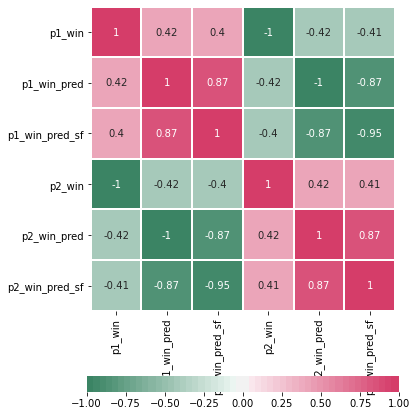

In [117]:
elo_corr = matrix_result[matrix_result.tourney_date>'2010-01-01'][['p1_win','p1_win_pred','p1_win_pred_sf','p2_win','p2_win_pred','p2_win_pred_sf']].corr(method='pearson') 

plt.figure(figsize=(8,8))
ax=sns.heatmap(elo_corr,
            vmin=-1, vmax=1, center=0,
            cmap=sns.diverging_palette(150,0, n=50),
            square=True,
            cbar_kws={'orientation':'horizontal','shrink':0.7},     
            linewidths = 1,
            linecolor = 'white',
            annot=True,  
           # mask=mask_ut,
        )

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='center')

In [118]:
from sklearn.metrics import accuracy_score

date_begin='1990-01-01'

y_true = matrix_result[matrix_result.tourney_date> date_begin].p1_win
y_pred_elo = matrix_result[matrix_result.tourney_date>date_begin].p1_win_pred > matrix_result[matrix_result.tourney_date>date_begin].p2_win_pred
acc_elo = accuracy_score(y_true, y_pred_elo)
print('The accuracy of winner prediction based on Elo is: {}%'.format(round(acc_elo*100,3)))

y_pred_elosf = matrix_result[matrix_result.tourney_date>date_begin].p1_win_pred_sf > matrix_result[matrix_result.tourney_date>date_begin].p2_win_pred_sf
acc_elosf = accuracy_score(y_true, y_pred_elosf)
print('The accuracy of winner prediction based on Elo of surface type is: {}%'.format(round(acc_elosf*100,3)))

The accuracy of winner prediction based on Elo is: 66.219%
The accuracy of winner prediction based on Elo of surface type is: 65.802%


In [121]:
y_pred_20 = matrix_n[matrix_n.tourney_date> date_begin].p1_win_ratio_last_20 > matrix_n[matrix_n.tourney_date>date_begin].p2_win_ratio_last_20
acc_20 = accuracy_score(y_true, y_pred_20)
print('The accuracy of winner prediction based on past 20 competion is: {}%'.format(round(acc_20*100,3)))
 
y_pred_10 = matrix_n[matrix_n.tourney_date>date_begin].p1_win_ratio_last_10 > matrix_n[matrix_n.tourney_date>date_begin].p2_win_ratio_last_10
acc_10 = accuracy_score(y_true, y_pred_10)
print('The accuracy of winner prediction based on past 10 competion is: {}%'.format(round(acc_10*100,3)))

The accuracy of winner prediction based on past 20 competion is: 53.054%
The accuracy of winner prediction based on past 10 competion is: 53.073%


In [122]:
y_pred_rank = matrix_n[matrix_n.tourney_date> date_begin].p1_rank < matrix_n[matrix_n.tourney_date>date_begin].p2_rank
acc_rank = accuracy_score(y_true, y_pred_rank)
print('The accuracy of winner prediction based on player rank is: {}%'.format(round(acc_rank*100,3))) 

y_pred_rankpoint = matrix_n[matrix_n.tourney_date> date_begin].p1_rank_points > matrix_n[matrix_n.tourney_date>date_begin].p2_rank_points
acc_rankpoint = accuracy_score(y_true, y_pred_rankpoint)
print('The accuracy of winner prediction based on player rank is: {}%'.format(round(acc_rankpoint*100,3))) 


The accuracy of winner prediction based on player rank is: 64.36%
The accuracy of winner prediction based on player rank is: 64.22%


In [169]:
# matrix_n.drop(['Elo_1_x', 'Elo_2_x', 'p1_win_pred_x',
#        'p2_win_pred_x', 'Elo_1_hard_x', 'Elo_2_hard_x', 'p1_win_pred_hard_x',
#        'p2_win_pred_hard_x', 'Elo_1_clay_x', 'Elo_2_clay_x',
#        'p1_win_pred_clay_x', 'p2_win_pred_clay_x', 'Elo_1_grass_x',
#        'Elo_2_grass_x', 'p1_win_pred_grass_x', 'p2_win_pred_grass_x',
#        'Elo_1_carpet_x', 'Elo_2_carpet_x', 'p1_win_pred_carpet_x',
#        'p2_win_pred_carpet_x', 'Elo_1_sf_x', 'Elo_2_sf_x', 'p1_win_pred_sf_x',
#        'p2_win_pred_sf_x', 'Elo_1_y', 'Elo_2_y', 'p1_win_pred_y',
#        'p2_win_pred_y', 'Elo_1_hard_y', 'Elo_2_hard_y', 'p1_win_pred_hard_y',
#        'p2_win_pred_hard_y', 'Elo_1_clay_y', 'Elo_2_clay_y',
#        'p1_win_pred_clay_y', 'p2_win_pred_clay_y', 'Elo_1_grass_y',
#        'Elo_2_grass_y', 'p1_win_pred_grass_y', 'p2_win_pred_grass_y',
#        'Elo_1_carpet_y', 'Elo_2_carpet_y', 'p1_win_pred_carpet_y',
#        'p2_win_pred_carpet_y', 'Elo_1_sf_y', 'Elo_2_sf_y', 'p1_win_pred_sf_y',
#        'p2_win_pred_sf_y'],axis = 1,inplace=True)

In [132]:
matrix_n.dtypes

tourney_name                      object
surface                           object
draw_size                        float64
tourney_level                     object
tourney_date              datetime64[ns]
year                               int64
month                              int64
day                                int64
day_week                           int64
match_num                        float64
best_of                            int64
round                             object
minutes                          float64
p1_id                              int64
p1_seed                           object
p1_entry                          object
p1_name                           object
p1_hand                           object
p1_ht                            float64
p1_ioc                            object
p1_age                           float64
p2_id                              int64
p2_seed                           object
p2_entry                          object
p2_name         

In [3]:
matrix_n['win_ratio_1-2_last_10']=matrix_n['p1_win_ratio_last_10']-matrix_n['p2_win_ratio_last_10']
matrix_n['win_ratio_1-2_last_20']=matrix_n['p1_win_ratio_last_20']-matrix_n['p2_win_ratio_last_20']

In [10]:
matrix_n0=matrix_n.copy()


In [124]:
print(len(matrix),len(matrix_n),len(matrix_result))

135825 135825 135825


In [9]:
matrix_n=matrix_n0.copy()
matrix_n.head()

NameError: name 'matrix_n0' is not defined

In [141]:
matrix_n0.head()

,tourney_name,surface,draw_size,tourney_level,tourney_date,year,month,day,day_week,match_num,best_of,round,minutes,p1_id,p1_seed,p1_entry,p1_name,p1_hand,p1_ht,p1_ioc,p1_age,p2_id,p2_seed,p2_entry,p2_name,p2_hand,p2_ht,p2_ioc,p2_age,p1_win,p2_win,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_set_1,p1_set_2,p1_set_3,p1_set_4,p1_set_5,...,p2_bpSaved_last_20,p2_bpc_last_20,p2_bpsr_last_20,p2_bpcr_last_20,p2_set_1_last_20,p2_set_2_last_20,p2_set_3_last_20,p2_set_4_last_20,p2_set_5_last_20,p1_win_ratio_last_10,p1_rank_last_10,p1_rank_points_last_10,p1_ace_last_10,p1_df_last_10,p1_svpt_last_10,p1_1stIn_last_10,p1_1stWon_last_10,p1_2ndWon_last_10,p1_SvGms_last_10,p1_bpFaced_last_10,p1_bpSaved_last_10,p1_bpc_last_10,p1_bpsr_last_10,p1_bpcr_last_10,p1_set_1_last_10,p1_set_2_last_10,p1_set_3_last_10,p1_set_4_last_10,p1_set_5_last_10,p2_win_ratio_last_10,p2_rank_last_10,p2_rank_points_last_10,p2_ace_last_10,p2_df_last_10,p2_svpt_last_10,p2_1stIn_last_10,p2_1stWon_last_10,p2_2ndWon_last_10,p2_SvGms_last_10,p2_bpFaced_last_10,p2_bpSaved_last_10,p2_bpc_last_10,p2_bpsr_last_10,p2_bpcr_last_10,p2_set_1_last_10,p2_set_2_last_10,p2_set_3_last_10,p2_set_4_last_10,p2_set_5_last_10,pair_names
0,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,1.0,3,R32,NaN,100315,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,6.0,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Hank Pfister/John Fitzgerald
1,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,2.0,3,R32,NaN,100397,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,7.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Terry Rocavert/Glenn Petrovic
2,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,3.0,3,R32,NaN,100265,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,107328,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cliff Letcher/Jeremy Cohen
3,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,4.0,3,R32,NaN,100121,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,5.0,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Raymond Moore/Brad Guan
4,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,5.0,3,R32,NaN,100337,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mark Edmondson/Greg Whitecross


In [11]:
# merge the matrix_result with matrix_n
#matrix_result[['p1_id','p2_id']]=matrix_result[['p1_id','p2_id']].astype(str)
col_result = ['Elo_1', 'Elo_2', 'p1_win_pred', 'p2_win_pred', 'Elo_1_hard',
       'Elo_2_hard', 'p1_win_pred_hard', 'p2_win_pred_hard', 'Elo_1_clay',
       'Elo_2_clay', 'p1_win_pred_clay', 'p2_win_pred_clay', 'Elo_1_grass',
       'Elo_2_grass', 'p1_win_pred_grass', 'p2_win_pred_grass', 'Elo_1_carpet',
       'Elo_2_carpet', 'p1_win_pred_carpet', 'p2_win_pred_carpet', 'Elo_1_sf',
       'Elo_2_sf', 'p1_win_pred_sf', 'p2_win_pred_sf']

matrix_n = pd.merge(matrix_n,matrix_result[col_result], on=matrix_n.index,how='left')
matrix_n.tail()

,key_0,tourney_name,surface,draw_size,tourney_level,tourney_date,year,month,day,day_week,match_num,best_of,round,minutes,p1_id,p1_seed,p1_entry,p1_name,p1_hand,p1_ht,p1_ioc,p1_age,p2_id,p2_seed,p2_entry,p2_name,p2_hand,p2_ht,p2_ioc,p2_age,p1_win,p2_win,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_set_1,p1_set_2,p1_set_3,p1_set_4,...,p1_set_1_last_10,p1_set_2_last_10,p1_set_3_last_10,p1_set_4_last_10,p1_set_5_last_10,p2_win_ratio_last_10,p2_rank_last_10,p2_rank_points_last_10,p2_ace_last_10,p2_df_last_10,p2_svpt_last_10,p2_1stIn_last_10,p2_1stWon_last_10,p2_2ndWon_last_10,p2_SvGms_last_10,p2_bpFaced_last_10,p2_bpSaved_last_10,p2_bpc_last_10,p2_bpsr_last_10,p2_bpcr_last_10,p2_set_1_last_10,p2_set_2_last_10,p2_set_3_last_10,p2_set_4_last_10,p2_set_5_last_10,pair_names,Elo_1,Elo_2,p1_win_pred,p2_win_pred,Elo_1_hard,Elo_2_hard,p1_win_pred_hard,p2_win_pred_hard,Elo_1_clay,Elo_2_clay,p1_win_pred_clay,p2_win_pred_clay,Elo_1_grass,Elo_2_grass,p1_win_pred_grass,p2_win_pred_grass,Elo_1_carpet,Elo_2_carpet,p1_win_pred_carpet,p2_win_pred_carpet,Elo_1_sf,Elo_2_sf,p1_win_pred_sf,p2_win_pred_sf
135820,135820,Davis Cup WG2 PO: POL vs HKG,Hard,4.0,D,2020-03-06,2020,3,6,4,2.0,3,RR,NaN,105668.0,NaN,NaN,Jerzy Janowicz,R,203.0,POL,29.300479,106388.0,NaN,NaN,Pak Long Yeung,U,NaN,HKG,25.045859,1.0,0.0,461.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,7.0,6.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jerzy Janowicz/Pak Long Yeung,1843.971903,1434.336805,0.913572,0.086428,1765.792699,1434.336805,0.870796,0.129204,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1765.792699,1434.336805,0.870796,0.129204
135821,135821,Davis Cup WG2 PO: POL vs HKG,Hard,4.0,D,2020-03-06,2020,3,6,4,4.0,3,RR,NaN,207852.0,NaN,NaN,Wai Yu Kai,U,NaN,HKG,18.951403,209874.0,NaN,NaN,Maks Kasnikowski,NaN,NaN,POL,16.657084,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,2.0,3.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Wai Yu Kai/Maks Kasnikowski,1438.768291,1500.000000,0.412782,0.587218,1436.913519,1500.000000,0.410196,0.589804,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1436.913519,1500.000000,0.410196,0.589804
135822,135822,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,1.0,3,RR,NaN,200250.0,NaN,NaN,Mehluli Don Ayanda Sibanda,R,NaN,ZIM,20.320329,208518.0,NaN,NaN,Hazem Naw,R,NaN,UNK,20.167009,0.0,1.0,813.0,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mehluli Don Ayanda Sibanda/Hazem Naw,1384.693573,1500.000000,0.339896,0.660104,1384.693573,1500.000000,0.339896,0.660104,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1384.693573,1500.000000,0.339896,0.660104
135823,135823,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,2.0,3,RR,NaN,111761.0,NaN,NaN,Benjamin Lock,R,NaN,ZIM,26.995209,200181.0,NaN,NaN,Amer Naow,R,NaN,SYR,25.166324,1.0,0.0,430.0,79.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Benjamin Lock/Amer Naow,1687.229998,1500.000000,0.746074,0.253926,1667.369516,1500.000000,0.723813,0.276187,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1667.369516,1500.000000,0.723813,0.276187
135824,135824,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,4.0,3,RR,NaN,111761.0,NaN,NaN,Benjamin Lock,R,NaN,ZIM,26.995209,208518.0,NaN,NaN,Hazem Naw,R,NaN,UNK,20.167009,1.0,0.0,430.0,79.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Benjamin Lock/Hazem Naw,1709.984621,1544.637331,0.721480,0.278520,1692.118959,1544.637331,0.700352,0.299648,Na

In [194]:
matrix_result.tail()

,tourney_name,tourney_date,surface,p1_id,p2_id,p1_win,p2_win,Elo_1,Elo_2,p1_win_pred,p2_win_pred,Elo_1_hard,Elo_2_hard,p1_win_pred_hard,p2_win_pred_hard,Elo_1_clay,Elo_2_clay,p1_win_pred_clay,p2_win_pred_clay,Elo_1_grass,Elo_2_grass,p1_win_pred_grass,p2_win_pred_grass,Elo_1_carpet,Elo_2_carpet,p1_win_pred_carpet,p2_win_pred_carpet,Elo_1_sf,Elo_2_sf,p1_win_pred_sf,p2_win_pred_sf
62514,Davis Cup WG2 PO: POL vs HKG,2020-03-06,Hard,105668.0,106388.0,1.0,0.0,1761.632337,1434.336805,0.868077,0.131923,1712.349077,1434.336805,0.832070,0.167930,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1712.349077,1434.336805,0.832070,0.167930
62515,Davis Cup WG2 PO: POL vs HKG,2020-03-06,Hard,207852.0,209874.0,0.0,1.0,1435.958598,1500.000000,0.408867,0.591133,1434.934748,1500.000000,0.407443,0.592557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1434.934748,1500.000000,0.407443,0.592557
62516,Davis Cup WG2 PO: SYR vs ZIM,2020-03-06,Hard,200250.0,208518.0,0.0,1.0,1384.693573,1500.000000,0.339896,0.660104,1384.693573,1500.000000,0.339896,0.660104,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1384.693573,1500.000000,0.339896,0.660104
62517,Davis Cup WG2 PO: SYR vs ZIM,2020-03-06,Hard,111761.0,200181.0,1.0,0.0,1661.421064,1500.000000,0.716916,0.283084,1652.700109,1500.000000,0.706618,0.293382,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1652.700109,1500.000000,0.706618,0.293382
62518,Davis Cup WG2 PO: SYR vs ZIM,2020-03-06,Hard,111761.0,208518.0,1.0,0.0,1686.788595,1544.637331,0.693873,0.306127,1678.990486,1544.637331,0.684256,0.315744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1678.990486,1544.637331,0.684256,0.315744


In [176]:
matrix_result.dtypes

tourney_name                  object
tourney_date          datetime64[ns]
surface                       object
p1_id                        float64
p2_id                        float64
p1_win                       float64
p2_win                       float64
Elo_1                        float64
Elo_2                        float64
p1_win_pred                  float64
p2_win_pred                  float64
Elo_1_hard                   float64
Elo_2_hard                   float64
p1_win_pred_hard             float64
p2_win_pred_hard             float64
Elo_1_clay                   float64
Elo_2_clay                   float64
p1_win_pred_clay             float64
p2_win_pred_clay             float64
Elo_1_grass                  float64
Elo_2_grass                  float64
p1_win_pred_grass            float64
p2_win_pred_grass            float64
Elo_1_carpet                 float64
Elo_2_carpet                 float64
p1_win_pred_carpet           float64
p2_win_pred_carpet           float64
E

In [12]:
# create features for difference
matrix_n['Elo_1-2']=matrix_n['Elo_1']-matrix_n['Elo_2']
matrix_n['Elo_sf_1-2']=matrix_n['Elo_1_sf']-matrix_n['Elo_2_sf']
matrix_n['win_pred_1-2']=matrix_n['p1_win_pred']-matrix_n['p2_win_pred']
matrix_n['win_pred_sf_1-2']=matrix_n['p1_win_pred_sf']-matrix_n['p2_win_pred_sf']
matrix_n['age_1-2']=matrix_n['p1_age']-matrix_n['p2_age']
matrix_n['ht_1-2']=matrix_n['p1_ht']-matrix_n['p2_ht']
matrix_n['rank_1-2']=matrix_n['p1_rank']-matrix_n['p2_rank']
matrix_n['rankpoint_1-2']=matrix_n['p1_rank_points']-matrix_n['p2_rank_points']

matrix_n['ace_1-2_last_20']=matrix_n['p1_ace_last_20']-matrix_n['p2_ace_last_20']
matrix_n['ace_1-2_last_10']=matrix_n['p1_ace_last_10']-matrix_n['p2_ace_last_10']

matrix_n['bpc_1-2_last_20']=matrix_n['p1_bpc_last_20']-matrix_n['p2_bpc_last_20']
matrix_n['bpc_1-2_last_10']=matrix_n['p1_bpc_last_10']-matrix_n['p2_bpc_last_10']

matrix_n['bps_1-2_last_20']=matrix_n['p1_bpSaved_last_20']-matrix_n['p2_bpSaved_last_20']
matrix_n['bps_1-2_last_10']=matrix_n['p1_bpSaved_last_10']-matrix_n['p2_bpSaved_last_10']

matrix_n['df_1-2_last_20']=matrix_n['p1_df_last_20']-matrix_n['p2_df_last_20']
matrix_n['df_1-2_last_10']=matrix_n['p1_df_last_10']-matrix_n['p2_df_last_10']

matrix_n['bpsr_1-2_last_20']=matrix_n['p1_bpsr_last_20']-matrix_n['p2_bpsr_last_20']
matrix_n['bpsr_1-2_last_10']=matrix_n['p1_bpsr_last_10']-matrix_n['p2_bpsr_last_10']

matrix_n['bpcr_1-2_last_20']=matrix_n['p1_bpcr_last_20']-matrix_n['p2_bpcr_last_20']
matrix_n['bpcr_1-2_last_10']=matrix_n['p1_bpcr_last_10']-matrix_n['p2_bpcr_last_10']

matrix_n['1stWon_1-2_last_20']=matrix_n['p1_1stWon_last_20']-matrix_n['p2_1stWon_last_20']
matrix_n['1stWon_1-2_last_10']=matrix_n['p1_1stWon_last_10']-matrix_n['p2_1stWon_last_10']

matrix_n['2ndWon_1-2_last_20']=matrix_n['p1_2ndWon_last_20']-matrix_n['p2_2ndWon_last_20']
matrix_n['2ndWon_1-2_last_10']=matrix_n['p1_2ndWon_last_10']-matrix_n['p2_2ndWon_last_10']

In [ ]:
matrix_n['2ndWon_1-2_last_20']=matrix_n['p1_2ndWon_last_20']-matrix_n['p2_2ndWon_last_20']
matrix_n['2ndWon_1-2_last_10']=matrix_n['p1_2ndWon_last_10']-matrix_n['p2_2ndWon_last_10']

In [13]:
# we need to convert the player seed information as something quantifiable
matrix_n['p1_seed_code'] = matrix_n['p1_seed'].map(lambda x: float(x) if x.isdigit() else 0, na_action = 'ignore')
matrix_n['p2_seed_code'] = matrix_n['p2_seed'].map(lambda x: float(x) if x.isdigit() else 0, na_action = 'ignore')

matrix_n['p1_seed_code'] = matrix_n['p1_seed_code']+matrix_n['draw_size']*(matrix_n['p1_seed_code']==0)  
matrix_n['p2_seed_code'] = matrix_n['p2_seed_code']+matrix_n['draw_size']*(matrix_n['p2_seed_code']==0) 
matrix_n.head()

,key_0,tourney_name,surface,draw_size,tourney_level,tourney_date,year,month,day,day_week,match_num,best_of,round,minutes,p1_id,p1_seed,p1_entry,p1_name,p1_hand,p1_ht,p1_ioc,p1_age,p2_id,p2_seed,p2_entry,p2_name,p2_hand,p2_ht,p2_ioc,p2_age,p1_win,p2_win,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_set_1,p1_set_2,p1_set_3,p1_set_4,...,Elo_1,Elo_2,p1_win_pred,p2_win_pred,Elo_1_hard,Elo_2_hard,p1_win_pred_hard,p2_win_pred_hard,Elo_1_clay,Elo_2_clay,p1_win_pred_clay,p2_win_pred_clay,Elo_1_grass,Elo_2_grass,p1_win_pred_grass,p2_win_pred_grass,Elo_1_carpet,Elo_2_carpet,p1_win_pred_carpet,p2_win_pred_carpet,Elo_1_sf,Elo_2_sf,p1_win_pred_sf,p2_win_pred_sf,Elo_1-2,Elo_sf_1-2,win_pred_1-2,win_pred_sf_1-2,age_1-2,ht_1-2,rank_1-2,rankpoint_1-2,ace_1-2_last_20,ace_1-2_last_10,bpc_1-2_last_20,bpc_1-2_last_10,bps_1-2_last_20,bps_1-2_last_10,df_1-2_last_20,df_1-2_last_10,bpsr_1-2_last_20,bpsr_1-2_last_10,bpcr_1-2_last_20,bpcr_1-2_last_10,1stWon_1-2_last_20,1stWon_1-2_last_10,2ndWon_1-2_last_20,2ndWon_1-2_last_10,p1_seed_code,p2_seed_code
0,0,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,1.0,3,R32,NaN,100315.0,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713.0,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,6.0,6.0,NaN,...,1500.0,1500.0,0.5,0.5,1500.0,1500.0,0.5,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.0,1500.0,0.5,0.5,0.0,0.0,0.0,0.0,7.219713,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
1,1,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,2.0,3,R32,NaN,100397.0,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473.0,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,7.0,NaN,NaN,...,1500.0,1500.0,0.5,0.5,1500.0,1500.0,0.5,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.0,1500.0,0.5,0.5,0.0,0.0,0.0,0.0,1.366188,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,3.0,3,R32,NaN,100265.0,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,107328.0,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,3.0,NaN,NaN,...,1500.0,1500.0,0.5,0.5,1500.0,1500.0,0.5,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.0,1500.0,0.5,0.5,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,4.0,3,R32,NaN,100121.0,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550.0,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,5.0,6.0,NaN,...,1500.0,1500.0,0.5,0.5,1500.0,1500.0,0.5,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.0,1500.0,0.5,0.5,0.0,0.0,0.0,0.0,11.876797,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN
4,4,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,5.0,3,R32,NaN,100337.0,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726.0,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,...,1500.0,1500.0,0.5,0.5,1500.0,1500.0,0.5,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1500.0,1500.0,0.5,0.5,0.0,0.0,0.0,0.0,6.724162,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN


In [14]:
matrix_n['seed_code_1-2']=matrix_n['p1_seed_code']-matrix_n['p2_seed_code']

In [15]:
matrix_n.to_pickle("./tennis_matrix2_n_elo.pkl")

Adding the winning rate and tech data of the player in all matches over the past 6 month, also add Elo with a slightly adjustment of the calculation of K, with s = 0.38 and s=0.42 instead of s=0.4. 

In [186]:
matrix_result = matrix_n[['tourney_name','tourney_date','surface','p1_id','p2_id','p1_win','p2_win',
                          'p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr',
                          'p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].replace([np.inf, -np.inf], np.nan)

col_p1p2_perf_4m = ['win_1-2_4m','ace_1-2_4m','df_1-2_4m','1stWon_1-2_4m','2ndWon_1-2_4m','bpsr_1-2_4m','bpcr_1-2_4m']
col_p1p2_perf_8m = ['win_1-2_8m','ace_1-2_8m','df_1-2_8m','1stWon_1-2_8m','2ndWon_1-2_8m','bpsr_1-2_8m','bpcr_1-2_8m']

for col in col_p1p2_perf_4m:
    matrix_result[col]=0
    
for col in col_p1p2_perf_8m:
    matrix_result[col]=0
    
matrix_result.head()

,tourney_name,tourney_date,surface,p1_id,p2_id,p1_win,p2_win,p1_ace,p1_df,p1_1stWon,p1_2ndWon,p1_bpsr,p1_bpcr,p2_ace,p2_df,p2_1stWon,p2_2ndWon,p2_bpsr,p2_bpcr,win_1-2_4m,ace_1-2_4m,df_1-2_4m,1stWon_1-2_4m,2ndWon_1-2_4m,bpsr_1-2_4m,bpcr_1-2_4m,win_1-2_8m,ace_1-2_8m,df_1-2_8m,1stWon_1-2_8m,2ndWon_1-2_8m,bpsr_1-2_8m,bpcr_1-2_8m
0,Hobart,1979-12-31,Hard,100315.0,100713.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Hobart,1979-12-31,Hard,100397.0,100473.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Hobart,1979-12-31,Hard,100265.0,107328.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Hobart,1979-12-31,Hard,100121.0,100550.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Hobart,1979-12-31,Hard,100337.0,100726.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [26]:
from datetime import timedelta

In [191]:
# We start the Elo calculation from 1980
elo_list = pd.Series()
# use set to get the unique player_id
elo_id = set(list(matrix_n.p1_id.unique())+list(matrix_n.p2_id.unique()))

elo1_list = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo1_list_hard = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo1_list_clay = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo1_list_grass = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo1_list_carpet = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)

elo2_list = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo2_list_hard = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo2_list_clay = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo2_list_grass = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)
elo2_list_carpet = pd.Series(data = np.ones(len(elo_id))*1500, index=elo_id)

s1 = 0.48
s2 = 0.32

for row in matrix_result.itertuples():
    
    index = row.Index
    
    date = row.tourney_date
    surface = row.surface

    p1_id = row.p1_id
    p2_id = row.p2_id

    p1_win = row.p1_win
    p2_win = row.p2_win


    # calculate the total Elo1 with s=0.42 and Elo2 with s=0.38                

    # number of matches played by player 1 and player 2 so far
    M1 = matrix_result[(matrix_result.index<index) & ((matrix_result.p1_id ==p1_id) | (matrix_result.p2_id ==p1_id))].shape[0]
    M2 = matrix_result[(matrix_result.index<index) & ((matrix_result.p1_id ==p2_id) | (matrix_result.p2_id ==p2_id))].shape[0]

    K1_1=250/((M1+5)**s1)
    K2_1=250/((M2+5)**s1)    
    K1_2=250/((M1+5)**s2)
    K2_2=250/((M2+5)**s2)

    Elo1_1 = elo1_list[p1_id]
    Elo1_2 = elo1_list[p2_id]     
    Elo2_1 = elo2_list[p1_id]
    Elo2_2 = elo2_list[p2_id] 

    p1_win_pred1 = 1/(1+10**((Elo1_2-Elo1_1)/400))
    p2_win_pred1 = 1/(1+10**((Elo1_1-Elo1_2)/400))    
    p1_win_pred2 = 1/(1+10**((Elo2_2-Elo2_1)/400))
    p2_win_pred2 = 1/(1+10**((Elo2_1-Elo2_2)/400))

    matrix_result.loc[index,'Elo3_1']=elo1_list[p1_id]
    matrix_result.loc[index,'Elo3_2']=elo1_list[p2_id]    
    matrix_result.loc[index,'Elo4_1']=elo2_list[p1_id]
    matrix_result.loc[index,'Elo4_2']=elo2_list[p2_id]

    matrix_result.loc[index,'p1_win_pred3']=p1_win_pred1
    matrix_result.loc[index,'p2_win_pred3']=p2_win_pred1    
    matrix_result.loc[index,'p1_win_pred4']=p1_win_pred2
    matrix_result.loc[index,'p2_win_pred4']=p2_win_pred2

    Elo1_1_new = Elo1_1+K1_1*(p1_win-p1_win_pred1)
    Elo1_2_new = Elo1_2+K2_1*(p2_win-p2_win_pred1)    
    Elo2_1_new = Elo2_1+K1_2*(p1_win-p1_win_pred2)
    Elo2_2_new = Elo2_2+K2_2*(p2_win-p2_win_pred2)
    

    if Elo1_1_new>=0:
        elo1_list[p1_id]=Elo1_1_new  
    if Elo1_2_new>=0:
        elo1_list[p2_id]=Elo1_2_new        
    if Elo2_1_new>=0:
        elo2_list[p1_id]=Elo2_1_new  
    if Elo2_2_new>=0:
        elo2_list[p2_id]=Elo2_2_new


    # we also calculate the Elo for a particular surface     

    # number of matches played by player 1 and player 2 so far on this surface type
    M1_sf = matrix_result[(matrix_result.index<index) & ((matrix_result.p1_id ==p1_id) | (matrix_result.p2_id ==p1_id)) & (matrix_result.surface==surface)].shape[0]
    M2_sf = matrix_result[(matrix_result.index<index) & ((matrix_result.p1_id ==p2_id) | (matrix_result.p2_id ==p2_id)) & (matrix_result.surface==surface)].shape[0]

    K1_sf_1=250/((M1_sf+5)**s1)
    K2_sf_1=250/((M2_sf+5)**s1)    
    K1_sf_2=250/((M1_sf+5)**s2)
    K2_sf_2=250/((M2_sf+5)**s2)

    if surface == 'Hard':
        Elo1_1_sf = elo1_list_hard[p1_id]
        Elo1_2_sf = elo1_list_hard[p2_id]
        Elo2_1_sf = elo2_list_hard[p1_id]
        Elo2_2_sf = elo2_list_hard[p2_id]
        
    elif surface == 'Clay':
        Elo1_1_sf = elo1_list_clay[p1_id]
        Elo1_2_sf = elo1_list_clay[p2_id]
        Elo2_1_sf = elo2_list_clay[p1_id]
        Elo2_2_sf = elo2_list_clay[p2_id]
        
    elif surface == 'Grass':
        Elo1_1_sf = elo1_list_grass[p1_id]
        Elo1_2_sf = elo1_list_grass[p2_id]
        Elo2_1_sf = elo2_list_grass[p1_id]
        Elo2_2_sf = elo2_list_grass[p2_id]
        
    elif surface == 'Carpet':
        Elo1_1_sf = elo1_list_carpet[p1_id]
        Elo1_2_sf = elo1_list_carpet[p2_id]
        Elo2_1_sf = elo2_list_carpet[p1_id]
        Elo2_2_sf = elo2_list_carpet[p2_id]
        
 
    p1_win_pred1_sf = 1/(1+10**((Elo1_2_sf-Elo1_1_sf)/400))
    p2_win_pred1_sf = 1/(1+10**((Elo1_1_sf-Elo1_2_sf)/400))
    p1_win_pred2_sf = 1/(1+10**((Elo2_2_sf-Elo2_1_sf)/400))
    p2_win_pred2_sf = 1/(1+10**((Elo2_1_sf-Elo2_2_sf)/400))

    matrix_result.loc[index,'Elo3_1_sf']=Elo1_1_sf
    matrix_result.loc[index,'Elo3_2_sf']=Elo1_2_sf
    matrix_result.loc[index,'Elo4_1_sf']=Elo2_1_sf
    matrix_result.loc[index,'Elo4_2_sf']=Elo2_2_sf

    matrix_result.loc[index,'p1_win_pred3_sf']=p1_win_pred1_sf
    matrix_result.loc[index,'p2_win_pred3_sf']=p2_win_pred1_sf
    matrix_result.loc[index,'p1_win_pred4_sf']=p1_win_pred2_sf
    matrix_result.loc[index,'p2_win_pred4_sf']=p2_win_pred2_sf

    Elo1_1_sf_new = Elo1_1_sf+K1_sf_1*(p1_win-p1_win_pred1_sf)
    Elo1_2_sf_new = Elo1_2_sf+K2_sf_1*(p2_win-p2_win_pred1_sf)
    Elo2_1_sf_new = Elo2_1_sf+K1_sf_2*(p1_win-p1_win_pred2_sf)
    Elo2_2_sf_new = Elo2_2_sf+K2_sf_2*(p2_win-p2_win_pred2_sf)

    
    if surface == 'Hard':
        elo1_list_hard[p1_id]=Elo1_1_sf_new 
        elo1_list_hard[p2_id]=Elo1_2_sf_new
        elo2_list_hard[p1_id]=Elo2_1_sf_new 
        elo2_list_hard[p2_id]=Elo2_2_sf_new
        
    elif surface == 'Clay':          
        elo1_list_clay[p1_id]=Elo1_1_sf_new 
        elo1_list_clay[p2_id]=Elo1_2_sf_new
        elo2_list_clay[p1_id]=Elo2_1_sf_new 
        elo2_list_clay[p2_id]=Elo2_2_sf_new
        
    elif surface == 'Grass':          
        elo1_list_grass[p1_id]=Elo1_1_sf_new 
        elo1_list_grass[p2_id]=Elo1_2_sf_new
        elo2_list_grass[p1_id]=Elo2_1_sf_new 
        elo2_list_grass[p2_id]=Elo2_2_sf_new
        
    elif surface == 'Carpet':          
        elo1_list_carpet[p1_id]=Elo1_1_sf_new 
        elo1_list_carpet[p2_id]=Elo1_2_sf_new
        elo2_list_carpet[p1_id]=Elo2_1_sf_new 
        elo2_list_carpet[p2_id]=Elo2_2_sf_new


#################### averaged performance over the past 4 months
    
    
    p1_perf_1 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=122))&(matrix_result.index<index)
                            & (matrix_result.p1_id ==p1_id)][['p1_win','p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr']].sum().to_numpy()
    
    p1_perf_2 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=122))&(matrix_result.index<index)
                            & (matrix_result.p2_id ==p1_id)][['p2_win','p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].sum().to_numpy()
    
    p2_perf_1 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=122))&(matrix_result.index<index)
                            & (matrix_result.p1_id ==p2_id)][['p1_win','p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr']].sum().to_numpy()
    
    p2_perf_2 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=122))&(matrix_result.index<index)
                            & (matrix_result.p2_id ==p2_id)][['p2_win','p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].sum().to_numpy()
    
    
    matrix_result.loc[index,col_p1p2_perf_4m] = (p1_perf_1+p1_perf_2) - (p2_perf_1+p2_perf_2)

#################### averaged performance over the past 8 months    
    
    p1_perf_1 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=244))&(matrix_result.index<index)
                            & (matrix_result.p1_id ==p1_id)][['p1_win','p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr']].sum().to_numpy()
    
    p1_perf_2 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=244))&(matrix_result.index<index)
                            & (matrix_result.p2_id ==p1_id)][['p2_win','p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].sum().to_numpy()
    
    p2_perf_1 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=244))&(matrix_result.index<index)
                            & (matrix_result.p1_id ==p2_id)][['p1_win','p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr']].sum().to_numpy()
    
    p2_perf_2 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=244))&(matrix_result.index<index)
                            & (matrix_result.p2_id ==p2_id)][['p2_win','p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].sum().to_numpy()
    
    
    matrix_result.loc[index,col_p1p2_perf_8m] = (p1_perf_1+p1_perf_2) - (p2_perf_1+p2_perf_2)
    
    
    if index%(len(matrix_result)/20) == 0:
        print(index)
    
    

    

C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  


0
5000
10000
15000
20000
25000
30000
35000
40000
45000
50000
55000
60000
65000
70000
75000
80000
85000
90000
95000
100000
105000
110000
115000
120000
125000
130000
135000


In [24]:
# add the short term average

matrix_result = matrix_n[['tourney_name','tourney_date','surface','p1_id','p2_id','p1_win','p2_win',
                          'p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr',
                          'p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].replace([np.inf, -np.inf], np.nan)

col_p1_perf_4m = ['win_1_4m','ace_1_4m','df_1_4m','1stWon_1_4m','2ndWon_1_4m','bpsr_1_4m','bpcr_1_4m']
col_p1_perf_6m = ['win_1_6m','ace_1_6m','df_1_6m','1stWon_1_6m','2ndWon_1_6m','bpsr_1_6m','bpcr_1_6m']
col_p1_perf_8m = ['win_1_8m','ace_1_8m','df_1_8m','1stWon_1_8m','2ndWon_1_8m','bpsr_1_8m','bpcr_1_8m']

col_p2_perf_4m = ['win_2_4m','ace_2_4m','df_2_4m','1stWon_2_4m','2ndWon_2_4m','bpsr_2_4m','bpcr_2_4m']
col_p2_perf_6m = ['win_2_6m','ace_2_6m','df_2_6m','1stWon_2_6m','2ndWon_2_6m','bpsr_2_6m','bpcr_2_6m']
col_p2_perf_8m = ['win_2_8m','ace_2_8m','df_2_8m','1stWon_2_8m','2ndWon_2_8m','bpsr_2_8m','bpcr_2_8m']

for col in col_p1_perf_4m:
    matrix_result[col]=0
    
for col in col_p1_perf_6m:
    matrix_result[col]=0
    
for col in col_p1_perf_8m:
    matrix_result[col]=0
    
for col in col_p2_perf_4m:
    matrix_result[col]=0
    
for col in col_p2_perf_6m:
    matrix_result[col]=0
    
for col in col_p2_perf_8m:
    matrix_result[col]=0
    
matrix_result.head()

,tourney_name,tourney_date,surface,p1_id,p2_id,p1_win,p2_win,p1_ace,p1_df,p1_1stWon,p1_2ndWon,p1_bpsr,p1_bpcr,p2_ace,p2_df,p2_1stWon,p2_2ndWon,p2_bpsr,p2_bpcr,win_1_4m,ace_1_4m,df_1_4m,1stWon_1_4m,2ndWon_1_4m,bpsr_1_4m,bpcr_1_4m,win_1_6m,ace_1_6m,df_1_6m,1stWon_1_6m,2ndWon_1_6m,bpsr_1_6m,bpcr_1_6m,win_1_8m,ace_1_8m,df_1_8m,1stWon_1_8m,2ndWon_1_8m,bpsr_1_8m,bpcr_1_8m,win_2_4m,ace_2_4m,df_2_4m,1stWon_2_4m,2ndWon_2_4m,bpsr_2_4m,bpcr_2_4m,win_2_6m,ace_2_6m,df_2_6m,1stWon_2_6m,2ndWon_2_6m,bpsr_2_6m,bpcr_2_6m,win_2_8m,ace_2_8m,df_2_8m,1stWon_2_8m,2ndWon_2_8m,bpsr_2_8m,bpcr_2_8m
0,Hobart,1979-12-31,Hard,100315.0,100713.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Hobart,1979-12-31,Hard,100397.0,100473.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Hobart,1979-12-31,Hard,100265.0,107328.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Hobart,1979-12-31,Hard,100121.0,100550.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Hobart,1979-12-31,Hard,100337.0,100726.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [27]:
 

for row in matrix_result.itertuples():
    
    index = row.Index
    
    date = row.tourney_date
     
    p1_id = row.p1_id
    p2_id = row.p2_id

    p1_win = row.p1_win
    p2_win = row.p2_win


  #################### averaged performance over the past 4 months
    
    
    p1_perf_1 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=122))&(matrix_result.index<index)
                            & (matrix_result.p1_id ==p1_id)][['p1_win','p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr']].sum().to_numpy()
    
    p1_perf_2 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=122))&(matrix_result.index<index)
                            & (matrix_result.p2_id ==p1_id)][['p2_win','p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].sum().to_numpy()
    
    p2_perf_1 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=122))&(matrix_result.index<index)
                            & (matrix_result.p1_id ==p2_id)][['p1_win','p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr']].sum().to_numpy()
    
    p2_perf_2 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=122))&(matrix_result.index<index)
                            & (matrix_result.p2_id ==p2_id)][['p2_win','p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].sum().to_numpy()
    
    
    matrix_result.loc[index,col_p1_perf_4m] = (p1_perf_1+p1_perf_2)
    matrix_result.loc[index,col_p2_perf_4m] = (p2_perf_1+p2_perf_2)
   

    #################### averaged performance over the past 6 months
    
    
    p1_perf_1 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=184))&(matrix_result.index<index)
                            & (matrix_result.p1_id ==p1_id)][['p1_win','p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr']].sum().to_numpy()
    
    p1_perf_2 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=184))&(matrix_result.index<index)
                            & (matrix_result.p2_id ==p1_id)][['p2_win','p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].sum().to_numpy()
    
    p2_perf_1 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=184))&(matrix_result.index<index)
                            & (matrix_result.p1_id ==p2_id)][['p1_win','p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr']].sum().to_numpy()
    
    p2_perf_2 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=184))&(matrix_result.index<index)
                            & (matrix_result.p2_id ==p2_id)][['p2_win','p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].sum().to_numpy()
    
    
    matrix_result.loc[index,col_p1_perf_6m] = (p1_perf_1+p1_perf_2)
    matrix_result.loc[index,col_p2_perf_6m] = (p2_perf_1+p2_perf_2)
    
    #################### averaged performance over the past 8 months    
    
    p1_perf_1 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=244))&(matrix_result.index<index)
                            & (matrix_result.p1_id ==p1_id)][['p1_win','p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr']].sum().to_numpy()
    
    p1_perf_2 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=244))&(matrix_result.index<index)
                            & (matrix_result.p2_id ==p1_id)][['p2_win','p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].sum().to_numpy()
    
    p2_perf_1 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=244))&(matrix_result.index<index)
                            & (matrix_result.p1_id ==p2_id)][['p1_win','p1_ace','p1_df','p1_1stWon','p1_2ndWon','p1_bpsr','p1_bpcr']].sum().to_numpy()
    
    p2_perf_2 = matrix_result[(matrix_result.tourney_date>=date-timedelta(days=244))&(matrix_result.index<index)
                            & (matrix_result.p2_id ==p2_id)][['p2_win','p2_ace','p2_df','p2_1stWon','p2_2ndWon','p2_bpsr','p2_bpcr']].sum().to_numpy()
    
    
    matrix_result.loc[index,col_p1_perf_8m] = (p1_perf_1+p1_perf_2) 
    matrix_result.loc[index,col_p2_perf_8m] = (p2_perf_1+p2_perf_2)
    
    
    if index%50000 == 0:
        print(index)
    
    


0
5000
10000
15000
20000
25000
30000
35000
40000
45000
50000
55000
60000
65000
70000
75000
80000
85000
90000
95000
100000
105000
110000
115000
120000
125000
130000
135000


Elo rating seems so far the best predictor. However, Elo account for long term performance, it might be useful to define a new short term Elo rating that have more emphasis on recent performance.



In [30]:
matrix_result.columns

Index(['tourney_name', 'tourney_date', 'surface', 'p1_id', 'p2_id', 'p1_win',
       'p2_win', 'p1_ace', 'p1_df', 'p1_1stWon', 'p1_2ndWon', 'p1_bpsr',
       'p1_bpcr', 'p2_ace', 'p2_df', 'p2_1stWon', 'p2_2ndWon', 'p2_bpsr',
       'p2_bpcr', 'win_1_4m', 'ace_1_4m', 'df_1_4m', '1stWon_1_4m',
       '2ndWon_1_4m', 'bpsr_1_4m', 'bpcr_1_4m', 'win_1_6m', 'ace_1_6m',
       'df_1_6m', '1stWon_1_6m', '2ndWon_1_6m', 'bpsr_1_6m', 'bpcr_1_6m',
       'win_1_8m', 'ace_1_8m', 'df_1_8m', '1stWon_1_8m', '2ndWon_1_8m',
       'bpsr_1_8m', 'bpcr_1_8m', 'win_2_4m', 'ace_2_4m', 'df_2_4m',
       '1stWon_2_4m', '2ndWon_2_4m', 'bpsr_2_4m', 'bpcr_2_4m', 'win_2_6m',
       'ace_2_6m', 'df_2_6m', '1stWon_2_6m', '2ndWon_2_6m', 'bpsr_2_6m',
       'bpcr_2_6m', 'win_2_8m', 'ace_2_8m', 'df_2_8m', '1stWon_2_8m',
       '2ndWon_2_8m', 'bpsr_2_8m', 'bpcr_2_8m'],
      dtype='object')

In [31]:
col_result = ['win_1-2_6m', 'ace_1-2_6m', 'df_1-2_6m', '1stWon_1-2_6m',
       '2ndWon_1-2_6m', 'bpsr_1-2_6m', 'bpcr_1-2_6m', 'Elo1_1', 'Elo1_2',
       'Elo2_1', 'Elo2_2', 'p1_win_pred1', 'p2_win_pred1', 'p1_win_pred2',
       'p2_win_pred2', 'Elo1_1_sf', 'Elo1_2_sf', 'Elo2_1_sf', 'Elo2_2_sf',
       'p1_win_pred1_sf', 'p2_win_pred1_sf', 'p1_win_pred2_sf',
       'p2_win_pred2_sf']

col_result = ['win_1_4m', 'ace_1_4m', 'df_1_4m', '1stWon_1_4m',
       '2ndWon_1_4m', 'bpsr_1_4m', 'bpcr_1_4m', 'win_1_6m', 'ace_1_6m',
       'df_1_6m', '1stWon_1_6m', '2ndWon_1_6m', 'bpsr_1_6m', 'bpcr_1_6m',
       'win_1_8m', 'ace_1_8m', 'df_1_8m', '1stWon_1_8m', '2ndWon_1_8m',
       'bpsr_1_8m', 'bpcr_1_8m', 'win_2_4m', 'ace_2_4m', 'df_2_4m',
       '1stWon_2_4m', '2ndWon_2_4m', 'bpsr_2_4m', 'bpcr_2_4m', 'win_2_6m',
       'ace_2_6m', 'df_2_6m', '1stWon_2_6m', '2ndWon_2_6m', 'bpsr_2_6m',
       'bpcr_2_6m', 'win_2_8m', 'ace_2_8m', 'df_2_8m', '1stWon_2_8m',
       '2ndWon_2_8m', 'bpsr_2_8m', 'bpcr_2_8m']

matrix_n = pd.merge(matrix_n,matrix_result[col_result], on=matrix_n.index,how='left')
matrix_n.tail()

,key_0,tourney_name,surface,draw_size,tourney_level,tourney_date,year,month,day,day_week,match_num,best_of,round,minutes,p1_id,p1_seed,p1_entry,p1_name,p1_hand,p1_ht,p1_ioc,p1_age,p2_id,p2_seed,p2_entry,p2_name,p2_hand,p2_ht,p2_ioc,p2_age,p1_win,p2_win,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_set_1,p1_set_2,p1_set_3,p1_set_4,...,win_pred3_1-2_sf,win_pred4_1-2_sf,Elo_sf_rankpoint,Elo_sf_win6m,Elo_sf_rankpoint_win6m,Elo_sf_rp_win6m_seed,Elo_sf_rp_win6m_seed_winratio,Elo_bpcr_bpsr_ace_df_1stwon_2ndwon,win_1_4m,ace_1_4m,df_1_4m,1stWon_1_4m,2ndWon_1_4m,bpsr_1_4m,bpcr_1_4m,win_1_6m,ace_1_6m,df_1_6m,1stWon_1_6m,2ndWon_1_6m,bpsr_1_6m,bpcr_1_6m,win_1_8m,ace_1_8m,df_1_8m,1stWon_1_8m,2ndWon_1_8m,bpsr_1_8m,bpcr_1_8m,win_2_4m,ace_2_4m,df_2_4m,1stWon_2_4m,2ndWon_2_4m,bpsr_2_4m,bpcr_2_4m,win_2_6m,ace_2_6m,df_2_6m,1stWon_2_6m,2ndWon_2_6m,bpsr_2_6m,bpcr_2_6m,win_2_8m,ace_2_8m,df_2_8m,1stWon_2_8m,2ndWon_2_8m,bpsr_2_8m,bpcr_2_8m
135820,135820,Davis Cup WG2 PO: POL vs HKG,Hard,4.0,D,2020-03-06,2020,3,6,4,2.0,3,RR,NaN,105668.0,NaN,NaN,Jerzy Janowicz,R,203.0,POL,29.300479,106388.0,NaN,NaN,Pak Long Yeung,U,NaN,HKG,25.045859,1.0,0.0,461.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,7.0,6.0,NaN,...,0.682667,0.786954,-0.321597,-0.505846,-0.008398,NaN,NaN,-0.004953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
135821,135821,Davis Cup WG2 PO: POL vs HKG,Hard,4.0,D,2020-03-06,2020,3,6,4,4.0,3,RR,NaN,207852.0,NaN,NaN,Wai Yu Kai,U,NaN,HKG,18.951403,209874.0,NaN,NaN,Maks Kasnikowski,NaN,NaN,POL,16.657084,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,2.0,3.0,NaN,...,-0.162581,-0.199260,NaN,-0.505846,NaN,NaN,NaN,-0.004953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
135822,135822,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,1.0,3,RR,NaN,200250.0,NaN,NaN,Mehluli Don Ayanda Sibanda,R,NaN,ZIM,20.320329,208518.0,NaN,NaN,Hazem Naw,R,NaN,UNK,20.167009,0.0,1.0,813.0,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0,NaN,NaN,...,-0.285200,-0.358195,NaN,-0.505846,NaN,NaN,NaN,-0.004953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
135823,135823,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,2.0,3,RR,NaN,111761.0,NaN,NaN,Benjamin Lock,R,NaN,ZIM,26.995209,200181.0,NaN,NaN,Amer Naow,R,NaN,SYR,25.166324,1.0,0.0,430.0,79.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,...,0.382081,0.508785,NaN,-0.505846,NaN,NaN,NaN,-0.004953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
135824,135824,Davis Cup WG2 PO: SYR vs ZIM,Hard,4.0,D,2020-03-06,2020,3,6,4,4.0,3,RR,NaN,111761.0,NaN,NaN,Benjamin Lock,R,NaN,ZIM,26.995209,208518.0,NaN,NaN,Hazem Naw,R,NaN,UNK,20.167009,1.0,0.0,430.0,79.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,...,0.335157,0.462825,NaN,-0.505846,NaN,NaN,NaN,-0.004953,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [32]:
matrix_n.drop('key_0',axis=1,inplace=True)

In [196]:
matrix_n.head()

,tourney_name,surface,draw_size,tourney_level,tourney_date,year,month,day,day_week,match_num,best_of,round,minutes,p1_id,p1_seed,p1_entry,p1_name,p1_hand,p1_ht,p1_ioc,p1_age,p2_id,p2_seed,p2_entry,p2_name,p2_hand,p2_ht,p2_ioc,p2_age,p1_win,p2_win,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_set_1,p1_set_2,p1_set_3,p1_set_4,p1_set_5,...,Elo2_1-2,win_pred1_1-2,win_pred2_1-2,Elo1_1-2_sf,Elo2_1-2_sf,win_pred1_1-2_sf,win_pred2_1-2_sf,1-2_set_1_last_20,1-2_set_2_last_20,1-2_set_3_last_20,1-2_set_4_last_20,1-2_set_5_last_20,1-2_set_1_last_10,1-2_set_2_last_10,1-2_set_3_last_10,1-2_set_4_last_10,1-2_set_5_last_10,1-2_sets_last_10,1-2_sets_last_20,y_pred,win_1-2_4m,ace_1-2_4m,df_1-2_4m,1stWon_1-2_4m,2ndWon_1-2_4m,bpsr_1-2_4m,bpcr_1-2_4m,win_1-2_8m,ace_1-2_8m,df_1-2_8m,1stWon_1-2_8m,2ndWon_1-2_8m,bpsr_1-2_8m,bpcr_1-2_8m,Elo3_1,Elo3_2,Elo4_1,Elo4_2,p1_win_pred3,p2_win_pred3,p1_win_pred4,p2_win_pred4,Elo3_1_sf,Elo3_2_sf,Elo4_1_sf,Elo4_2_sf,p1_win_pred3_sf,p2_win_pred3_sf,p1_win_pred4_sf,p2_win_pred4_sf
0,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,1.0,3,R32,NaN,100315.0,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713.0,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,6.0,6.0,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1500.0,1500.0,1500.0,1500.0,0.5,0.5,0.5,0.5,1500.0,1500.0,1500.0,1500.0,0.5,0.5,0.5,0.5
1,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,2.0,3,R32,NaN,100397.0,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473.0,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,7.0,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1500.0,1500.0,1500.0,1500.0,0.5,0.5,0.5,0.5,1500.0,1500.0,1500.0,1500.0,0.5,0.5,0.5,0.5
2,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,3.0,3,R32,NaN,100265.0,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,107328.0,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,3.0,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1500.0,1500.0,1500.0,1500.0,0.5,0.5,0.5,0.5,1500.0,1500.0,1500.0,1500.0,0.5,0.5,0.5,0.5
3,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,4.0,3,R32,NaN,100121.0,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550.0,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,5.0,6.0,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1500.0,1500.0,1500.0,1500.0,0.5,0.5,0.5,0.5,1500.0,1500.0,1500.0,1500.0,0.5,0.5,0.5,0.5
4,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,5.0,3,R32,NaN,100337.0,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726.0,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1500.0,1500.0,1500.0,1500.0,0.5,0.5,0.5,0.5,1500.0,1500.0,1500.0,1500.0,0.5,0.5,0.5,0.5


In [197]:
       
matrix_n['Elo3_1-2'] = matrix_n['Elo3_1'] -matrix_n['Elo3_2'] 
matrix_n['Elo4_1-2'] = matrix_n['Elo4_1'] -matrix_n['Elo4_2'] 
matrix_n['win_pred3_1-2'] = matrix_n['p1_win_pred3'] -matrix_n['p2_win_pred3']
matrix_n['win_pred4_1-2'] = matrix_n['p1_win_pred4'] -matrix_n['p2_win_pred4']
matrix_n['Elo3_1-2_sf'] = matrix_n['Elo3_1_sf'] -matrix_n['Elo3_2_sf'] 
matrix_n['Elo4_1-2_sf'] = matrix_n['Elo4_1_sf'] -matrix_n['Elo4_2_sf'] 
matrix_n['win_pred3_1-2_sf'] = matrix_n['p1_win_pred3_sf'] -matrix_n['p2_win_pred3_sf']
matrix_n['win_pred4_1-2_sf'] = matrix_n['p1_win_pred4_sf'] -matrix_n['p2_win_pred4_sf']


In [108]:
# matrix_n['1-2_set_1_last_20']=matrix_n['p1_set_1_last_20']-matrix_n['p2_set_1_last_20']
# matrix_n['1-2_set_2_last_20']=matrix_n['p1_set_2_last_20']-matrix_n['p2_set_2_last_20']
# matrix_n['1-2_set_3_last_20']=matrix_n['p1_set_3_last_20']-matrix_n['p2_set_3_last_20']
# matrix_n['1-2_set_4_last_20']=matrix_n['p1_set_4_last_20']-matrix_n['p2_set_4_last_20']
# matrix_n['1-2_set_5_last_20']=matrix_n['p1_set_5_last_20']-matrix_n['p2_set_5_last_20']

# matrix_n['1-2_set_1_last_10']=matrix_n['p1_set_1_last_10']-matrix_n['p2_set_1_last_10']
# matrix_n['1-2_set_2_last_10']=matrix_n['p1_set_2_last_10']-matrix_n['p2_set_2_last_10']
# matrix_n['1-2_set_3_last_10']=matrix_n['p1_set_3_last_10']-matrix_n['p2_set_3_last_10']
# matrix_n['1-2_set_4_last_10']=matrix_n['p1_set_4_last_10']-matrix_n['p2_set_4_last_10']
# matrix_n['1-2_set_5_last_10']=matrix_n['p1_set_5_last_10']-matrix_n['p2_set_5_last_10']
                    
matrix_n['1-2_sets_last_10'] = matrix_n['1-2_set_1_last_10']+matrix_n['1-2_set_2_last_10']+matrix_n['1-2_set_3_last_10']\
+matrix_n['1-2_set_4_last_10']+matrix_n['1-2_set_5_last_10']

matrix_n['1-2_sets_last_20'] = matrix_n['1-2_set_1_last_20']+matrix_n['1-2_set_2_last_20']+matrix_n['1-2_set_3_last_20']\
+matrix_n['1-2_set_4_last_20']+matrix_n['1-2_set_5_last_20']

In [70]:
from sklearn.preprocessing import StandardScaler

# 'win_1_4m', 'ace_1_4m', 'df_1_4m', '1stWon_1_4m',
#        '2ndWon_1_4m', 'bpsr_1_4m', 'bpcr_1_4m', 'win_1_6m', 'ace_1_6m',
#        'df_1_6m', '1stWon_1_6m', '2ndWon_1_6m', 'bpsr_1_6m', 'bpcr_1_6m',
#        'win_1_8m', 'ace_1_8m', 'df_1_8m', '1stWon_1_8m', '2ndWon_1_8m',
#        'bpsr_1_8m', 'bpcr_1_8m', 'win_2_4m', 'ace_2_4m', 'df_2_4m',
#        '1stWon_2_4m', '2ndWon_2_4m', 'bpsr_2_4m', 'bpcr_2_4m', 'win_2_6m',
#        'ace_2_6m', 'df_2_6m', '1stWon_2_6m', '2ndWon_2_6m', 'bpsr_2_6m',
#        'bpcr_2_6m', 'win_2_8m', 'ace_2_8m', 'df_2_8m', '1stWon_2_8m',
#        '2ndWon_2_8m', 'bpsr_2_8m', 'bpcr_2_8m'
        
# matrix_n['Elo_sf_rankpoint'] = preprocessing.scale(matrix_n['Elo_sf_1-2']*matrix_n['rankpoint_1-2'])
# matrix_n['Elo_sf_win6m'] = preprocessing.scale(matrix_n['Elo_sf_1-2']*matrix_n['win_1-2_6m'])
# matrix_n['Elo_sf_rankpoint_win6m'] = preprocessing.scale(matrix_n['Elo_sf_1-2']*matrix_n['rankpoint_1-2']*matrix_n['win_1-2_6m'])
# matrix_n['Elo_sf_rp_win6m_seed'] = preprocessing.scale(matrix_n['Elo_sf_1-2']*matrix_n['rankpoint_1-2']*matrix_n['win_1-2_6m']*matrix_n['seed_code_1-2'])
# matrix_n['Elo_sf_rp_win6m_seed_winratio'] = preprocessing.scale(matrix_n['Elo_sf_1-2']*matrix_n['rankpoint_1-2']*matrix_n['win_1-2_6m']\
#                                                                 *matrix_n['seed_code_1-2']*matrix_n['p1_win_ratio_last_10']*matrix_n['p1_win_ratio_last_20'])

# matrix_n['Elo_bpcr_bpsr_ace_df_1stwon_2ndwon'] = preprocessing.scale(\
#     matrix_n['Elo_1-2']*matrix_n['bpcr_1-2_6m']*matrix_n['bpsr_1-2_6m']*matrix_n['ace_1-2_6m']*matrix_n['df_1-2_6m']*matrix_n['1stWon_1-2_6m']*matrix_n['2ndWon_1-2_6m'])


matrix_n['Elo_sf_rankpoint'] = StandardScaler().fit_transform((matrix_n['Elo_1_sf']*matrix_n['p1_rank_points']-\
                                                         matrix_n['Elo_2_sf']*matrix_n['p2_rank_points']).to_numpy().reshape(-1, 1))

matrix_n['Elo_sf_win6m'] = StandardScaler().fit_transform((matrix_n['Elo_1_sf']*matrix_n['win_1_6m']-\
                                                         matrix_n['Elo_2_sf']*matrix_n['win_2_6m']).to_numpy().reshape(-1, 1))

matrix_n['Elo_sf_rankpoint_win6m'] = StandardScaler().fit_transform((matrix_n['Elo_1_sf']*matrix_n['win_1_6m']*matrix_n['p1_rank_points']-\
                                                         matrix_n['Elo_2_sf']*matrix_n['win_2_6m']*matrix_n['p2_rank_points']).to_numpy().reshape(-1, 1))

matrix_n['Elo_sf_rp_win6m_seed'] =\
StandardScaler().fit_transform((matrix_n['Elo_1_sf']*matrix_n['win_1_6m']*matrix_n['p1_rank_points']*(1/matrix_n['p1_seed_code']**0.1)-\
                         matrix_n['Elo_2_sf']*matrix_n['win_2_6m']*matrix_n['p2_rank_points']*(1/matrix_n['p2_seed_code']**0.1)).to_numpy().reshape(-1, 1))

matrix_n['Elo_sf_rp_win6m_winratio'] =\
StandardScaler().fit_transform((matrix_n['Elo_1_sf']*matrix_n['win_1_6m']*matrix_n['p1_rank_points']*matrix_n['p1_win_ratio_last_10']-\
                         matrix_n['Elo_2_sf']*matrix_n['win_2_6m']*matrix_n['p2_rank_points']*matrix_n['p2_win_ratio_last_10']).to_numpy().reshape(-1, 1))

matrix_n['bpcr_bpsr_ace_1stwon_2ndwon_6m'] = \
StandardScaler().fit_transform((matrix_n['bpcr_1_6m']*matrix_n['bpsr_1_6m']*matrix_n['ace_1_6m']*matrix_n['1stWon_1_6m']*matrix_n['2ndWon_1_6m']-\
                          matrix_n['bpcr_2_6m']*matrix_n['bpsr_2_6m']*matrix_n['ace_2_6m']*matrix_n['1stWon_2_6m']*matrix_n['2ndWon_2_6m']\
                          ).to_numpy().reshape(-1, 1))

matrix_n['bpcr_bpsr_ace_1stwon_2ndwon_last_10'] = \
StandardScaler().fit_transform((matrix_n['p1_bpcr_last_10']*matrix_n['p1_bpsr_last_10']*matrix_n['p1_ace_last_10']*matrix_n['p1_1stWon_last_10']*matrix_n['p1_2ndWon_last_10']-\
                          matrix_n['p2_bpcr_last_10']*matrix_n['p2_bpsr_last_10']*matrix_n['p2_ace_last_10']*matrix_n['p2_1stWon_last_10']*matrix_n['p2_2ndWon_last_10'] ).to_numpy().reshape(-1, 1))


In [4]:
matrix_n.to_pickle("./tennis_matrix2_n_elo.pkl")

* Let's have a look how the features are correlated to the winning/losing  

We will use the difference features between player 1 and player2 as the correlation input, features that have '1-2' in their labels.

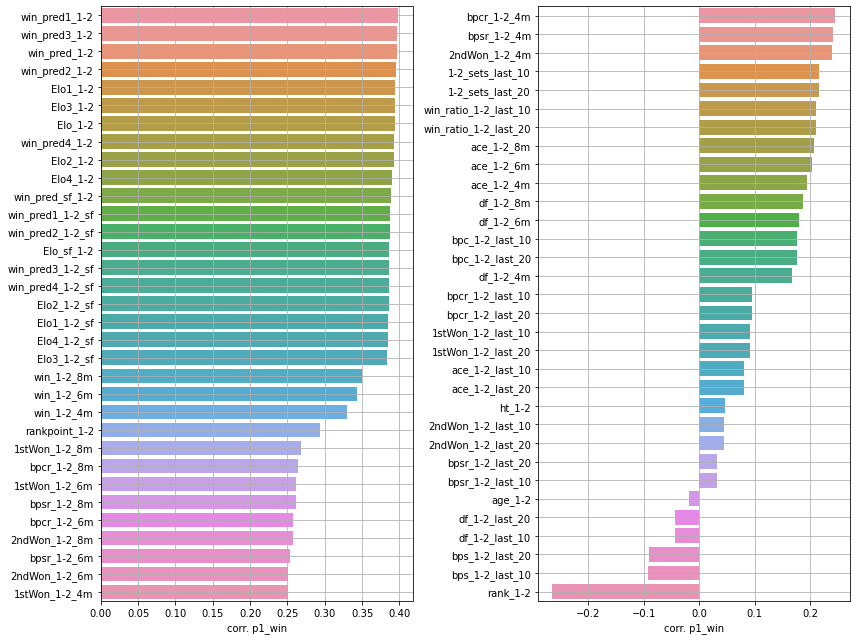

In [192]:
# col_corr = []
# char = '1-2'
# for word in matrix_n.columns:
#     if char in word:
#         col_corr.append(word)

# col_corr.append('p1_win')
# corr_matrix = matrix_n[col_corr].corr()
# corr_win = corr_matrix['p1_win'].sort_values(ascending=False)
col_corr = ['seed_code_1-2', 'rank_1-2', 'bps_1-2_last_10', 'bps_1-2_last_20',
       'df_1-2_last_10', 'df_1-2_last_20', 'age_1-2',   'bpsr_1-2_last_10', 'bpsr_1-2_last_20',
       '2ndWon_1-2_last_20', '2ndWon_1-2_last_10', 'ht_1-2',
         'ace_1-2_last_20',
       'ace_1-2_last_10',  
       '1stWon_1-2_last_20', '1stWon_1-2_last_10', 'bpcr_1-2_last_20',
       'bpcr_1-2_last_10', 'df_1-2_4m',   'bpc_1-2_last_20', 'bpc_1-2_last_10',
         'df_1-2_6m', 'df_1-2_8m',
       'ace_1-2_4m', 'ace_1-2_6m', 'ace_1-2_8m', '1-2_sets_last_20',
       '1-2_sets_last_10', '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
       '1stWon_1-2_4m', '2ndWon_1-2_6m', 'bpsr_1-2_6m', '2ndWon_1-2_8m',
       'bpcr_1-2_6m', 'bpsr_1-2_8m', '1stWon_1-2_6m', 'bpcr_1-2_8m',
       '1stWon_1-2_8m', 'rankpoint_1-2', 'win_1-2_4m', 'win_1-2_6m',
       'win_1-2_8m', 'Elo3_1-2_sf', 'Elo4_1-2_sf', 'Elo1_1-2_sf',
       'Elo2_1-2_sf', 'win_pred4_1-2_sf', 'win_pred3_1-2_sf', 'Elo_sf_1-2',
       'win_pred2_1-2_sf', 'win_pred1_1-2_sf', 'win_pred_sf_1-2', 'Elo4_1-2',
       'Elo2_1-2', 'win_pred4_1-2', 'Elo_1-2', 'Elo3_1-2', 'Elo1_1-2',
       'win_pred2_1-2', 'win_pred_1-2', 'win_pred3_1-2', 'win_pred1_1-2',
            'win_ratio_1-2_last_10','win_ratio_1-2_last_20',
       'p1_win']
        
corr_matrix = matrix_n[col_corr].corr()
corr_win = corr_matrix['p1_win'].sort_values(ascending=False)

n_half = round(len(corr_win)/2)
plt.figure(figsize = (12,9))
plt.subplot(1,2,1)
sns.barplot(corr_win[1:n_half],corr_win.index[1:n_half]);
#plt.xticks(rotation = 90);
plt.xlabel('corr. p1_win')
plt.grid()
plt.subplot(1,2,2)
sns.barplot(corr_win[n_half:-1],corr_win.index[n_half:-1]);
#plt.xticks(rotation = 90);
plt.xlabel('corr. p1_win')
plt.grid()
plt.tight_layout()


In [160]:
corr_win.index

Index(['seed_code_1-2', 'rank_1-2', 'bps_1-2_last_10', 'bps_1-2_last_20',
       'df_1-2_last_10', 'df_1-2_last_20', 'age_1-2', '1-2_set_5_last_20',
       '1-2_set_5_last_10', 'bpsr_1-2_last_10', 'bpsr_1-2_last_20',
       '2ndWon_1-2_last_20', '2ndWon_1-2_last_10', 'ht_1-2',
       '1-2_set_4_last_20', '1-2_set_4_last_10', 'ace_1-2_last_20',
       'ace_1-2_last_10', '1-2_set_3_last_20', '1-2_set_3_last_10',
       '1stWon_1-2_last_20', '1stWon_1-2_last_10', 'bpcr_1-2_last_20',
       'bpcr_1-2_last_10', 'df_1-2_4m', '1-2_set_1_last_20',
       '1-2_set_1_last_10', 'bpc_1-2_last_20', 'bpc_1-2_last_10',
       '1-2_set_2_last_20', '1-2_set_2_last_10', 'df_1-2_6m', 'df_1-2_8m',
       'ace_1-2_4m', 'ace_1-2_6m', 'ace_1-2_8m', '1-2_sets_last_20',
       '1-2_sets_last_10', '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
       '1stWon_1-2_4m', '2ndWon_1-2_6m', 'bpsr_1-2_6m', '2ndWon_1-2_8m',
       'bpcr_1-2_6m', 'bpsr_1-2_8m', '1stWon_1-2_6m', 'bpcr_1-2_8m',
       '1stWon_1-2_8m', 'ran

 <a id='Model'></a>
 ##  5. [Model building and evaluation](#Contents)

In [2]:
matrix_n= pd.read_pickle("./tennis_matrix2_n_elo.pkl")
matrix_n.head()

,tourney_name,surface,draw_size,tourney_level,tourney_date,year,month,day,day_week,match_num,best_of,round,minutes,p1_id,p1_seed,p1_entry,p1_name,p1_hand,p1_ht,p1_ioc,p1_age,p2_id,p2_seed,p2_entry,p2_name,p2_hand,p2_ht,p2_ioc,p2_age,p1_win,p2_win,p1_rank,p1_rank_points,p1_ace,p1_df,p1_svpt,p1_1stIn,p1_1stWon,p1_2ndWon,p1_SvGms,p1_bpFaced,p1_bpSaved,p1_bpc,p1_bpsr,p1_bpcr,p1_set_1,p1_set_2,p1_set_3,p1_set_4,p1_set_5,...,Elo_sf_rp_win6m_seed,Elo_sf_rp_win6m_seed_winratio,Elo_bpcr_bpsr_ace_df_1stwon_2ndwon,win_1_4m,ace_1_4m,df_1_4m,1stWon_1_4m,2ndWon_1_4m,bpsr_1_4m,bpcr_1_4m,win_1_6m,ace_1_6m,df_1_6m,1stWon_1_6m,2ndWon_1_6m,bpsr_1_6m,bpcr_1_6m,win_1_8m,ace_1_8m,df_1_8m,1stWon_1_8m,2ndWon_1_8m,bpsr_1_8m,bpcr_1_8m,win_2_4m,ace_2_4m,df_2_4m,1stWon_2_4m,2ndWon_2_4m,bpsr_2_4m,bpcr_2_4m,win_2_6m,ace_2_6m,df_2_6m,1stWon_2_6m,2ndWon_2_6m,bpsr_2_6m,bpcr_2_6m,win_2_8m,ace_2_8m,df_2_8m,1stWon_2_8m,2ndWon_2_8m,bpsr_2_8m,bpcr_2_8m,Elo_sf_rp_win6m_winratio,bpcr_bpsr_ace_1stwon_2ndwon_6m,bpcr_bpsr_ace_1stwon_2ndwon_last_10,win_ratio_1-2_last_10,win_ratio_1-2_last_20
0,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,1.0,3,R32,NaN,100315.0,1,NaN,Hank Pfister,R,193.0,USA,26.225873,100713.0,NaN,Q,John Fitzgerald,R,183.0,AUS,19.006160,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,6.0,6.0,NaN,NaN,...,NaN,NaN,-0.004953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.03071,NaN,NaN,NaN
1,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,2.0,3,R32,NaN,100397.0,NaN,NaN,Terry Rocavert,R,180.0,AUS,24.194387,100473.0,NaN,NaN,Glenn Petrovic,R,NaN,USA,22.828200,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,7.0,NaN,NaN,NaN,...,NaN,NaN,-0.004953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.03071,NaN,NaN,NaN
2,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,3.0,3,R32,NaN,100265.0,NaN,NaN,Cliff Letcher,R,NaN,AUS,27.890486,107328.0,NaN,NaN,Jeremy Cohen,R,NaN,USA,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,3.0,NaN,NaN,NaN,...,NaN,NaN,-0.004953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.03071,NaN,NaN,NaN
3,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,4.0,3,R32,NaN,100121.0,6,NaN,Raymond Moore,R,183.0,RSA,33.352498,100550.0,NaN,Q,Brad Guan,R,NaN,AUS,21.475702,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,5.0,6.0,NaN,NaN,...,NaN,NaN,-0.004953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.03071,NaN,NaN,NaN
4,Hobart,Hard,32.0,A,1979-12-31,1979,12,31,0,5.0,3,R32,NaN,100337.0,4,NaN,Mark Edmondson,R,185.0,AUS,25.519507,100726.0,NaN,NaN,Greg Whitecross,R,185.0,AUS,18.795346,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,6.0,NaN,NaN,NaN,...,NaN,NaN,-0.004953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.03071,NaN,NaN,NaN


* Baseline models

In [84]:
from sklearn.metrics import accuracy_score

year_start = 1985
year_train = 2010
year_val = 2015
year_end = 2019

year_begin = 2010

condition = (matrix_n.year> year_begin)&(matrix_n.year<= year_end)
y_true = matrix_n[condition]['p1_win']
y_pred_elo = matrix_n[condition]['win_pred_1-2'] > 0
acc_elo = accuracy_score(y_true, y_pred_elo)
print('The accuracy of winner prediction based on Elo is: {}%'.format(round(acc_elo*100,3)))

y_pred_elosf = matrix_n[condition]['win_pred_sf_1-2'] > 0
acc_elosf = accuracy_score(y_true, y_pred_elosf)
print('The accuracy of winner prediction based on Elo_sf is: {}%'.format(round(acc_elosf*100,3)))

y_pred_rank = matrix_n[condition]['rank_1-2'] < 0 
acc_rank = accuracy_score(y_true, y_pred_rank)
print('The accuracy of winner prediction based on ranking is: {}%'.format(round(acc_rank*100,3)))


y_pred_win_8m = matrix_n[condition]['win_1-2_8m'] > 0 
acc_win_8m= accuracy_score(y_true, y_pred_win_8m)
print('The accuracy of winner prediction based on win_8m is: {}%'.format(round(acc_win_8m*100,3)))

y_pred_win_ratio = matrix_n[condition]['win_ratio_1-2_last_10'] > 0 
acc_win_ratio= accuracy_score(y_true, y_pred_win_ratio)
print('The accuracy of winner prediction based on win_ratio is: {}%'.format(round(acc_win_ratio*100,3)))



The accuracy of winner prediction based on Elo is: 67.655%
The accuracy of winner prediction based on Elo_sf is: 67.358%
The accuracy of winner prediction based on ranking is: 65.659%
The accuracy of winner prediction based on win_8m is: 65.302%
The accuracy of winner prediction based on win_ratio is: 53.402%


In [92]:
acc_baseline = pd.DataFrame()
acc_baseline['Elo'] = [acc_elo * 100]
acc_baseline['Elo_sf'] = [acc_elosf * 100]
acc_baseline['Rank'] = [acc_rank * 100]
acc_baseline['Win_1-2_8m'] = [acc_win_8m * 100]
acc_baseline['Win_ratio_last_10'] = [acc_win_ratio * 100]
acc_baseline

,Elo,Elo_sf,Rank,Win_1-2_8m,Win_ratio_last_10
0,67.654884,67.358419,65.659445,65.302166,53.401748


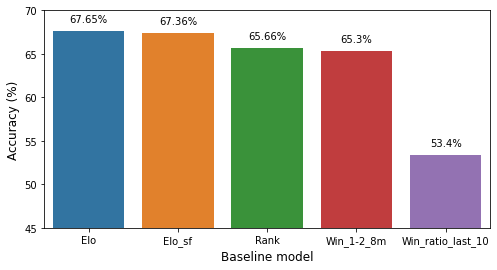

In [121]:
acc_baseline = pd.DataFrame()
acc_baseline['Elo'] = [acc_elo * 100]
acc_baseline['Elo_sf'] = [acc_elosf * 100]
acc_baseline['Rank'] = [acc_rank * 100]
acc_baseline['Win_1-2_8m'] = [acc_win_8m * 100]
acc_baseline['Win_ratio_last_10'] = [acc_win_ratio * 100]
acc_baseline

plt.figure(figsize =(8,4))
bar1 = sns.barplot(data=acc_baseline)
plt.ylim(45,70)
plt.ylabel('Accuracy (%)',fontsize=12)
plt.xlabel('Baseline model',fontsize=12)

 
for i, col in enumerate(acc_baseline.columns):
    
    bar1.text(i,acc_baseline[col].values+1, str(np.round(acc_baseline.loc[0,col],2))+'%', color='black', ha="center")

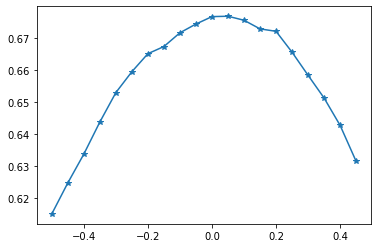

In [430]:
np.arange(-0.5,0.5,0.05)

array([-5.00000000e-01, -4.50000000e-01, -4.00000000e-01, -3.50000000e-01,
       -3.00000000e-01, -2.50000000e-01, -2.00000000e-01, -1.50000000e-01,
       -1.00000000e-01, -5.00000000e-02, -1.11022302e-16,  5.00000000e-02,
        1.00000000e-01,  1.50000000e-01,  2.00000000e-01,  2.50000000e-01,
        3.00000000e-01,  3.50000000e-01,  4.00000000e-01,  4.50000000e-01])

* Tree model: CatBoost

In [4]:
#!pip install catboost
import catboost
print(catboost.__version__)

0.23.2


In [5]:
# catboost for classification
from numpy import mean
from numpy import std
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import accuracy_score
from matplotlib import pyplot
from sklearn import decomposition

from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from sklearn.preprocessing import StandardScaler

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

Using TensorFlow backend.


In [13]:
matrix_n.columns[300:400]

Index(['2ndWon_1_6m', 'bpsr_1_6m', 'bpcr_1_6m', 'win_1_8m', 'ace_1_8m',
       'df_1_8m', '1stWon_1_8m', '2ndWon_1_8m', 'bpsr_1_8m', 'bpcr_1_8m',
       'win_2_4m', 'ace_2_4m', 'df_2_4m', '1stWon_2_4m', '2ndWon_2_4m',
       'bpsr_2_4m', 'bpcr_2_4m', 'win_2_6m', 'ace_2_6m', 'df_2_6m',
       '1stWon_2_6m', '2ndWon_2_6m', 'bpsr_2_6m', 'bpcr_2_6m', 'win_2_8m',
       'ace_2_8m', 'df_2_8m', '1stWon_2_8m', '2ndWon_2_8m', 'bpsr_2_8m',
       'bpcr_2_8m', 'Elo_sf_rp_win6m_winratio',
       'bpcr_bpsr_ace_1stwon_2ndwon_6m',
       'bpcr_bpsr_ace_1stwon_2ndwon_last_10'],
      dtype='object')

In [438]:
# choose features and target to put in the model
col_catfeature = ['tourney_level','surface','pair_names','best_of','round','p1_entry','p2_entry']

# col_numfeature = ['year','month','p1_ht','p2_ht','p1_age','p2_age','p1_rank','p1_rank_points','p2_rank','p2_rank_points',                  
#                   'p1_win_ratio_last_20','p2_win_ratio_last_20','p1_win_ratio_last_10','p2_win_ratio_last_10',                  
#                   'p1_win_pred', 'p2_win_pred','p1_win_pred_sf', 'p2_win_pred_sf',
#                   'Elo_1','Elo_2','Elo_1_sf','Elo_2_sf']


col_numfeature = ['year','month', 'age_1-2', 'ht_1-2', 'rank_1-2',
       'rankpoint_1-2', 'seed_code_1-2','win_1-2_6m', 'ace_1-2_6m', 'df_1-2_6m', '1stWon_1-2_6m',
       '2ndWon_1-2_6m', 'bpsr_1-2_6m', 'bpcr_1-2_6m', 
        'p1_win_ratio_last_20','p1_win_ratio_last_10','ace_1-2_last_20', 'ace_1-2_last_10', 'bpc_1-2_last_20',
       'bpc_1-2_last_10', 'bps_1-2_last_20', 'bps_1-2_last_10', 'df_1-2_last_20',
       'df_1-2_last_10', 'bpsr_1-2_last_20', 'bpsr_1-2_last_10',
       'bpcr_1-2_last_20', 'bpcr_1-2_last_10', '1stWon_1-2_last_20',
       '1stWon_1-2_last_10', '2ndWon_1-2_last_20', '2ndWon_1-2_last_10',                  
        'Elo_1-2', 'Elo_sf_1-2','p1_win_pred', 'win_pred_1-2', 'win_pred_sf_1-2',
        'Elo1_1-2','Elo1_1-2_sf','p1_win_pred1', 'win_pred1_1-2', 'win_pred1_1-2_sf', 
        'Elo2_1-2','Elo2_1-2_sf', 'p1_win_pred2', 'win_pred2_1-2','win_pred2_1-2_sf',
         '1-2_sets_last_20','1-2_sets_last_10','win_1-2_4m', 'ace_1-2_4m', 'df_1-2_4m',
       '1stWon_1-2_4m', '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
       'win_1-2_8m', 'ace_1-2_8m', 'df_1-2_8m', '1stWon_1-2_8m',
       '2ndWon_1-2_8m', 'bpsr_1-2_8m', 'bpcr_1-2_8m', 
        'Elo3_1-2', 'Elo4_1-2', 'win_pred3_1-2',
       'win_pred4_1-2', 'Elo3_1-2_sf', 'Elo4_1-2_sf', 'win_pred3_1-2_sf',
       'win_pred4_1-2_sf']


col_numfeature = ['year','month', 'age_1-2', 'ht_1-2', 'rank_1-2',
       'rankpoint_1-2', 'seed_code_1-2',
                  
        'p1_win_ratio_last_20','p1_win_ratio_last_10',  
         '1-2_sets_last_20','1-2_sets_last_10','win_ratio_1-2_last_20','win_ratio_1-2_last_10',
                  
        'Elo_1-2', 'Elo_sf_1-2','win_pred_1-2', 'win_pred_sf_1-2',
        'Elo1_1-2','Elo1_1-2_sf','win_pred1_1-2', 'win_pred1_1-2_sf', 
        'Elo2_1-2','Elo2_1-2_sf', 'win_pred2_1-2','win_pred2_1-2_sf',
        'Elo3_1-2', 'Elo3_1-2_sf','win_pred4_1-2', 'win_pred4_1-2_sf',
        'Elo4_1-2', 'Elo4_1-2_sf', 'win_pred3_1-2','win_pred3_1-2_sf',
     
        'win_1-2_4m', 'ace_1-2_4m', 'df_1-2_4m','1stWon_1-2_4m', 
       '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
        'win_1-2_6m', 'ace_1-2_6m', 'df_1-2_6m', '1stWon_1-2_6m',
       '2ndWon_1-2_6m', 'bpsr_1-2_6m', 'bpcr_1-2_6m', 
       'win_1-2_8m', 'ace_1-2_8m', 'df_1-2_8m', '1stWon_1-2_8m',
       '2ndWon_1-2_8m', 'bpsr_1-2_8m', 'bpcr_1-2_8m', 
                  
        'Elo_sf_rankpoint', 'Elo_sf_win6m',
       'Elo_sf_rankpoint_win6m', 'Elo_sf_rp_win6m_seed',       
       'Elo_sf_rp_win6m_winratio',
       'bpcr_bpsr_ace_1stwon_2ndwon_6m',
       'bpcr_bpsr_ace_1stwon_2ndwon_last_10',
                  
        
        ]

col_numfeature = ['year','month','age_1-2', 'ht_1-2', 'rank_1-2','rankpoint_1-2', 'seed_code_1-2',
                  'Elo_1-2', 'Elo_sf_1-2','win_pred_1-2', 'win_pred_sf_1-2','win_1-2_6m','win_1-2_8m',
                  'p1_win_ratio_last_20','p1_win_ratio_last_10',
                  
        ]

col_numfeature = ['year','month','seed_code_1-2', 'rank_1-2', 'bps_1-2_last_10', 'bps_1-2_last_20',
       'df_1-2_last_10', 'df_1-2_last_20', 'age_1-2', '1-2_set_5_last_20',
       '1-2_set_5_last_10', 'bpsr_1-2_last_10', 'bpsr_1-2_last_20',
       '2ndWon_1-2_last_20', '2ndWon_1-2_last_10', 'ht_1-2',
       '1-2_set_4_last_20', '1-2_set_4_last_10', 'ace_1-2_last_20',
       'ace_1-2_last_10', '1-2_set_3_last_20', '1-2_set_3_last_10',
       '1stWon_1-2_last_20', '1stWon_1-2_last_10', 'bpcr_1-2_last_20',
       'bpcr_1-2_last_10', 'df_1-2_4m', '1-2_set_1_last_20',
       '1-2_set_1_last_10', 'bpc_1-2_last_20', 'bpc_1-2_last_10',
       '1-2_set_2_last_20', '1-2_set_2_last_10', 'df_1-2_6m', 'df_1-2_8m',
       'ace_1-2_4m', 'ace_1-2_6m', 'ace_1-2_8m', '1-2_sets_last_20',
       '1-2_sets_last_10', '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
       '1stWon_1-2_4m', '2ndWon_1-2_6m', 'bpsr_1-2_6m', '2ndWon_1-2_8m',
       'bpcr_1-2_6m', 'bpsr_1-2_8m', '1stWon_1-2_6m', 'bpcr_1-2_8m',
       '1stWon_1-2_8m', 'rankpoint_1-2', 'win_1-2_4m', 'win_1-2_6m',
       'win_1-2_8m', 'Elo3_1-2_sf', 'Elo4_1-2_sf', 'Elo1_1-2_sf',
       'Elo2_1-2_sf', 'win_pred4_1-2_sf', 'win_pred3_1-2_sf', 'Elo_sf_1-2',
       'win_pred2_1-2_sf', 'win_pred1_1-2_sf', 'win_pred_sf_1-2', 'Elo4_1-2',
       'Elo2_1-2', 'win_pred4_1-2', 'Elo_1-2', 'Elo3_1-2', 'Elo1_1-2',
       'win_pred2_1-2', 'win_pred_1-2', 'win_pred3_1-2', 'win_pred1_1-2','win_ratio_1-2_last_20','win_ratio_1-2_last_10']

col_target = ['p1_win']



matrix_n[col_catfeature]=matrix_n[col_catfeature].fillna('NaN').astype(str)
print(matrix_n[col_catfeature].info())
print(matrix_n[col_numfeature].info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 135825 entries, 0 to 135824
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   tourney_level  135825 non-null  object
 1   surface        135825 non-null  object
 2   pair_names     135825 non-null  object
 3   best_of        135825 non-null  object
 4   round          135825 non-null  object
 5   p1_entry       135825 non-null  object
 6   p2_entry       135825 non-null  object
dtypes: object(7)
memory usage: 8.3+ MB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 135825 entries, 0 to 135824
Data columns (total 78 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   year                   135825 non-null  int64  
 1   month                  135825 non-null  int64  
 2   seed_code_1-2          11371 non-null   float64
 3   rank_1-2               124774 non-null  float64
 4   bps_1-2_last_10

In [307]:
# flag_pca = 1 means to perform principle component analysis

flag_pca =0

year_start = 1985
year_train = 2000
year_val = 2010
year_end = 2019

In [408]:

def train_test_split (data = None, flag_pca = 0, n_components = None, year_start = None, year_train = None,year_val = None, year_end = None,
                     col_catfeature = None, col_numfeature = None, col_target = None, one_hot_catfeature = False):

    from sklearn.preprocessing import OneHotEncoder
    
    if flag_pca == 0:
        
        array_pca = data[col_numfeature].replace([np.inf, -np.inf], 0)
        

#         X_train = data[(data.year<=year_train)&(data.year>=year_start)][col_catfeature+col_numfeature].replace([np.inf, -np.inf], 0)
#         y_train = data[(data.year<=year_train)&(data.year>=year_start)][col_target]

#         X_val = data[(year_train<data.year)&(data.year<=year_val)][col_catfeature+col_numfeature].replace([np.inf, -np.inf], 0)
#         y_val = data[(year_train<data.year)&(data.year<=year_val)][col_target]

#         X_test = data[(data.year>year_val)&(data.year<=year_end)][col_catfeature+col_numfeature].replace([np.inf, -np.inf], 0)
#         y_test = data[(data.year>year_val)&(data.year<=year_end)][col_target]
        
        
    elif flag_pca == 1:

        # perform pca
        array_pca = pca_matrix(data = data, col_numfeature = col_numfeature,n_components = n_components, svd_solver = 'full')
     
    
    
    if one_hot_catfeature == True:
        #convert categorical data to one-hot encoding
        ohe = OneHotEncoder(handle_unknown='ignore')    
        df_ohe = ohe.fit_transform(data[col_catfeature]).toarray()

        # combine numerical features and categorical features
        X_n = np.concatenate((df_ohe,array_pca),axis=1)

    else:
        # combine numerical features and categorical features
        X_n = np.concatenate((data[col_catfeature],array_pca),axis=1)


    # define the index for train, validation and test sets
    index_train = data[(data.year>=year_start) &(data.year<=year_train)].index
    index_val = data[(data.year>year_train) & (data.year<=year_val)].index
    index_test = data[(data.year>year_val) & (data.year<=year_end)].index

    # generate features and targets 
    X_train = np.nan_to_num(X_n[index_train,:])
    X_val = np.nan_to_num(X_n[index_val,:])
    X_test = np.nan_to_num(X_n[index_test,:])

    y_train = data[(data.year>=year_start) &(data.year<=year_train)][col_target].to_numpy()
    y_val = data[(data.year>year_train) & (data.year<=year_val)][col_target].to_numpy()
    y_test = data[(data.year>year_val) & (data.year<=year_end)][col_target].to_numpy()
        
    return X_train,X_val,X_test,y_train,y_val,y_test,X_n



In [8]:
def pca_matrix(data = None, col_numfeature = None,n_components = 1, svd_solver = 'full'):
    
    # convert dataframe to numpy array
    array_n = data[col_numfeature].replace([np.inf, -np.inf], np.nan).fillna(0).to_numpy()

    # standardize the data before performaing dimensionality reduction using PCA

    array_n = StandardScaler().fit_transform(array_n)

    # perform PCA, 'mle' is used to automatically guess the dimension
    pca = decomposition.PCA(n_components=n_components, svd_solver = svd_solver)
    pca.fit(array_n)

    array_pca = pca.transform(array_n)

    print('number of feature before PCA:',array_n.shape)
    print('number of feature after PCA:',array_pca.shape)

    #print(pca.explained_variance_)
    
    
    return array_pca

In [9]:


def build_cat(loss_function='Logloss',eval_metric = 'Accuracy',od_wait=15,random_seed=42):
    
    from catboost import CatBoostClassifier

    """
    
    loss_function is the metric used to optimize the model, while eval_metric is the metric used for overfitting detection,
    od_wait is the number of interation to wait for overfitting stop, od_type is thetype of the overfitting detector to use.
    """
    catb = CatBoostClassifier(loss_function=loss_function,eval_metric = eval_metric,
                              od_wait=od_wait,od_type='Iter',random_seed=random_seed)
    
    return catb



In [10]:

# this is a fection to define the catboost traning and evaluation

def train_cat(model=None,grid_para=None,cv=None,verbose=False,train_data=None,val_data=None,test_data=None,cat_features_index=None,
              loss_function = 'Logloss',eval_metric = 'Accuracy',plot_progress = False,retrain_best = True):
    
    from sklearn.model_selection import GridSearchCV
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import log_loss
    
    X_train, y_train = train_data[0],train_data[1]
    X_val, y_val = val_data[0],val_data[1]
    X_test, y_test = test_data[0],test_data[1]
    
    #X_test, y_test = test_data[0],test_data[1]
    
    # get the column index of categorical features in the X_train
    #cat_features_index = np.where(np.in1d(X_train.columns.values,col_category))[0]

    """Instead of using the GridSearchCV for finding the best hyperparameters, we only use it for cross-validation,but keep
    all the results, including the hyperparameters and the metrics of the model in train, validation and test sets.
     """
    
    # pay attention, * is used before the list to unpack the list into multiple argument for function
    # https://stackoverflow.com/questions/36901/what-does-double-star-asterisk-and-star-asterisk-do-for-parameters
    
    cases = list(product(*list(grid_para.values())[0:]))  

    cases = pd.DataFrame(columns = grid_para.keys(), data = cases)
    
    for row in cases.itertuples():
        
        print(row)
        idx = row.Index
        
        """
        row_bracket generate a dictionary of the form {key_A: [value_A],key_B: [value_B], ...  }
        which is required for the GridSearchCV param input 
        """
        
        row_bracket = list(map(lambda x: [x], row[1:]))
        param = dict(zip(grid_para.keys(),row_bracket))
        print(param)

        catb_grid = GridSearchCV(model, param, cv = cv,n_jobs = 1,refit = True)    

        catb_grid.fit(X_train, y_train,
                eval_set=[(X_val, y_val)],
                cat_features= cat_features_index,
                verbose=verbose          
                 )
     
        cases.loc[idx,'metric_cat_train'] = catb_grid.best_estimator_.get_best_score()['learn'][eval_metric]
        cases.loc[idx,'loss_cat_train'] =catb_grid.best_estimator_.get_best_score()['learn'][loss_function]
        cases.loc[idx,'metric_cat_val'] =catb_grid.best_estimator_.get_best_score()['validation'][eval_metric]
        cases.loc[idx,'loss_cat_val'] =catb_grid.best_estimator_.get_best_score()['validation'][loss_function]
        
        train_metric = catb_grid.best_estimator_.get_evals_result()['learn'][eval_metric]
        train_loss = catb_grid.best_estimator_.get_evals_result()['learn'][loss_function]
        val_metric = catb_grid.best_estimator_.get_evals_result()['validation'][eval_metric]
        val_loss = catb_grid.best_estimator_.get_evals_result()['validation'][loss_function]

    
        if plot_progress == True:

            plot_train_progress(param,loss_function,train_loss,val_loss,eval_metric,train_metric,val_metric)
            
            
    # retrain the best parameters
    
    
    best_index = cases.metric_cat_val.argmax()
    best_para = cases.loc[best_index,grid_para.keys()]
    row_bracket = list(map(lambda x: [x], best_para.to_dict().values()))
    param = dict(zip(grid_para.keys(),row_bracket))

    #print('best parameters:',param)
    
        
    if retrain_best == True:
        
        catb_grid = GridSearchCV(model, param, cv = cv, n_jobs = 1,refit = True)    

        catb_grid.fit(X_train, y_train,
                eval_set=[(X_val, y_val)],
                cat_features= cat_features_index,
                verbose=verbose          
                 )

        train_metric = catb_grid.best_estimator_.get_evals_result()['learn'][eval_metric]
        train_loss = catb_grid.best_estimator_.get_evals_result()['learn'][loss_function]
        val_metric = catb_grid.best_estimator_.get_evals_result()['validation'][eval_metric]
        val_loss = catb_grid.best_estimator_.get_evals_result()['validation'][loss_function]

        plot_train_progress(param,loss_function,train_loss,val_loss,eval_metric,train_metric,val_metric)         

    return cases, best_para, catb_grid
    
    
    
    
    

In [11]:
def plot_train_progress(param,loss_function,train_loss,val_loss,eval_metric,train_metric,val_metric):
    
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('Epochs',fontsize=15)
    ax1.set_ylabel(loss_function, color=color,fontsize=15)
    ax1.plot(train_loss, color=color,lw=2)
    ax1.plot(val_loss,'-.', color=color,lw=2)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel(eval_metric, color=color,fontsize=15)  # we already handled the x-label with ax1
    ax2.plot(train_metric, color=color,lw=2)
    ax2.plot(val_metric, '-.',color=color,lw=2)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.legend(['train','validation'])
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.title(param)
    plt.show()

We first choose several important features from the feature matrix without using PCA. These features are chosen by first putting all the features in the matrix_n in the catboost model, trained and filtered based on their feature importance. 

Pandas(Index=0, grow_policy='SymmetricTree', depth=9, learning_rate=0.05, l2_leaf_reg=5, random_strength=0, iterations=500)
{'grow_policy': ['SymmetricTree'], 'depth': [9], 'learning_rate': [0.05], 'l2_leaf_reg': [5], 'random_strength': [0], 'iterations': [500]}


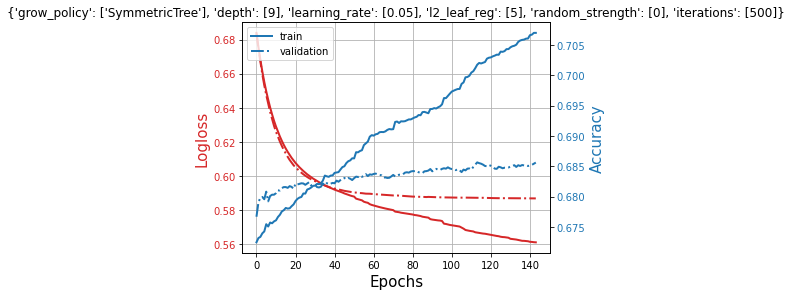

In [446]:
col_catfeature = ['tourney_level','surface','pair_names','best_of','round','p1_entry','p2_entry']

col_numfeature = ['year','month','seed_code_1-2', 'rank_1-2', 'bps_1-2_last_10', 'bps_1-2_last_20',
       'df_1-2_last_10', 'df_1-2_last_20', 'age_1-2', '1-2_set_5_last_20',
       '1-2_set_5_last_10', 'bpsr_1-2_last_10', 'bpsr_1-2_last_20',
       '2ndWon_1-2_last_20', '2ndWon_1-2_last_10', 'ht_1-2',
       '1-2_set_4_last_20', '1-2_set_4_last_10', 'ace_1-2_last_20',
       'ace_1-2_last_10', '1-2_set_3_last_20', '1-2_set_3_last_10',
       '1stWon_1-2_last_20', '1stWon_1-2_last_10', 'bpcr_1-2_last_20',
       'bpcr_1-2_last_10', 'df_1-2_4m', '1-2_set_1_last_20',
       '1-2_set_1_last_10', 'bpc_1-2_last_20', 'bpc_1-2_last_10',
       '1-2_set_2_last_20', '1-2_set_2_last_10', 'df_1-2_6m', 'df_1-2_8m',
       'ace_1-2_4m', 'ace_1-2_6m', 'ace_1-2_8m', '1-2_sets_last_20',
       '1-2_sets_last_10', '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
       '1stWon_1-2_4m', '2ndWon_1-2_6m', 'bpsr_1-2_6m', '2ndWon_1-2_8m',
       'bpcr_1-2_6m', 'bpsr_1-2_8m', '1stWon_1-2_6m', 'bpcr_1-2_8m',
       '1stWon_1-2_8m', 'rankpoint_1-2', 'win_1-2_4m', 'win_1-2_6m',
       'win_1-2_8m', 'Elo3_1-2_sf', 'Elo4_1-2_sf', 'Elo1_1-2_sf',
       'Elo2_1-2_sf', 'win_pred4_1-2_sf', 'win_pred3_1-2_sf', 'Elo_sf_1-2',
       'win_pred2_1-2_sf', 'win_pred1_1-2_sf', 'win_pred_sf_1-2', 'Elo4_1-2',
       'Elo2_1-2', 'win_pred4_1-2', 'Elo_1-2', 'Elo3_1-2', 'Elo1_1-2',
       'win_pred2_1-2', 'win_pred_1-2', 'win_pred3_1-2', 'win_pred1_1-2','win_ratio_1-2_last_20','win_ratio_1-2_last_10']



# define the loss function and evaludation metric
loss_function='Logloss'
eval_metric = 'Accuracy'

catb = build_cat(loss_function=loss_function,eval_metric = eval_metric,od_wait=30,random_seed=42)

# whether to use PCA
flag_pca = 0

# #col_numfeature = ['year','month','age_1-2', 'ht_1-2', 'rank_1-2','rankpoint_1-2', 'seed_code_1-2',
#                   'Elo_1-2', 'Elo_sf_1-2','win_pred_1-2', 'win_pred_sf_1-2','win_1-2_6m','win_1-2_8m',
#                   'p1_win_ratio_last_20','p1_win_ratio_last_10',
                  
#         ]

params = {'grow_policy':['SymmetricTree'],
            'depth': [9],
          'learning_rate' : [0.05],
         'l2_leaf_reg': [5],
          'random_strength':[0],
          'iterations': [500]
         }

n_splits = 3
tscv = TimeSeriesSplit(n_splits=n_splits)

# train catboost model

X_train,X_val,X_test,y_train,y_val,y_test,X_total\
    = train_test_split (data = matrix_n, flag_pca = flag_pca, n_components = n_pca_components, 
                          year_start = year_start, year_train = year_train, year_val = year_val, year_end = year_end,
                        col_catfeature = col_catfeature, col_numfeature = col_numfeature, col_target = col_target)


train_data = [X_train, y_train]
val_data = [X_val, y_val]
test_data = [X_test, y_test]

if flag_pca == 0:
    cat_features_index = np.arange(len(col_catfeature))

elif flag_pca == 1:
    cat_features_index = np.arange(len(col_catfeature))


# for hyper-parameters, see https://catboost.ai/docs/concepts/python-reference_parameters-list.html
train_results,best_para, catb_grid = train_cat(model=catb,grid_para=params,cv=tscv,verbose=False,
                    train_data=train_data,val_data=val_data,test_data=test_data,cat_features_index=cat_features_index,
                   loss_function = loss_function,eval_metric = eval_metric,plot_progress = True,retrain_best = False)



In [445]:
X_total

array([['A', 'Hard', 'Hank Pfister/John Fitzgerald', ..., 0.0, nan, nan],
       ['A', 'Hard', 'Terry Rocavert/Glenn Petrovic', ..., 0.0, nan, nan],
       ['A', 'Hard', 'Cliff Letcher/Jeremy Cohen', ..., 0.0, nan, nan],
       ...,
       ['D', 'Hard', 'Mehluli Don Ayanda Sibanda/Hazem Naw', ...,
        -0.3023251979477738, nan, nan],
       ['D', 'Hard', 'Benjamin Lock/Amer Naow', ..., 0.4558092025375203,
        nan, nan],
       ['D', 'Hard', 'Benjamin Lock/Hazem Naw', ..., 0.4067491048066083,
        nan, nan]], dtype=object)

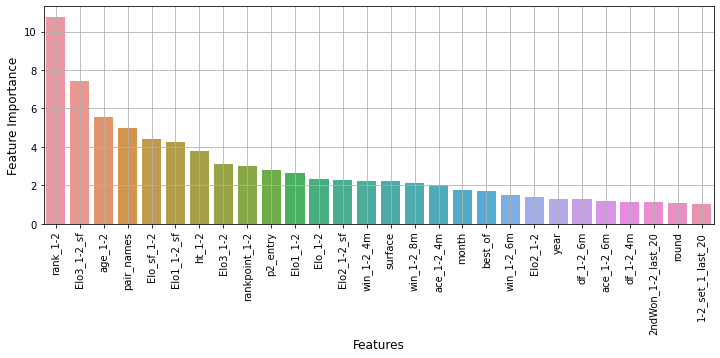

In [309]:
features = X_train.columns
feature_importance = catb_grid.best_estimator_.feature_importances_

featureimportance = pd.DataFrame()
featureimportance['features'] = features
featureimportance['feature_importance'] = feature_importance

featureimportance.sort_values(['feature_importance'],ascending = False, inplace=True)

plt.figure(figsize=(12,4))
#sns.set(font_scale=1.0)
sns.barplot(y ='feature_importance' ,x = 'features' ,data = featureimportance[featureimportance['feature_importance']>1] )
plt.xticks(rotation = 90)
plt.xlabel('Features',fontsize = 12)
plt.ylabel('Feature Importance',fontsize = 12)
plt.grid()
plt.show()

In [70]:
matrix_n['y_pred_cat0'] = catb_grid.predict(matrix_n[col_catfeature+col_numfeature].replace([np.inf, -np.inf], 0))

In [310]:
# calculate the accuracy on train set
y_train_pred = catb_grid.predict(X_train)
y_train_pred = 1*(y_train_pred>0.5)
acc_cat = accuracy_score(y_train, y_train_pred)
print('In the train set:')
print('The accuracy of winner prediction using Catboost is: {}%.\n'.format(round(acc_cat*100,3))) 

# calculate the accuracy on validation set
y_val_pred = catb_grid.predict(X_val)
y_val_pred = 1*(y_val_pred>0.5)
acc_cat = accuracy_score(y_val, y_val_pred)
print('In the validation set:')
print('The accuracy of winner prediction using Catboost is: {}%.\n'.format(round(acc_cat*100,3))) 


# calculate the accuracy on test set
y_test_pred = catb_grid.predict(X_test)
y_test_pred = 1*(y_test_pred>0.5)
acc_cat = accuracy_score(y_test, y_test_pred)
print('In the test set:')
print('The accuracy of winner prediction using Catboost is: {}%.\n'.format(round(acc_cat*100,3))) 


In the train set:
The accuracy of winner prediction using Catboost is: 72.02%.

In the validation set:
The accuracy of winner prediction using Catboost is: 68.564%.

In the test set:
The accuracy of winner prediction using Catboost is: 68.586%.



In [108]:
import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
sorted([(x, sys.getsizeof(globals().get(x))/(1024*1024)) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)

[('matrix_n', 470.1152009963989),
 ('array_n', 63.212120056152344),
 ('X_n', 47.668182373046875),
 ('array_pca', 41.45060729980469),
 ('X_train', 31.58685302734375),
 ('X_val', 5.198760986328125),
 ('X_test', 4.2971649169921875),
 ('y_train_pred', 0.3434257507324219),
 ('y_val_pred', 0.056598663330078125),
 ('y_test_pred', 0.0467987060546875),
 ('y_pred_cat', 0.01142120361328125),
 ('y_pred_cat_pca', 0.01142120361328125),
 ('y_true', 0.01142120361328125),
 ('y_pred_elo', 0.008571624755859375),
 ('y_pred_elo1', 0.008571624755859375),
 ('y_pred_elo2', 0.008571624755859375),
 ('y_pred_elo3', 0.008571624755859375),
 ('y_pred_elo4', 0.008571624755859375),
 ('y_pred_rank', 0.008571624755859375),
 ('y_pred_win4m', 0.008571624755859375),
 ('y_pred_win6m', 0.008571624755859375),
 ('y_pred_win8m', 0.008571624755859375),
 ('features', 0.0019731521606445312),
 ('featureimportance', 0.0016832351684570312),
 ('GridSearchCV', 0.00139617919921875),
 ('StandardScaler', 0.001129150390625),
 ('Dense', 0.

In [181]:
del matrix_result, matrix_n0

Draw the decision tree

In [73]:
# !pip install graphviz

You should consider upgrading via the 'C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\python.exe -m pip install --upgrade pip' command.


In [50]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/' 

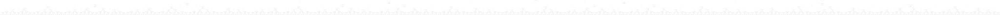

<Figure size 1296x1296 with 0 Axes>

In [67]:

pool = Pool(X_train, y_train, cat_features=cat_features_index, feature_names=list(X_train.columns))

plt.figure(figsize = (18,18))

catb_grid.best_estimator_.plot_tree(
    tree_idx=0,    
    pool=pool,
    
)




The components chosen are based on feature importance. Below we use principle component analysis and see how the accuracy change as a function of the number of principle components.

In [123]:
col_catfeature = ['tourney_level','surface','pair_names','best_of','round','p1_entry','p2_entry']

# # features to include during PCA
# col_numfeature = ['Elo_1-2', 'Elo_sf_1-2',
#        'win_pred_1-2', 'win_pred_sf_1-2', 'age_1-2', 'ht_1-2', 'rank_1-2',
#        'rankpoint_1-2', 'ace_1-2_last_20', 'ace_1-2_last_10',
#        'bpc_1-2_last_20', 'bpc_1-2_last_10', 'bps_1-2_last_20',
#        'bps_1-2_last_10', 'df_1-2_last_20', 'df_1-2_last_10',
#        'bpsr_1-2_last_20', 'bpsr_1-2_last_10', 'bpcr_1-2_last_20',
#        'bpcr_1-2_last_10', '1stWon_1-2_last_20', '1stWon_1-2_last_10',
#        '2ndWon_1-2_last_20', '2ndWon_1-2_last_10', 'win_1-2_6m', 'ace_1-2_6m', 'df_1-2_6m',
#        '1stWon_1-2_6m', '2ndWon_1-2_6m', 'bpsr_1-2_6m', 'bpcr_1-2_6m',
#         'Elo1_1-2', 'Elo2_1-2', 'win_pred1_1-2',
#        'win_pred2_1-2', 'Elo1_1-2_sf', 'Elo2_1-2_sf', 'win_pred1_1-2_sf',
#        'win_pred2_1-2_sf', '1-2_sets_last_10',
#        '1-2_sets_last_20', 'win_1-2_4m', 'ace_1-2_4m', 'df_1-2_4m',
#        '1stWon_1-2_4m', '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
#        'win_1-2_8m', 'ace_1-2_8m', 'df_1-2_8m', '1stWon_1-2_8m',
#        '2ndWon_1-2_8m', 'bpsr_1-2_8m', 'bpcr_1-2_8m', 'Elo3_1-2', 'Elo4_1-2', 'win_pred3_1-2',
#        'win_pred4_1-2', 'Elo3_1-2_sf', 'Elo4_1-2_sf']

col_target = ['p1_win']

col_numfeature = ['year','month','seed_code_1-2', 'rank_1-2', 'bps_1-2_last_10', 'bps_1-2_last_20',
       'df_1-2_last_10', 'df_1-2_last_20', 'age_1-2', 'bpsr_1-2_last_10', 'bpsr_1-2_last_20',
       '2ndWon_1-2_last_20', '2ndWon_1-2_last_10', 'ht_1-2',
        'ace_1-2_last_20','ace_1-2_last_10', 
       '1stWon_1-2_last_20', '1stWon_1-2_last_10', 'bpcr_1-2_last_20',
       'bpcr_1-2_last_10', 'df_1-2_4m',  'bpc_1-2_last_20', 'bpc_1-2_last_10',
        'df_1-2_6m', 'df_1-2_8m',
       'ace_1-2_4m', 'ace_1-2_6m', 'ace_1-2_8m', '1-2_sets_last_20',
       '1-2_sets_last_10', '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
       '1stWon_1-2_4m', '2ndWon_1-2_6m', 'bpsr_1-2_6m', '2ndWon_1-2_8m',
       'bpcr_1-2_6m', 'bpsr_1-2_8m', '1stWon_1-2_6m', 'bpcr_1-2_8m',
       '1stWon_1-2_8m', 'rankpoint_1-2', 'win_1-2_4m', 'win_1-2_6m',
       'win_1-2_8m', 'Elo3_1-2_sf', 'Elo4_1-2_sf', 'Elo1_1-2_sf',
       'Elo2_1-2_sf', 'win_pred4_1-2_sf', 'win_pred3_1-2_sf', 'Elo_sf_1-2',
       'win_pred2_1-2_sf', 'win_pred1_1-2_sf', 'win_pred_sf_1-2', 'Elo4_1-2',
       'Elo2_1-2', 'win_pred4_1-2', 'Elo_1-2', 'Elo3_1-2', 'Elo1_1-2',
       'win_pred2_1-2', 'win_pred_1-2', 'win_pred3_1-2', 'win_pred1_1-2',
                  'win_ratio_1-2_last_20','win_ratio_1-2_last_10']

col_numfeature = ['year','month','seed_code_1-2', 'rank_1-2', 'bps_1-2_last_10', 'bps_1-2_last_20',
       'df_1-2_last_10', 'df_1-2_last_20', 'age_1-2', '1-2_set_5_last_20',
       '1-2_set_5_last_10', 'bpsr_1-2_last_10', 'bpsr_1-2_last_20',
       '2ndWon_1-2_last_20', '2ndWon_1-2_last_10', 'ht_1-2',
       '1-2_set_4_last_20', '1-2_set_4_last_10', 'ace_1-2_last_20',
       'ace_1-2_last_10', '1-2_set_3_last_20', '1-2_set_3_last_10',
       '1stWon_1-2_last_20', '1stWon_1-2_last_10', 'bpcr_1-2_last_20',
       'bpcr_1-2_last_10', 'df_1-2_4m', '1-2_set_1_last_20',
       '1-2_set_1_last_10', 'bpc_1-2_last_20', 'bpc_1-2_last_10',
       '1-2_set_2_last_20', '1-2_set_2_last_10', 'df_1-2_6m', 'df_1-2_8m',
       'ace_1-2_4m', 'ace_1-2_6m', 'ace_1-2_8m', '1-2_sets_last_20',
       '1-2_sets_last_10', '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
       '1stWon_1-2_4m', '2ndWon_1-2_6m', 'bpsr_1-2_6m', '2ndWon_1-2_8m',
       'bpcr_1-2_6m', 'bpsr_1-2_8m', '1stWon_1-2_6m', 'bpcr_1-2_8m',
       '1stWon_1-2_8m', 'rankpoint_1-2', 'win_1-2_4m', 'win_1-2_6m',
       'win_1-2_8m', 'Elo3_1-2_sf', 'Elo4_1-2_sf', 'Elo1_1-2_sf',
       'Elo2_1-2_sf', 'win_pred4_1-2_sf', 'win_pred3_1-2_sf', 'Elo_sf_1-2',
       'win_pred2_1-2_sf', 'win_pred1_1-2_sf', 'win_pred_sf_1-2', 'Elo4_1-2',
       'Elo2_1-2', 'win_pred4_1-2', 'Elo_1-2', 'Elo3_1-2', 'Elo1_1-2',
       'win_pred2_1-2', 'win_pred_1-2', 'win_pred3_1-2', 'win_pred1_1-2','win_ratio_1-2_last_20','win_ratio_1-2_last_10']

col_numfeature.sort()

# define the loss function and evaludation metric
loss_function='Logloss'
eval_metric = 'Accuracy'

catb = build_cat(loss_function=loss_function,eval_metric = eval_metric,od_wait=30,random_seed=42)

# whether to apply PCA
flag_pca = 1

# number of principle components 

pca_components = [1,2,4,8,16,25,32,40,50,60,70]

acc_vs_components = pd.DataFrame()

# Hyper-parameters
params = {'grow_policy':['SymmetricTree'],
            'depth': [9],
          'learning_rate' : [0.05],
         'l2_leaf_reg': [5],
          'random_strength':[0],
          'iterations': [500]
         }

# time series split
n_splits = 2
tscv = TimeSeriesSplit(n_splits=n_splits)


# train catboost model

idx = 0

for n_pca_components in pca_components:

    # train test split
    X_train,X_val,X_test,y_train,y_val,y_test\
    = train_test_split (data = matrix_n, flag_pca = flag_pca, n_components = n_pca_components, 
                          year_start = year_start, year_train = year_train,year_val = year_val,year_end = year_end,
                       col_catfeature = col_catfeature, col_numfeature = col_numfeature, col_target = col_target)

    train_data = [X_train, y_train]
    val_data = [X_val, y_val]
    test_data = [X_test, y_test]

    if flag_pca == 0:
        cat_features_index = np.arange(len(col_catfeature))

    elif flag_pca == 1:
        cat_features_index = np.arange(len(col_catfeature))


    # # for catboost hyper-parameters, see https://catboost.ai/docs/concepts/python-reference_parameters-list.html
    train_results,best_para, catb_grid_pca = train_cat(model=catb,grid_para=params,cv=tscv,verbose=False,
                        train_data=train_data,val_data=val_data,test_data=test_data,cat_features_index=cat_features_index,
                       loss_function = loss_function,eval_metric = eval_metric,plot_progress = True,retrain_best = False)

    
    
    # get the accuracy on test set
    y_test_pred = catb_grid_pca.predict(X_test)
    y_test_pred = 1*(y_test_pred>0.5)
    acc_cat = accuracy_score(y_test, y_test_pred)
    
     
    acc_vs_components.loc[idx,'n_pca_component'] = n_pca_components
    acc_vs_components.loc[idx,'acc_test'] = acc_cat
    acc_vs_components.loc[idx,'acc_val'] = train_results.metric_cat_val.values 
    acc_vs_components.loc[idx,'acc_train'] = train_results.metric_cat_train.values
    
    # predict the whole dataset and return the result
    #matrix_n['y_pred_cat_pca_'+str(n_pca_components)] = catb_grid_pca.predict(X_n)
    
    idx+= 1


number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 1)
Pandas(Index=0, grow_policy='SymmetricTree', depth=9, learning_rate=0.05, l2_leaf_reg=5, random_strength=0, iterations=500)
{'grow_policy': ['SymmetricTree'], 'depth': [9], 'learning_rate': [0.05], 'l2_leaf_reg': [5], 'random_strength': [0], 'iterations': [500]}


KeyboardInterrupt: 

In [262]:
train_results

,grow_policy,depth,learning_rate,l2_leaf_reg,random_strength,iterations,metric_cat_train,loss_cat_train,metric_cat_val,loss_cat_val
0,SymmetricTree,9,0.05,5,0,500,0.710033,0.559219,0.682955,0.591874


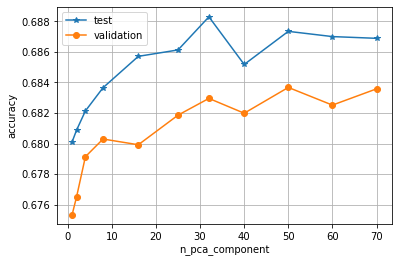

In [79]:
plt.figure
plt.plot(acc_vs_components['n_pca_component'],acc_vs_components['acc_test'],'*-')
plt.plot(acc_vs_components['n_pca_component'],acc_vs_components['acc_val'],'o-')
#plt.plot(acc_vs_components['n_pca_component'],acc_vs_components['acc_train'],'s-')
plt.legend(['test','validation','train'])
plt.xlabel('n_pca_component')
plt.ylabel('accuracy')
plt.grid()

Surprisingly, even with one principle component, the accuracy already reaches 68 % in the test set. With ~40 components, the accuracy increases to around 68.4% for validation and 68.6% for test set. It seems the peak of validation set does not coincide with the peak of test set exactly. 

number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 32)
Pandas(Index=0, grow_policy='SymmetricTree', depth=9, learning_rate=0.05, l2_leaf_reg=5, random_strength=0, iterations=500)
{'grow_policy': ['SymmetricTree'], 'depth': [9], 'learning_rate': [0.05], 'l2_leaf_reg': [5], 'random_strength': [0], 'iterations': [500]}


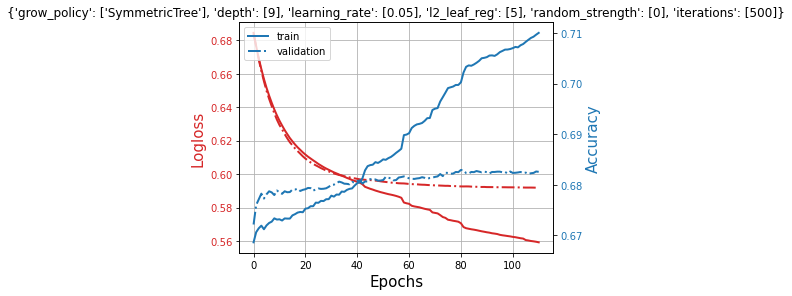

number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 32)


In [80]:
flag_pca = 1

pca_components = 32

X_train,X_val,X_test,y_train,y_val,y_test\
    = train_test_split (data = matrix_n, flag_pca = flag_pca, n_components = pca_components, 
                          year_start = year_start, year_train = year_train,year_val = year_val,
                        col_catfeature = col_catfeature, col_numfeature = col_numfeature, col_target = col_target)

train_data = [X_train, y_train]
val_data = [X_val, y_val]
test_data = [X_test, y_test]


train_results,best_para, catb_grid_pca = train_cat(model=catb,grid_para=params,cv=tscv,verbose=False,
                        train_data=train_data,val_data=val_data,test_data=test_data,cat_features_index=cat_features_index,
                       loss_function = loss_function,eval_metric = eval_metric,plot_progress = True,retrain_best = False)

# use the model to refit the whole data set
# perform pca
array_pca = pca_matrix(data = matrix_n, col_numfeature = col_numfeature,n_components = pca_components, svd_solver = 'full')

# combine numerical features and categorical features
X_n = np.concatenate((matrix_n[col_catfeature],array_pca),axis=1)
X_n  = np.nan_to_num(X_n)

# predict the whole dataset and return the result
matrix_n['y_pred_cat_pca'] = catb_grid_pca.predict(X_n)

#### Below we examine how the prediction accuracy changes over time, for different Elo and ranking difference, and in different tournies, rounds, tourney levels.

In [457]:
#matrix_n['y_pred_cat'] = catb_grid.predict(matrix_n[col_catfeature+col_numfeature].replace([np.inf, -np.inf], 0))
matrix_n['y_pred_cat_prob_1'] = catb_grid.predict_proba(matrix_n[col_catfeature+col_numfeature].replace([np.inf, -np.inf], 0))[:,1]
matrix_n['y_pred_cat_prob_2'] = catb_grid.predict_proba(matrix_n[col_catfeature+col_numfeature].replace([np.inf, -np.inf], 0))[:,0]
matrix_n['y_pred_cat_prob_1-2'] = matrix_n['y_pred_cat_prob_1']  - matrix_n['y_pred_cat_prob_2'] 
#catb_grid.predict_proba(matrix_n[col_catfeature+col_numfeature].replace([np.inf, -np.inf], 0))

In [455]:
matrix_n['y_pred_cat_prob'] 

0         0.668474
1         0.722931
2         0.736663
3         0.655699
4         0.601817
            ...   
135820    0.920031
135821    0.642588
135822    0.558440
135823    0.803594
135824    0.765623
Name: y_pred_cat_prob, Length: 135825, dtype: float64

In [82]:
acc_cat_year = []
acc_cat_pca_year = []
acc_elo_year = []
acc_elo1_year = []
acc_elo2_year = []
acc_elo3_year = []
acc_elo4_year = []

acc_win4m_year = []
acc_win6m_year = []
acc_win8m_year = []

acc_rank_year = []

for i in matrix_n.year.unique():
    
    y_pred_cat = matrix_n[matrix_n.year==i]['y_pred_cat']
    y_pred_cat_pca = matrix_n[matrix_n.year==i]['y_pred_cat_pca']
    
    y_pred_elo = 1*(matrix_n[matrix_n.year==i]['p1_win_pred']>0.5)
    y_pred_elo1 = 1*(matrix_n[matrix_n.year==i]['p1_win_pred1']>0.5)
    y_pred_elo2 = 1*(matrix_n[matrix_n.year==i]['p1_win_pred2']>0.5)
    y_pred_elo3 = 1*(matrix_n[matrix_n.year==i]['p1_win_pred3']>0.5)
    y_pred_elo4 = 1*(matrix_n[matrix_n.year==i]['p1_win_pred4']>0.5)
    
    y_pred_win4m = 1*(matrix_n[matrix_n.year==i]['win_1-2_4m']>0)
    y_pred_win6m = 1*(matrix_n[matrix_n.year==i]['win_1-2_6m']>0)
    y_pred_win8m = 1*(matrix_n[matrix_n.year==i]['win_1-2_8m']>0)
    
    y_pred_rank = 1*(matrix_n[matrix_n.year==i]['rank_1-2']<0)
    y_true = matrix_n[matrix_n.year==i]['p1_win']
    
    acc_cat = accuracy_score(y_true, y_pred_cat)*100
    acc_cat_year.append(acc_cat)
    
    acc_cat_pca = accuracy_score(y_true, y_pred_cat_pca)*100
    acc_cat_pca_year.append(acc_cat_pca)
    
    acc_elo = accuracy_score(y_true, y_pred_elo)*100
    acc_elo_year.append(acc_elo)
    
    acc_elo1 = accuracy_score(y_true, y_pred_elo1)*100
    acc_elo1_year.append(acc_elo1)
    
    acc_elo2 = accuracy_score(y_true, y_pred_elo2)*100
    acc_elo2_year.append(acc_elo2)
    
    acc_elo3 = accuracy_score(y_true, y_pred_elo3)*100
    acc_elo3_year.append(acc_elo3)
    
    acc_elo4 = accuracy_score(y_true, y_pred_elo4)*100
    acc_elo4_year.append(acc_elo4)
    
    acc_win4m = accuracy_score(y_true, y_pred_win4m)*100
    acc_win4m_year.append(acc_win4m)
    
    acc_win6m = accuracy_score(y_true, y_pred_win6m)*100
    acc_win6m_year.append(acc_win6m)
    
    acc_win8m = accuracy_score(y_true, y_pred_win8m)*100
    acc_win8m_year.append(acc_win8m)
    
    acc_rank = accuracy_score(y_true, y_pred_rank)*100
    acc_rank_year.append(acc_rank)
    


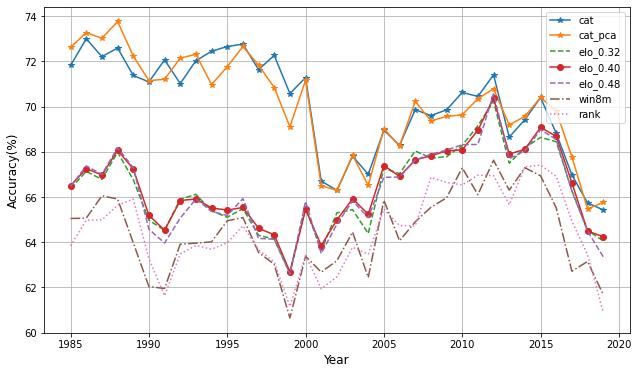

In [146]:
n=6 
n_end = -1

plt.figure(figsize=(10.5,6))
plt.plot(matrix_n.year.unique()[n:n_end],acc_cat_year[n:n_end],'-*')
plt.plot(matrix_n.year.unique()[n:n_end],acc_cat_pca_year[n:n_end],'-*')

plt.plot(matrix_n.year.unique()[n:n_end],acc_elo4_year[n:n_end],'--')
#plt.plot(matrix_n.year.unique()[n:n_end],acc_elo2_year[n:n_end],'--')
plt.plot(matrix_n.year.unique()[n:n_end],acc_elo_year[n:n_end],'-o')
#plt.plot(matrix_n.year.unique()[n:n_end],acc_elo1_year[n:n_end],'--')
plt.plot(matrix_n.year.unique()[n:n_end],acc_elo3_year[n:n_end],'--')

#plt.plot(matrix_n.year.unique()[n:n_end],acc_win4m_year[n:n_end],'-.')
#plt.plot(matrix_n.year.unique()[n:n_end],acc_win6m_year[n:n_end],'-.')
plt.plot(matrix_n.year.unique()[n:n_end],acc_win8m_year[n:n_end],'-.')

plt.plot(matrix_n.year.unique()[n:n_end],acc_rank_year[n:n_end],':')
plt.xlabel('Year',fontsize = 12)
plt.ylabel('Accuracy(%)',fontsize = 12)
#plt.legend(['cat','cat_pca','elo_0.32','elo_0.36','elo_0.40','elo_0.44','elo_0.48','win4m','win6m','win8m','rank'])
plt.legend(['cat','cat_pca','elo_0.32','elo_0.40','elo_0.48','win8m','rank'])

plt.grid()

* The prediction accuracy of the catboost model fluctuates over the years in between ~72% and ~65%.
* Changing the parameter s in the elo model doesn't show significant change in the Elo ranking
* Prediction accuracy based on rank shows similar accuracy with overall winning over past 6 to 8 months. The accuracy of rank improved after 1984, probably due to a modification in the rank point calculation. 

The accuracy of winner prediction based on catboost is: 68.635%
The accuracy of winner prediction based on cat_pca is: 68.829%
The accuracy of winner prediction based on Elo is: 67.655%
The accuracy of winner prediction based on Elo_sf is: 67.358%
The accuracy of winner prediction based on ranking is: 65.659%
The accuracy of winner prediction based on win_8m is: 65.302%
The accuracy of winner prediction based on win_ratio is: 53.402%


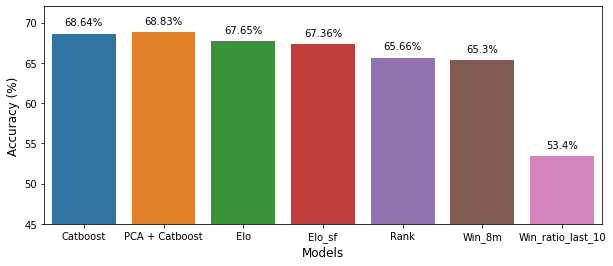

In [286]:
from sklearn.metrics import accuracy_score

year_end = 2019

year_begin = 2010

condition = (matrix_n.year> year_begin)&(matrix_n.year<= year_end)

y_true = matrix_n[condition]['p1_win']

y_pred_cat = matrix_n[condition]['y_pred_cat'] > 0
acc_cat = accuracy_score(y_true, y_pred_cat)
print('The accuracy of winner prediction based on catboost is: {}%'.format(round(acc_cat*100,3)))

y_pred_cat_pca = matrix_n[condition]['y_pred_cat_pca'] > 0
acc_cat_pca = accuracy_score(y_true, y_pred_cat_pca)
print('The accuracy of winner prediction based on cat_pca is: {}%'.format(round(acc_cat_pca*100,3)))

y_pred_elo = matrix_n[condition]['win_pred_1-2'] > 0
acc_elo = accuracy_score(y_true, y_pred_elo)
print('The accuracy of winner prediction based on Elo is: {}%'.format(round(acc_elo*100,3)))


y_pred_elosf = matrix_n[condition]['win_pred_sf_1-2'] > 0
acc_elosf = accuracy_score(y_true, y_pred_elosf)
print('The accuracy of winner prediction based on Elo_sf is: {}%'.format(round(acc_elosf*100,3)))

y_pred_rank = matrix_n[condition]['rank_1-2'] < 0 
acc_rank = accuracy_score(y_true, y_pred_rank)
print('The accuracy of winner prediction based on ranking is: {}%'.format(round(acc_rank*100,3)))


y_pred_win_8m = matrix_n[condition]['win_1-2_8m'] > 0 
acc_win_8m= accuracy_score(y_true, y_pred_win_8m)
print('The accuracy of winner prediction based on win_8m is: {}%'.format(round(acc_win_8m*100,3)))

y_pred_win_ratio = matrix_n[condition]['win_ratio_1-2_last_10'] > 0 
acc_win_ratio= accuracy_score(y_true, y_pred_win_ratio)
print('The accuracy of winner prediction based on win_ratio is: {}%'.format(round(acc_win_ratio*100,3)))


acc_baseline = pd.DataFrame()
acc_baseline['Catboost'] = [acc_cat * 100]
acc_baseline['PCA + Catboost'] = [acc_cat_pca * 100]

acc_baseline['Elo'] = [acc_elo * 100]
acc_baseline['Elo_sf'] = [acc_elosf * 100]
acc_baseline['Rank'] = [acc_rank * 100]
acc_baseline['Win_8m'] = [acc_win_8m * 100]
acc_baseline['Win_ratio_last_10'] = [acc_win_ratio * 100]
acc_baseline

plt.figure(figsize =(10,4))
bar1 = sns.barplot(data=acc_baseline)
plt.ylim(45,72)
plt.ylabel('Accuracy (%)',fontsize=12)
plt.xlabel('Models',fontsize=12)


 
for i, col in enumerate(acc_baseline.columns):
    
    bar1.text(i,acc_baseline[col].values+1, str(np.round(acc_baseline.loc[0,col],2))+'%', color='black', ha="center")

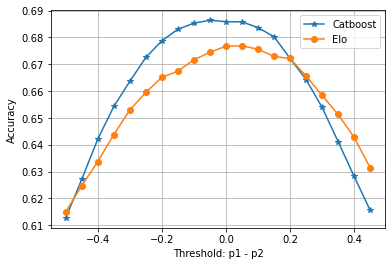

In [461]:
# we can see how the threshold of winning probability affect the accuracy
condition = (matrix_n.year> year_begin)&(matrix_n.year<= year_end)
y_true = matrix_n[condition]['p1_win']
acc_elo_thr = []
acc_cat_thr = []
threshold = np.arange(-0.5,0.5,0.05)

for i, thr in enumerate(threshold):
    y_pred_elo = matrix_n[condition]['win_pred_1-2'] > thr;
    acc_elo_thr.append(accuracy_score(y_true, y_pred_elo));
    
    y_pred_cat = matrix_n[condition]['y_pred_cat_prob_1-2'] > thr;
    acc_cat_thr.append(accuracy_score(y_true, y_pred_cat));
    
plt.figure
plt.plot(threshold,acc_cat_thr,'*-');
plt.plot(threshold,acc_elo_thr,'o-');
plt.xlabel('Threshold: p1 - p2');
plt.ylabel('Accuracy');
plt.legend(['Catboost','Elo']);
plt.grid()

#### We further examine how the performance varies for different ranges of rankings

In [152]:
# We further examine how the performance varies for different ranges of rankings
acc_cat_year_top50 = []
acc_elo_year_top50 = []
acc_cat_year_top100 = []
acc_elo_year_top100 = []
acc_cat_year_below100 = []
acc_elo_year_below100 = []

for n,i in enumerate(matrix_n.year.unique()):
    
    y_pred_cat_top50 = matrix_n[(matrix_n.year==i)&(matrix_n.p1_rank <=50)]['y_pred_cat']
    y_pred_elo_top50 = 1*(matrix_n[(matrix_n.year==i)&(matrix_n.p1_rank <=50)]['p1_win_pred']>0.5) 
    y_true_top50 = matrix_n[(matrix_n.year==i)&(matrix_n.p1_rank <=50)]['p1_win']
    
    y_pred_cat_top100 = matrix_n[(matrix_n.year==i)&(matrix_n.p1_rank >50)&(matrix_n.p1_rank <=100)]['y_pred_cat']
    y_pred_elo_top100 = 1*(matrix_n[(matrix_n.year==i)&(matrix_n.p1_rank >50)&(matrix_n.p1_rank <=100)]['p1_win_pred']>0.5) 
    y_true_top100 = matrix_n[(matrix_n.year==i)&(matrix_n.p1_rank >50)&(matrix_n.p1_rank <=100)]['p1_win']
    
    y_pred_cat_below100 = matrix_n[(matrix_n.year==i)&(matrix_n.p1_rank >100)]['y_pred_cat']
    y_pred_elo_below100 = 1*(matrix_n[(matrix_n.year==i)&(matrix_n.p1_rank >100)]['p1_win_pred']>0.5) 
    y_true_below100 = matrix_n[(matrix_n.year==i)&(matrix_n.p1_rank >100)]['p1_win']
   
        
    acc_cat_top50 = accuracy_score(y_true_top50, y_pred_cat_top50)*100
    acc_cat_year_top50.append(acc_cat_top50)
    
    acc_elo_top50 = accuracy_score(y_true_top50, y_pred_elo_top50)*100
    acc_elo_year_top50.append(acc_elo_top50)
    
    acc_cat_top100 = accuracy_score(y_true_top100, y_pred_cat_top100)*100
    acc_cat_year_top100.append(acc_cat_top100)
    
    acc_elo_top100 = accuracy_score(y_true_top100, y_pred_elo_top100)*100
    acc_elo_year_top100.append(acc_elo_top100)
    
    acc_cat_below100 = accuracy_score(y_true_below100, y_pred_cat_below100)*100
    acc_cat_year_below100.append(acc_cat_below100)
    
    acc_elo_below100 = accuracy_score(y_true_below100, y_pred_elo_below100)*100
    acc_elo_year_below100.append(acc_elo_below100)
    
    

C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\numpy\lib\function_base.py:393: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


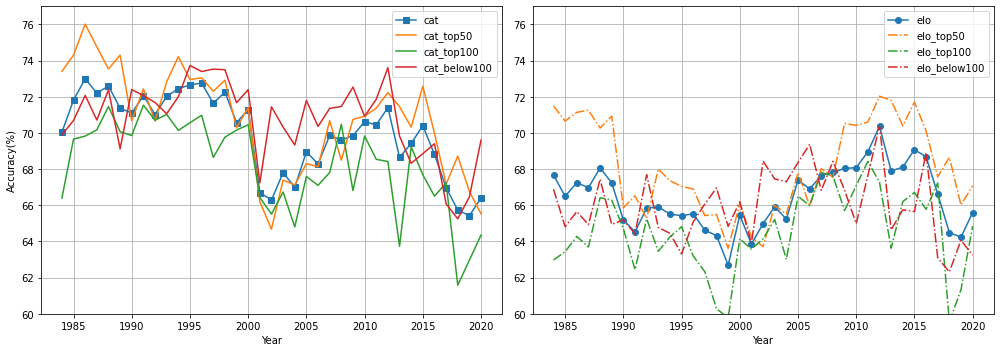

In [159]:
n=5
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
plt.plot(matrix_n.year.unique()[n:],acc_cat_year[n:],'-s')
plt.plot(matrix_n.year.unique()[n:],acc_cat_year_top50[n:],'-')
plt.plot(matrix_n.year.unique()[n:],acc_cat_year_top100[n:],'-')
plt.plot(matrix_n.year.unique()[n:],acc_cat_year_below100[n:],'-')
plt.xlabel('Year')
plt.ylabel('Accuracy(%)')
plt.legend(['cat','cat_top50','cat_top100','cat_below100'])
plt.ylim(60,77)
plt.grid()

plt.subplot(1,2,2)
plt.plot(matrix_n.year.unique()[n:],acc_elo_year[n:],'-o')
plt.plot(matrix_n.year.unique()[n:],acc_elo_year_top50[n:],'-.')
plt.plot(matrix_n.year.unique()[n:],acc_elo_year_top100[n:],'-.')
plt.plot(matrix_n.year.unique()[n:],acc_elo_year_below100[n:],'-.')

plt.xlabel('Year')
#plt.ylabel('Accuracy(%)')
plt.legend(['elo','elo_top50','elo_top100','elo_below100'])
plt.ylim(60,77)

plt.grid()

plt.tight_layout()

The prediction accuracy for players with ranking in top 50 or below 100 are higher. 

Let's have a further look how the prediction accurancy varies for different rank and rank difference

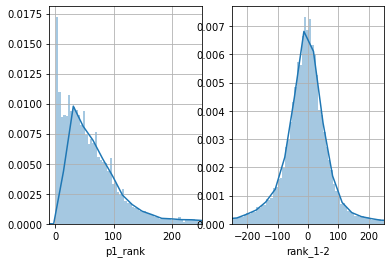

In [178]:
condition = (matrix_n.year> year_begin)&(matrix_n.year<= year_end)

plt.figure;
plt.subplot(1,2,1);
sns.distplot(matrix_n[condition]['p1_rank'],bins=500);
plt.xlim(-10,250)
plt.grid()

plt.subplot(1,2,2);

sns.distplot(matrix_n[condition]['rank_1-2'],bins=500);
plt.xlim(-250,250)
plt.grid()

In [279]:

condition_1 = (matrix_n.year> year_begin)&(matrix_n.year<= year_end)

# intervals for rank of player 1
rank_array = [1,25,50,100,max(matrix_n[condition_1]['p1_rank'])]

# intervals for rank difference (absolute value)
rank_diff_array = [1,25,50,100,max(matrix_n[condition_1]['rank_1-2'])]

acc_vs_rank_cat = np.empty((len(rank_array)-1,len(rank_diff_array)-1))
rank_count =  np.empty((len(rank_array)-1,len(rank_diff_array)-1))

for i,rank in enumerate(rank_array[0:-1]):
    
    for j,rank_diff in enumerate(rank_diff_array[0:-1]):
        
        condition_2 = (matrix_n['p1_rank']>=rank) & (matrix_n['p1_rank']<rank_array[i+1])
        condition_3 = (abs(matrix_n['rank_1-2'])>=rank_diff) & (abs(matrix_n['rank_1-2'])<rank_diff_array[j+1])
        
        count = matrix_n[condition_1&condition_2&condition_3]['p1_win'].shape[0]
        y_true_rank = matrix_n[condition_1&condition_2&condition_3]['p1_win']
        y_pred_cat_rank = matrix_n[condition_1&condition_2&condition_3]['y_pred_cat_pca'] > 0.5
        y_pred_elo_rank = matrix_n[condition_1&condition_2&condition_3]['win_pred_1-2'] > 0
        
        acc_cat_rank = accuracy_score(y_true_rank, y_pred_cat_rank)*100
        acc_elo_rank = accuracy_score(y_true_rank, y_pred_elo_rank)*100
        
        acc_vs_rank_cat[i,j] = acc_cat_rank - acc_elo_rank
        rank_count[i,j] = count
        
        
acc_vs_rank_cat

array([[ 0.21715527,  0.59800664,  0.3986711 ,  0.64935065],
       [ 0.54858934,  0.50391937,  0.64585576,  0.50955414],
       [ 3.21556173,  1.16715298,  0.24727992, -0.70093458],
       [ 1.78890877,  2.35849057,  0.        ,  4.        ]])

In [216]:
matrix_n[condition_1&condition_2&condition_3]['p1_win'].shape[0]

2575

Text(0.5, 1.0, 'Count')

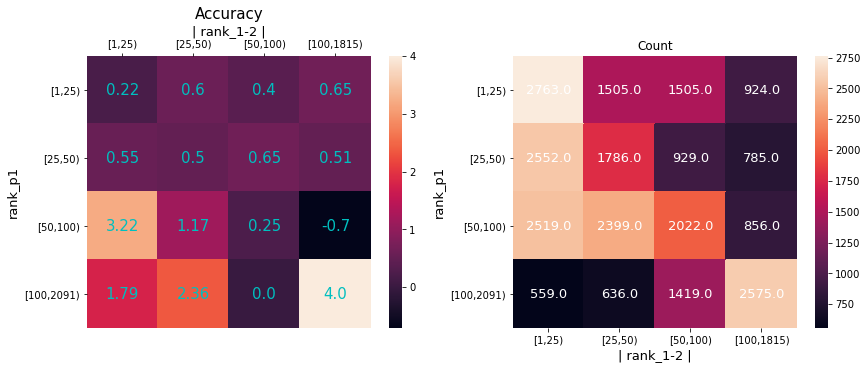

In [293]:
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)
im_1 = sns.heatmap(acc_vs_rank_cat)

y_ticklabel = []
x_ticklabel = []

for i,rank in enumerate(rank_array[0:-1]):
    
    y_ticklabel.append('[{},{})'.format(rank_array[i],round(rank_array[i+1])))
    
    for j,rank_diff in enumerate(rank_diff_array[0:-1]):
        
        im_1.text(j+0.5,i+0.5,np.round(acc_vs_rank_cat[i,j],2),color="c",ha="center", va="center",fontsize = 15) 
        
        if i == 0 :
            x_ticklabel.append('[{},{})'.format(rank_diff_array[j],round(rank_diff_array[j+1])))


im_1.set_yticklabels(y_ticklabel)
im_1.set_xticklabels(x_ticklabel)

im_1.set_ylabel('rank_p1',fontsize = 13)
im_1.set_xlabel('| rank_1-2 |',fontsize = 13)
plt.yticks(rotation = 0)
plt.xticks(rotation = 0)
im_1.xaxis.tick_top()
im_1.xaxis.set_label_position('top')
plt.title('Accuracy',fontsize = 15)

plt.subplot(1,2,2)
im_2 = sns.heatmap(rank_count)

for i,rank in enumerate(rank_array[0:-1]):
    
    for j,rank_diff in enumerate(rank_diff_array[0:-1]):
        
        im_2.text(j+0.5,i+0.5,np.round(rank_count[i,j],0),color="white",ha="center", va="center",fontsize = 13)
        
        
im_2.set_yticklabels(y_ticklabel)
im_2.set_xticklabels(x_ticklabel)

im_2.set_ylabel('rank_p1',fontsize = 13)
im_2.set_xlabel('| rank_1-2 |',fontsize = 13)
plt.yticks(rotation = 0)
plt.xticks(rotation = 0)
plt.title('Count')


In [273]:
y_ticklabel

['[1,10)', '[10,25)', '[25,50)', '[50,100)', '[100,2091.0)']

We can check how the winning/losing vs the features' distribution

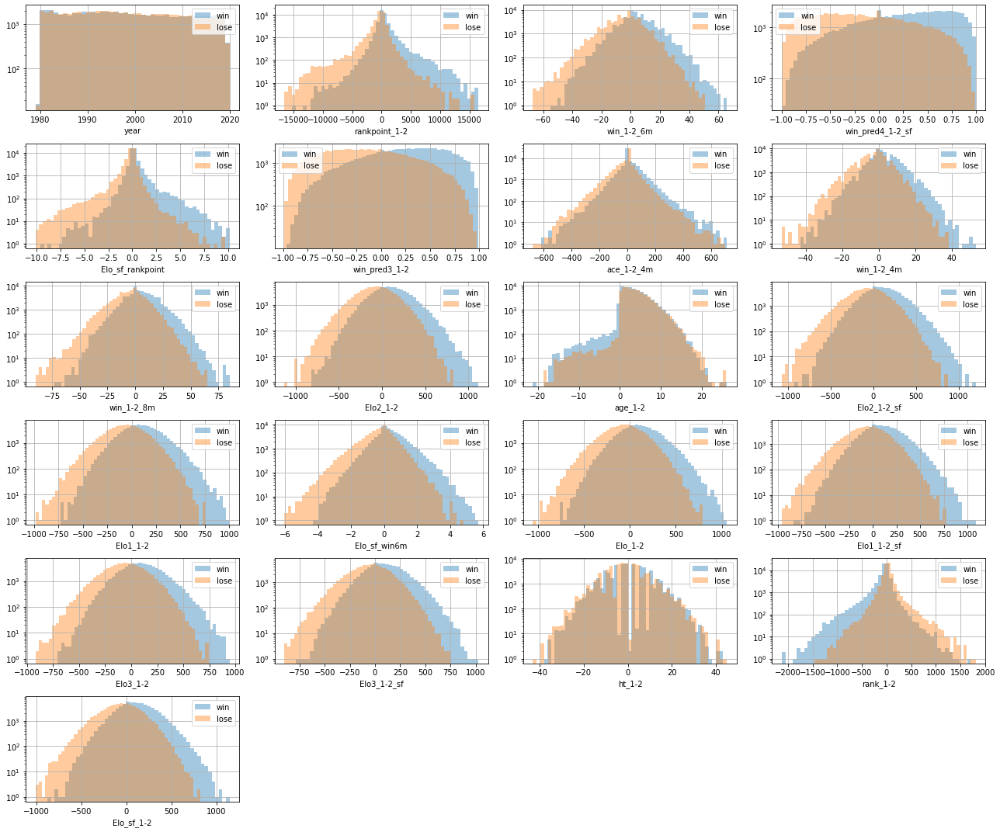

In [296]:
# col_feature = ['Elo_1-2','Elo_sf_1-2', 'win_pred_1-2','win_pred_sf_1-2',
#                'win_1-2_6m', 'rank_1-2','rankpoint_1-2','seed_code_1-2',  
#                'ace_1-2_6m', 'df_1-2_6m', '1stWon_1-2_6m','2ndWon_1-2_6m',
#                'ace_1-2_last_10', 'df_1-2_last_10', '1stWon_1-2_last_10','2ndWon_1-2_last_10',
#         'bpsr_1-2_6m', 'bpcr_1-2_6m', '1-2_sets_last_10', 'p1_win_ratio_last_10',         
#        'bpsr_1-2_last_10','bpcr_1-2_last_10', 'bps_1-2_last_10', 'bpc_1-2_last_10', 
#         ]

col_feature = ['year',
 'rankpoint_1-2',
 'win_1-2_6m',
 'win_pred4_1-2_sf',
 'Elo_sf_rankpoint',
 'win_pred3_1-2',
 'ace_1-2_4m',

 'win_1-2_4m',
 'win_1-2_8m',
 'Elo2_1-2',

 'age_1-2',
 'Elo2_1-2_sf',
 'Elo1_1-2',
 'Elo_sf_win6m',
 'Elo_1-2',
 'Elo1_1-2_sf',
 'Elo3_1-2',
 'Elo3_1-2_sf',
 'ht_1-2',
 'rank_1-2',
 'Elo_sf_1-2'] #'p2_entry',

df_win = matrix_n[matrix_n.p1_win == 1][col_feature].replace([np.inf, -np.inf], np.nan)
df_lose = matrix_n[matrix_n.p1_win == 0][col_feature].replace([np.inf, -np.inf], np.nan)

plt.figure(figsize=(18,15))
for i in range(len(col_feature)):
    plt.subplot(6,4,i+1)
    sns.distplot(df_win[col_feature[i]],kde=False,bins=min(df_win[col_feature[i]].nunique(),51))
    sns.distplot(df_lose[col_feature[i]],kde=False,bins=min(df_win[col_feature[i]].nunique(),51))
    plt.legend(['win','lose'])
    plt.yscale('log')
    plt.grid()
    
    if col_feature[i] == '1-2_sets_last_10':
        plt.xlim(-50,50)
    
plt.tight_layout() 

In [95]:
min(df_win['year'].nunique(),51)

42

It's quite clear that the winning and losing are skewed on the two sides of the feature difference '1-2'. Surprisingly, the technical performance distribution of the pair of players does not show significant difference in the winning and losing, but the performance over the past 6 months do show more noticeable difference. 

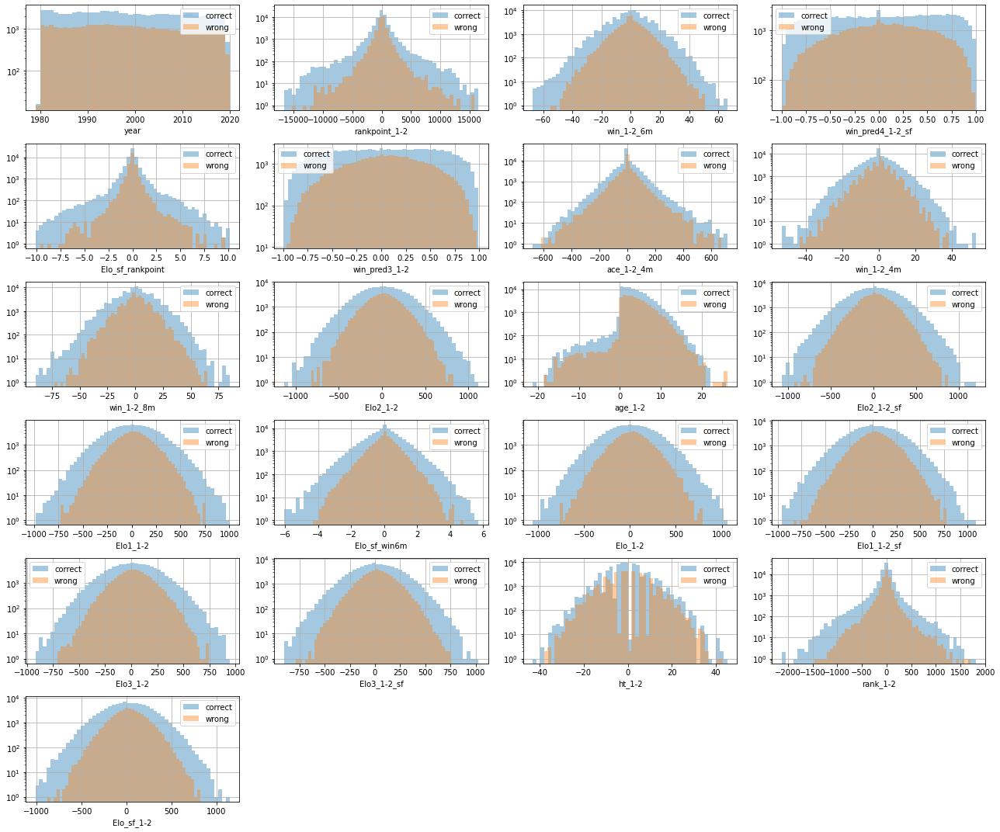

In [172]:
# let's have a look how the right/wrong prediction distribute over different parameters


df_correct = matrix_n[matrix_n.y_pred == matrix_n.p1_win][col_feature].replace([np.inf, -np.inf], np.nan)
df_wrong = matrix_n[matrix_n.y_pred != matrix_n.p1_win][col_feature].replace([np.inf, -np.inf], np.nan)

plt.figure(figsize=(18,15))
for i in range(len(col_feature)):
    plt.subplot(6,4,i+1)
    sns.distplot(df_correct[col_feature[i]],kde=False,bins=min(df_win[col_feature[i]].nunique(),51))
    sns.distplot(df_wrong[col_feature[i]],kde=False,bins=min(df_win[col_feature[i]].nunique(),51))
    plt.legend(['correct','wrong'])
    plt.yscale('log')
    plt.grid()
    
plt.tight_layout() 

The distribution of wrong prediction showed a pretty symmetric pattern around the zero, and from the previous figures, it seems to be the overlapped regime between the true winning and losing distributions.

Essentially, to have a better distinguishability between the distribution of winning and losing, we need to minimize the overlapped area between the winning and losing distribution. Can we create some synthetic features from multiple existing features? (e.g. Using, multiplication or other nonlinear functions to interact different features? -- checked, the answer is no)

In [ ]:
# create some synthetic features:
# 1. Elo *  rankpoint
# 2. Elo * win6m
# 3. Elo * win6m * rankpoint
# 4. Elo * win6m * rankpoint * (-seed_code)
# 5. Elo * bpcr_6m * bpsr_6m * ace_6m * df_6m * 1stwon * 2ndwon


* ### Neural network

Using TensorFlow backend.


To use neural network, we need to convert the categorical features into vector, it can be dummy onehot encoding, or use something like word to vec embodding.  

From the catboost result, it seems the player id has little impact on the final result. Let's go without player_id first.

In [311]:
 
col_catfeature=['tourney_level','surface','best_of','round','p1_entry','p2_entry']



col_numfeature = ['year','month','age_1-2', 'ht_1-2', 'rank_1-2','rankpoint_1-2', 'seed_code_1-2',
                  'Elo_1-2', 'Elo_sf_1-2','win_pred_1-2', 'win_pred_sf_1-2','win_1-2_6m','win_1-2_8m'
        ]


col_numfeature = ['year','month', 'age_1-2', 'ht_1-2', 'rank_1-2',
       'rankpoint_1-2', 'seed_code_1-2',
                  
        'p1_win_ratio_last_20','p1_win_ratio_last_10',  
         '1-2_sets_last_20','1-2_sets_last_10',
                  
        'Elo_1-2', 'Elo_sf_1-2','win_pred_1-2', 'win_pred_sf_1-2',
        'Elo1_1-2','Elo1_1-2_sf','win_pred1_1-2', 'win_pred1_1-2_sf', 
        'Elo2_1-2','Elo2_1-2_sf', 'win_pred2_1-2','win_pred2_1-2_sf',
        'Elo3_1-2', 'Elo3_1-2_sf','win_pred4_1-2', 'win_pred4_1-2_sf',
        'Elo4_1-2', 'Elo4_1-2_sf', 'win_pred3_1-2','win_pred3_1-2_sf',
     
        'win_1-2_4m', 'ace_1-2_4m', 'df_1-2_4m','1stWon_1-2_4m', 
       '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
        'win_1-2_6m', 'ace_1-2_6m', 'df_1-2_6m', '1stWon_1-2_6m',
       '2ndWon_1-2_6m', 'bpsr_1-2_6m', 'bpcr_1-2_6m', 
       'win_1-2_8m', 'ace_1-2_8m', 'df_1-2_8m', '1stWon_1-2_8m',
       '2ndWon_1-2_8m', 'bpsr_1-2_8m', 'bpcr_1-2_8m', 
                  
        'Elo_sf_rankpoint', 'Elo_sf_win6m',
       'Elo_sf_rankpoint_win6m', 'Elo_sf_rp_win6m_seed',       
       'Elo_sf_rp_win6m_winratio',
       'bpcr_bpsr_ace_1stwon_2ndwon_6m',
       'bpcr_bpsr_ace_1stwon_2ndwon_last_10']


col_numfeature = ['year','month','seed_code_1-2', 'rank_1-2', 'bps_1-2_last_10', 'bps_1-2_last_20',
       'df_1-2_last_10', 'df_1-2_last_20', 'age_1-2', '1-2_set_5_last_20',
       '1-2_set_5_last_10', 'bpsr_1-2_last_10', 'bpsr_1-2_last_20',
       '2ndWon_1-2_last_20', '2ndWon_1-2_last_10', 'ht_1-2',
       '1-2_set_4_last_20', '1-2_set_4_last_10', 'ace_1-2_last_20',
       'ace_1-2_last_10', '1-2_set_3_last_20', '1-2_set_3_last_10',
       '1stWon_1-2_last_20', '1stWon_1-2_last_10', 'bpcr_1-2_last_20',
       'bpcr_1-2_last_10', 'df_1-2_4m', '1-2_set_1_last_20',
       '1-2_set_1_last_10', 'bpc_1-2_last_20', 'bpc_1-2_last_10',
       '1-2_set_2_last_20', '1-2_set_2_last_10', 'df_1-2_6m', 'df_1-2_8m',
       'ace_1-2_4m', 'ace_1-2_6m', 'ace_1-2_8m', '1-2_sets_last_20',
       '1-2_sets_last_10', '2ndWon_1-2_4m', 'bpsr_1-2_4m', 'bpcr_1-2_4m',
       '1stWon_1-2_4m', '2ndWon_1-2_6m', 'bpsr_1-2_6m', '2ndWon_1-2_8m',
       'bpcr_1-2_6m', 'bpsr_1-2_8m', '1stWon_1-2_6m', 'bpcr_1-2_8m',
       '1stWon_1-2_8m', 'rankpoint_1-2', 'win_1-2_4m', 'win_1-2_6m',
       'win_1-2_8m', 'Elo3_1-2_sf', 'Elo4_1-2_sf', 'Elo1_1-2_sf',
       'Elo2_1-2_sf', 'win_pred4_1-2_sf', 'win_pred3_1-2_sf', 'Elo_sf_1-2',
       'win_pred2_1-2_sf', 'win_pred1_1-2_sf', 'win_pred_sf_1-2', 'Elo4_1-2',
       'Elo2_1-2', 'win_pred4_1-2', 'Elo_1-2', 'Elo3_1-2', 'Elo1_1-2',
       'win_pred2_1-2', 'win_pred_1-2', 'win_pred3_1-2', 'win_pred1_1-2','win_ratio_1-2_last_20','win_ratio_1-2_last_10']


col_target = ['p1_win']
matrix_n2 = matrix_n[col_catfeature+col_numfeature]
matrix_n2[col_catfeature].nunique()

tourney_level     6
surface           6
best_of           2
round            10
p1_entry          8
p2_entry          7
dtype: int64

In [204]:
matrix_n2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 135825 entries, 0 to 135824
Data columns (total 65 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   tourney_level                        135825 non-null  object 
 1   surface                              135825 non-null  object 
 2   best_of                              135825 non-null  object 
 3   round                                135825 non-null  object 
 4   p1_entry                             135825 non-null  object 
 5   p2_entry                             135825 non-null  object 
 6   year                                 135825 non-null  int64  
 7   month                                135825 non-null  int64  
 8   age_1-2                              134146 non-null  float64
 9   ht_1-2                               118052 non-null  float64
 10  rank_1-2                             124774 non-null  float64
 11  rankpoint_1-2

There are some missing information in both the categorical and numerical features. For categorical features, we choose to ignore them during one-hot encoding, for numerical features, the missing values are the difference between palyer 1 and player 2, by default we set them to zero if it is not provided

In [312]:

#convert categorical data to one-hot encoding
ohe = OneHotEncoder(handle_unknown='ignore')    
df_ohe = ohe.fit_transform(matrix_n2[col_catfeature]).toarray()

# convert dataframe to numpy array
array_n2 = matrix_n2[col_numfeature].replace([np.inf, -np.inf], np.nan).fillna(0).to_numpy()
# normalize the data before putting into NN

array_n2 = StandardScaler().fit_transform(array_n2)
X_n2 = np.concatenate((df_ohe,array_n2),axis=1)

Define the model

In [315]:
del array_n2, df_ohe

In [316]:
# we'll do a grid search of the hyperparameter
# ref: https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/

import numpy
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.constraints import maxnorm
from keras.layers import Dropout



In [317]:
# Function to create model, required for KerasClassifier
#def create_model(layers=[20,1],learning_rate=0.001,drop_out = 0.05,loss_function = 'binary_crossentropy',eval_metric = 'accuracy'):

def build_nn(ly_m1=40,ly_m2=20,ly_f=1,learning_rate=0.001,drop_out = 0.05,loss_function = 'binary_crossentropy',eval_metric = 'accuracy'):
 
    # fix random seed for reproducibility
    from numpy.random import seed
    seed(1)
    import tensorflow
    tensorflow.random.set_seed(2)
    
    from keras.models import Sequential
    from keras.layers import Dense
    from keras.wrappers.scikit_learn import KerasClassifier
    
    # create a dense neural network model
  
    model = Sequential()

#     for i,ly in enumerate(layers):

#         print('layer {}, {} neurons;'.format(i,ly))

#         if i==0:
#             model.add(Dense(ly, activation='relu',kernel_constraint=maxnorm(3),kernel_initializer='uniform'))
#             model.add(Dropout(drop_out))

#         elif (i>0) & (i+1<len(layers)):
#             model.add(Dense(ly, activation='relu',kernel_constraint=maxnorm(3)))
#             model.add(Dropout(drop_out)) 

#         elif i+1 == len(layers):    
#             model.add(Dense(ly, activation='sigmoid'))

    model.add(Dense(ly_m1, activation='relu',kernel_initializer='uniform'))
    model.add(Dropout(drop_out))         
    model.add(Dense(ly_m2, activation='relu'))
    model.add(Dropout(drop_out)) 
    model.add(Dense(ly_f, activation='sigmoid'))

    # compile the keras model
    opt = keras.optimizers.Adam(learning_rate=learning_rate)

    model.compile(loss=loss_function, optimizer=opt, metrics=[eval_metric])

    
    
    
    return model

In [349]:
# this is a function to define the neural network traning and evaluation

def train_nn(build_fn=None,grid_para=None,cv=None,verbose=False,train_data=None,val_data=None,test_data=None,
              loss_function = 'binary_crossentropy',eval_metric = 'accuracy',plot_progress = False,retrain_best = False):
  
    # fix random seed for reproducibility
    from numpy.random import seed
    seed(1)
#     from tensorflow import set_random_seed
#     set_random_seed(2)
    import tensorflow
    tensorflow.random.set_seed(2)
    
    
    # create model
    model_nn = KerasClassifier(build_fn=build_fn, verbose=2)

    
    from sklearn.model_selection import GridSearchCV
     
    X_train, y_train = train_data[0],train_data[1]
    X_val, y_val = val_data[0],val_data[1]
   
    #X_test, y_test = test_data[0],test_data[1]
    
    
    """Instead of using the GridSearchCV for finding the best hyperparameters, we only use it for cross-validation,but keep
    all the results, including the hyperparameters and the metrics of the model in train, validation and test sets.
     """
    
    # pay attention, * is used before the list to unpack the list into multiple argument for function
    # https://stackoverflow.com/questions/36901/what-does-double-star-asterisk-and-star-asterisk-do-for-parameters
    

   ####
    cases = list(product(*list(grid_para.values())[0:])) 

    cases = pd.DataFrame(columns = grid_para.keys(), data = cases)

    # define early stopping criteria

    es = EarlyStopping(monitor='val_loss', mode='min', verbose=False, patience=20)

    cv = tscv

    for row in cases.itertuples():

        print(row)
        idx = row.Index

        """
        row_bracket generate a dictionary of the form {key_A: [value_A],key_B: [value_B], ...  }
        which is required for the GridSearchCV param input 
        """

        row_bracket = list(map(lambda x: [x], row[1:]))
        param = dict(zip(grid_para.keys(),row_bracket))
        print(param)

        nn_grid = GridSearchCV(estimator=model_nn, param_grid=param, cv = cv,n_jobs = 1,refit = True)

        nn_grid.fit(X_train, y_train, 
                    validation_data=(X_val, y_val),
                    callbacks=[es],
                    shuffle = False,
                    verbose=verbose          
                 )


        train_metric = nn_grid.best_estimator_.model.history.history[eval_metric]
        train_loss = nn_grid.best_estimator_.model.history.history['loss']
        val_metric = nn_grid.best_estimator_.model.history.history['val_'+eval_metric]
        val_loss = nn_grid.best_estimator_.model.history.history['val_loss']

        cases.loc[idx,'metric_nn_train'] = max(train_metric)
        #cases.loc[idx,'loss_nn_train'] =nn_grid.best_estimator_.get_best_score()['loss']
        cases.loc[idx,'metric_nn_val'] = max(val_metric)
        #cases.loc[idx,'loss_nn_val'] =nn_grid.best_estimator_.get_best_score()['validation'][loss_function]



        if plot_progress == True:
            plot_train_progress(param,loss_function,train_loss,val_loss,eval_metric,train_metric,val_metric)


    # retrain the best parameters

    best_index = cases.metric_nn_val.argmax()

    # use .loc[best_index:best_index] instead of .loc[best_index] to keep the dataframe format
    # avoid chaning the int64 dtypes to float64, which will be wrong format for parameters like batch_size and epochs

    best_para = cases.loc[best_index:best_index,list(grid_para.keys())] 

    # use orient='list' to covert the dataframe to dictionary in the form of {column -> [values]}
    best_para = best_para.to_dict(orient='list').values()

    param = dict(zip(grid_para.keys(),best_para))

    print('best parameters:',param)
    
    if retrain_best == True:

        nn_grid = GridSearchCV(estimator=model_nn, param_grid=param, cv = cv,n_jobs = 1)#,refit = True)

        nn_grid.fit(X_train, y_train, 
                    validation_data=(X_val, y_val),
                    callbacks=[es],
                    shuffle = False,
                    verbose= False        
                 )

        train_metric = nn_grid.best_estimator_.model.history.history[eval_metric]
        train_loss = nn_grid.best_estimator_.model.history.history['loss']
        val_metric = nn_grid.best_estimator_.model.history.history['val_'+eval_metric]
        val_loss = nn_grid.best_estimator_.model.history.history['val_loss']

        plot_train_progress(param,loss_function,train_loss,val_loss,eval_metric,train_metric,val_metric)

    return cases, param, nn_grid
    

In [319]:
def plot_train_progress(param,loss_function,train_loss,val_loss,eval_metric,train_metric,val_metric):
    
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('Epochs',fontsize=15)
    ax1.set_ylabel(loss_function, color=color,fontsize=15)
    ax1.plot(train_loss, color=color,lw=2)
    ax1.plot(val_loss,'-.', color=color,lw=2)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel(eval_metric, color=color,fontsize=15)  # we already handled the x-label with ax1
    ax2.plot(train_metric, color=color,lw=2)
    ax2.plot(val_metric, '-.',color=color,lw=2)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.legend(['train','validation'])
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.title(param)
    plt.show()

In [313]:
year_start = 1985
year_train = 2000
year_val = 2010
year_end = 2019

# define the index for train, validation and test sets
index_train = matrix_n2[(matrix_n2.year>=year_start) &(matrix_n2.year<=year_train)].index
index_val = matrix_n2[(matrix_n2.year>year_train) & (matrix_n2.year<=year_val)].index
index_test = matrix_n2[(matrix_n2.year>year_val) & (matrix_n2.year<=year_end) ].index


In [314]:
# generate features and targets 
X_train_2 = np.nan_to_num(X_n2[index_train,:])
X_val_2 = np.nan_to_num(X_n2[index_val,:])
X_test_2 = np.nan_to_num(X_n2[index_test,:])

y_train_2 = matrix_n[(matrix_n2.year>=year_start) &(matrix_n2.year<=year_train)][col_target].to_numpy()
y_val_2 = matrix_n[(matrix_n2.year>year_train) & (matrix_n2.year<=year_val)][col_target].to_numpy()
y_test_2 = matrix_n[(matrix_n2.year>year_val) & (matrix_n2.year<=year_end)][col_target].to_numpy()

In [315]:
# combine into data sets that will be used for training
train_data_2 = [X_train_2, y_train_2]
val_data_2 = [X_val_2, y_val_2]
test_data_2 = [X_test_2, y_test_2]

In [320]:
len(X_train_2[0,:])

117

Pandas(Index=0, ly_m1=80, ly_m2=10, ly_f=1, batch_size=50, epochs=150, learning_rate=0.0005, drop_out=0.05)
{'ly_m1': [80], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.0005], 'drop_out': [0.05]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 3s 138us/step - loss: 0.5943 - accuracy: 0.6790 - val_loss: 0.5962 - val_accuracy: 0.6779
Epoch 2/150
19339/19339 [==============================] - 3s 131us/step - loss: 0.5872 - accuracy: 0.6843 - val_loss: 0.5931 - val_accuracy: 0.6800
Epoch 3/150
19339/19339 [==============================] - 3s 147us/step - loss: 0.5857 - accuracy: 0.6861 - val_loss: 0.5926 - val_accuracy: 0.6791
Epoch 4/150
19339/19339 [==============================] - 2s 106us/step - loss: 0.5850 - accuracy: 0.6886 - val_loss: 0.5952 - val_accuracy: 0.6758
Epoch 5/150
19339/19339 [==============================] - 3s 147us/step - loss: 0.5836 - accuracy: 0.6889 - val_loss:

58017/58017 [==============================] - 15s 256us/step - loss: 0.5972 - accuracy: 0.6784 - val_loss: 0.5892 - val_accuracy: 0.6813
Epoch 8/150
58017/58017 [==============================] - 14s 241us/step - loss: 0.5967 - accuracy: 0.6797 - val_loss: 0.5895 - val_accuracy: 0.6816
Epoch 9/150
58017/58017 [==============================] - 13s 226us/step - loss: 0.5956 - accuracy: 0.6803 - val_loss: 0.5902 - val_accuracy: 0.6802
Epoch 10/150
58017/58017 [==============================] - 14s 235us/step - loss: 0.5940 - accuracy: 0.6813 - val_loss: 0.5901 - val_accuracy: 0.6804
Epoch 11/150
58017/58017 [==============================] - 14s 239us/step - loss: 0.5938 - accuracy: 0.6819 - val_loss: 0.5912 - val_accuracy: 0.6785
Epoch 12/150
58017/58017 [==============================] - 15s 253us/step - loss: 0.5923 - accuracy: 0.6832 - val_loss: 0.5909 - val_accuracy: 0.6806
Epoch 13/150
58017/58017 [==============================] - 14s 244us/step - loss: 0.5922 - accuracy: 0.6838 

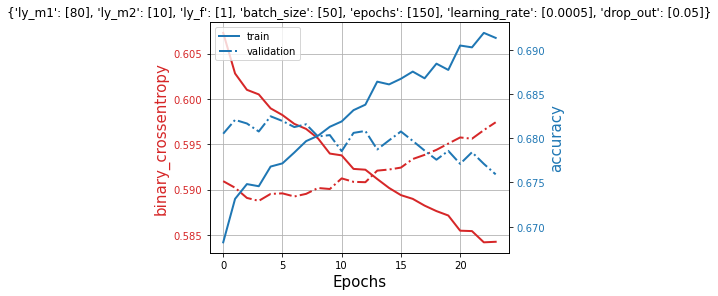

Pandas(Index=1, ly_m1=80, ly_m2=10, ly_f=1, batch_size=50, epochs=150, learning_rate=0.0005, drop_out=0.1)
{'ly_m1': [80], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.0005], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 5s 279us/step - loss: 0.5960 - accuracy: 0.6785 - val_loss: 0.5972 - val_accuracy: 0.6782
Epoch 2/150
19339/19339 [==============================] - 3s 130us/step - loss: 0.5895 - accuracy: 0.6846 - val_loss: 0.5934 - val_accuracy: 0.6791
Epoch 3/150
19339/19339 [==============================] - 2s 128us/step - loss: 0.5874 - accuracy: 0.6855 - val_loss: 0.5938 - val_accuracy: 0.6784
Epoch 4/150
19339/19339 [==============================] - 2s 129us/step - loss: 0.5876 - accuracy: 0.6879 - val_loss: 0.5960 - val_accuracy: 0.6778
Epoch 5/150
19339/19339 [==============================] - 3s 137us/step - loss: 0.5851 - accuracy: 0.6885 - val_loss: 0

58017/58017 [==============================] - 15s 253us/step - loss: 0.5990 - accuracy: 0.6785 - val_loss: 0.5890 - val_accuracy: 0.6811
Epoch 9/150
58017/58017 [==============================] - 14s 237us/step - loss: 0.5988 - accuracy: 0.6786 - val_loss: 0.5899 - val_accuracy: 0.6802
Epoch 10/150
58017/58017 [==============================] - 14s 241us/step - loss: 0.5972 - accuracy: 0.6801 - val_loss: 0.5893 - val_accuracy: 0.6805
Epoch 11/150
58017/58017 [==============================] - 14s 249us/step - loss: 0.5968 - accuracy: 0.6805 - val_loss: 0.5901 - val_accuracy: 0.6805
Epoch 12/150
58017/58017 [==============================] - 16s 277us/step - loss: 0.5950 - accuracy: 0.6819 - val_loss: 0.5897 - val_accuracy: 0.6806
Epoch 13/150
58017/58017 [==============================] - 15s 254us/step - loss: 0.5954 - accuracy: 0.6818 - val_loss: 0.5895 - val_accuracy: 0.6808
Epoch 14/150
58017/58017 [==============================] - 15s 260us/step - loss: 0.5946 - accuracy: 0.6836

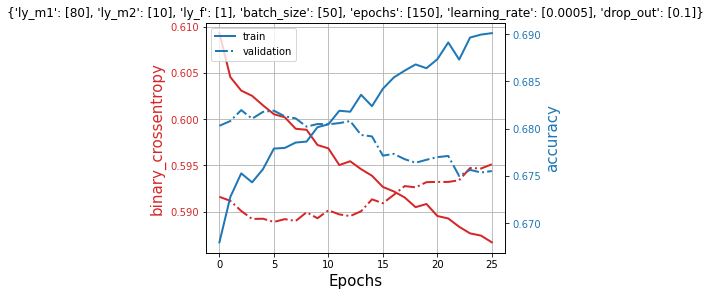

Pandas(Index=2, ly_m1=80, ly_m2=10, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.05)
{'ly_m1': [80], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.05]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 7s 362us/step - loss: 0.5940 - accuracy: 0.6806 - val_loss: 0.5962 - val_accuracy: 0.6775
Epoch 2/150
19339/19339 [==============================] - 6s 295us/step - loss: 0.5872 - accuracy: 0.6867 - val_loss: 0.5926 - val_accuracy: 0.6792
Epoch 3/150
19339/19339 [==============================] - 6s 325us/step - loss: 0.5855 - accuracy: 0.6865 - val_loss: 0.5944 - val_accuracy: 0.6781
Epoch 4/150
19339/19339 [==============================] - 6s 322us/step - loss: 0.5847 - accuracy: 0.6902 - val_loss: 0.5951 - val_accuracy: 0.6798
Epoch 5/150
19339/19339 [==============================] - 6s 315us/step - loss: 0.5828 - accuracy: 0.6898 - val_los

58017/58017 [==============================] - 12s 211us/step - loss: 0.5960 - accuracy: 0.6805 - val_loss: 0.5904 - val_accuracy: 0.6804
Epoch 10/150
58017/58017 [==============================] - 14s 242us/step - loss: 0.5946 - accuracy: 0.6812 - val_loss: 0.5907 - val_accuracy: 0.6806
Epoch 11/150
58017/58017 [==============================] - 12s 213us/step - loss: 0.5936 - accuracy: 0.6837 - val_loss: 0.5915 - val_accuracy: 0.6795
Epoch 12/150
58017/58017 [==============================] - 13s 224us/step - loss: 0.5924 - accuracy: 0.6835 - val_loss: 0.5918 - val_accuracy: 0.6799
Epoch 13/150
58017/58017 [==============================] - 6s 107us/step - loss: 0.5919 - accuracy: 0.6831 - val_loss: 0.5924 - val_accuracy: 0.6795
Epoch 14/150
58017/58017 [==============================] - 6s 108us/step - loss: 0.5908 - accuracy: 0.6848 - val_loss: 0.5933 - val_accuracy: 0.6776
Epoch 15/150
58017/58017 [==============================] - 5s 91us/step - loss: 0.5900 - accuracy: 0.6850 - 

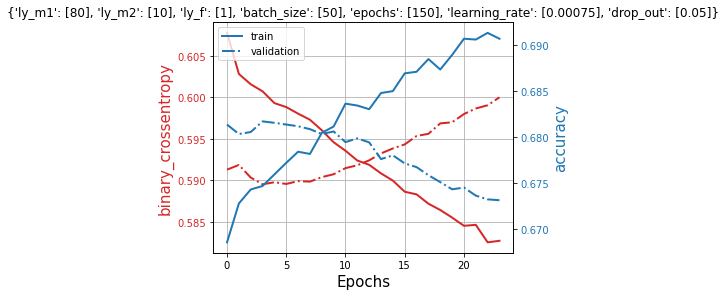

Pandas(Index=3, ly_m1=80, ly_m2=10, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [80], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 6s 305us/step - loss: 0.5957 - accuracy: 0.6783 - val_loss: 0.5947 - val_accuracy: 0.6782
Epoch 2/150
19339/19339 [==============================] - 6s 306us/step - loss: 0.5893 - accuracy: 0.6854 - val_loss: 0.5929 - val_accuracy: 0.6790
Epoch 3/150
19339/19339 [==============================] - 5s 266us/step - loss: 0.5873 - accuracy: 0.6859 - val_loss: 0.5959 - val_accuracy: 0.6766
Epoch 4/150
19339/19339 [==============================] - 6s 317us/step - loss: 0.5875 - accuracy: 0.6883 - val_loss: 0.5993 - val_accuracy: 0.6749
Epoch 5/150
19339/19339 [==============================] - 7s 369us/step - loss: 0.5849 - accuracy: 0.6895 - val_loss:

58017/58017 [==============================] - 12s 202us/step - loss: 0.5993 - accuracy: 0.6776 - val_loss: 0.5896 - val_accuracy: 0.6823
Epoch 9/150
58017/58017 [==============================] - 14s 248us/step - loss: 0.5990 - accuracy: 0.6792 - val_loss: 0.5903 - val_accuracy: 0.6830
Epoch 10/150
58017/58017 [==============================] - 14s 240us/step - loss: 0.5973 - accuracy: 0.6796 - val_loss: 0.5897 - val_accuracy: 0.6818
Epoch 11/150
58017/58017 [==============================] - 13s 230us/step - loss: 0.5965 - accuracy: 0.6804 - val_loss: 0.5905 - val_accuracy: 0.6813
Epoch 12/150
58017/58017 [==============================] - 12s 203us/step - loss: 0.5951 - accuracy: 0.6823 - val_loss: 0.5905 - val_accuracy: 0.6804
Epoch 13/150
58017/58017 [==============================] - 12s 204us/step - loss: 0.5955 - accuracy: 0.6803 - val_loss: 0.5913 - val_accuracy: 0.6806
Epoch 14/150
58017/58017 [==============================] - 12s 203us/step - loss: 0.5942 - accuracy: 0.6819

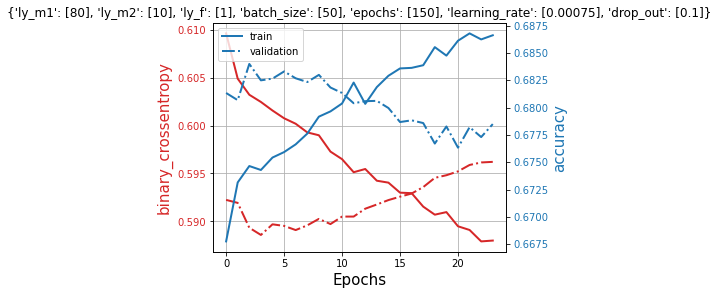

best parameters: {'ly_m1': [80], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}


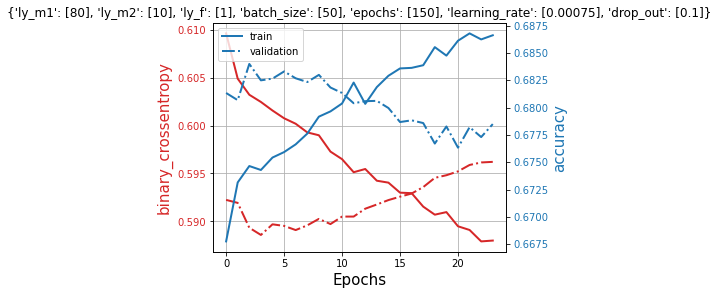

In [325]:
# define the layer structure
#layers = [[40,20,1]]

loss_function = 'binary_crossentropy'
eval_metric = 'accuracy'
# model_nn = build_nn(layers,learning_rate=0.001,drop_out = 0.05,loss_function = loss_function,eval_metric = eval_metric)
# model_nn

# create model
#model_nn = KerasClassifier(build_fn=create_model, verbose=2)

# define the grid search parameters

# number of neurons in the middle layers and output final layers
ly_m1 = [80]   
ly_m2 = [10]
ly_f = [1]
batch_size = [50]
epochs = [150]
learning_rate = [0.0005,0.00075]
drop_out = [0.05,0.1]

#param_grid = dict(layers = layers,batch_size=batch_size, epochs=epochs,learning_rate=learning_rate,drop_out=drop_out)

param_grid = dict(ly_m1=ly_m1,ly_m2=ly_m2,ly_f=ly_f,batch_size=batch_size, epochs=epochs,
                  learning_rate=learning_rate,drop_out=drop_out)


tscv = TimeSeriesSplit(n_splits=2)
#tscv = None
 
cases_nn, best_para_nn, nn_grid = train_nn(build_fn=build_nn,grid_para=param_grid ,cv=tscv,verbose=True,
                                           train_data=train_data_2,val_data=val_data_2,test_data=None,
                                      loss_function = loss_function,eval_metric = eval_metric,plot_progress = True)


In [322]:
nn_grid.best_estimator_.model.summary()
    

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_34 (Dense)             (None, 80)                9440      
_________________________________________________________________
dropout_23 (Dropout)         (None, 80)                0         
_________________________________________________________________
dense_35 (Dense)             (None, 10)                810       
_________________________________________________________________
dropout_24 (Dropout)         (None, 10)                0         
_________________________________________________________________
dense_36 (Dense)             (None, 1)                 11        
Total params: 10,261
Trainable params: 10,261
Non-trainable params: 0
_________________________________________________________________


In [326]:
cases_nn

,ly_m1,ly_m2,ly_f,batch_size,epochs,learning_rate,drop_out,metric_nn_train,metric_nn_val
0,80,10,1,50,150,0.00050,0.05,0.691918,0.682486
1,80,10,1,50,150,0.00050,0.10,0.690091,0.681955
2,80,10,1,50,150,0.00075,0.05,0.691349,0.681736
3,80,10,1,50,150,0.00075,0.10,0.686781,0.683987


number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 8)
Pandas(Index=0, ly_m1=7, ly_m2=2, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [7], 'ly_m2': [2], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 3s 143us/step - loss: 0.6496 - accuracy: 0.6449 - val_loss: 0.6441 - val_accuracy: 0.6710
Epoch 2/150
19339/19339 [==============================] - 2s 124us/step - loss: 0.6329 - accuracy: 0.6621 - val_loss: 0.6331 - val_accuracy: 0.6717
Epoch 3/150
19339/19339 [==============================] - 3s 137us/step - loss: 0.6244 - accuracy: 0.6680 - val_loss: 0.6262 - val_accuracy: 0.6726
Epoch 4/150
19339/19339 [==============================] - 3s 157us/step - loss: 0.6203 - accuracy: 0.6689 - val_loss: 0.6219 - val_accuracy: 0.6714
Epoch 5/150
19339/19339 [=============

38678/38678 [==============================] - 3s 71us/step - loss: 0.6167 - accuracy: 0.6603 - val_loss: 0.6075 - val_accuracy: 0.6732
Epoch 21/150
38678/38678 [==============================] - 3s 69us/step - loss: 0.6166 - accuracy: 0.6595 - val_loss: 0.6060 - val_accuracy: 0.6739
Epoch 22/150
38678/38678 [==============================] - 3s 69us/step - loss: 0.6187 - accuracy: 0.6573 - val_loss: 0.6063 - val_accuracy: 0.6744
Epoch 23/150
38678/38678 [==============================] - 3s 70us/step - loss: 0.6155 - accuracy: 0.6617 - val_loss: 0.6066 - val_accuracy: 0.6730
Epoch 24/150
38678/38678 [==============================] - 3s 85us/step - loss: 0.6162 - accuracy: 0.6610 - val_loss: 0.6066 - val_accuracy: 0.6734
Epoch 25/150
38678/38678 [==============================] - 3s 74us/step - loss: 0.6181 - accuracy: 0.6576 - val_loss: 0.6069 - val_accuracy: 0.6737
Epoch 26/150
38678/38678 [==============================] - 3s 72us/step - loss: 0.6173 - accuracy: 0.6568 - val_loss: 

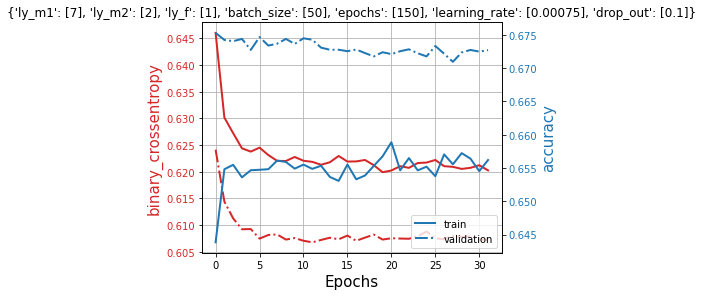

Pandas(Index=1, ly_m1=8, ly_m2=2, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [8], 'ly_m2': [2], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 103us/step - loss: 0.6476 - accuracy: 0.6587 - val_loss: 0.6392 - val_accuracy: 0.6746
Epoch 2/150
19339/19339 [==============================] - 2s 86us/step - loss: 0.6314 - accuracy: 0.6715 - val_loss: 0.6285 - val_accuracy: 0.6759
Epoch 3/150
19339/19339 [==============================] - 2s 90us/step - loss: 0.6229 - accuracy: 0.6723 - val_loss: 0.6221 - val_accuracy: 0.6750
Epoch 4/150
19339/19339 [==============================] - 2s 87us/step - loss: 0.6191 - accuracy: 0.6703 - val_loss: 0.6182 - val_accuracy: 0.6743
Epoch 5/150
19339/19339 [==============================] - 2s 90us/step - loss: 0.6165 - accuracy: 0.6694 - val_loss: 0.6151 

Epoch 22/150
38678/38678 [==============================] - 3s 66us/step - loss: 0.6168 - accuracy: 0.6595 - val_loss: 0.6049 - val_accuracy: 0.6735
Epoch 23/150
38678/38678 [==============================] - 3s 68us/step - loss: 0.6141 - accuracy: 0.6617 - val_loss: 0.6053 - val_accuracy: 0.6744
Epoch 24/150
38678/38678 [==============================] - 3s 67us/step - loss: 0.6142 - accuracy: 0.6627 - val_loss: 0.6052 - val_accuracy: 0.6737
Epoch 25/150
38678/38678 [==============================] - 3s 67us/step - loss: 0.6152 - accuracy: 0.6595 - val_loss: 0.6051 - val_accuracy: 0.6735
Epoch 26/150
38678/38678 [==============================] - 3s 67us/step - loss: 0.6149 - accuracy: 0.6588 - val_loss: 0.6049 - val_accuracy: 0.6749
Epoch 27/150
38678/38678 [==============================] - 3s 67us/step - loss: 0.6150 - accuracy: 0.6592 - val_loss: 0.6047 - val_accuracy: 0.6747
Epoch 28/150
38678/38678 [==============================] - 3s 68us/step - loss: 0.6148 - accuracy: 0.6589

Epoch 23/150
58017/58017 [==============================] - 3s 59us/step - loss: 0.6190 - accuracy: 0.6586 - val_loss: 0.6045 - val_accuracy: 0.6779
Epoch 24/150
58017/58017 [==============================] - 3s 59us/step - loss: 0.6200 - accuracy: 0.6571 - val_loss: 0.6046 - val_accuracy: 0.6772
Epoch 25/150
58017/58017 [==============================] - 3s 59us/step - loss: 0.6202 - accuracy: 0.6560 - val_loss: 0.6051 - val_accuracy: 0.6750
Epoch 26/150
58017/58017 [==============================] - 3s 59us/step - loss: 0.6206 - accuracy: 0.6557 - val_loss: 0.6049 - val_accuracy: 0.6768
Epoch 27/150
58017/58017 [==============================] - 3s 59us/step - loss: 0.6193 - accuracy: 0.6570 - val_loss: 0.6045 - val_accuracy: 0.6780
Epoch 28/150
58017/58017 [==============================] - 3s 59us/step - loss: 0.6193 - accuracy: 0.6592 - val_loss: 0.6052 - val_accuracy: 0.6763
Epoch 29/150
58017/58017 [==============================] - 3s 60us/step - loss: 0.6184 - accuracy: 0.6603

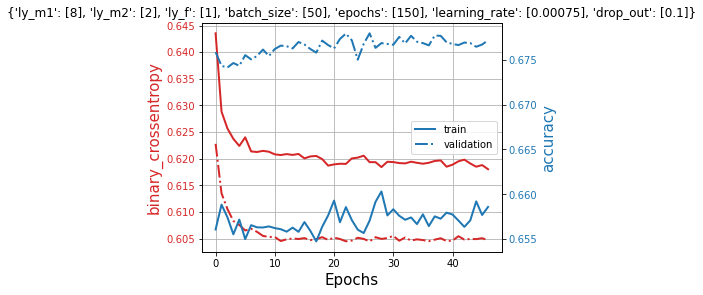

Pandas(Index=2, ly_m1=9, ly_m2=2, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [9], 'ly_m2': [2], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 115us/step - loss: 0.6520 - accuracy: 0.6408 - val_loss: 0.6472 - val_accuracy: 0.6650
Epoch 2/150
19339/19339 [==============================] - 2s 89us/step - loss: 0.6324 - accuracy: 0.6650 - val_loss: 0.6350 - val_accuracy: 0.6692
Epoch 3/150
19339/19339 [==============================] - 2s 94us/step - loss: 0.6263 - accuracy: 0.6633 - val_loss: 0.6280 - val_accuracy: 0.6704
Epoch 4/150
19339/19339 [==============================] - 2s 91us/step - loss: 0.6206 - accuracy: 0.6625 - val_loss: 0.6225 - val_accuracy: 0.6713
Epoch 5/150
19339/19339 [==============================] - 2s 93us/step - loss: 0.6169 - accuracy: 0.6680 - val_loss: 0.6184 

Epoch 22/150
38678/38678 [==============================] - 3s 69us/step - loss: 0.6173 - accuracy: 0.6581 - val_loss: 0.6058 - val_accuracy: 0.6756
Epoch 23/150
38678/38678 [==============================] - 3s 70us/step - loss: 0.6142 - accuracy: 0.6620 - val_loss: 0.6059 - val_accuracy: 0.6754
Epoch 24/150
38678/38678 [==============================] - 3s 69us/step - loss: 0.6150 - accuracy: 0.6625 - val_loss: 0.6054 - val_accuracy: 0.6751
Epoch 25/150
38678/38678 [==============================] - 3s 69us/step - loss: 0.6157 - accuracy: 0.6594 - val_loss: 0.6056 - val_accuracy: 0.6756
Epoch 26/150
38678/38678 [==============================] - 3s 70us/step - loss: 0.6149 - accuracy: 0.6603 - val_loss: 0.6062 - val_accuracy: 0.6742
Epoch 27/150
38678/38678 [==============================] - 3s 78us/step - loss: 0.6163 - accuracy: 0.6597 - val_loss: 0.6056 - val_accuracy: 0.6751
Epoch 28/150
38678/38678 [==============================] - 3s 74us/step - loss: 0.6154 - accuracy: 0.6603

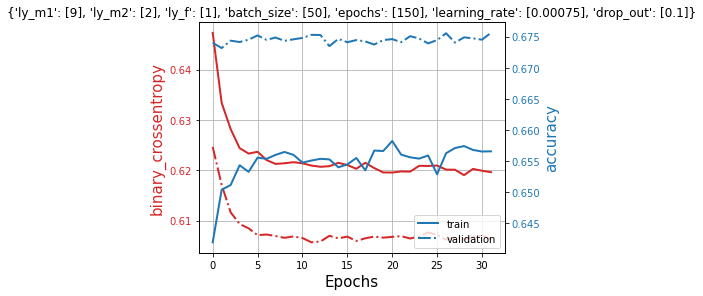

Pandas(Index=3, ly_m1=10, ly_m2=2, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [10], 'ly_m2': [2], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 108us/step - loss: 0.6466 - accuracy: 0.6464 - val_loss: 0.6455 - val_accuracy: 0.6661
Epoch 2/150
19339/19339 [==============================] - 2s 92us/step - loss: 0.6316 - accuracy: 0.6642 - val_loss: 0.6340 - val_accuracy: 0.6689
Epoch 3/150
19339/19339 [==============================] - 2s 94us/step - loss: 0.6231 - accuracy: 0.6667 - val_loss: 0.6262 - val_accuracy: 0.6709
Epoch 4/150
19339/19339 [==============================] - 2s 93us/step - loss: 0.6190 - accuracy: 0.6722 - val_loss: 0.6223 - val_accuracy: 0.6699
Epoch 5/150
19339/19339 [==============================] - 2s 93us/step - loss: 0.6162 - accuracy: 0.6705 - val_loss: 0.618

Epoch 25/150
38678/38678 [==============================] - 3s 71us/step - loss: 0.6143 - accuracy: 0.6598 - val_loss: 0.6056 - val_accuracy: 0.6758
Epoch 26/150
38678/38678 [==============================] - 3s 72us/step - loss: 0.6141 - accuracy: 0.6598 - val_loss: 0.6054 - val_accuracy: 0.6759
Epoch 27/150
38678/38678 [==============================] - 3s 71us/step - loss: 0.6138 - accuracy: 0.6611 - val_loss: 0.6054 - val_accuracy: 0.6757
Epoch 28/150
38678/38678 [==============================] - 3s 71us/step - loss: 0.6142 - accuracy: 0.6613 - val_loss: 0.6059 - val_accuracy: 0.6758
Epoch 29/150
38678/38678 [==============================] - 3s 70us/step - loss: 0.6139 - accuracy: 0.6623 - val_loss: 0.6058 - val_accuracy: 0.6750
Epoch 30/150
38678/38678 [==============================] - 3s 71us/step - loss: 0.6142 - accuracy: 0.6598 - val_loss: 0.6055 - val_accuracy: 0.6755
Epoch 31/150
38678/38678 [==============================] - 3s 72us/step - loss: 0.6121 - accuracy: 0.6642

Epoch 26/150
58017/58017 [==============================] - 4s 65us/step - loss: 0.6201 - accuracy: 0.6553 - val_loss: 0.6047 - val_accuracy: 0.6770
Epoch 27/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6192 - accuracy: 0.6575 - val_loss: 0.6044 - val_accuracy: 0.6774
Epoch 28/150
58017/58017 [==============================] - 4s 68us/step - loss: 0.6190 - accuracy: 0.6564 - val_loss: 0.6048 - val_accuracy: 0.6776
Epoch 29/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.6188 - accuracy: 0.6583 - val_loss: 0.6043 - val_accuracy: 0.6772
Epoch 30/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6192 - accuracy: 0.6561 - val_loss: 0.6043 - val_accuracy: 0.6770
Epoch 31/150
58017/58017 [==============================] - 4s 71us/step - loss: 0.6188 - accuracy: 0.6566 - val_loss: 0.6043 - val_accuracy: 0.6774
Epoch 32/150
58017/58017 [==============================] - 4s 70us/step - loss: 0.6184 - accuracy: 0.6578

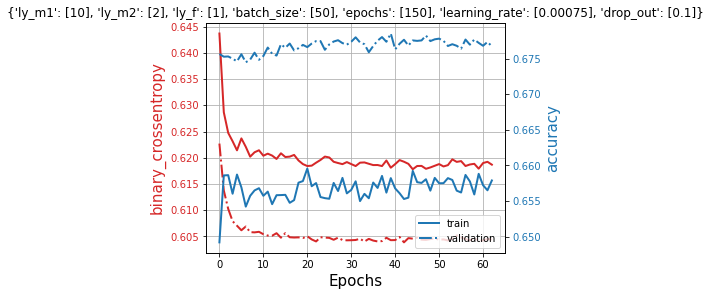

Pandas(Index=4, ly_m1=10, ly_m2=2, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [10], 'ly_m2': [2], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 116us/step - loss: 0.6466 - accuracy: 0.6464 - val_loss: 0.6455 - val_accuracy: 0.6661
Epoch 2/150
19339/19339 [==============================] - 2s 100us/step - loss: 0.6316 - accuracy: 0.6642 - val_loss: 0.6340 - val_accuracy: 0.6689
Epoch 3/150
19339/19339 [==============================] - 2s 98us/step - loss: 0.6231 - accuracy: 0.6667 - val_loss: 0.6262 - val_accuracy: 0.6709
Epoch 4/150
19339/19339 [==============================] - 2s 101us/step - loss: 0.6190 - accuracy: 0.6722 - val_loss: 0.6223 - val_accuracy: 0.6699
Epoch 5/150
19339/19339 [==============================] - 2s 99us/step - loss: 0.6162 - accuracy: 0.6705 - val_loss: 0.6

Epoch 25/150
38678/38678 [==============================] - 3s 76us/step - loss: 0.6143 - accuracy: 0.6598 - val_loss: 0.6056 - val_accuracy: 0.6758
Epoch 26/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.6141 - accuracy: 0.6598 - val_loss: 0.6054 - val_accuracy: 0.6759
Epoch 27/150
38678/38678 [==============================] - 3s 76us/step - loss: 0.6138 - accuracy: 0.6611 - val_loss: 0.6054 - val_accuracy: 0.6757
Epoch 28/150
38678/38678 [==============================] - 3s 76us/step - loss: 0.6142 - accuracy: 0.6613 - val_loss: 0.6059 - val_accuracy: 0.6758
Epoch 29/150
38678/38678 [==============================] - 3s 75us/step - loss: 0.6139 - accuracy: 0.6623 - val_loss: 0.6058 - val_accuracy: 0.6750
Epoch 30/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.6142 - accuracy: 0.6598 - val_loss: 0.6055 - val_accuracy: 0.6755
Epoch 31/150
38678/38678 [==============================] - 3s 73us/step - loss: 0.6121 - accuracy: 0.6642

Epoch 26/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6201 - accuracy: 0.6553 - val_loss: 0.6047 - val_accuracy: 0.6770
Epoch 27/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6192 - accuracy: 0.6575 - val_loss: 0.6044 - val_accuracy: 0.6774
Epoch 28/150
58017/58017 [==============================] - 4s 68us/step - loss: 0.6190 - accuracy: 0.6564 - val_loss: 0.6048 - val_accuracy: 0.6776
Epoch 29/150
58017/58017 [==============================] - 4s 66us/step - loss: 0.6188 - accuracy: 0.6583 - val_loss: 0.6043 - val_accuracy: 0.6772
Epoch 30/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6192 - accuracy: 0.6561 - val_loss: 0.6043 - val_accuracy: 0.6770
Epoch 31/150
58017/58017 [==============================] - 4s 68us/step - loss: 0.6188 - accuracy: 0.6566 - val_loss: 0.6043 - val_accuracy: 0.6774
Epoch 32/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6184 - accuracy: 0.6578

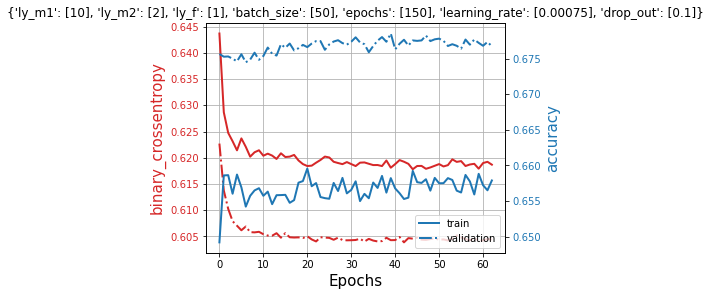

best parameters: {'ly_m1': [10], 'ly_m2': [2], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}


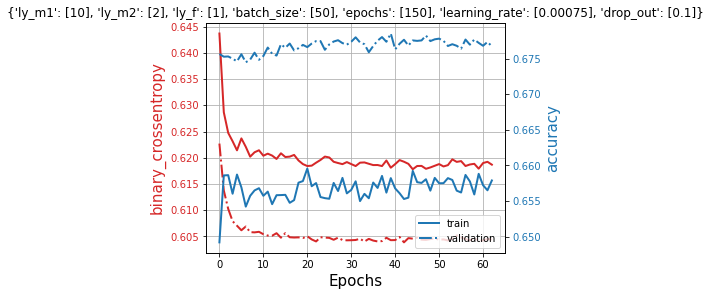

number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 16)
Pandas(Index=0, ly_m1=14, ly_m2=4, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [14], 'ly_m2': [4], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 116us/step - loss: 0.6472 - accuracy: 0.6499 - val_loss: 0.6510 - val_accuracy: 0.6573
Epoch 2/150
19339/19339 [==============================] - 2s 101us/step - loss: 0.6280 - accuracy: 0.6782 - val_loss: 0.6411 - val_accuracy: 0.6600
Epoch 3/150
19339/19339 [==============================] - 2s 100us/step - loss: 0.6191 - accuracy: 0.6788 - val_loss: 0.6356 - val_accuracy: 0.6586
Epoch 4/150
19339/19339 [==============================] - 2s 101us/step - loss: 0.6127 - accuracy: 0.6803 - val_loss: 0.6323 - val_accuracy: 0.6573
Epoch 5/150
19339/19339 [==========

38678/38678 [==============================] - 3s 77us/step - loss: 0.6060 - accuracy: 0.6716 - val_loss: 0.6071 - val_accuracy: 0.6721
Epoch 21/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.6057 - accuracy: 0.6705 - val_loss: 0.6071 - val_accuracy: 0.6715
Epoch 22/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.6049 - accuracy: 0.6721 - val_loss: 0.6069 - val_accuracy: 0.6723
Epoch 23/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.6054 - accuracy: 0.6686 - val_loss: 0.6072 - val_accuracy: 0.6714
Epoch 24/150
38678/38678 [==============================] - 3s 76us/step - loss: 0.6049 - accuracy: 0.6721 - val_loss: 0.6065 - val_accuracy: 0.6722
Epoch 25/150
38678/38678 [==============================] - 3s 78us/step - loss: 0.6060 - accuracy: 0.6713 - val_loss: 0.6066 - val_accuracy: 0.6717
Epoch 26/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.6050 - accuracy: 0.6712 - val_loss: 

Epoch 37/150
58017/58017 [==============================] - 4s 66us/step - loss: 0.6111 - accuracy: 0.6642 - val_loss: 0.6020 - val_accuracy: 0.6755
Epoch 38/150
58017/58017 [==============================] - 4s 70us/step - loss: 0.6110 - accuracy: 0.6637 - val_loss: 0.6021 - val_accuracy: 0.6746
Epoch 39/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6104 - accuracy: 0.6663 - val_loss: 0.6023 - val_accuracy: 0.6750
Epoch 40/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6114 - accuracy: 0.6643 - val_loss: 0.6022 - val_accuracy: 0.6760
Epoch 41/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6098 - accuracy: 0.6650 - val_loss: 0.6023 - val_accuracy: 0.6742
Epoch 42/150
58017/58017 [==============================] - 4s 68us/step - loss: 0.6095 - accuracy: 0.6649 - val_loss: 0.6026 - val_accuracy: 0.6740
Epoch 43/150
58017/58017 [==============================] - 4s 70us/step - loss: 0.6109 - accuracy: 0.6644

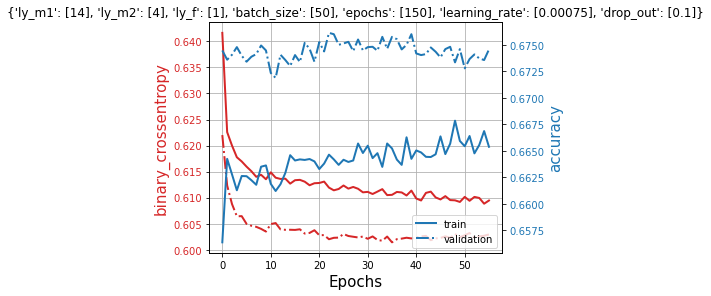

Pandas(Index=1, ly_m1=16, ly_m2=4, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [16], 'ly_m2': [4], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 117us/step - loss: 0.6475 - accuracy: 0.6514 - val_loss: 0.6411 - val_accuracy: 0.6689
Epoch 2/150
19339/19339 [==============================] - 2s 103us/step - loss: 0.6266 - accuracy: 0.6801 - val_loss: 0.6308 - val_accuracy: 0.6722
Epoch 3/150
19339/19339 [==============================] - 2s 102us/step - loss: 0.6184 - accuracy: 0.6782 - val_loss: 0.6240 - val_accuracy: 0.6722
Epoch 4/150
19339/19339 [==============================] - 2s 99us/step - loss: 0.6121 - accuracy: 0.6788 - val_loss: 0.6192 - val_accuracy: 0.6718
Epoch 5/150
19339/19339 [==============================] - 2s 104us/step - loss: 0.6096 - accuracy: 0.6807 - val_loss: 0.

Epoch 21/150
38678/38678 [==============================] - 3s 76us/step - loss: 0.6051 - accuracy: 0.6733 - val_loss: 0.6050 - val_accuracy: 0.6733
Epoch 22/150
38678/38678 [==============================] - 3s 76us/step - loss: 0.6042 - accuracy: 0.6730 - val_loss: 0.6052 - val_accuracy: 0.6727
Epoch 23/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.6032 - accuracy: 0.6728 - val_loss: 0.6046 - val_accuracy: 0.6729
Epoch 24/150
38678/38678 [==============================] - 3s 75us/step - loss: 0.6036 - accuracy: 0.6727 - val_loss: 0.6044 - val_accuracy: 0.6723
Epoch 25/150
38678/38678 [==============================] - 3s 76us/step - loss: 0.6048 - accuracy: 0.6744 - val_loss: 0.6053 - val_accuracy: 0.6719
Epoch 26/150
38678/38678 [==============================] - 3s 76us/step - loss: 0.6031 - accuracy: 0.6729 - val_loss: 0.6051 - val_accuracy: 0.6727
Epoch 27/150
38678/38678 [==============================] - 3s 75us/step - loss: 0.6040 - accuracy: 0.6708

58017/58017 [==============================] - 4s 70us/step - loss: 0.6089 - accuracy: 0.6694 - val_loss: 0.6004 - val_accuracy: 0.6779
Epoch 37/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6098 - accuracy: 0.6676 - val_loss: 0.6011 - val_accuracy: 0.6769
Epoch 38/150
58017/58017 [==============================] - 4s 68us/step - loss: 0.6093 - accuracy: 0.6679 - val_loss: 0.6008 - val_accuracy: 0.6770
Epoch 39/150
58017/58017 [==============================] - 4s 68us/step - loss: 0.6091 - accuracy: 0.6683 - val_loss: 0.6012 - val_accuracy: 0.6761
Epoch 40/150
58017/58017 [==============================] - 4s 68us/step - loss: 0.6088 - accuracy: 0.6680 - val_loss: 0.6012 - val_accuracy: 0.6764
Epoch 41/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6087 - accuracy: 0.6679 - val_loss: 0.6009 - val_accuracy: 0.6765
Epoch 42/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6090 - accuracy: 0.6669 - val_loss: 

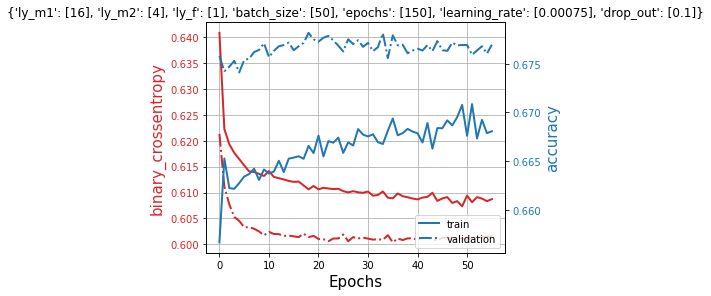

Pandas(Index=2, ly_m1=18, ly_m2=4, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [18], 'ly_m2': [4], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 5s 254us/step - loss: 0.6534 - accuracy: 0.6495 - val_loss: 0.6458 - val_accuracy: 0.6683
Epoch 2/150
19339/19339 [==============================] - 7s 382us/step - loss: 0.6275 - accuracy: 0.6775 - val_loss: 0.6353 - val_accuracy: 0.6660
Epoch 3/150
19339/19339 [==============================] - 3s 130us/step - loss: 0.6190 - accuracy: 0.6787 - val_loss: 0.6294 - val_accuracy: 0.6644
Epoch 4/150
19339/19339 [==============================] - 2s 97us/step - loss: 0.6122 - accuracy: 0.6803 - val_loss: 0.6253 - val_accuracy: 0.6654
Epoch 5/150
19339/19339 [==============================] - 2s 127us/step - loss: 0.6103 - accuracy: 0.6812 - val_loss: 0.

38678/38678 [==============================] - 3s 74us/step - loss: 0.6046 - accuracy: 0.6731 - val_loss: 0.6038 - val_accuracy: 0.6754
Epoch 16/150
38678/38678 [==============================] - 3s 79us/step - loss: 0.6050 - accuracy: 0.6723 - val_loss: 0.6042 - val_accuracy: 0.6730
Epoch 17/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.6047 - accuracy: 0.6726 - val_loss: 0.6038 - val_accuracy: 0.6751
Epoch 18/150
38678/38678 [==============================] - 4s 97us/step - loss: 0.6041 - accuracy: 0.6729 - val_loss: 0.6040 - val_accuracy: 0.6746
Epoch 19/150
38678/38678 [==============================] - 4s 103us/step - loss: 0.6040 - accuracy: 0.6708 - val_loss: 0.6039 - val_accuracy: 0.6748
Epoch 20/150
38678/38678 [==============================] - 3s 75us/step - loss: 0.6039 - accuracy: 0.6737 - val_loss: 0.6040 - val_accuracy: 0.6747
Epoch 21/150
38678/38678 [==============================] - 3s 86us/step - loss: 0.6040 - accuracy: 0.6728 - val_loss:

Epoch 25/150
58017/58017 [==============================] - 4s 63us/step - loss: 0.6097 - accuracy: 0.6674 - val_loss: 0.6007 - val_accuracy: 0.6758
Epoch 26/150
58017/58017 [==============================] - 4s 63us/step - loss: 0.6098 - accuracy: 0.6675 - val_loss: 0.6008 - val_accuracy: 0.6765
Epoch 27/150
58017/58017 [==============================] - 6s 107us/step - loss: 0.6092 - accuracy: 0.6680 - val_loss: 0.6003 - val_accuracy: 0.6775
Epoch 28/150
58017/58017 [==============================] - 12s 202us/step - loss: 0.6100 - accuracy: 0.6672 - val_loss: 0.6012 - val_accuracy: 0.6760
Epoch 29/150
58017/58017 [==============================] - 10s 170us/step - loss: 0.6091 - accuracy: 0.6686 - val_loss: 0.6003 - val_accuracy: 0.6766
Epoch 30/150
58017/58017 [==============================] - 9s 155us/step - loss: 0.6090 - accuracy: 0.6686 - val_loss: 0.6008 - val_accuracy: 0.6762
Epoch 31/150
58017/58017 [==============================] - 5s 87us/step - loss: 0.6090 - accuracy: 

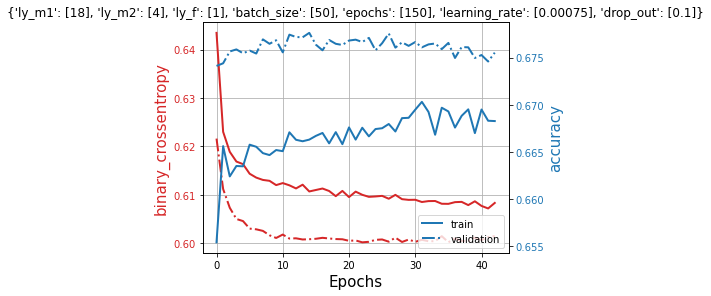

Pandas(Index=3, ly_m1=19, ly_m2=4, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [19], 'ly_m2': [4], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 129us/step - loss: 0.6465 - accuracy: 0.6540 - val_loss: 0.6571 - val_accuracy: 0.6468
Epoch 2/150
19339/19339 [==============================] - 2s 105us/step - loss: 0.6269 - accuracy: 0.6773 - val_loss: 0.6491 - val_accuracy: 0.6466
Epoch 3/150
19339/19339 [==============================] - 2s 95us/step - loss: 0.6190 - accuracy: 0.6780 - val_loss: 0.6436 - val_accuracy: 0.6466
Epoch 4/150
19339/19339 [==============================] - 2s 95us/step - loss: 0.6130 - accuracy: 0.6788 - val_loss: 0.6395 - val_accuracy: 0.6486
Epoch 5/150
19339/19339 [==============================] - 3s 159us/step - loss: 0.6104 - accuracy: 0.6785 - val_loss: 0.6

38678/38678 [==============================] - 4s 92us/step - loss: 0.6094 - accuracy: 0.6698 - val_loss: 0.6068 - val_accuracy: 0.6757
Epoch 7/150
38678/38678 [==============================] - 3s 73us/step - loss: 0.6093 - accuracy: 0.6685 - val_loss: 0.6068 - val_accuracy: 0.6739
Epoch 8/150
38678/38678 [==============================] - 3s 83us/step - loss: 0.6080 - accuracy: 0.6690 - val_loss: 0.6061 - val_accuracy: 0.6744
Epoch 9/150
38678/38678 [==============================] - 4s 109us/step - loss: 0.6068 - accuracy: 0.6701 - val_loss: 0.6059 - val_accuracy: 0.6743
Epoch 10/150
38678/38678 [==============================] - 3s 86us/step - loss: 0.6057 - accuracy: 0.6717 - val_loss: 0.6058 - val_accuracy: 0.6740
Epoch 11/150
38678/38678 [==============================] - 4s 94us/step - loss: 0.6055 - accuracy: 0.6716 - val_loss: 0.6061 - val_accuracy: 0.6741
Epoch 12/150
38678/38678 [==============================] - 3s 75us/step - loss: 0.6065 - accuracy: 0.6714 - val_loss: 0.

58017/58017 [==============================] - 5s 84us/step - loss: 0.6087 - accuracy: 0.6667 - val_loss: 0.6007 - val_accuracy: 0.6755
Epoch 28/150
58017/58017 [==============================] - 5s 88us/step - loss: 0.6096 - accuracy: 0.6668 - val_loss: 0.6010 - val_accuracy: 0.6758
Epoch 29/150
58017/58017 [==============================] - 4s 68us/step - loss: 0.6089 - accuracy: 0.6670 - val_loss: 0.6007 - val_accuracy: 0.6765
Epoch 30/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.6084 - accuracy: 0.6684 - val_loss: 0.6010 - val_accuracy: 0.6759
Epoch 31/150
58017/58017 [==============================] - 4s 69us/step - loss: 0.6087 - accuracy: 0.6684 - val_loss: 0.6008 - val_accuracy: 0.6758
Epoch 32/150
58017/58017 [==============================] - 5s 86us/step - loss: 0.6076 - accuracy: 0.6693 - val_loss: 0.6009 - val_accuracy: 0.6773
Epoch 33/150
58017/58017 [==============================] - 5s 80us/step - loss: 0.6075 - accuracy: 0.6684 - val_loss: 

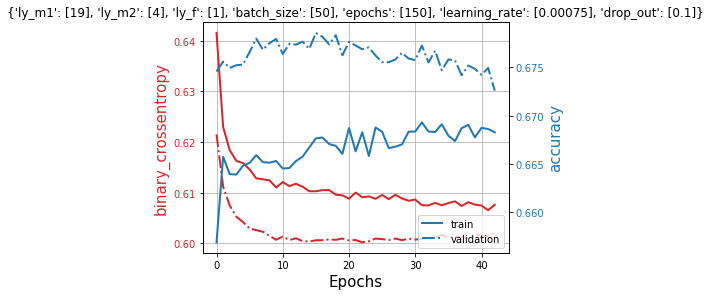

Pandas(Index=4, ly_m1=21, ly_m2=4, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [21], 'ly_m2': [4], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 115us/step - loss: 0.6472 - accuracy: 0.6504 - val_loss: 0.6456 - val_accuracy: 0.6645
Epoch 2/150
19339/19339 [==============================] - 2s 96us/step - loss: 0.6286 - accuracy: 0.6745 - val_loss: 0.6356 - val_accuracy: 0.6651
Epoch 3/150
19339/19339 [==============================] - 2s 97us/step - loss: 0.6213 - accuracy: 0.6751 - val_loss: 0.6306 - val_accuracy: 0.6641
Epoch 4/150
19339/19339 [==============================] - 2s 97us/step - loss: 0.6154 - accuracy: 0.6769 - val_loss: 0.6265 - val_accuracy: 0.6644
Epoch 5/150
19339/19339 [==============================] - 2s 99us/step - loss: 0.6133 - accuracy: 0.6777 - val_loss: 0.624

38678/38678 [==============================] - 3s 83us/step - loss: 0.6000 - accuracy: 0.6741 - val_loss: 0.5986 - val_accuracy: 0.6727
Epoch 21/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.5997 - accuracy: 0.6750 - val_loss: 0.5982 - val_accuracy: 0.6736
Epoch 22/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.5987 - accuracy: 0.6772 - val_loss: 0.5988 - val_accuracy: 0.6735
Epoch 23/150
38678/38678 [==============================] - 3s 80us/step - loss: 0.5987 - accuracy: 0.6782 - val_loss: 0.5987 - val_accuracy: 0.6727
Epoch 24/150
38678/38678 [==============================] - 3s 74us/step - loss: 0.5975 - accuracy: 0.6772 - val_loss: 0.5982 - val_accuracy: 0.6731
Epoch 25/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.5972 - accuracy: 0.6798 - val_loss: 0.5984 - val_accuracy: 0.6718
Epoch 26/150
38678/38678 [==============================] - 3s 71us/step - loss: 0.5970 - accuracy: 0.6778 - val_loss: 

58017/58017 [==============================] - 4s 64us/step - loss: 0.6083 - accuracy: 0.6686 - val_loss: 0.6012 - val_accuracy: 0.6760
Epoch 48/150
58017/58017 [==============================] - 7s 114us/step - loss: 0.6073 - accuracy: 0.6690 - val_loss: 0.6016 - val_accuracy: 0.6768
Epoch 49/150
58017/58017 [==============================] - 10s 169us/step - loss: 0.6077 - accuracy: 0.6698 - val_loss: 0.6017 - val_accuracy: 0.6756
Epoch 50/150
58017/58017 [==============================] - 14s 249us/step - loss: 0.6066 - accuracy: 0.6696 - val_loss: 0.6017 - val_accuracy: 0.6759
Epoch 51/150
58017/58017 [==============================] - 9s 156us/step - loss: 0.6088 - accuracy: 0.6687 - val_loss: 0.6022 - val_accuracy: 0.6755
Epoch 52/150
58017/58017 [==============================] - 11s 195us/step - loss: 0.6075 - accuracy: 0.6699 - val_loss: 0.6018 - val_accuracy: 0.6756
Epoch 53/150
58017/58017 [==============================] - 12s 204us/step - loss: 0.6086 - accuracy: 0.6677 - 

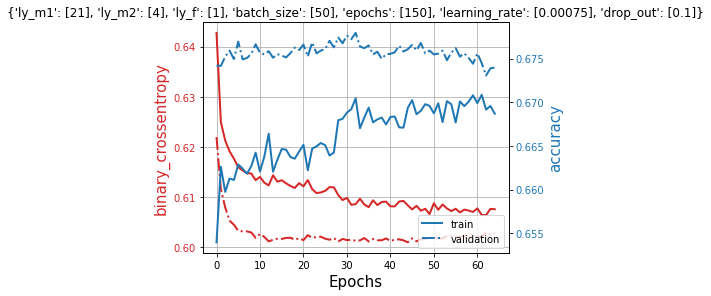

best parameters: {'ly_m1': [19], 'ly_m2': [4], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}


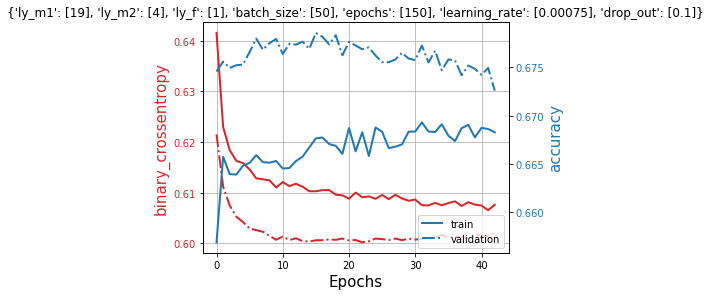

number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 25)
Pandas(Index=0, ly_m1=22, ly_m2=6, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [22], 'ly_m2': [6], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 9s 476us/step - loss: 0.6444 - accuracy: 0.6608 - val_loss: 0.6408 - val_accuracy: 0.6698
Epoch 2/150
19339/19339 [==============================] - 7s 381us/step - loss: 0.6247 - accuracy: 0.6823 - val_loss: 0.6316 - val_accuracy: 0.6701
Epoch 3/150
19339/19339 [==============================] - 7s 373us/step - loss: 0.6150 - accuracy: 0.6821 - val_loss: 0.6260 - val_accuracy: 0.6691
Epoch 4/150
19339/19339 [==============================] - 7s 345us/step - loss: 0.6096 - accuracy: 0.6809 - val_loss: 0.6225 - val_accuracy: 0.6676
Epoch 5/150
19339/19339 [==========

19339/19339 [==============================] - 7s 385us/step - loss: 0.5843 - accuracy: 0.6900 - val_loss: 0.6173 - val_accuracy: 0.6624
Epoch 54/150
19339/19339 [==============================] - 8s 393us/step - loss: 0.5825 - accuracy: 0.6889 - val_loss: 0.6177 - val_accuracy: 0.6621
Epoch 55/150
19339/19339 [==============================] - 9s 480us/step - loss: 0.5838 - accuracy: 0.6906 - val_loss: 0.6179 - val_accuracy: 0.6618
Epoch 56/150
19339/19339 [==============================] - 9s 443us/step - loss: 0.5857 - accuracy: 0.6883 - val_loss: 0.6189 - val_accuracy: 0.6621
Epoch 57/150
19339/19339 [==============================] - 3s 140us/step - loss: 0.5849 - accuracy: 0.6888 - val_loss: 0.6186 - val_accuracy: 0.6616
Train on 38678 samples, validate on 31986 samples
Epoch 1/150
38678/38678 [==============================] - 4s 106us/step - loss: 0.6411 - accuracy: 0.6630 - val_loss: 0.6233 - val_accuracy: 0.6782
Epoch 2/150
38678/38678 [==============================] - 4s 97

58017/58017 [==============================] - 12s 206us/step - loss: 0.6090 - accuracy: 0.6694 - val_loss: 0.5989 - val_accuracy: 0.6792
Epoch 8/150
58017/58017 [==============================] - 5s 84us/step - loss: 0.6082 - accuracy: 0.6691 - val_loss: 0.5986 - val_accuracy: 0.6802
Epoch 9/150
58017/58017 [==============================] - 5s 85us/step - loss: 0.6071 - accuracy: 0.6711 - val_loss: 0.5985 - val_accuracy: 0.6799
Epoch 10/150
58017/58017 [==============================] - 5s 78us/step - loss: 0.6077 - accuracy: 0.6713 - val_loss: 0.5998 - val_accuracy: 0.6772
Epoch 11/150
58017/58017 [==============================] - 12s 204us/step - loss: 0.6076 - accuracy: 0.6704 - val_loss: 0.5986 - val_accuracy: 0.6796
Epoch 12/150
58017/58017 [==============================] - 13s 216us/step - loss: 0.6062 - accuracy: 0.6721 - val_loss: 0.5978 - val_accuracy: 0.6799
Epoch 13/150
58017/58017 [==============================] - 13s 218us/step - loss: 0.6064 - accuracy: 0.6700 - val_

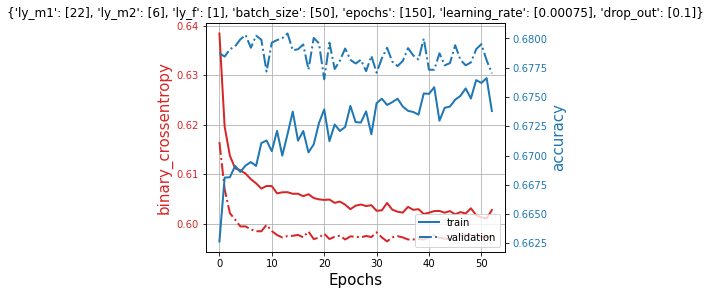

Pandas(Index=1, ly_m1=25, ly_m2=6, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [25], 'ly_m2': [6], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 4s 219us/step - loss: 0.6445 - accuracy: 0.6542 - val_loss: 0.6474 - val_accuracy: 0.6627
Epoch 2/150
19339/19339 [==============================] - 2s 127us/step - loss: 0.6253 - accuracy: 0.6814 - val_loss: 0.6379 - val_accuracy: 0.6604
Epoch 3/150
19339/19339 [==============================] - 3s 143us/step - loss: 0.6159 - accuracy: 0.6806 - val_loss: 0.6327 - val_accuracy: 0.6588
Epoch 4/150
19339/19339 [==============================] - 6s 297us/step - loss: 0.6106 - accuracy: 0.6816 - val_loss: 0.6280 - val_accuracy: 0.6590
Epoch 5/150
19339/19339 [==============================] - 8s 392us/step - loss: 0.6059 - accuracy: 0.6838 - val_loss: 0

38678/38678 [==============================] - 12s 307us/step - loss: 0.5986 - accuracy: 0.6792 - val_loss: 0.6020 - val_accuracy: 0.6755
Epoch 17/150
38678/38678 [==============================] - 9s 222us/step - loss: 0.5971 - accuracy: 0.6789 - val_loss: 0.6029 - val_accuracy: 0.6743
Epoch 18/150
38678/38678 [==============================] - 13s 339us/step - loss: 0.5976 - accuracy: 0.6766 - val_loss: 0.6037 - val_accuracy: 0.6737
Epoch 19/150
38678/38678 [==============================] - 12s 319us/step - loss: 0.5964 - accuracy: 0.6783 - val_loss: 0.6028 - val_accuracy: 0.6749
Epoch 20/150
38678/38678 [==============================] - 8s 204us/step - loss: 0.5960 - accuracy: 0.6804 - val_loss: 0.6026 - val_accuracy: 0.6741
Epoch 21/150
38678/38678 [==============================] - 7s 190us/step - loss: 0.5959 - accuracy: 0.6806 - val_loss: 0.6020 - val_accuracy: 0.6748
Epoch 22/150
38678/38678 [==============================] - 7s 187us/step - loss: 0.5967 - accuracy: 0.6807 - 

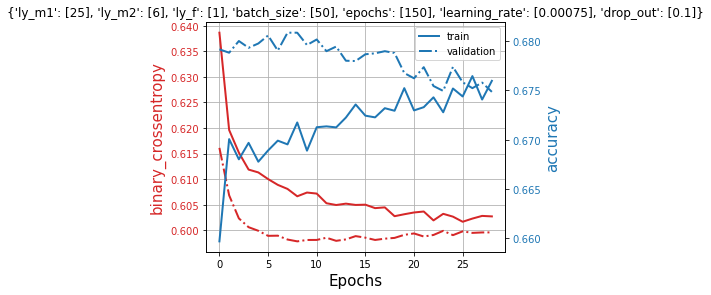

Pandas(Index=2, ly_m1=28, ly_m2=6, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [28], 'ly_m2': [6], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 5s 270us/step - loss: 0.6425 - accuracy: 0.6610 - val_loss: 0.6484 - val_accuracy: 0.6637
Epoch 2/150
19339/19339 [==============================] - 4s 232us/step - loss: 0.6241 - accuracy: 0.6814 - val_loss: 0.6381 - val_accuracy: 0.6624
Epoch 3/150
19339/19339 [==============================] - 5s 234us/step - loss: 0.6148 - accuracy: 0.6828 - val_loss: 0.6319 - val_accuracy: 0.6624
Epoch 4/150
19339/19339 [==============================] - 4s 230us/step - loss: 0.6086 - accuracy: 0.6821 - val_loss: 0.6275 - val_accuracy: 0.6607
Epoch 5/150
19339/19339 [==============================] - 4s 230us/step - loss: 0.6046 - accuracy: 0.6855 - val_loss: 0

38678/38678 [==============================] - 3s 78us/step - loss: 0.6022 - accuracy: 0.6771 - val_loss: 0.6014 - val_accuracy: 0.6770
Epoch 11/150
38678/38678 [==============================] - 3s 79us/step - loss: 0.6019 - accuracy: 0.6775 - val_loss: 0.6024 - val_accuracy: 0.6758
Epoch 12/150
38678/38678 [==============================] - 3s 79us/step - loss: 0.6008 - accuracy: 0.6762 - val_loss: 0.6015 - val_accuracy: 0.6768
Epoch 13/150
38678/38678 [==============================] - 3s 77us/step - loss: 0.6006 - accuracy: 0.6762 - val_loss: 0.6018 - val_accuracy: 0.6779
Epoch 14/150
38678/38678 [==============================] - 3s 78us/step - loss: 0.6000 - accuracy: 0.6776 - val_loss: 0.6015 - val_accuracy: 0.6757
Epoch 15/150
38678/38678 [==============================] - 7s 184us/step - loss: 0.5990 - accuracy: 0.6788 - val_loss: 0.6022 - val_accuracy: 0.6764
Epoch 16/150
38678/38678 [==============================] - 7s 184us/step - loss: 0.5987 - accuracy: 0.6788 - val_loss

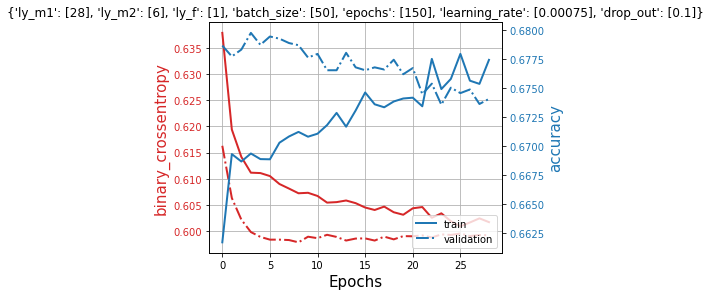

Pandas(Index=3, ly_m1=30, ly_m2=6, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [30], 'ly_m2': [6], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 121us/step - loss: 0.6444 - accuracy: 0.6627 - val_loss: 0.6416 - val_accuracy: 0.6744
Epoch 2/150
19339/19339 [==============================] - 2s 101us/step - loss: 0.6245 - accuracy: 0.6828 - val_loss: 0.6298 - val_accuracy: 0.6749
Epoch 3/150
19339/19339 [==============================] - 2s 104us/step - loss: 0.6165 - accuracy: 0.6816 - val_loss: 0.6237 - val_accuracy: 0.6739
Epoch 4/150
19339/19339 [==============================] - 3s 138us/step - loss: 0.6099 - accuracy: 0.6813 - val_loss: 0.6195 - val_accuracy: 0.6726
Epoch 5/150
19339/19339 [==============================] - 3s 139us/step - loss: 0.6057 - accuracy: 0.6829 - val_loss: 0

38678/38678 [==============================] - 10s 269us/step - loss: 0.5925 - accuracy: 0.6839 - val_loss: 0.6040 - val_accuracy: 0.6742
Epoch 27/150
38678/38678 [==============================] - 11s 288us/step - loss: 0.5923 - accuracy: 0.6849 - val_loss: 0.6045 - val_accuracy: 0.6742
Epoch 28/150
38678/38678 [==============================] - 7s 172us/step - loss: 0.5929 - accuracy: 0.6814 - val_loss: 0.6047 - val_accuracy: 0.6744
Epoch 29/150
38678/38678 [==============================] - 4s 111us/step - loss: 0.5933 - accuracy: 0.6842 - val_loss: 0.6054 - val_accuracy: 0.6748
Epoch 30/150
38678/38678 [==============================] - 4s 95us/step - loss: 0.5908 - accuracy: 0.6839 - val_loss: 0.6045 - val_accuracy: 0.6744
Train on 58017 samples, validate on 31986 samples
Epoch 1/150
58017/58017 [==============================] - 5s 90us/step - loss: 0.6385 - accuracy: 0.6629 - val_loss: 0.6161 - val_accuracy: 0.6795
Epoch 2/150
58017/58017 [==============================] - 6s 10

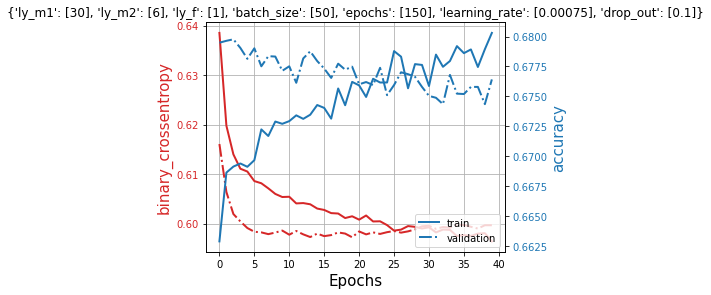

Pandas(Index=4, ly_m1=32, ly_m2=6, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [32], 'ly_m2': [6], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 5s 278us/step - loss: 0.6414 - accuracy: 0.6652 - val_loss: 0.6488 - val_accuracy: 0.6589
Epoch 2/150
19339/19339 [==============================] - 5s 243us/step - loss: 0.6231 - accuracy: 0.6820 - val_loss: 0.6372 - val_accuracy: 0.6624
Epoch 3/150
19339/19339 [==============================] - 5s 237us/step - loss: 0.6149 - accuracy: 0.6832 - val_loss: 0.6311 - val_accuracy: 0.6628
Epoch 4/150
19339/19339 [==============================] - 5s 266us/step - loss: 0.6079 - accuracy: 0.6830 - val_loss: 0.6265 - val_accuracy: 0.6638
Epoch 5/150
19339/19339 [==============================] - 5s 276us/step - loss: 0.6040 - accuracy: 0.6844 - val_loss: 0

38678/38678 [==============================] - 7s 187us/step - loss: 0.5950 - accuracy: 0.6818 - val_loss: 0.6028 - val_accuracy: 0.6750
Epoch 18/150
38678/38678 [==============================] - 7s 190us/step - loss: 0.5954 - accuracy: 0.6827 - val_loss: 0.6035 - val_accuracy: 0.6751
Epoch 19/150
38678/38678 [==============================] - 7s 183us/step - loss: 0.5948 - accuracy: 0.6810 - val_loss: 0.6041 - val_accuracy: 0.6745
Epoch 20/150
38678/38678 [==============================] - 7s 185us/step - loss: 0.5943 - accuracy: 0.6832 - val_loss: 0.6040 - val_accuracy: 0.6739
Epoch 21/150
38678/38678 [==============================] - 7s 186us/step - loss: 0.5942 - accuracy: 0.6825 - val_loss: 0.6038 - val_accuracy: 0.6743
Epoch 22/150
38678/38678 [==============================] - 7s 183us/step - loss: 0.5933 - accuracy: 0.6845 - val_loss: 0.6045 - val_accuracy: 0.6736
Epoch 23/150
38678/38678 [==============================] - 7s 192us/step - loss: 0.5938 - accuracy: 0.6832 - val

58017/58017 [==============================] - 4s 72us/step - loss: 0.5979 - accuracy: 0.6766 - val_loss: 0.6018 - val_accuracy: 0.6713
Epoch 36/150
58017/58017 [==============================] - 5s 90us/step - loss: 0.5979 - accuracy: 0.6790 - val_loss: 0.6014 - val_accuracy: 0.6721


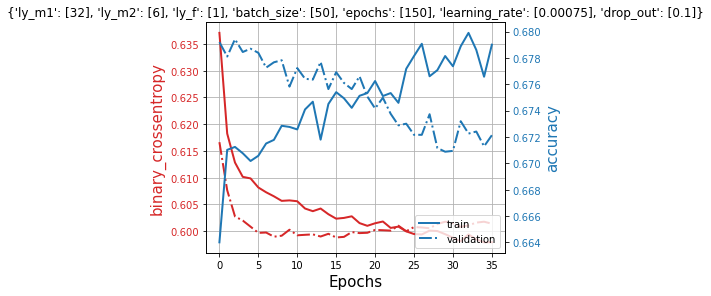

best parameters: {'ly_m1': [25], 'ly_m2': [6], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}


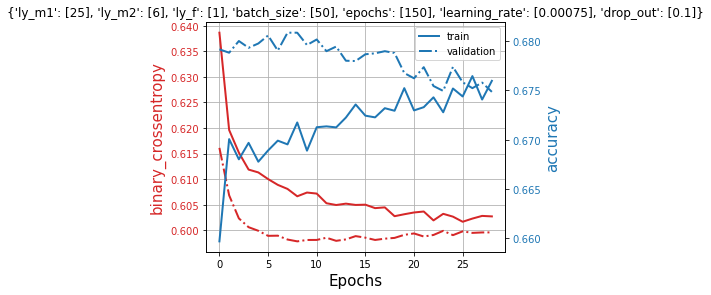

number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 32)
Pandas(Index=0, ly_m1=29, ly_m2=8, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [29], 'ly_m2': [8], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 5s 278us/step - loss: 0.6053 - accuracy: 0.6711 - val_loss: 0.6148 - val_accuracy: 0.6668
Epoch 2/150
19339/19339 [==============================] - 5s 265us/step - loss: 0.5924 - accuracy: 0.6856 - val_loss: 0.6145 - val_accuracy: 0.6620
Epoch 3/150
19339/19339 [==============================] - 5s 253us/step - loss: 0.5912 - accuracy: 0.6876 - val_loss: 0.6145 - val_accuracy: 0.6611
Epoch 4/150
19339/19339 [==============================] - 5s 242us/step - loss: 0.5902 - accuracy: 0.6871 - val_loss: 0.6164 - val_accuracy: 0.6601
Epoch 5/150
19339/19339 [==========

Epoch 2/150
58017/58017 [==============================] - 4s 71us/step - loss: 0.6064 - accuracy: 0.6729 - val_loss: 0.5906 - val_accuracy: 0.6803
Epoch 3/150
58017/58017 [==============================] - 4s 71us/step - loss: 0.6044 - accuracy: 0.6738 - val_loss: 0.5901 - val_accuracy: 0.6801
Epoch 4/150
58017/58017 [==============================] - 4s 73us/step - loss: 0.6024 - accuracy: 0.6740 - val_loss: 0.5895 - val_accuracy: 0.6796
Epoch 5/150
58017/58017 [==============================] - 7s 126us/step - loss: 0.6018 - accuracy: 0.6750 - val_loss: 0.5890 - val_accuracy: 0.6794
Epoch 6/150
58017/58017 [==============================] - 10s 179us/step - loss: 0.6010 - accuracy: 0.6758 - val_loss: 0.5897 - val_accuracy: 0.6790
Epoch 7/150
58017/58017 [==============================] - 10s 164us/step - loss: 0.6004 - accuracy: 0.6758 - val_loss: 0.5897 - val_accuracy: 0.6785
Epoch 8/150
58017/58017 [==============================] - 10s 167us/step - loss: 0.5994 - accuracy: 0.6771

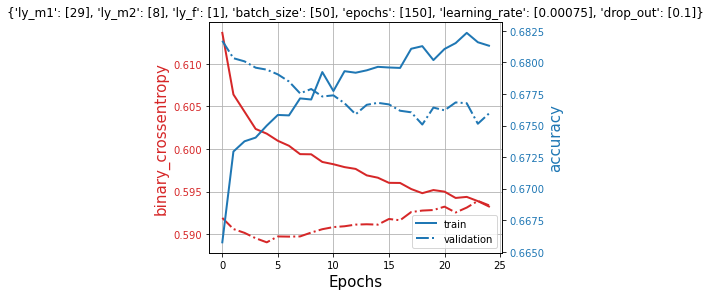

Pandas(Index=1, ly_m1=32, ly_m2=8, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [32], 'ly_m2': [8], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 3s 138us/step - loss: 0.6070 - accuracy: 0.6664 - val_loss: 0.6155 - val_accuracy: 0.6691
Epoch 2/150
19339/19339 [==============================] - 2s 103us/step - loss: 0.5917 - accuracy: 0.6831 - val_loss: 0.6129 - val_accuracy: 0.6676
Epoch 3/150
19339/19339 [==============================] - 2s 104us/step - loss: 0.5914 - accuracy: 0.6853 - val_loss: 0.6137 - val_accuracy: 0.6660
Epoch 4/150
19339/19339 [==============================] - 2s 102us/step - loss: 0.5903 - accuracy: 0.6861 - val_loss: 0.6142 - val_accuracy: 0.6646
Epoch 5/150
19339/19339 [==============================] - 2s 103us/step - loss: 0.5886 - accuracy: 0.6858 - val_loss: 0

58017/58017 [==============================] - 4s 71us/step - loss: 0.6018 - accuracy: 0.6739 - val_loss: 0.5890 - val_accuracy: 0.6810
Epoch 6/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.6006 - accuracy: 0.6757 - val_loss: 0.5896 - val_accuracy: 0.6802
Epoch 7/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.6001 - accuracy: 0.6770 - val_loss: 0.5901 - val_accuracy: 0.6795
Epoch 8/150
58017/58017 [==============================] - 5s 91us/step - loss: 0.5997 - accuracy: 0.6786 - val_loss: 0.5895 - val_accuracy: 0.6801
Epoch 9/150
58017/58017 [==============================] - 10s 169us/step - loss: 0.5991 - accuracy: 0.6775 - val_loss: 0.5907 - val_accuracy: 0.6785
Epoch 10/150
58017/58017 [==============================] - 10s 170us/step - loss: 0.5979 - accuracy: 0.6786 - val_loss: 0.5903 - val_accuracy: 0.6783
Epoch 11/150
58017/58017 [==============================] - 10s 169us/step - loss: 0.5970 - accuracy: 0.6788 - val_loss

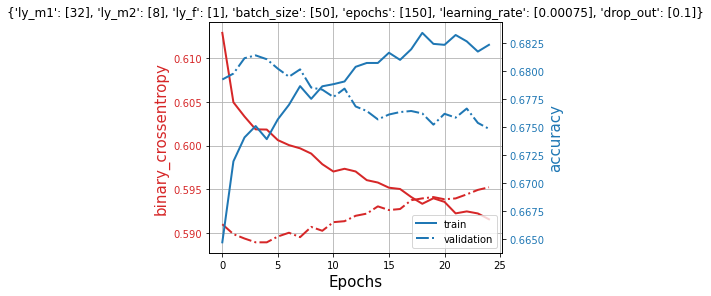

Pandas(Index=2, ly_m1=35, ly_m2=8, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [35], 'ly_m2': [8], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 120us/step - loss: 0.6011 - accuracy: 0.6758 - val_loss: 0.6040 - val_accuracy: 0.6748
Epoch 2/150
19339/19339 [==============================] - 2s 107us/step - loss: 0.5899 - accuracy: 0.6843 - val_loss: 0.6009 - val_accuracy: 0.6731
Epoch 3/150
19339/19339 [==============================] - 2s 103us/step - loss: 0.5877 - accuracy: 0.6858 - val_loss: 0.6004 - val_accuracy: 0.6718
Epoch 4/150
19339/19339 [==============================] - 2s 106us/step - loss: 0.5864 - accuracy: 0.6859 - val_loss: 0.6011 - val_accuracy: 0.6726
Epoch 5/150
19339/19339 [==============================] - 2s 110us/step - loss: 0.5862 - accuracy: 0.6904 - val_loss: 0

58017/58017 [==============================] - 4s 72us/step - loss: 0.6009 - accuracy: 0.6757 - val_loss: 0.5896 - val_accuracy: 0.6798
Epoch 6/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.5999 - accuracy: 0.6769 - val_loss: 0.5902 - val_accuracy: 0.6800
Epoch 7/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.5996 - accuracy: 0.6766 - val_loss: 0.5901 - val_accuracy: 0.6803
Epoch 8/150
58017/58017 [==============================] - 4s 71us/step - loss: 0.5992 - accuracy: 0.6771 - val_loss: 0.5897 - val_accuracy: 0.6800
Epoch 9/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.5983 - accuracy: 0.6773 - val_loss: 0.5906 - val_accuracy: 0.6795
Epoch 10/150
58017/58017 [==============================] - 4s 73us/step - loss: 0.5972 - accuracy: 0.6797 - val_loss: 0.5911 - val_accuracy: 0.6791
Epoch 11/150
58017/58017 [==============================] - 4s 68us/step - loss: 0.5972 - accuracy: 0.6790 - val_loss: 0.59

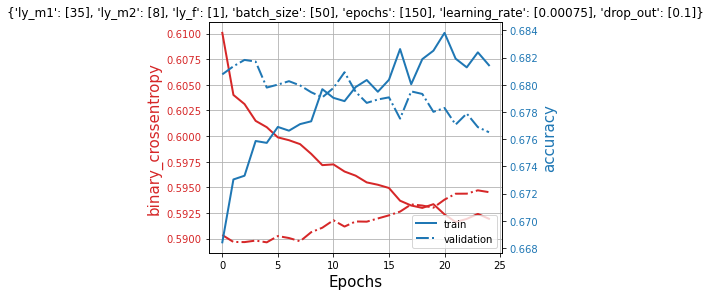

Pandas(Index=3, ly_m1=38, ly_m2=8, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [38], 'ly_m2': [8], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 5s 272us/step - loss: 0.6015 - accuracy: 0.6749 - val_loss: 0.6037 - val_accuracy: 0.6755
Epoch 2/150
19339/19339 [==============================] - 5s 236us/step - loss: 0.5901 - accuracy: 0.6840 - val_loss: 0.6014 - val_accuracy: 0.6748
Epoch 3/150
19339/19339 [==============================] - 5s 240us/step - loss: 0.5891 - accuracy: 0.6852 - val_loss: 0.6001 - val_accuracy: 0.6762
Epoch 4/150
19339/19339 [==============================] - 5s 239us/step - loss: 0.5869 - accuracy: 0.6873 - val_loss: 0.6021 - val_accuracy: 0.6749
Epoch 5/150
19339/19339 [==============================] - 5s 238us/step - loss: 0.5868 - accuracy: 0.6878 - val_loss: 0

58017/58017 [==============================] - 4s 73us/step - loss: 0.5993 - accuracy: 0.6771 - val_loss: 0.5897 - val_accuracy: 0.6812
Epoch 8/150
58017/58017 [==============================] - 4s 73us/step - loss: 0.5990 - accuracy: 0.6786 - val_loss: 0.5898 - val_accuracy: 0.6818
Epoch 9/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.5989 - accuracy: 0.6778 - val_loss: 0.5907 - val_accuracy: 0.6807
Epoch 10/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.5976 - accuracy: 0.6792 - val_loss: 0.5908 - val_accuracy: 0.6804
Epoch 11/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.5971 - accuracy: 0.6800 - val_loss: 0.5914 - val_accuracy: 0.6803
Epoch 12/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.5969 - accuracy: 0.6806 - val_loss: 0.5913 - val_accuracy: 0.6800
Epoch 13/150
58017/58017 [==============================] - 4s 73us/step - loss: 0.5963 - accuracy: 0.6817 - val_loss: 0.

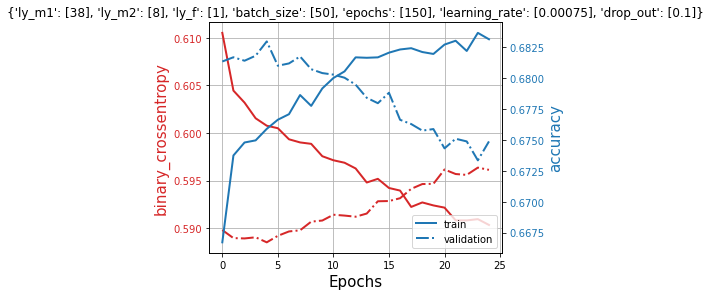

Pandas(Index=4, ly_m1=42, ly_m2=8, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [42], 'ly_m2': [8], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 120us/step - loss: 0.6027 - accuracy: 0.6725 - val_loss: 0.6130 - val_accuracy: 0.6684
Epoch 2/150
19339/19339 [==============================] - 2s 105us/step - loss: 0.5916 - accuracy: 0.6832 - val_loss: 0.6116 - val_accuracy: 0.6643
Epoch 3/150
19339/19339 [==============================] - 2s 107us/step - loss: 0.5906 - accuracy: 0.6882 - val_loss: 0.6111 - val_accuracy: 0.6634
Epoch 4/150
19339/19339 [==============================] - 2s 105us/step - loss: 0.5884 - accuracy: 0.6880 - val_loss: 0.6108 - val_accuracy: 0.6634
Epoch 5/150
19339/19339 [==============================] - 2s 106us/step - loss: 0.5887 - accuracy: 0.6880 - val_loss: 0

58017/58017 [==============================] - 10s 173us/step - loss: 0.6020 - accuracy: 0.6766 - val_loss: 0.5905 - val_accuracy: 0.6794
Epoch 6/150
58017/58017 [==============================] - 10s 171us/step - loss: 0.6016 - accuracy: 0.6759 - val_loss: 0.5916 - val_accuracy: 0.6792
Epoch 7/150
58017/58017 [==============================] - 10s 172us/step - loss: 0.6009 - accuracy: 0.6765 - val_loss: 0.5915 - val_accuracy: 0.6790
Epoch 8/150
58017/58017 [==============================] - 10s 174us/step - loss: 0.5999 - accuracy: 0.6780 - val_loss: 0.5917 - val_accuracy: 0.6778
Epoch 9/150
58017/58017 [==============================] - 10s 173us/step - loss: 0.5994 - accuracy: 0.6756 - val_loss: 0.5922 - val_accuracy: 0.6775
Epoch 10/150
58017/58017 [==============================] - 7s 115us/step - loss: 0.5987 - accuracy: 0.6775 - val_loss: 0.5924 - val_accuracy: 0.6772
Epoch 11/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.5977 - accuracy: 0.6796 - val

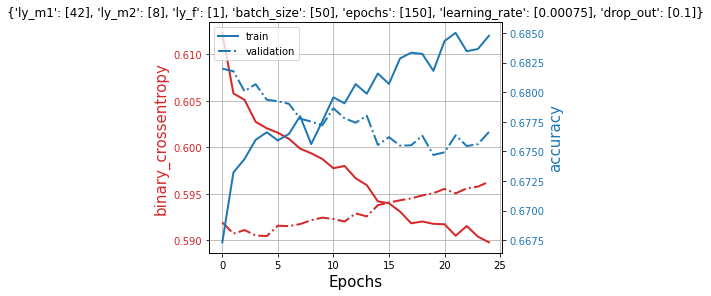

best parameters: {'ly_m1': [38], 'ly_m2': [8], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}


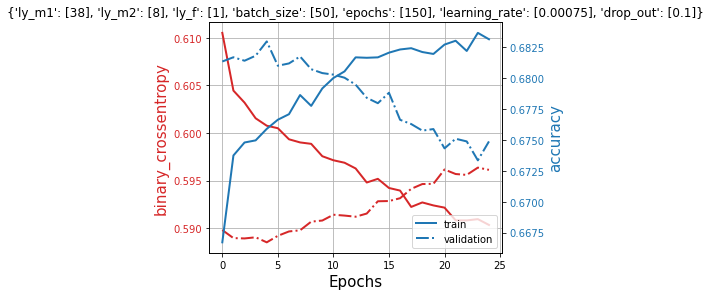

number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 40)
Pandas(Index=0, ly_m1=36, ly_m2=10, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [36], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 119us/step - loss: 0.6009 - accuracy: 0.6767 - val_loss: 0.6125 - val_accuracy: 0.6651
Epoch 2/150
19339/19339 [==============================] - 2s 107us/step - loss: 0.5899 - accuracy: 0.6873 - val_loss: 0.6101 - val_accuracy: 0.6633
Epoch 3/150
19339/19339 [==============================] - 2s 106us/step - loss: 0.5860 - accuracy: 0.6860 - val_loss: 0.6100 - val_accuracy: 0.6628
Epoch 4/150
19339/19339 [==============================] - 2s 106us/step - loss: 0.5868 - accuracy: 0.6890 - val_loss: 0.6101 - val_accuracy: 0.6632
Epoch 5/150
19339/19339 [========

Epoch 4/150
58017/58017 [==============================] - 9s 151us/step - loss: 0.6012 - accuracy: 0.6761 - val_loss: 0.5889 - val_accuracy: 0.6815
Epoch 5/150
58017/58017 [==============================] - 10s 170us/step - loss: 0.6003 - accuracy: 0.6771 - val_loss: 0.5890 - val_accuracy: 0.6814
Epoch 6/150
58017/58017 [==============================] - 10s 173us/step - loss: 0.5991 - accuracy: 0.6777 - val_loss: 0.5892 - val_accuracy: 0.6810
Epoch 7/150
58017/58017 [==============================] - 10s 173us/step - loss: 0.5988 - accuracy: 0.6788 - val_loss: 0.5897 - val_accuracy: 0.6798
Epoch 8/150
58017/58017 [==============================] - 7s 123us/step - loss: 0.5968 - accuracy: 0.6797 - val_loss: 0.5899 - val_accuracy: 0.6795
Epoch 9/150
58017/58017 [==============================] - 4s 73us/step - loss: 0.5968 - accuracy: 0.6799 - val_loss: 0.5902 - val_accuracy: 0.6792
Epoch 10/150
58017/58017 [==============================] - 4s 74us/step - loss: 0.5951 - accuracy: 0.68

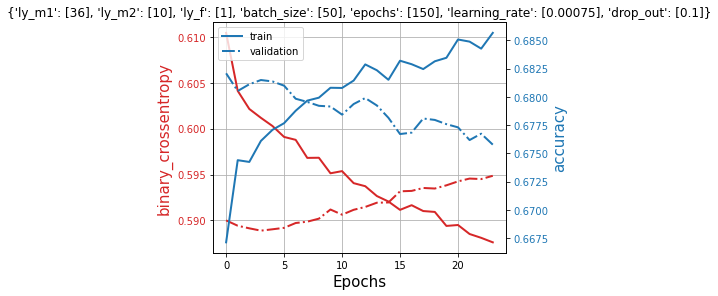

Pandas(Index=1, ly_m1=40, ly_m2=10, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [40], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 5s 277us/step - loss: 0.5986 - accuracy: 0.6808 - val_loss: 0.5985 - val_accuracy: 0.6756
Epoch 2/150
19339/19339 [==============================] - 5s 243us/step - loss: 0.5896 - accuracy: 0.6834 - val_loss: 0.5982 - val_accuracy: 0.6743
Epoch 3/150
19339/19339 [==============================] - 5s 244us/step - loss: 0.5867 - accuracy: 0.6857 - val_loss: 0.5983 - val_accuracy: 0.6746
Epoch 4/150
19339/19339 [==============================] - 3s 157us/step - loss: 0.5866 - accuracy: 0.6867 - val_loss: 0.5990 - val_accuracy: 0.6750
Epoch 5/150
19339/19339 [==============================] - 2s 105us/step - loss: 0.5844 - accuracy: 0.6909 - val_loss:

58017/58017 [==============================] - 6s 95us/step - loss: 0.5969 - accuracy: 0.6805 - val_loss: 0.5915 - val_accuracy: 0.6781
Epoch 10/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.5957 - accuracy: 0.6801 - val_loss: 0.5911 - val_accuracy: 0.6785
Epoch 11/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.5959 - accuracy: 0.6806 - val_loss: 0.5913 - val_accuracy: 0.6783
Epoch 12/150
58017/58017 [==============================] - 4s 76us/step - loss: 0.5942 - accuracy: 0.6822 - val_loss: 0.5913 - val_accuracy: 0.6770
Epoch 13/150
58017/58017 [==============================] - 9s 162us/step - loss: 0.5942 - accuracy: 0.6799 - val_loss: 0.5920 - val_accuracy: 0.6776
Epoch 14/150
58017/58017 [==============================] - 10s 174us/step - loss: 0.5936 - accuracy: 0.6821 - val_loss: 0.5927 - val_accuracy: 0.6764
Epoch 15/150
58017/58017 [==============================] - 10s 173us/step - loss: 0.5928 - accuracy: 0.6831 - val_l

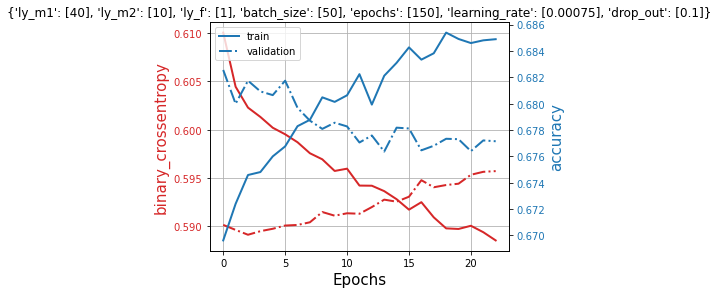

Pandas(Index=2, ly_m1=44, ly_m2=10, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [44], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 120us/step - loss: 0.6016 - accuracy: 0.6740 - val_loss: 0.6025 - val_accuracy: 0.6748
Epoch 2/150
19339/19339 [==============================] - 2s 103us/step - loss: 0.5892 - accuracy: 0.6860 - val_loss: 0.6020 - val_accuracy: 0.6740
Epoch 3/150
19339/19339 [==============================] - 2s 104us/step - loss: 0.5871 - accuracy: 0.6840 - val_loss: 0.6027 - val_accuracy: 0.6730
Epoch 4/150
19339/19339 [==============================] - 2s 108us/step - loss: 0.5870 - accuracy: 0.6869 - val_loss: 0.6017 - val_accuracy: 0.6745
Epoch 5/150
19339/19339 [==============================] - 2s 106us/step - loss: 0.5848 - accuracy: 0.6858 - val_loss:

58017/58017 [==============================] - 10s 173us/step - loss: 0.5986 - accuracy: 0.6769 - val_loss: 0.5897 - val_accuracy: 0.6814
Epoch 8/150
58017/58017 [==============================] - 10s 175us/step - loss: 0.5970 - accuracy: 0.6785 - val_loss: 0.5901 - val_accuracy: 0.6812
Epoch 9/150
58017/58017 [==============================] - 9s 149us/step - loss: 0.5965 - accuracy: 0.6787 - val_loss: 0.5905 - val_accuracy: 0.6814
Epoch 10/150
58017/58017 [==============================] - 4s 73us/step - loss: 0.5949 - accuracy: 0.6795 - val_loss: 0.5909 - val_accuracy: 0.6817
Epoch 11/150
58017/58017 [==============================] - 4s 71us/step - loss: 0.5944 - accuracy: 0.6809 - val_loss: 0.5912 - val_accuracy: 0.6800
Epoch 12/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.5925 - accuracy: 0.6812 - val_loss: 0.5921 - val_accuracy: 0.6786
Epoch 13/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.5922 - accuracy: 0.6806 - val_los

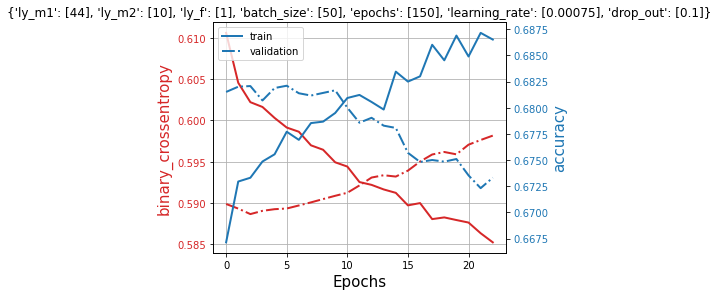

Pandas(Index=3, ly_m1=48, ly_m2=10, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [48], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 120us/step - loss: 0.5999 - accuracy: 0.6740 - val_loss: 0.6207 - val_accuracy: 0.6539
Epoch 2/150
19339/19339 [==============================] - 2s 109us/step - loss: 0.5896 - accuracy: 0.6852 - val_loss: 0.6182 - val_accuracy: 0.6548
Epoch 3/150
19339/19339 [==============================] - 2s 107us/step - loss: 0.5864 - accuracy: 0.6876 - val_loss: 0.6177 - val_accuracy: 0.6564
Epoch 4/150
19339/19339 [==============================] - 4s 227us/step - loss: 0.5866 - accuracy: 0.6889 - val_loss: 0.6175 - val_accuracy: 0.6555
Epoch 5/150
19339/19339 [==============================] - 5s 256us/step - loss: 0.5838 - accuracy: 0.6889 - val_loss:

58017/58017 [==============================] - 4s 75us/step - loss: 0.6007 - accuracy: 0.6753 - val_loss: 0.5893 - val_accuracy: 0.6812
Epoch 5/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.5993 - accuracy: 0.6772 - val_loss: 0.5898 - val_accuracy: 0.6790
Epoch 6/150
58017/58017 [==============================] - 4s 74us/step - loss: 0.5985 - accuracy: 0.6780 - val_loss: 0.5897 - val_accuracy: 0.6799
Epoch 7/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.5976 - accuracy: 0.6785 - val_loss: 0.5895 - val_accuracy: 0.6792
Epoch 8/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.5960 - accuracy: 0.6797 - val_loss: 0.5902 - val_accuracy: 0.6782
Epoch 9/150
58017/58017 [==============================] - 4s 73us/step - loss: 0.5961 - accuracy: 0.6792 - val_loss: 0.5906 - val_accuracy: 0.6779
Epoch 10/150
58017/58017 [==============================] - 4s 73us/step - loss: 0.5940 - accuracy: 0.6802 - val_loss: 0.591

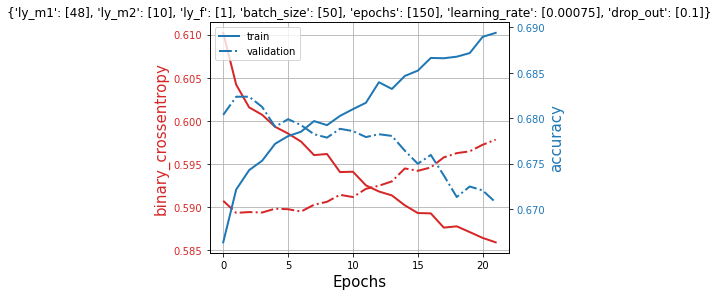

Pandas(Index=4, ly_m1=52, ly_m2=10, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [52], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 5s 282us/step - loss: 0.6000 - accuracy: 0.6771 - val_loss: 0.6029 - val_accuracy: 0.6722
Epoch 2/150
19339/19339 [==============================] - 5s 248us/step - loss: 0.5896 - accuracy: 0.6851 - val_loss: 0.6018 - val_accuracy: 0.6705
Epoch 3/150
19339/19339 [==============================] - 5s 249us/step - loss: 0.5867 - accuracy: 0.6854 - val_loss: 0.6027 - val_accuracy: 0.6696
Epoch 4/150
19339/19339 [==============================] - 4s 182us/step - loss: 0.5867 - accuracy: 0.6893 - val_loss: 0.6037 - val_accuracy: 0.6683
Epoch 5/150
19339/19339 [==============================] - 2s 112us/step - loss: 0.5841 - accuracy: 0.6894 - val_loss:

58017/58017 [==============================] - 11s 197us/step - loss: 0.5953 - accuracy: 0.6819 - val_loss: 0.5909 - val_accuracy: 0.6796
Epoch 10/150
58017/58017 [==============================] - 10s 178us/step - loss: 0.5936 - accuracy: 0.6812 - val_loss: 0.5912 - val_accuracy: 0.6790
Epoch 11/150
58017/58017 [==============================] - 7s 115us/step - loss: 0.5936 - accuracy: 0.6826 - val_loss: 0.5921 - val_accuracy: 0.6770
Epoch 12/150
58017/58017 [==============================] - 5s 78us/step - loss: 0.5918 - accuracy: 0.6834 - val_loss: 0.5926 - val_accuracy: 0.6783
Epoch 13/150
58017/58017 [==============================] - 4s 73us/step - loss: 0.5920 - accuracy: 0.6829 - val_loss: 0.5933 - val_accuracy: 0.6775
Epoch 14/150
58017/58017 [==============================] - 4s 76us/step - loss: 0.5908 - accuracy: 0.6828 - val_loss: 0.5935 - val_accuracy: 0.6777
Epoch 15/150
58017/58017 [==============================] - 4s 76us/step - loss: 0.5899 - accuracy: 0.6840 - val_l

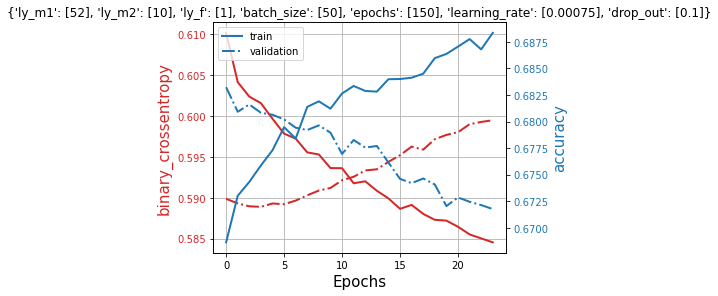

best parameters: {'ly_m1': [52], 'ly_m2': [10], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}


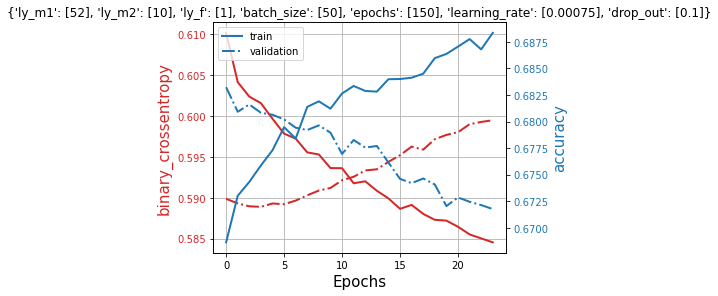

number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 50)
Pandas(Index=0, ly_m1=45, ly_m2=12, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [45], 'ly_m2': [12], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 127us/step - loss: 0.6014 - accuracy: 0.6753 - val_loss: 0.6251 - val_accuracy: 0.6545
Epoch 2/150
19339/19339 [==============================] - 2s 110us/step - loss: 0.5883 - accuracy: 0.6855 - val_loss: 0.6229 - val_accuracy: 0.6517
Epoch 3/150
19339/19339 [==============================] - 2s 106us/step - loss: 0.5860 - accuracy: 0.6879 - val_loss: 0.6212 - val_accuracy: 0.6562
Epoch 4/150
19339/19339 [==============================] - 2s 108us/step - loss: 0.5848 - accuracy: 0.6868 - val_loss: 0.6194 - val_accuracy: 0.6571
Epoch 5/150
19339/19339 [========

Epoch 2/150
58017/58017 [==============================] - 5s 79us/step - loss: 0.6032 - accuracy: 0.6741 - val_loss: 0.5893 - val_accuracy: 0.6833
Epoch 3/150
58017/58017 [==============================] - 4s 77us/step - loss: 0.6016 - accuracy: 0.6753 - val_loss: 0.5891 - val_accuracy: 0.6807
Epoch 4/150
58017/58017 [==============================] - 5s 89us/step - loss: 0.5992 - accuracy: 0.6765 - val_loss: 0.5889 - val_accuracy: 0.6804
Epoch 5/150
58017/58017 [==============================] - 6s 99us/step - loss: 0.5989 - accuracy: 0.6771 - val_loss: 0.5893 - val_accuracy: 0.6818
Epoch 6/150
58017/58017 [==============================] - 5s 88us/step - loss: 0.5972 - accuracy: 0.6787 - val_loss: 0.5893 - val_accuracy: 0.6813
Epoch 7/150
58017/58017 [==============================] - 5s 83us/step - loss: 0.5960 - accuracy: 0.6784 - val_loss: 0.5895 - val_accuracy: 0.6809
Epoch 8/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.5949 - accuracy: 0.6807 - val_

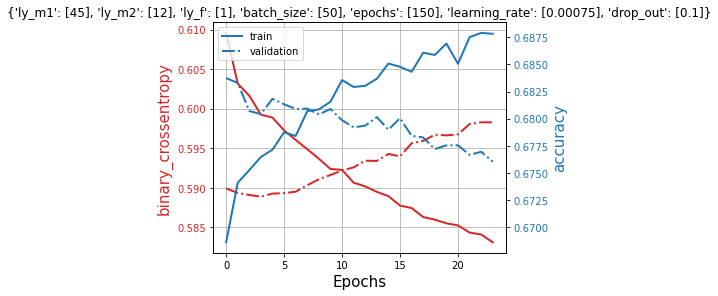

Pandas(Index=1, ly_m1=50, ly_m2=12, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [50], 'ly_m2': [12], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 125us/step - loss: 0.5997 - accuracy: 0.6773 - val_loss: 0.6093 - val_accuracy: 0.6639
Epoch 2/150
19339/19339 [==============================] - 2s 110us/step - loss: 0.5880 - accuracy: 0.6848 - val_loss: 0.6079 - val_accuracy: 0.6660
Epoch 3/150
19339/19339 [==============================] - 2s 111us/step - loss: 0.5858 - accuracy: 0.6876 - val_loss: 0.6082 - val_accuracy: 0.6653
Epoch 4/150
19339/19339 [==============================] - 2s 109us/step - loss: 0.5843 - accuracy: 0.6898 - val_loss: 0.6082 - val_accuracy: 0.6659
Epoch 5/150
19339/19339 [==============================] - 2s 114us/step - loss: 0.5813 - accuracy: 0.6904 - val_loss:

58017/58017 [==============================] - 4s 78us/step - loss: 0.5932 - accuracy: 0.6802 - val_loss: 0.5911 - val_accuracy: 0.6801
Epoch 10/150
58017/58017 [==============================] - 5s 90us/step - loss: 0.5920 - accuracy: 0.6803 - val_loss: 0.5917 - val_accuracy: 0.6796
Epoch 11/150
58017/58017 [==============================] - 11s 182us/step - loss: 0.5912 - accuracy: 0.6807 - val_loss: 0.5936 - val_accuracy: 0.6781
Epoch 12/150
58017/58017 [==============================] - 11s 181us/step - loss: 0.5904 - accuracy: 0.6818 - val_loss: 0.5931 - val_accuracy: 0.6789
Epoch 13/150
58017/58017 [==============================] - 11s 182us/step - loss: 0.5896 - accuracy: 0.6835 - val_loss: 0.5939 - val_accuracy: 0.6776
Epoch 14/150
58017/58017 [==============================] - 10s 179us/step - loss: 0.5887 - accuracy: 0.6845 - val_loss: 0.5946 - val_accuracy: 0.6767
Epoch 15/150
58017/58017 [==============================] - 10s 164us/step - loss: 0.5883 - accuracy: 0.6841 - 

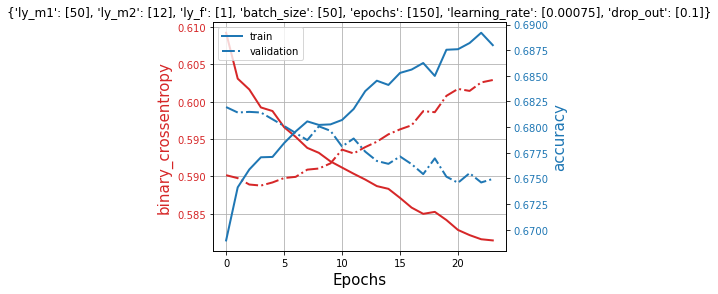

Pandas(Index=2, ly_m1=55, ly_m2=12, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [55], 'ly_m2': [12], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 129us/step - loss: 0.6000 - accuracy: 0.6759 - val_loss: 0.6222 - val_accuracy: 0.6533
Epoch 2/150
19339/19339 [==============================] - 2s 109us/step - loss: 0.5873 - accuracy: 0.6868 - val_loss: 0.6180 - val_accuracy: 0.6567
Epoch 3/150
19339/19339 [==============================] - 2s 107us/step - loss: 0.5856 - accuracy: 0.6874 - val_loss: 0.6177 - val_accuracy: 0.6564
Epoch 4/150
19339/19339 [==============================] - 2s 112us/step - loss: 0.5835 - accuracy: 0.6888 - val_loss: 0.6179 - val_accuracy: 0.6562
Epoch 5/150
19339/19339 [==============================] - 2s 112us/step - loss: 0.5822 - accuracy: 0.6891 - val_loss:

58017/58017 [==============================] - 4s 76us/step - loss: 0.5994 - accuracy: 0.6760 - val_loss: 0.5891 - val_accuracy: 0.6808
Epoch 5/150
58017/58017 [==============================] - 4s 76us/step - loss: 0.5987 - accuracy: 0.6773 - val_loss: 0.5893 - val_accuracy: 0.6805
Epoch 6/150
58017/58017 [==============================] - 4s 77us/step - loss: 0.5970 - accuracy: 0.6781 - val_loss: 0.5902 - val_accuracy: 0.6795
Epoch 7/150
58017/58017 [==============================] - 4s 75us/step - loss: 0.5958 - accuracy: 0.6794 - val_loss: 0.5900 - val_accuracy: 0.6799
Epoch 8/150
58017/58017 [==============================] - 5s 78us/step - loss: 0.5942 - accuracy: 0.6799 - val_loss: 0.5909 - val_accuracy: 0.6794
Epoch 9/150
58017/58017 [==============================] - 4s 72us/step - loss: 0.5932 - accuracy: 0.6824 - val_loss: 0.5916 - val_accuracy: 0.6792
Epoch 10/150
58017/58017 [==============================] - 10s 170us/step - loss: 0.5917 - accuracy: 0.6824 - val_loss: 0.5

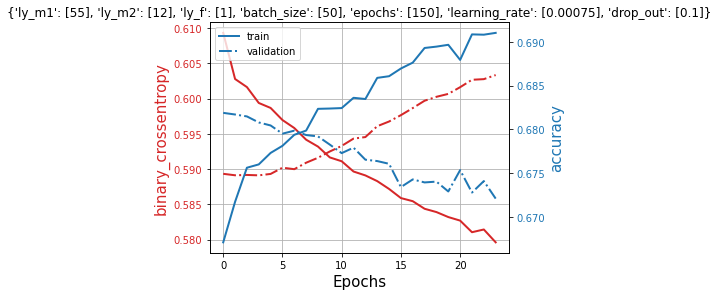

Pandas(Index=3, ly_m1=60, ly_m2=12, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [60], 'ly_m2': [12], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 3s 132us/step - loss: 0.5994 - accuracy: 0.6786 - val_loss: 0.6076 - val_accuracy: 0.6666
Epoch 2/150
19339/19339 [==============================] - 2s 115us/step - loss: 0.5871 - accuracy: 0.6847 - val_loss: 0.6051 - val_accuracy: 0.6682
Epoch 3/150
19339/19339 [==============================] - 2s 112us/step - loss: 0.5854 - accuracy: 0.6878 - val_loss: 0.6051 - val_accuracy: 0.6666
Epoch 4/150
19339/19339 [==============================] - 2s 113us/step - loss: 0.5839 - accuracy: 0.6879 - val_loss: 0.6049 - val_accuracy: 0.6669
Epoch 5/150
19339/19339 [==============================] - 2s 112us/step - loss: 0.5816 - accuracy: 0.6911 - val_loss:

58017/58017 [==============================] - 5s 82us/step - loss: 0.5962 - accuracy: 0.6809 - val_loss: 0.5903 - val_accuracy: 0.6810
Epoch 7/150
58017/58017 [==============================] - 11s 184us/step - loss: 0.5949 - accuracy: 0.6797 - val_loss: 0.5910 - val_accuracy: 0.6805
Epoch 8/150
58017/58017 [==============================] - 11s 184us/step - loss: 0.5935 - accuracy: 0.6819 - val_loss: 0.5915 - val_accuracy: 0.6803
Epoch 9/150
58017/58017 [==============================] - 11s 185us/step - loss: 0.5922 - accuracy: 0.6836 - val_loss: 0.5924 - val_accuracy: 0.6787
Epoch 10/150
58017/58017 [==============================] - 11s 185us/step - loss: 0.5911 - accuracy: 0.6824 - val_loss: 0.5932 - val_accuracy: 0.6793
Epoch 11/150
58017/58017 [==============================] - 11s 186us/step - loss: 0.5908 - accuracy: 0.6844 - val_loss: 0.5937 - val_accuracy: 0.6795
Epoch 12/150
58017/58017 [==============================] - 5s 94us/step - loss: 0.5898 - accuracy: 0.6848 - val

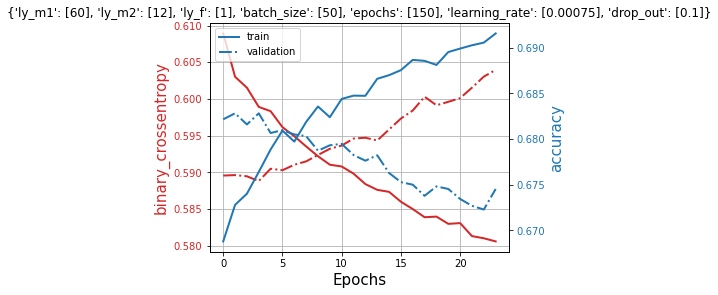

Pandas(Index=4, ly_m1=65, ly_m2=12, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [65], 'ly_m2': [12], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 2s 126us/step - loss: 0.5975 - accuracy: 0.6779 - val_loss: 0.6103 - val_accuracy: 0.6666
Epoch 2/150
19339/19339 [==============================] - 2s 113us/step - loss: 0.5879 - accuracy: 0.6860 - val_loss: 0.6083 - val_accuracy: 0.6677
Epoch 3/150
19339/19339 [==============================] - 2s 118us/step - loss: 0.5847 - accuracy: 0.6879 - val_loss: 0.6070 - val_accuracy: 0.6678
Epoch 4/150
19339/19339 [==============================] - 2s 114us/step - loss: 0.5836 - accuracy: 0.6906 - val_loss: 0.6080 - val_accuracy: 0.6668
Epoch 5/150
19339/19339 [==============================] - 2s 113us/step - loss: 0.5807 - accuracy: 0.6891 - val_loss:

58017/58017 [==============================] - 11s 188us/step - loss: 0.5919 - accuracy: 0.6825 - val_loss: 0.5921 - val_accuracy: 0.6784
Epoch 10/150
58017/58017 [==============================] - 11s 187us/step - loss: 0.5904 - accuracy: 0.6831 - val_loss: 0.5935 - val_accuracy: 0.6785
Epoch 11/150
58017/58017 [==============================] - 11s 188us/step - loss: 0.5899 - accuracy: 0.6834 - val_loss: 0.5947 - val_accuracy: 0.6769
Epoch 12/150
58017/58017 [==============================] - 11s 188us/step - loss: 0.5882 - accuracy: 0.6852 - val_loss: 0.5942 - val_accuracy: 0.6772
Epoch 13/150
58017/58017 [==============================] - 5s 94us/step - loss: 0.5879 - accuracy: 0.6844 - val_loss: 0.5955 - val_accuracy: 0.6762
Epoch 14/150
58017/58017 [==============================] - 5s 80us/step - loss: 0.5861 - accuracy: 0.6847 - val_loss: 0.5963 - val_accuracy: 0.6759
Epoch 15/150
58017/58017 [==============================] - 5s 80us/step - loss: 0.5856 - accuracy: 0.6869 - va

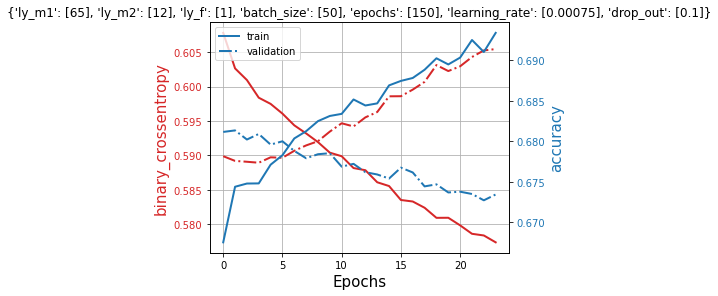

best parameters: {'ly_m1': [45], 'ly_m2': [12], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}


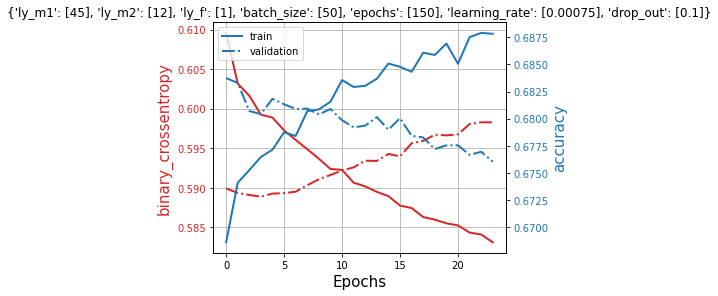

number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 60)
Pandas(Index=0, ly_m1=54, ly_m2=15, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [54], 'ly_m2': [15], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 12s 605us/step - loss: 0.6003 - accuracy: 0.6782 - val_loss: 0.6065 - val_accuracy: 0.6723
Epoch 2/150
19339/19339 [==============================] - 6s 334us/step - loss: 0.5873 - accuracy: 0.6860 - val_loss: 0.6063 - val_accuracy: 0.6703
Epoch 3/150
19339/19339 [==============================] - 4s 210us/step - loss: 0.5860 - accuracy: 0.6878 - val_loss: 0.6060 - val_accuracy: 0.6704
Epoch 4/150
19339/19339 [==============================] - 3s 146us/step - loss: 0.5851 - accuracy: 0.6887 - val_loss: 0.6076 - val_accuracy: 0.6674
Epoch 5/150
19339/19339 [=======

58017/58017 [==============================] - 17s 293us/step - loss: 0.5974 - accuracy: 0.6782 - val_loss: 0.5895 - val_accuracy: 0.6809
Epoch 7/150
58017/58017 [==============================] - 10s 181us/step - loss: 0.5966 - accuracy: 0.6795 - val_loss: 0.5900 - val_accuracy: 0.6794
Epoch 8/150
58017/58017 [==============================] - 13s 224us/step - loss: 0.5948 - accuracy: 0.6807 - val_loss: 0.5906 - val_accuracy: 0.6791
Epoch 9/150
58017/58017 [==============================] - 12s 202us/step - loss: 0.5938 - accuracy: 0.6821 - val_loss: 0.5911 - val_accuracy: 0.6804
Epoch 10/150
58017/58017 [==============================] - 12s 199us/step - loss: 0.5920 - accuracy: 0.6831 - val_loss: 0.5918 - val_accuracy: 0.6782
Epoch 11/150
58017/58017 [==============================] - 9s 148us/step - loss: 0.5906 - accuracy: 0.6844 - val_loss: 0.5928 - val_accuracy: 0.6775
Epoch 12/150
58017/58017 [==============================] - 5s 90us/step - loss: 0.5904 - accuracy: 0.6837 - va

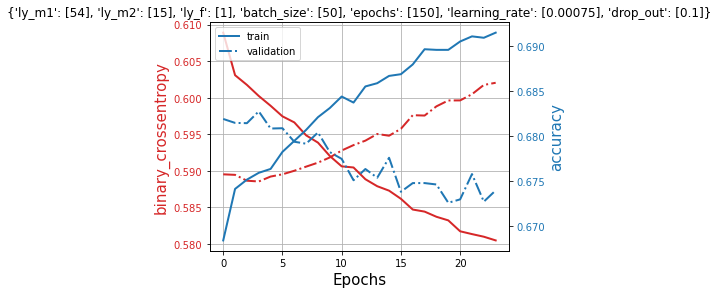

Pandas(Index=1, ly_m1=60, ly_m2=15, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [60], 'ly_m2': [15], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 11s 586us/step - loss: 0.5987 - accuracy: 0.6791 - val_loss: 0.5995 - val_accuracy: 0.6744
Epoch 2/150
19339/19339 [==============================] - 7s 357us/step - loss: 0.5875 - accuracy: 0.6855 - val_loss: 0.5992 - val_accuracy: 0.6738
Epoch 3/150
19339/19339 [==============================] - 5s 257us/step - loss: 0.5859 - accuracy: 0.6902 - val_loss: 0.5991 - val_accuracy: 0.6743
Epoch 4/150
19339/19339 [==============================] - 6s 333us/step - loss: 0.5846 - accuracy: 0.6885 - val_loss: 0.5986 - val_accuracy: 0.6744
Epoch 5/150
19339/19339 [==============================] - 6s 318us/step - loss: 0.5819 - accuracy: 0.6905 - val_loss

58017/58017 [==============================] - 16s 273us/step - loss: 0.5944 - accuracy: 0.6812 - val_loss: 0.5907 - val_accuracy: 0.6773
Epoch 8/150
58017/58017 [==============================] - 17s 290us/step - loss: 0.5931 - accuracy: 0.6815 - val_loss: 0.5911 - val_accuracy: 0.6792
Epoch 9/150
58017/58017 [==============================] - 22s 381us/step - loss: 0.5912 - accuracy: 0.6830 - val_loss: 0.5914 - val_accuracy: 0.6790
Epoch 10/150
58017/58017 [==============================] - 27s 458us/step - loss: 0.5889 - accuracy: 0.6847 - val_loss: 0.5929 - val_accuracy: 0.6793
Epoch 11/150
58017/58017 [==============================] - 26s 445us/step - loss: 0.5885 - accuracy: 0.6848 - val_loss: 0.5931 - val_accuracy: 0.6790loss: 0.5 - ETA: 1s - loss: 0.5875 - accuracy: 
Epoch 12/150
58017/58017 [==============================] - 12s 210us/step - loss: 0.5875 - accuracy: 0.6876 - val_loss: 0.5949 - val_accuracy: 0.6775
Epoch 13/150
58017/58017 [==============================] - 24

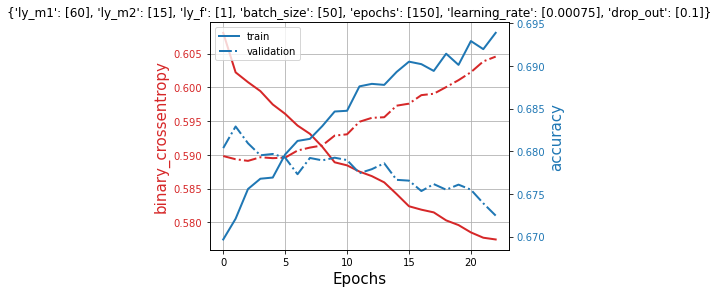

Pandas(Index=2, ly_m1=66, ly_m2=15, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [66], 'ly_m2': [15], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 13s 692us/step - loss: 0.5978 - accuracy: 0.6791 - val_loss: 0.6008 - val_accuracy: 0.6730loss: 0.5975 - accuracy: 0.67
Epoch 2/150
19339/19339 [==============================] - 12s 602us/step - loss: 0.5867 - accuracy: 0.6883 - val_loss: 0.6004 - val_accuracy: 0.6729
Epoch 3/150
19339/19339 [==============================] - 12s 628us/step - loss: 0.5850 - accuracy: 0.6877 - val_loss: 0.5993 - val_accuracy: 0.6745
Epoch 4/150
19339/19339 [==============================] - 12s 642us/step - loss: 0.5832 - accuracy: 0.6901 - val_loss: 0.6008 - val_accuracy: 0.6711
Epoch 5/150
19339/19339 [==============================] - 13s 668us/step - loss: 0.5

58017/58017 [==============================] - 27s 457us/step - loss: 0.5974 - accuracy: 0.6774 - val_loss: 0.5900 - val_accuracy: 0.6801
Epoch 6/150
58017/58017 [==============================] - 19s 336us/step - loss: 0.5960 - accuracy: 0.6788 - val_loss: 0.5906 - val_accuracy: 0.6798
Epoch 7/150
58017/58017 [==============================] - 8s 141us/step - loss: 0.5939 - accuracy: 0.6810 - val_loss: 0.5907 - val_accuracy: 0.6801
Epoch 8/150
58017/58017 [==============================] - 24s 418us/step - loss: 0.5926 - accuracy: 0.6810 - val_loss: 0.5914 - val_accuracy: 0.6782
Epoch 9/150
58017/58017 [==============================] - 27s 463us/step - loss: 0.5914 - accuracy: 0.6823 - val_loss: 0.5927 - val_accuracy: 0.6777: 0.5774 - accuracy: 0.6 - ETA: 18s - loss: 0.5754 - accura - ETA: 18s - loss: - ETA: 13s - loss: 0.58 - ETA: 12s - loss - ETA: 2s - loss: 0.5898 - accuracy:  - ETA: 0s - loss:
Epoch 10/150
58017/58017 [==============================] - 27s 461us/step - loss: 0.58

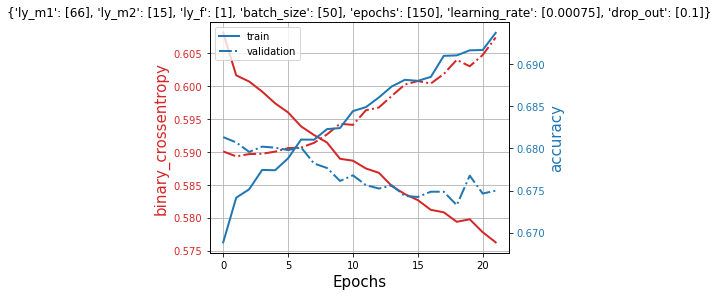

Pandas(Index=3, ly_m1=72, ly_m2=15, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [72], 'ly_m2': [15], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 13s 646us/step - loss: 0.5987 - accuracy: 0.6785 - val_loss: 0.6104 - val_accuracy: 0.6669
Epoch 2/150
19339/19339 [==============================] - 12s 611us/step - loss: 0.5873 - accuracy: 0.6858 - val_loss: 0.6105 - val_accuracy: 0.6655
Epoch 3/150
19339/19339 [==============================] - 12s 616us/step - loss: 0.5854 - accuracy: 0.6894 - val_loss: 0.6120 - val_accuracy: 0.6624
Epoch 4/150
19339/19339 [==============================] - 12s 614us/step - loss: 0.5844 - accuracy: 0.6883 - val_loss: 0.6122 - val_accuracy: 0.6618
Epoch 5/150
19339/19339 [==============================] - 12s 604us/step - loss: 0.5820 - accuracy: 0.6904 - val_

58017/58017 [==============================] - 27s 468us/step - loss: 0.5911 - accuracy: 0.6834 - val_loss: 0.5933 - val_accuracy: 0.6769
Epoch 10/150
58017/58017 [==============================] - 27s 470us/step - loss: 0.5896 - accuracy: 0.6850 - val_loss: 0.5950 - val_accuracy: 0.6774
Epoch 11/150
58017/58017 [==============================] - 25s 435us/step - loss: 0.5882 - accuracy: 0.6854 - val_loss: 0.5958 - val_accuracy: 0.67660.5872 - accuracy
Epoch 12/150
58017/58017 [==============================] - 8s 144us/step - loss: 0.5870 - accuracy: 0.6867 - val_loss: 0.5965 - val_accuracy: 0.6765
Epoch 13/150
58017/58017 [==============================] - 16s 282us/step - loss: 0.5861 - accuracy: 0.6883 - val_loss: 0.5968 - val_accuracy: 0.6770ss: 0.5861 - accuracy: 0.68
Epoch 14/150
58017/58017 [==============================] - 26s 454us/step - loss: 0.5842 - accuracy: 0.6899 - val_loss: 0.5979 - val_accuracy: 0.6763
Epoch 15/150
58017/58017 [==============================] - 28s 

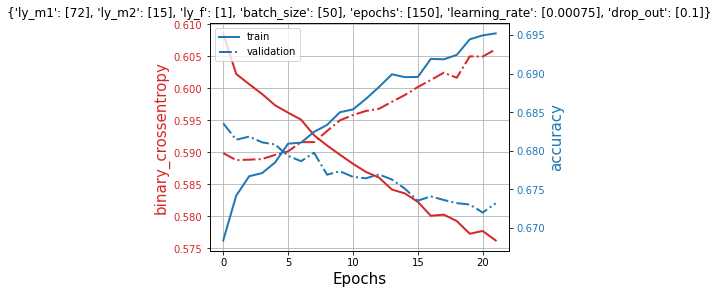

Pandas(Index=4, ly_m1=78, ly_m2=15, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [78], 'ly_m2': [15], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 4s 210us/step - loss: 0.5969 - accuracy: 0.6794 - val_loss: 0.6019 - val_accuracy: 0.6723
Epoch 2/150
19339/19339 [==============================] - 3s 177us/step - loss: 0.5866 - accuracy: 0.6859 - val_loss: 0.6002 - val_accuracy: 0.6737
Epoch 3/150
19339/19339 [==============================] - 4s 197us/step - loss: 0.5854 - accuracy: 0.6884 - val_loss: 0.5997 - val_accuracy: 0.6741
Epoch 4/150
19339/19339 [==============================] - 5s 246us/step - loss: 0.5835 - accuracy: 0.6888 - val_loss: 0.5989 - val_accuracy: 0.6740
Epoch 5/150
19339/19339 [==============================] - 12s 638us/step - loss: 0.5818 - accuracy: 0.6908 - val_loss

58017/58017 [==============================] - 26s 453us/step - loss: 0.5986 - accuracy: 0.6789 - val_loss: 0.5892 - val_accuracy: 0.6800
Epoch 5/150
58017/58017 [==============================] - 16s 273us/step - loss: 0.5964 - accuracy: 0.6799 - val_loss: 0.5900 - val_accuracy: 0.6786
Epoch 6/150
58017/58017 [==============================] - 26s 442us/step - loss: 0.5954 - accuracy: 0.6810 - val_loss: 0.5904 - val_accuracy: 0.6782
Epoch 7/150
58017/58017 [==============================] - 27s 464us/step - loss: 0.5934 - accuracy: 0.6820 - val_loss: 0.5914 - val_accuracy: 0.6774
Epoch 8/150
58017/58017 [==============================] - 27s 469us/step - loss: 0.5922 - accuracy: 0.6823 - val_loss: 0.5927 - val_accuracy: 0.6775
Epoch 9/150
58017/58017 [==============================] - 26s 449us/step - loss: 0.5900 - accuracy: 0.6855 - val_loss: 0.5926 - val_accuracy: 0.6772
Epoch 10/150
58017/58017 [==============================] - 15s 257us/step - loss: 0.5883 - accuracy: 0.6862 - v

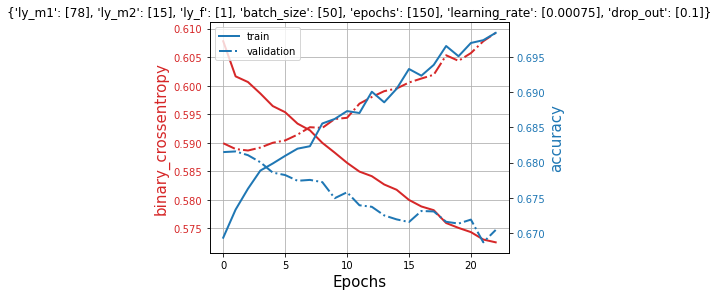

best parameters: {'ly_m1': [72], 'ly_m2': [15], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}


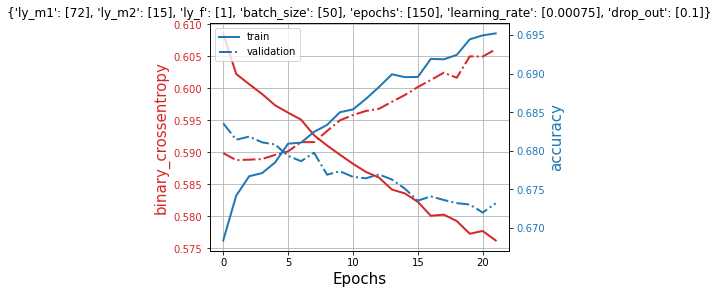

number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 70)
Pandas(Index=0, ly_m1=63, ly_m2=18, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [63], 'ly_m2': [18], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 4s 206us/step - loss: 0.5977 - accuracy: 0.6787 - val_loss: 0.6046 - val_accuracy: 0.6711
Epoch 2/150
19339/19339 [==============================] - 7s 365us/step - loss: 0.5881 - accuracy: 0.6857 - val_loss: 0.6046 - val_accuracy: 0.6684
Epoch 3/150
19339/19339 [==============================] - 11s 587us/step - loss: 0.5850 - accuracy: 0.6865 - val_loss: 0.6033 - val_accuracy: 0.6694
Epoch 4/150
19339/19339 [==============================] - 12s 607us/step - loss: 0.5827 - accuracy: 0.6887 - val_loss: 0.6051 - val_accuracy: 0.6670
Epoch 5/150
19339/19339 [======

58017/58017 [==============================] - 19s 331us/step - loss: 0.5976 - accuracy: 0.6768 - val_loss: 0.5897 - val_accuracy: 0.6795
Epoch 6/150
58017/58017 [==============================] - 22s 376us/step - loss: 0.5950 - accuracy: 0.6795 - val_loss: 0.5907 - val_accuracy: 0.6781
Epoch 7/150
58017/58017 [==============================] - 22s 379us/step - loss: 0.5940 - accuracy: 0.6807 - val_loss: 0.5911 - val_accuracy: 0.6791
Epoch 8/150
58017/58017 [==============================] - 22s 380us/step - loss: 0.5928 - accuracy: 0.6818 - val_loss: 0.5925 - val_accuracy: 0.6774
Epoch 9/150
58017/58017 [==============================] - 23s 392us/step - loss: 0.5907 - accuracy: 0.6832 - val_loss: 0.5927 - val_accuracy: 0.6777
Epoch 10/150
58017/58017 [==============================] - 23s 391us/step - loss: 0.5902 - accuracy: 0.6834 - val_loss: 0.5936 - val_accuracy: 0.6783
Epoch 11/150
58017/58017 [==============================] - 22s 375us/step - loss: 0.5878 - accuracy: 0.6861 - 

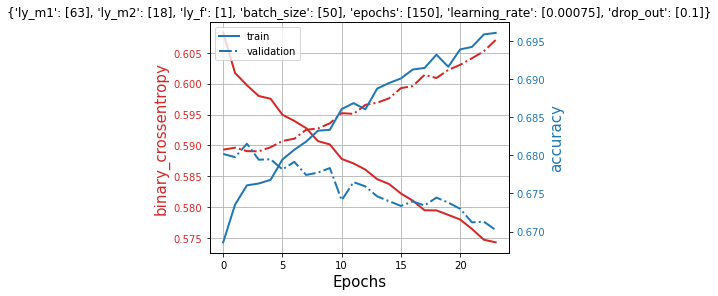

Pandas(Index=1, ly_m1=70, ly_m2=18, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [70], 'ly_m2': [18], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 11s 582us/step - loss: 0.5963 - accuracy: 0.6812 - val_loss: 0.5971 - val_accuracy: 0.6775
Epoch 2/150
19339/19339 [==============================] - 10s 520us/step - loss: 0.5874 - accuracy: 0.6864 - val_loss: 0.5951 - val_accuracy: 0.6779
Epoch 3/150
19339/19339 [==============================] - 9s 484us/step - loss: 0.5844 - accuracy: 0.6873 - val_loss: 0.5950 - val_accuracy: 0.6768
Epoch 4/150
19339/19339 [==============================] - 10s 501us/step - loss: 0.5826 - accuracy: 0.6912 - val_loss: 0.5960 - val_accuracy: 0.6759
Epoch 5/150
19339/19339 [==============================] - 10s 526us/step - loss: 0.5818 - accuracy: 0.6903 - val_l

58017/58017 [==============================] - 23s 389us/step - loss: 0.5941 - accuracy: 0.6817 - val_loss: 0.5899 - val_accuracy: 0.67970.5941 - accuracy: 0.
Epoch 8/150
58017/58017 [==============================] - 22s 386us/step - loss: 0.5918 - accuracy: 0.6815 - val_loss: 0.5908 - val_accuracy: 0.6785
Epoch 9/150
58017/58017 [==============================] - 21s 370us/step - loss: 0.5909 - accuracy: 0.6837 - val_loss: 0.5927 - val_accuracy: 0.6777
Epoch 10/150
58017/58017 [==============================] - 22s 385us/step - loss: 0.5899 - accuracy: 0.6838 - val_loss: 0.5928 - val_accuracy: 0.6770
Epoch 11/150
58017/58017 [==============================] - 23s 394us/step - loss: 0.5880 - accuracy: 0.6852 - val_loss: 0.5945 - val_accuracy: 0.6769
Epoch 12/150
58017/58017 [==============================] - 23s 397us/step - loss: 0.5872 - accuracy: 0.6864 - val_loss: 0.5948 - val_accuracy: 0.6780
Epoch 13/150
58017/58017 [==============================] - 23s 398us/step - loss: 0.585

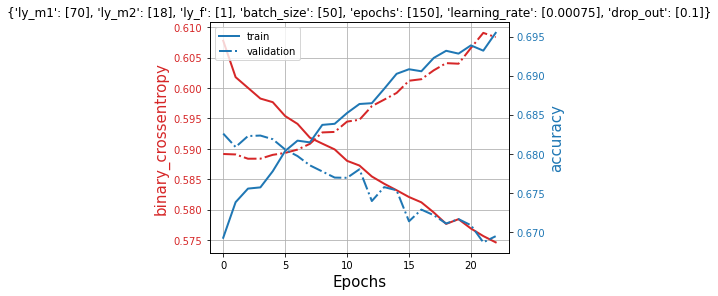

Pandas(Index=2, ly_m1=77, ly_m2=18, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [77], 'ly_m2': [18], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 5s 246us/step - loss: 0.5950 - accuracy: 0.6806 - val_loss: 0.5983 - val_accuracy: 0.6772
Epoch 2/150
19339/19339 [==============================] - 11s 579us/step - loss: 0.5871 - accuracy: 0.6864 - val_loss: 0.5973 - val_accuracy: 0.6770
Epoch 3/150
19339/19339 [==============================] - 12s 598us/step - loss: 0.5846 - accuracy: 0.6866 - val_loss: 0.5976 - val_accuracy: 0.6769
Epoch 4/150
19339/19339 [==============================] - 12s 599us/step - loss: 0.5819 - accuracy: 0.6902 - val_loss: 0.5986 - val_accuracy: 0.6766
Epoch 5/150
19339/19339 [==============================] - 11s 579us/step - loss: 0.5813 - accuracy: 0.6934 - val_l

58017/58017 [==============================] - 22s 374us/step - loss: 0.5967 - accuracy: 0.6782 - val_loss: 0.5897 - val_accuracy: 0.680553  - ETA: 1s - loss: 0.5959 - accuracy:  - ETA: 0s - los - ETA: 0s - loss: 0.5968 - accuracy: 0.67
Epoch 6/150
58017/58017 [==============================] - 13s 221us/step - loss: 0.5947 - accuracy: 0.6805 - val_loss: 0.5907 - val_accuracy: 0.6801
Epoch 7/150
58017/58017 [==============================] - 24s 415us/step - loss: 0.5936 - accuracy: 0.6809 - val_loss: 0.5914 - val_accuracy: 0.6790loss: 0.5932 - accuracy: 0. - ETA: 0s - loss: 0.5931 
Epoch 8/150
58017/58017 [==============================] - 23s 403us/step - loss: 0.5920 - accuracy: 0.6815 - val_loss: 0.5921 - val_accuracy: 0.6792
Epoch 9/150
58017/58017 [==============================] - 23s 399us/step - loss: 0.5907 - accuracy: 0.6822 - val_loss: 0.5941 - val_accuracy: 0.6777
Epoch 10/150
58017/58017 [==============================] - 24s 414us/step - loss: 0.5886 - accuracy: 0.6846 -

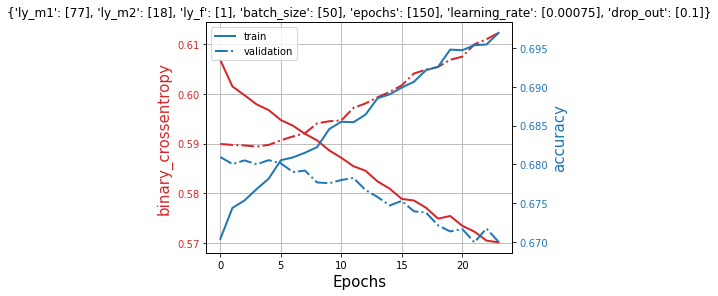

Pandas(Index=3, ly_m1=84, ly_m2=18, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [84], 'ly_m2': [18], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 6s 313us/step - loss: 0.5942 - accuracy: 0.6790 - val_loss: 0.6055 - val_accuracy: 0.6729
Epoch 2/150
19339/19339 [==============================] - 12s 602us/step - loss: 0.5876 - accuracy: 0.6855 - val_loss: 0.6045 - val_accuracy: 0.6716
Epoch 3/150
19339/19339 [==============================] - 11s 586us/step - loss: 0.5846 - accuracy: 0.6858 - val_loss: 0.6053 - val_accuracy: 0.6702ss: 0.5835 - accuracy
Epoch 4/150
19339/19339 [==============================] - 12s 595us/step - loss: 0.5823 - accuracy: 0.6897 - val_loss: 0.6048 - val_accuracy: 0.67155823 - accuracy: 0.
Epoch 5/150
19339/19339 [==============================] - 12s 615us/step -

Epoch 9/150
58017/58017 [==============================] - 23s 395us/step - loss: 0.5898 - accuracy: 0.6859 - val_loss: 0.5934 - val_accuracy: 0.6788
Epoch 10/150
58017/58017 [==============================] - 24s 417us/step - loss: 0.5877 - accuracy: 0.6857 - val_loss: 0.5941 - val_accuracy: 0.6787
Epoch 11/150
58017/58017 [==============================] - 25s 434us/step - loss: 0.5860 - accuracy: 0.6884 - val_loss: 0.5952 - val_accuracy: 0.6778
Epoch 12/150
58017/58017 [==============================] - 24s 422us/step - loss: 0.5845 - accuracy: 0.6881 - val_loss: 0.5966 - val_accuracy: 0.6769
Epoch 13/150
58017/58017 [==============================] - 25s 434us/step - loss: 0.5832 - accuracy: 0.6883 - val_loss: 0.5977 - val_accuracy: 0.6780
Epoch 14/150
58017/58017 [==============================] - 24s 422us/step - loss: 0.5803 - accuracy: 0.6916 - val_loss: 0.6003 - val_accuracy: 0.6744
Epoch 15/150
58017/58017 [==============================] - 25s 426us/step - loss: 0.5797 - acc

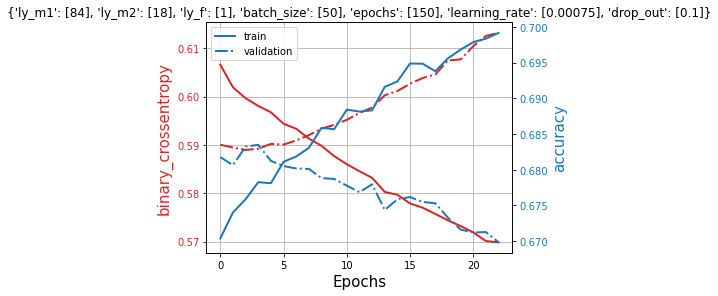

Pandas(Index=4, ly_m1=91, ly_m2=18, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [91], 'ly_m2': [18], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 12s 635us/step - loss: 0.5945 - accuracy: 0.6790 - val_loss: 0.5960 - val_accuracy: 0.6770
Epoch 2/150
19339/19339 [==============================] - 11s 587us/step - loss: 0.5864 - accuracy: 0.6869 - val_loss: 0.5957 - val_accuracy: 0.6765
Epoch 3/150
19339/19339 [==============================] - 11s 575us/step - loss: 0.5843 - accuracy: 0.6900 - val_loss: 0.5959 - val_accuracy: 0.6762
Epoch 4/150
19339/19339 [==============================] - 12s 595us/step - loss: 0.5821 - accuracy: 0.6903 - val_loss: 0.5963 - val_accuracy: 0.6748
Epoch 5/150
19339/19339 [==============================] - 8s 389us/step - loss: 0.5808 - accuracy: 0.6912 - val_l

58017/58017 [==============================] - 25s 431us/step - loss: 0.5902 - accuracy: 0.6832 - val_loss: 0.5928 - val_accuracy: 0.6795
Epoch 9/150
58017/58017 [==============================] - 23s 403us/step - loss: 0.5891 - accuracy: 0.6834 - val_loss: 0.5944 - val_accuracy: 0.6783
Epoch 10/150
58017/58017 [==============================] - 8s 140us/step - loss: 0.5875 - accuracy: 0.6846 - val_loss: 0.5956 - val_accuracy: 0.6781
Epoch 11/150
58017/58017 [==============================] - 17s 286us/step - loss: 0.5853 - accuracy: 0.6849 - val_loss: 0.5968 - val_accuracy: 0.6761
Epoch 12/150
58017/58017 [==============================] - 25s 431us/step - loss: 0.5840 - accuracy: 0.6866 - val_loss: 0.5975 - val_accuracy: 0.6775
Epoch 13/150
58017/58017 [==============================] - 26s 446us/step - loss: 0.5820 - accuracy: 0.6870 - val_loss: 0.5997 - val_accuracy: 0.6756
Epoch 14/150
58017/58017 [==============================] - 26s 453us/step - loss: 0.5803 - accuracy: 0.6896 

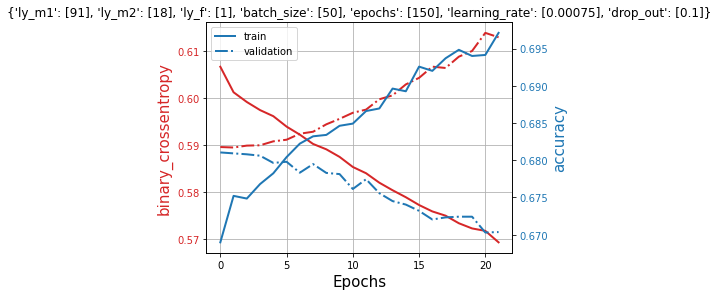

best parameters: {'ly_m1': [84], 'ly_m2': [18], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}


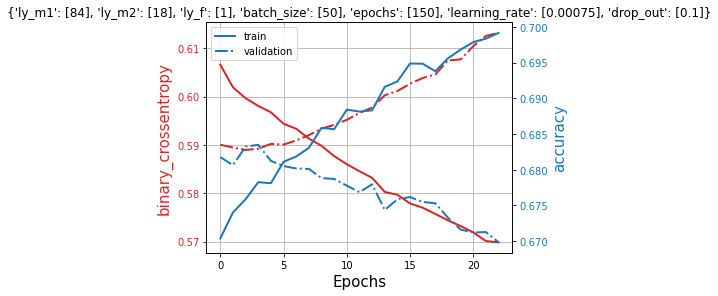

In [397]:
import json

# whether to apply PCA
flag_pca = 1

# number of principle components 

pca_components = [8,16,25,32,40,50,60,70]

acc_vs_components_nn = pd.DataFrame()
cases_nn_total = pd.DataFrame()

# time series split
n_splits = 2
tscv = TimeSeriesSplit(n_splits=n_splits)


# train catboost model

idx = 0

for n_pca_components in pca_components:
    
    
    ly_m1 = [0.9, 1.0, 1.1, 1.2, 1.3]  
    # convert to int64 
    ly_m1 = np.round(np.array(ly_m1)*n_pca_components).astype(np.int64).tolist() 
    
    ly_m2 = [0.25]
    ly_m2 = np.round(np.array(ly_m2)*n_pca_components).astype(np.int64).tolist() 
    
    ly_f = [1]
    batch_size = [50]
    epochs = [150]
    learning_rate = [0.00075]
    drop_out = [0.1]
    
    param_grid = dict(ly_m1=ly_m1,ly_m2=ly_m2,ly_f=ly_f,batch_size=batch_size, epochs=epochs,
                      learning_rate=learning_rate,drop_out=drop_out)



    # train test split
    X_train,X_val,X_test,y_train,y_val,y_test\
    = train_test_split (data = matrix_n, flag_pca = flag_pca, n_components = n_pca_components, 
                          year_start = year_start, year_train = year_train,year_val = year_val,year_end = year_end,
                       col_catfeature = col_catfeature, col_numfeature = col_numfeature, col_target = col_target,
                        one_hot_catfeature = True)

    train_data_2 = [X_train, y_train]
    val_data_2 = [X_val, y_val]
    test_data_2 = [X_test, y_test]

    # for catboost hyper-parameters, see https://catboost.ai/docs/concepts/python-reference_parameters-list.html
    
    cases_nn, best_para_nn, nn_grid_pca = train_nn(build_fn=build_nn,grid_para=param_grid ,cv=tscv,verbose=True,
                                           train_data=train_data_2,val_data=val_data_2,test_data=None,
                                      loss_function = loss_function,eval_metric = eval_metric,plot_progress = True,retrain_best = True)

# #     use the model to refit the whole data set     
    
#     X_n = np.concatenate((X_train,X_val,X_test),axis=0)
#     X_n  = np.nan_to_num(X_n)
    
# #   print(X_n.shape)

#     # predict the whole dataset and return the result
#     matrix_n['y_pred_nn_pca'] = nn_grid_pca.predict(X_n)
    
    # get the accuracy on test set
    y_test_pred = nn_grid_pca.predict(X_test)
    y_test_pred = 1*(y_test_pred>0.5)
    acc_nn = accuracy_score(y_test, y_test_pred)
    
     
    acc_vs_components_nn.loc[idx,'n_pca_component'] = n_pca_components
    acc_vs_components_nn.loc[idx,'acc_test'] = acc_nn
    acc_vs_components_nn.loc[idx,'acc_val'] = cases_nn.metric_nn_val.max() 
    acc_vs_components_nn.loc[idx,'acc_train'] = cases_nn.metric_nn_train[cases_nn.metric_nn_val.argmax()]
    acc_vs_components_nn.loc[idx,'best_para_nn'] = json.dumps(best_para_nn)
    
    cases_nn['n_pca'] = n_pca_components
    cases_nn_total = pd.concat([cases_nn_total,cases_nn],axis=0,ignore_index=True)
    
     
    idx+= 1

In [398]:
acc_vs_components_nn

,n_pca_component,acc_test,acc_val,acc_train,best_para_nn
0,8.0,0.682896,0.678516,0.659565,"{""ly_m1"": [10], ""ly_m2"": [2], ""ly_f"": [1], ""ba..."
1,16.0,0.679019,0.678578,0.669321,"{""ly_m1"": [19], ""ly_m2"": [4], ""ly_f"": [1], ""ba..."
2,25.0,0.682022,0.680860,0.676457,"{""ly_m1"": [25], ""ly_m2"": [6], ""ly_f"": [1], ""ba..."
3,32.0,0.675333,0.682986,0.683679,"{""ly_m1"": [38], ""ly_m2"": [8], ""ly_f"": [1], ""ba..."
4,40.0,0.672254,0.683236,0.688350,"{""ly_m1"": [52], ""ly_m2"": [10], ""ly_f"": [1], ""b..."
5,50.0,0.677309,0.683737,0.687902,"{""ly_m1"": [45], ""ly_m2"": [12], ""ly_f"": [1], ""b..."
6,60.0,0.672140,0.683580,0.695244,"{""ly_m1"": [72], ""ly_m2"": [15], ""ly_f"": [1], ""b..."
7,70.0,0.669783,0.683487,0.699174,"{""ly_m1"": [84], ""ly_m2"": [18], ""ly_f"": [1], ""b..."


In [399]:
cases_nn_total

,ly_m1,ly_m2,ly_f,batch_size,epochs,learning_rate,drop_out,metric_nn_train,metric_nn_val,n_pca
0,7,2,1,50,150,0.00075,0.1,0.658876,0.675295,8
1,8,2,1,50,150,0.00075,0.1,0.660306,0.677953,8
2,9,2,1,50,150,0.00075,0.1,0.658238,0.675608,8
3,10,2,1,50,150,0.00075,0.1,0.659565,0.678516,8
4,10,2,1,50,150,0.00075,0.1,0.659565,0.678516,8
5,14,4,1,50,150,0.00075,0.1,0.667856,0.676140,16
6,16,4,1,50,150,0.00075,0.1,0.670855,0.678172,16
7,18,4,1,50,150,0.00075,0.1,0.670304,0.677609,16
8,19,4,1,50,150,0.00075,0.1,0.669321,0.678578,16
9,21,4,1,50,150,0.00075,0.1,0.670855,0.677953,16


number of feature before PCA: (135825, 78)
number of feature after PCA: (135825, 25)
Pandas(Index=0, ly_m1=25, ly_m2=6, ly_f=1, batch_size=50, epochs=150, learning_rate=0.00075, drop_out=0.1)
{'ly_m1': [25], 'ly_m2': [6], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}
Train on 19339 samples, validate on 31986 samples
Epoch 1/150
19339/19339 [==============================] - 8s 391us/step - loss: 0.6445 - accuracy: 0.6542 - val_loss: 0.6474 - val_accuracy: 0.6627
Epoch 2/150
19339/19339 [==============================] - 3s 137us/step - loss: 0.6253 - accuracy: 0.6814 - val_loss: 0.6379 - val_accuracy: 0.6604
Epoch 3/150
19339/19339 [==============================] - 2s 126us/step - loss: 0.6159 - accuracy: 0.6806 - val_loss: 0.6327 - val_accuracy: 0.6588
Epoch 4/150
19339/19339 [==============================] - 2s 119us/step - loss: 0.6106 - accuracy: 0.6816 - val_loss: 0.6280 - val_accuracy: 0.6590
Epoch 5/150
19339/19339 [==========

Epoch 16/150
38678/38678 [==============================] - 4s 105us/step - loss: 0.5986 - accuracy: 0.6792 - val_loss: 0.6020 - val_accuracy: 0.6755
Epoch 17/150
38678/38678 [==============================] - 4s 103us/step - loss: 0.5971 - accuracy: 0.6789 - val_loss: 0.6029 - val_accuracy: 0.6743
Epoch 18/150
38678/38678 [==============================] - 4s 91us/step - loss: 0.5976 - accuracy: 0.6766 - val_loss: 0.6037 - val_accuracy: 0.6737
Epoch 19/150
38678/38678 [==============================] - 3s 89us/step - loss: 0.5964 - accuracy: 0.6783 - val_loss: 0.6028 - val_accuracy: 0.6749
Epoch 20/150
38678/38678 [==============================] - 3s 89us/step - loss: 0.5960 - accuracy: 0.6804 - val_loss: 0.6026 - val_accuracy: 0.6741
Epoch 21/150
38678/38678 [==============================] - 3s 90us/step - loss: 0.5959 - accuracy: 0.6806 - val_loss: 0.6020 - val_accuracy: 0.6748
Epoch 22/150
38678/38678 [==============================] - 3s 90us/step - loss: 0.5967 - accuracy: 0.68

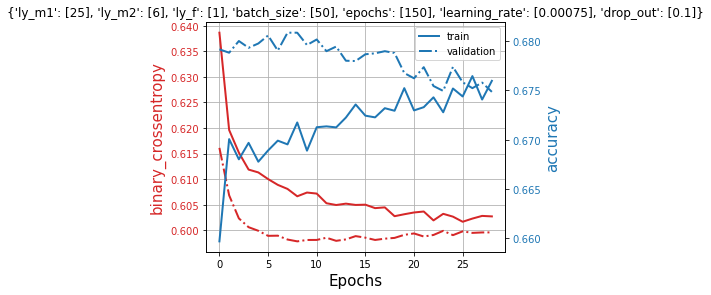

best parameters: {'ly_m1': [25], 'ly_m2': [6], 'ly_f': [1], 'batch_size': [50], 'epochs': [150], 'learning_rate': [0.00075], 'drop_out': [0.1]}


In [413]:

n_pca_components = 25

ly_m1 = [1.0]  
    # convert to int64 
ly_m1 = np.round(np.array(ly_m1)*n_pca_components).astype(np.int64).tolist() 

ly_m2 = [0.25]
ly_m2 = np.round(np.array(ly_m2)*n_pca_components).astype(np.int64).tolist() 

ly_f = [1]
batch_size = [50]
epochs = [150]
learning_rate = [0.00075]
drop_out = [0.1]

param_grid = dict(ly_m1=ly_m1,ly_m2=ly_m2,ly_f=ly_f,batch_size=batch_size, epochs=epochs,
                  learning_rate=learning_rate,drop_out=drop_out)



# train test split
X_train_2,X_val_2,X_test_2,y_train_2,y_val_2,y_test_2,X_n2\
= train_test_split (data = matrix_n, flag_pca = flag_pca, n_components = n_pca_components, 
                      year_start = year_start, year_train = year_train,year_val = year_val,year_end = year_end,
                   col_catfeature = col_catfeature, col_numfeature = col_numfeature, col_target = col_target,
                    one_hot_catfeature = True)

train_data_2 = [X_train_2, y_train_2]
val_data_2 = [X_val_2, y_val_2]
test_data_2 = [X_test_2, y_test_2]

# for catboost hyper-parameters, see https://catboost.ai/docs/concepts/python-reference_parameters-list.html

cases_nn, best_para_nn, nn_grid_pca = train_nn(build_fn=build_nn,grid_para=param_grid ,cv=tscv,verbose=True,
                                       train_data=train_data_2,val_data=val_data_2,test_data=None,
                                  loss_function = loss_function,eval_metric = eval_metric,plot_progress = True,retrain_best = False)

matrix_n['y_pred_nn_pca'] = nn_grid_pca.predict(X_n2)

In [410]:
acc_nn_year = []
acc_elo_year = []
acc_elo1_year = []
acc_elo2_year = []
acc_elo3_year = []
acc_elo4_year = []

acc_win4m_year = []
acc_win6m_year = []
acc_win8m_year = []

acc_rank_year = []

for i in matrix_n.year.unique():
    
    y_pred_nn = 1*(matrix_n[matrix_n.year==i]['y_pred_nn_pca']>0.5)
    
    y_pred_elo = 1*(matrix_n[matrix_n.year==i]['p1_win_pred']>0.5)
    y_pred_elo1 = 1*(matrix_n[matrix_n.year==i]['p1_win_pred1']>0.5)
    y_pred_elo2 = 1*(matrix_n[matrix_n.year==i]['p1_win_pred2']>0.5)
    y_pred_elo3 = 1*(matrix_n[matrix_n.year==i]['p1_win_pred3']>0.5)
    y_pred_elo4 = 1*(matrix_n[matrix_n.year==i]['p1_win_pred4']>0.5)
    
    y_pred_win4m = 1*(matrix_n[matrix_n.year==i]['win_1-2_4m']>0)
    y_pred_win6m = 1*(matrix_n[matrix_n.year==i]['win_1-2_6m']>0)
    y_pred_win8m = 1*(matrix_n[matrix_n.year==i]['win_1-2_8m']>0)
    
    y_pred_rank = 1*(matrix_n[matrix_n.year==i]['rank_1-2']<0)
    y_true = matrix_n[matrix_n.year==i]['p1_win']
    
    acc_nn = accuracy_score(y_true, y_pred_nn)*100
    acc_nn_year.append(acc_nn)
    
    acc_elo = accuracy_score(y_true, y_pred_elo)*100
    acc_elo_year.append(acc_elo)
    
    acc_elo1 = accuracy_score(y_true, y_pred_elo1)*100
    acc_elo1_year.append(acc_elo1)
    
    acc_elo2 = accuracy_score(y_true, y_pred_elo2)*100
    acc_elo2_year.append(acc_elo2)
    
    acc_elo3 = accuracy_score(y_true, y_pred_elo3)*100
    acc_elo3_year.append(acc_elo3)
    
    acc_elo4 = accuracy_score(y_true, y_pred_elo4)*100
    acc_elo4_year.append(acc_elo4)
    
    acc_win4m = accuracy_score(y_true, y_pred_win4m)*100
    acc_win4m_year.append(acc_win4m)
    
    acc_win6m = accuracy_score(y_true, y_pred_win6m)*100
    acc_win6m_year.append(acc_win6m)
    
    acc_win8m = accuracy_score(y_true, y_pred_win8m)*100
    acc_win8m_year.append(acc_win8m)
    
    acc_rank = accuracy_score(y_true, y_pred_rank)*100
    acc_rank_year.append(acc_rank)
    


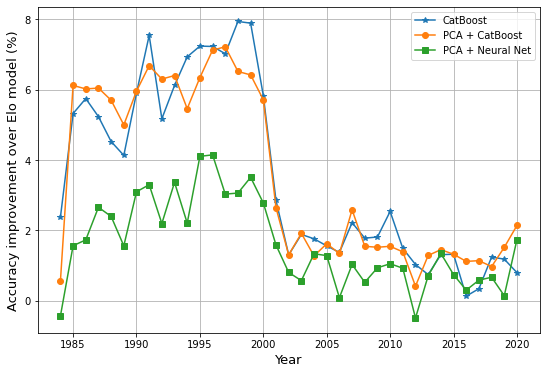

In [429]:
plt.figure(figsize=(9,6))
n=5
plt.plot(matrix_n.year.unique()[n:],np.array(acc_cat_year[n:])-np.array(acc_elo_year[n:]),'-*')
plt.plot(matrix_n.year.unique()[n:],np.array(acc_cat_pca_year[n:])-np.array(acc_elo_year[n:]),'-o')
plt.plot(matrix_n.year.unique()[n:],np.array(acc_nn_year[n:])-np.array(acc_elo_year[n:]),'-s')
#plt.plot(matrix_n.year.unique()[n:],np.array(acc_elo_year[n:])-np.array(acc_elo_year[n:]),'--')
#plt.plot(matrix_n.year.unique()[n:],acc_win8m_year[n:],'-.')

#plt.plot(matrix_n.year.unique()[n:],acc_rank_year[n:],'-')
plt.xlabel('Year',fontsize = 13)
plt.ylabel('Accuracy improvement over Elo model (%)',fontsize = 13)
plt.legend(['CatBoost','PCA + CatBoost','PCA + Neural Net'])
plt.grid()

In [414]:

# calculate the accuracy on train set
y_train_pred = nn_grid_pca.predict(X_train_2)
y_train_pred = 1*(y_train_pred>0.5)
acc_nn = accuracy_score(y_train_2, y_train_pred)
print('In the train set:')
print('The accuracy of winner prediction using N.N. is: {}%.\n'.format(round(acc_nn*100,3))) 

# calculate the accuracy on validation set
y_val_pred = nn_grid_pca.predict(X_val_2)
y_val_pred = 1*(y_val_pred>0.5)
acc_nn = accuracy_score(y_val_2, y_val_pred)
print('In the validation set:')
print('The accuracy of winner prediction using N.N is: {}%.\n'.format(round(acc_nn*100,3))) 


# calculate the accuracy on test set
y_test_pred = nn_grid_pca.predict(X_test_2)
y_test_pred = 1*(y_test_pred>0.5)
acc_nn = accuracy_score(y_test_2, y_test_pred)
print('In the test set:')
print('The accuracy of winner prediction using N.N is: {}%.\n'.format(round(acc_nn*100,3))) 

In the train set:
The accuracy of winner prediction using N.N. is: 68.506%.

In the validation set:
The accuracy of winner prediction using N.N is: 67.486%.

In the test set:
The accuracy of winner prediction using N.N is: 68.202%.



* Visualize the network

In [176]:
!pip install ann_visualizer

  Created wheel for ann-visualizer: filename=ann_visualizer-2.5-py3-none-any.whl size=4173 sha256=57143876500dbce132f3b55f93a9defc31e604072ffd3946251d701660d2e4a3
  Stored in directory: c:\users\administrator\appdata\local\pip\cache\wheels\1b\fc\58\2ab1c3b30350105929308becddda4fb59b1358e54f985e1f4a
Successfully built ann-visualizer


In [179]:
!pip install graphviz

In [181]:
from ann_visualizer.visualize import ann_viz
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/' 

In [218]:
model_best = nn_grid.best_estimator_.model
ann_architect = ann_viz(model_best,view=True, title="Neural network visualization",filename="network.pdf")


In [219]:
from IPython.display import IFrame
IFrame("./nn_image/network.pdf", width=1000, height=500)

In [ ]:
ann_viz.

 <a id='Insight'></a>
 ##  7. [Insight and Discussion](#Contents)